In [4]:
library("data.table")
library(pheatmap)
library(ggpubr)
library(ggfortify)
library(reshape)
library(dplyr)

Loading required package: ggplot2


Attaching package: ‘reshape’


The following object is masked from ‘package:data.table’:

    melt



Attaching package: ‘dplyr’


The following object is masked from ‘package:reshape’:

    rename


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [2]:
sp_analysis <- function(file_prefix) {
    
    #wrs
    current_cancer_paths <- fread(paste(file_prefix, "_cancer_paths.txt", sep=""), header=F)
    node1 <- gsub("-.*", " ", current_cancer_paths$V1)
    node2 <- gsub("^.*-", " ", current_cancer_paths$V1)
    
    #matched controls
    matched_control_cancer_paths <- fread(paste("regen_100", "_matched_controls_paths.txt", sep=""), header=F)
    node3 <- gsub("-.*", " ", matched_control_cancer_paths$V1)
    node4 <- gsub("^.*-", " ", matched_control_cancer_paths$V1)
    print(nrow(matched_control_cancer_paths))
    
    #make sure sp and paths string are the same
    if(length(node1) != nrow(current_cancer_paths) | length(node2) != nrow(current_cancer_paths)) {
        print("Path Naming Error")
        return
    }
    
    current_paths <- data.frame("wrsGene" = node1,
                              "cosmicGene" = node2,
                              "sp" = current_cancer_paths$V2)
    matched_paths <- data.frame("wrsGene" = node3,
                              "cosmicGene" = node4,
                              "sp" = matched_control_cancer_paths$V2)
    cosmic_genes <- unique(node2)
    cosmic_genes_matched <- unique(node4)
    wrs_genes <- unique(node1)
    matched_genes <- unique(node3)
    
    get_fisher_analysis(1,current_paths$sp,matched_paths$sp)
    get_fisher_analysis(2,current_paths$sp,matched_paths$sp)
    get_fisher_analysis(3,current_paths$sp,matched_paths$sp)
    
    analysis_matrix <- matrix(0,length(wrs_genes),length(cosmic_genes))
    rownames(analysis_matrix) <- wrs_genes
    colnames(analysis_matrix) <- cosmic_genes
    
    for(i in 1:nrow(current_paths)) {
        analysis_matrix[current_paths$wrsGene[i], current_paths$cosmicGene[i]] <- current_paths$sp[i]
    }
    print(analysis_matrix[1:10,1:10])
    
    pheat <- pheatmap(analysis_matrix, show_colnames = F)
    sp_hist <- barplot(height = table(factor(c(analysis_matrix), levels=min(c(analysis_matrix)):max(c(analysis_matrix))))/length(c(analysis_matrix)),
                        ylab = "Fraction",
                        xlab = "shortest path lengths",
                        main = paste("Histogram of" , "Shortest Paths"))

    min_vals <- apply(analysis_matrix,1, min)
    min_hist <- barplot(height = table(factor(min_vals, levels=min(min_vals):max(min_vals)))/length(min_vals),
                        ylab = "Fraction",
                        xlab = "Minimum shortest path length",
                        main = paste("Histogram of" , "Minuimum Shortest Path"))
    
    print(length(apply(analysis_matrix,1, function(x){length(x[x<1])/length(x)})))
    print(length(apply(analysis_matrix,1, function(x){length(x[x<2])/length(x)})))
    
    fraction_enriched_hist <- hist(apply(analysis_matrix,1, function(x){length(x[x<1])/length(x)}),
                                      main = paste("Histogram of" , "Fraction Shortest Path < 1"),
                                     xlab = "Fraction shortest path lengths < 1")
    
    fraction_direct_hist <- hist(apply(analysis_matrix,1, function(x){length(x[x<2])/length(x)}),
                                      main = paste("Histogram of" , "Fraction Shortest Path < 2"),
                                     xlab = "Fraction shortest path lengths < 2")
    
    return(list("heatplot" = pheat,
                "distribution" = sp_hist,
                "min_distribution" = min_hist,
                "fraction_enriched" = fraction_enriched_hist,
                "fraction_direct" = fraction_direct_hist))
}

get_fisher_analysis<- function(degree, setA, setB) {
    contingency <- rbind(c(length(setA[setA < degree]),length(setA[setA >= degree])),
                         c(length(setB[setB < degree]),length(setB[setB >= degree])))
    print(contingency)
    print(paste("Pvalue: ", fisher.test(contingency)$p.value, sep=""))
    print(paste("Odds: ", fisher.test(contingency)$estimate, sep=""))
    print("")
}

Warning message in fread(paste("regen_100", "_matched_controls_paths.txt", sep = ""), :
“Stopped early on line 74669. Expected 2 fields but found 3. Consider fill=TRUE and comment.char=. First discarded non-empty line: <<TUBD1-ZNRF3         3C6ORF108-A1CF       3>>”


[1] 74668
     [,1]  [,2]
[1,]    6 65178
[2,]    8 74660
[1] "Pvalue: 1"
[1] "Odds: 0.859110261488697"
[1] ""
     [,1]  [,2]
[1,]  569 64615
[2,]  366 74302
[1] "Pvalue: 2.307573013355e-18"
[1] "Odds: 1.78768749030714"
[1] ""
      [,1]  [,2]
[1,] 17794 47390
[2,] 20628 54040
[1] "Pvalue: 0.171007865776654"
[1] "Odds: 0.983657765501335"
[1] ""
         A1CF  ABI1  ABL1  ABL2  ACKR3  ACSL3  ACSL6  ACVR1  ACVR2A  AFF1
SLC2A4      4     3     2     3      3      3      3      2       3     3
DNMT1       3     3     2     2      3      3      3      2       3     2
COL5A1      4     3     2     3      3      3      3      3       3     3
STAT5A      3     2     2     2      2      2      2      2       3     2
ATG4D       4     3     3     3      3      4      4      3       4     3
CTNNB1      3     2     1     2      3      2      2      2       2     2
HCRTR2      4     4     3     4      4      4      4      4       4     3
RHOF        4     3     2     3      3      3      3      2 

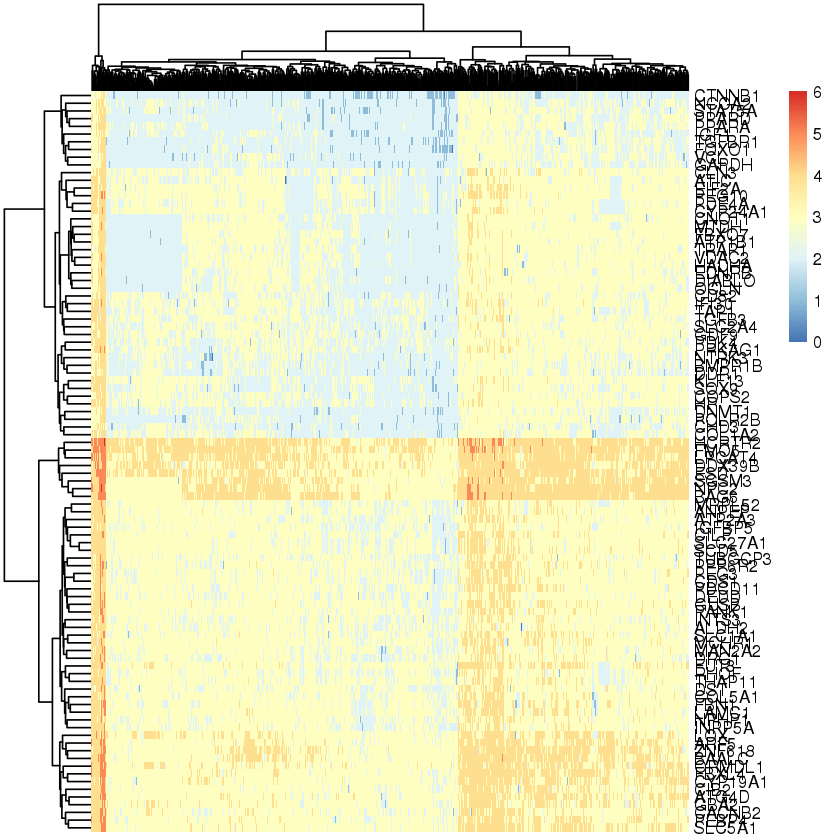

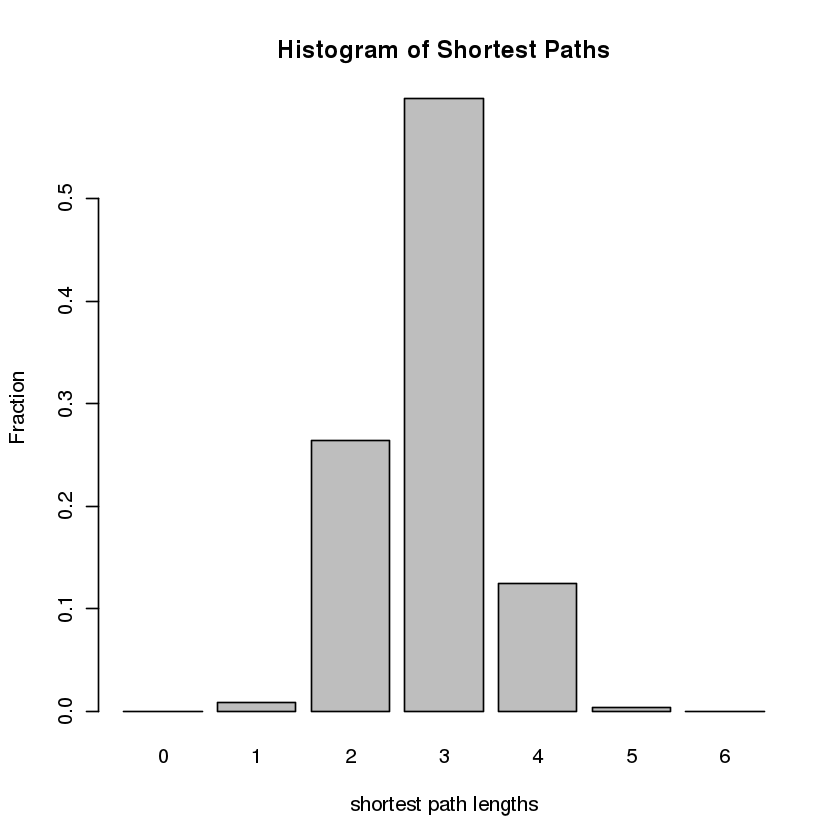

[1] 96
[1] 96


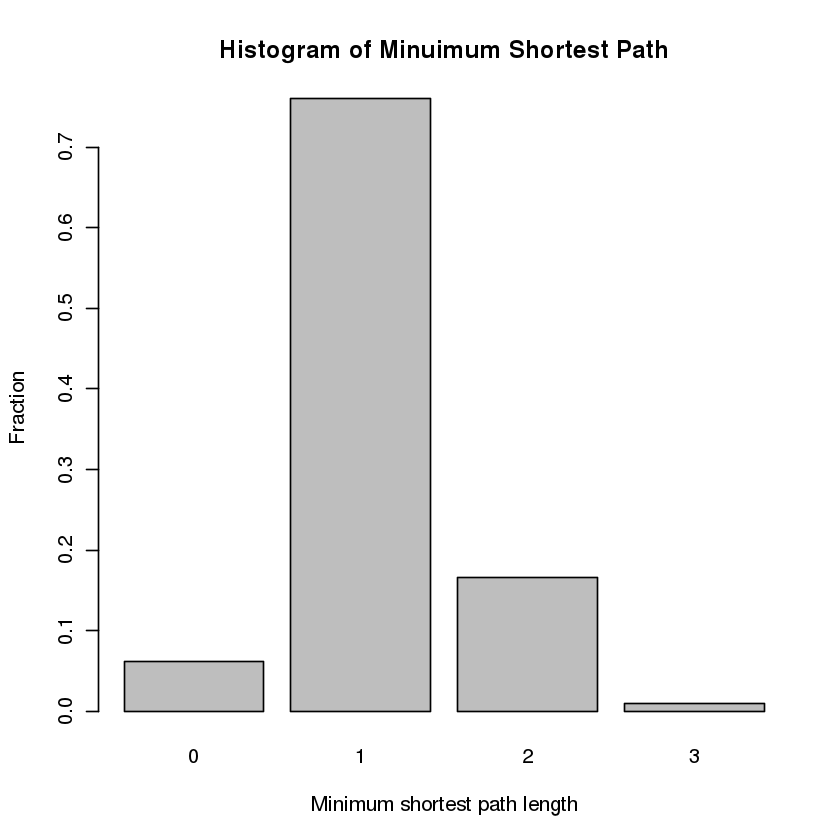

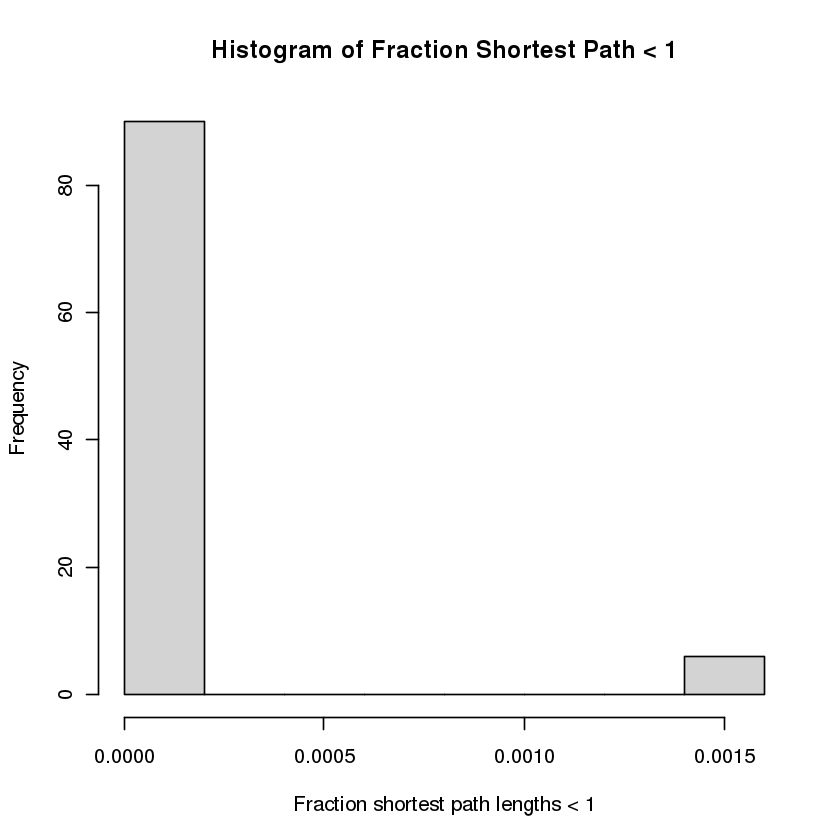

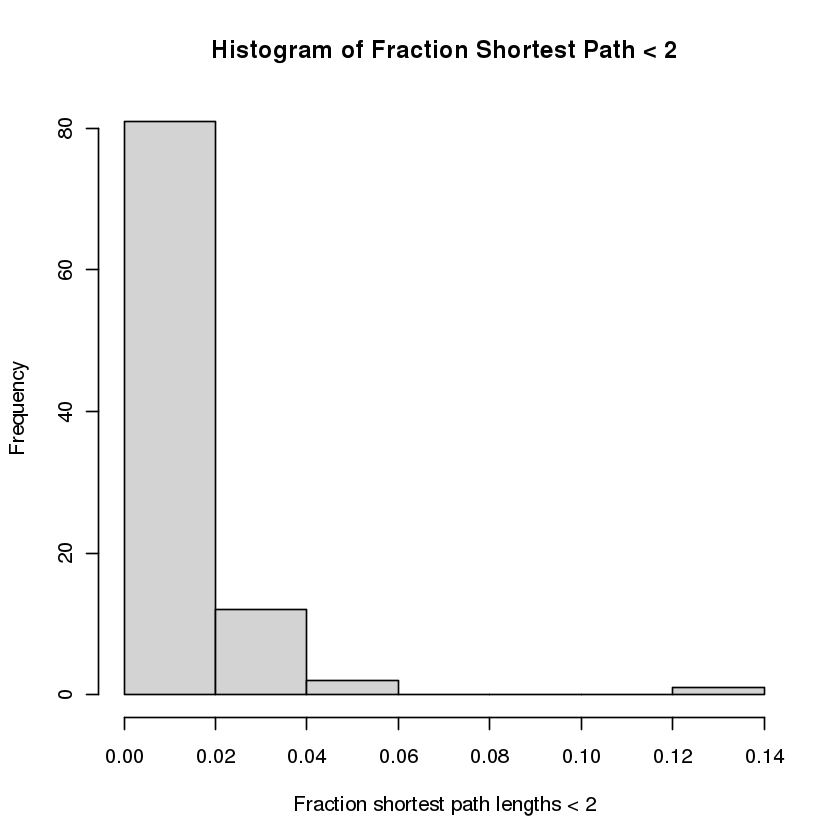

In [27]:
wound <- sp_analysis("wound_100")

In [ ]:
wound <- sp_analysis("wound_100")

In [3]:
 test_in<- fread("genome_regen_paths.txt", header=F)

Warning message in fread("genome_regen_paths.txt", header = F):
“Stopped early on line 4550. Expected 2 fields but found 3. Consider fill=TRUE and comment.char=. First discarded non-empty line: <<SYNCRIP-SACM1L     3USP30-TPM1         3>>”


In [44]:
total_genes <- fread("/data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/dmelanogaster_wound_down.txt",
                    header=F)
print(nrow(total_genes))
omitted_genes <- fread("/data/timonaj/cancer_as_wound/ppi_analysis/dmelanogaster_wound_down.txt", header=F)
print(nrow(omitted_genes))

wound_temp<- readRDS("wound_path_lengths.RDS")

wound_included<- wound_temp[wound_temp$node %in% total_genes$V1 &
                                    !(wound_temp$node %in% omitted_genes$V1),]
print(nrow(wound_included))

[1] 301
[1] 260
[1] 237846


In [45]:
head(wound_included)

,genome_node,node,sp_length
,<chr>,<chr>,<chr>
4,A1BG,STAT5A,3
16,A1BG,VCL,3
88,A1BG,CYP19A1,4
102,A1BG,OGT,3
117,A1BG,PPP1CB,3
150,A1BG,STAT5B,3


In [32]:
grepl("wound","dmelanogaster_wound_down.txt")

[1] TRUE

In [30]:
nrow(genome_wound_paths)

[1] 7865914

In [28]:
sum(genome_wound_paths$wound_node %in% total_genes)
head(genome_wound_paths$wound_node)
head(total_genes)

[1] 0

[1] "SLC2A4" "DNMT1"  "COL5A1" "STAT5A" "ATG4D"  "CTNNB1"

NLGN4Y
<chr>
METTL4
SRY
GRIK1
MPHOSPH8
SETDB2
MED15


In [3]:
genome_dmel_paths_files <- list.files("./genome_analysis","genome_ dmelanogaster_wound_down[0-9]*.out")

genome_node <- character()
wound_node <- character()
sp_length <- numeric()
for (i in 1:length(genome_wound_paths_files)) {
    current_file <- fread(paste("./genome_analysis/",genome_wound_paths_files[i],sep=""), header=F)
    node1 <- gsub("-.*", "", current_file$V1)
    node2 <- gsub("^.*-", "", current_file$V1)
    
    genome_node <- append(genome_node, node1,length(genome_node))
    wound_node <- append(wound_node, node2,length(wound_node))
    sp_length <- append(sp_length,current_file$V2,length(sp_length))
}

genome_wound_paths <- data.frame(genome_node, wound_node, sp_length)

In [23]:
genome_wound_paths_files <- list.files("./genome_analysis","genome_wound_paths[0-9]*.out")

genome_node <- character()
wound_node <- character()
sp_length <- numeric()
for (i in 1:length(genome_wound_paths_files)) {
    current_file <- fread(paste("./genome_analysis/",genome_wound_paths_files[i],sep=""), header=F)
    node1 <- gsub("-.*", "", current_file$V1)
    node2 <- gsub("^.*-", "", current_file$V1)
    
    genome_node <- append(genome_node, node1,length(genome_node))
    wound_node <- append(wound_node, node2,length(wound_node))
    sp_length <- append(sp_length,current_file$V2,length(sp_length))
}

genome_wound_paths <- data.frame(genome_node, wound_node, sp_length)

In [5]:
genome_stress_paths_files <- list.files("./genome_analysis","genome_stress_paths[0-9]*.out")

genome_node <- character()
stress_node <- character()
sp_length <- numeric()
for (i in 1:length(genome_stress_paths_files)) {
    current_file <- fread(paste("./genome_analysis/",genome_stress_paths_files[i],sep=""), header=F)
    node1 <- gsub("-.*", "", current_file$V1)
    node2 <- gsub("^.*-", "", current_file$V1)
    
    genome_node <- append(genome_node, node1,length(genome_node))
    stress_node <- append(stress_node, node2,length(stress_node))
    sp_length <- append(sp_length,current_file$V2,length(sp_length))
}

genome_stress_paths <- data.frame(genome_node, stress_node, sp_length)

In [ ]:


df <- genome_regen_paths
genome_genes <- unique(df$genome_node)

frac_0 <- numeric()
frac_1 <- numeric()
frac_less_2 <- numeric()
frac_less_3 <- numeric()
frac_less_4 <- numeric()

for (i in 1:length(genome_genes)) {
    current_gene <- df[df$genome_node == genome_genes[i],]
    frac_0 <- append(frac_0, nrow(current_gene[current_gene$sp_length == 0,])/nrow(current_gene),length(frac_0))
    frac_1 <- append(frac_1, nrow(current_gene[current_gene$sp_length == 1,])/nrow(current_gene),length(frac_1))
    frac_less_2 <- append(frac_less_2, nrow(current_gene[current_gene$sp_length < 2,])/nrow(current_gene),length(frac_less_2))
    frac_less_3 <- append(frac_less_3, nrow(current_gene[current_gene$sp_length < 3,])/nrow(current_gene),length(frac_less_3))
    frac_less_4 <- append(frac_less_4, nrow(current_gene[current_gene$sp_length < 4,])/nrow(current_gene),length(frac_less_4))
    
}


genome_regen_fractions <- data.frame("gene_regen" = genome_genes,
                                  "regen_Fraction_sp_0" = frac_0,
                                  "regen_Fraction_sp_1" = frac_1,
                                  "regen_Fraction_sp_less2" = frac_less_2,
                                  "regen_Fraction_sp_less3" = frac_less_3,
                                  "regen_Fraction_sp_less4" = frac_less_4)

saveRDS(genome_regen_fractions,"regen_fractions.RDS")

In [151]:
library("data.table")

genome_regen_paths_files <- list.files("./genome_analysis","genome_wrs_paths[0-9]*.out")

genome_node <- character()
regen_node <- character()
sp_length <- numeric()
for (i in 1:length(genome_regen_paths_files)) {
    current_file <- fread(paste("./genome_analysis/",genome_regen_paths_files[i],sep=""), header=F)
    node1 <- gsub("-.*", "", current_file$V1)
    node2 <- gsub("^.*-", "", current_file$V1)
    
    genome_node <- append(genome_node, node1,length(genome_node))
    regen_node <- append(regen_node, node2,length(regen_node))
    sp_length <- append(sp_length,current_file$V2,length(sp_length))
}

genome_regen_paths <- data.frame(genome_node, regen_node, sp_length)

df <- genome_wound_paths
genome_genes <- unique(df$genome_node)

frac_0 <- numeric()
frac_1 <- numeric()
frac_less_2 <- numeric()
frac_less_3 <- numeric()
frac_less_4 <- numeric()

for (i in 1:length(genome_genes)) {
    current_gene <- df[df$genome_node == genome_genes[i],]
    frac_0 <- append(frac_0, nrow(current_gene[current_gene$sp_length == 0,])/nrow(current_gene),length(frac_0))
    frac_1 <- append(frac_1, nrow(current_gene[current_gene$sp_length == 1,])/nrow(current_gene),length(frac_1))
    frac_less_2 <- append(frac_less_2, nrow(current_gene[current_gene$sp_length < 2,])/nrow(current_gene),length(frac_less_2))
    frac_less_3 <- append(frac_less_3, nrow(current_gene[current_gene$sp_length < 3,])/nrow(current_gene),length(frac_less_3))
    frac_less_4 <- append(frac_less_4, nrow(current_gene[current_gene$sp_length < 4,])/nrow(current_gene),length(frac_less_4))
    
}


genome_wound_fractions <- data.frame("gene_wound" = genome_genes,
                                  "wound_Fraction_sp_0" = frac_0,
                                  "wound_Fraction_sp_1" = frac_1,
                                  "wound_Fraction_sp_less2" = frac_less_2,
                                  "wound_Fraction_sp_less3" = frac_less_3,
                                  "wound_Fraction_sp_less4" = frac_less_4)

In [ ]:
library("data.table")

genome_stress_paths_files <- list.files("./genome_analysis","genome_stress_paths[0-9]*.out")

genome_node <- character()
stress_node <- character()
sp_length <- numeric()
for (i in 1:length(genome_stress_paths_files)) {
    current_file <- fread(paste("./genome_analysis/",genome_stress_paths_files[i],sep=""), header=F)
    node1 <- gsub("-.*", "", current_file$V1)
    node2 <- gsub("^.*-", "", current_file$V1)
    
    genome_node <- append(genome_node, node1,length(genome_node))
    stress_node <- append(stress_node, node2,length(stress_node))
    sp_length <- append(sp_length,current_file$V2,length(sp_length))
}

genome_stress_paths <- data.frame(genome_node, stress_node, sp_length)

df <- genome_stress_paths
genome_genes <- unique(df$genome_node)

frac_0 <- numeric()
frac_1 <- numeric()
frac_less_2 <- numeric()
frac_less_3 <- numeric()
frac_less_4 <- numeric()

for (i in 1:length(genome_genes)) {
    current_gene <- df[df$genome_node == genome_genes[i],]
    frac_0 <- append(frac_0, nrow(current_gene[current_gene$sp_length == 0,])/nrow(current_gene),length(frac_0))
    frac_1 <- append(frac_1, nrow(current_gene[current_gene$sp_length == 1,])/nrow(current_gene),length(frac_1))
    frac_less_2 <- append(frac_less_2, nrow(current_gene[current_gene$sp_length < 2,])/nrow(current_gene),length(frac_less_2))
    frac_less_3 <- append(frac_less_3, nrow(current_gene[current_gene$sp_length < 3,])/nrow(current_gene),length(frac_less_3))
    frac_less_4 <- append(frac_less_4, nrow(current_gene[current_gene$sp_length < 4,])/nrow(current_gene),length(frac_less_4))
    
}


genome_stress_fractions <- data.frame("gene_stress" = genome_genes,
                                  "stress_Fraction_sp_0" = frac_0,
                                  "stress_Fraction_sp_1" = frac_1,
                                  "stress_Fraction_sp_less2" = frac_less_2,
                                  "stress_Fraction_sp_less3" = frac_less_3,
                                  "stress_Fraction_sp_less4" = frac_less_4)

saveRDS(genome_stress_fractions,"stress_fractions.RDS")

In [188]:
genome_stress_fractions <- data.frame("gene_stress" = genome_genes,
                                  "stress_Fraction_sp_0" = frac_0,
                                  "stress_Fraction_sp_1" = frac_1,
                                  "stress_Fraction_sp_less2" = frac_less_2,
                                  "stress_Fraction_sp_less3" = frac_less_3,
                                  "stress_Fraction_sp_less4" = frac_less_4)

ERROR: Error in data.frame(gene_stress = genome_genes, stress_Fraction_sp_0 = frac_0, : arguments imply differing number of rows: 16904, 11190


In [3]:
biowulf_submission_fraction <- function(name,file_regex,total_file,ommitted_file,jobname) {
    command = paste("printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R ",
                    name, " ", file_regex,  " ", total_file, " ", ommitted_file,
                    " /data/timonaj/cancer_as_wound/ppi_analysis/\" > ", jobname,
                    ".job \nsbatch --mem=10g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 ", jobname,
                    ".job \n", sep = "")
    print(command)
    system(try(command))
}

In [22]:
biowulf_submission_fraction("stress","genome_stress_paths[0-9]*.out","stress_job")
biowulf_submission_fraction("regen","genome_wrs_paths[0-9]*.out","regen_job")
biowulf_submission_fraction("wound","genome_wound_paths[0-9]*.out","wound_job")
#biowulf_submission_fraction("amexicanum_regen_down","genome_amexicanum_regen_down[0-9]*.out", "amexicanum_regen_down.job")

[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R stress genome_stress_paths[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/\" > stress_job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 stress_job.job \n"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R regen genome_wrs_paths[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/\" > regen_job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 regen_job.job \n"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R wound genome_wound_paths[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/\" > wound_job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 wound_job.job \n"


In [10]:
biowulf_submission_fraction("drerio_regen_up","genome_drerio_regen_up[0-9]*.out",
                            "/data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/drerio_regen_up.txt",
                            "/data/timonaj/cancer_as_wound/ppi_analysis/drerio_regen_up.txt",
                            "drerio_regen_up.job")

[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R drerio_regen_up genome_drerio_regen_up[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/drerio_regen_up.txt /data/timonaj/cancer_as_wound/ppi_analysis/drerio_regen_up.txt /data/timonaj/cancer_as_wound/ppi_analysis/\" > drerio_regen_up.job.job \nsbatch --mem=10g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 drerio_regen_up.job.job \n"


In [3]:
list.files("/data/timonaj/cancer_as_wound/spec_exp_genes")

[1] "amexicanum_regen_down.txt"       "amexicanum_regen_up.txt"        
 [3] "celegans_stress_down.txt"        "celegans_stress_up.txt"         
 [5] "clupisFamiliaris_wound_down.txt" "clupisFamiliaris_wound_up.txt"  
 [7] "dmelanogaster_stress_down.txt"   "dmelanogaster_stress_up.txt"    
 [9] "dmelanogaster_wound_down.txt"    "drerio_regen_down.txt"          
[11] "drerio_regen_up.txt"             "hsapiens_regen_down.txt"        
[13] "hsapiens_regen_up.txt"           "hsapiens_stress_down.txt"       
[15] "hsapiens_stress_up.txt"          "hsapiens_wound_down.txt"        
[17] "hsapiens_wound_up.txt"           "mmusculus_stress_down.txt"      
[19] "mmusculus_stress_up.txt"         "rnorvegicus_wound_down.txt"     
[21] "rnorvegicus_wound_up.txt"        "sscrofa_wound_down.txt"         
[23] "sscrofa_wound_up.txt"

In [4]:
for(file in list.files("/data/timonaj/cancer_as_wound/spec_exp_genes")) {
    biowulf_submission_fraction(gsub(".txt","",file),
                                paste("genome_", gsub(".txt","",file),"[0-9]*.out", sep=""),
                                paste("/data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/",file,sep=""), 
                                paste("/data/timonaj/cancer_as_wound/ppi_analysis/",file,sep=""),
                                paste(file, "_job", sep=""))
}

[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R amexicanum_regen_down genome_amexicanum_regen_down[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/amexicanum_regen_down.txt /data/timonaj/cancer_as_wound/ppi_analysis/amexicanum_regen_down.txt /data/timonaj/cancer_as_wound/ppi_analysis/\" > amexicanum_regen_down.txt_job.job \nsbatch --mem=10g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 amexicanum_regen_down.txt_job.job \n"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript fraction_analysis.R amexicanum_regen_up genome_amexicanum_regen_up[0-9]*.out /data/timonaj/cancer_as_wound/ppi_analysis/total_spec_exp_genes/amexicanum_regen_up.txt /data/timonaj/cancer_as_wound/ppi_analysis/amexicanum_regen_up.txt /data/timonaj/cancer_as_wound/ppi_analysis/\" > amexicanum_regen_up.txt_job.job \nsbatch --mem=10g --cpus-per-task=2 --gres=lscratch:2 --time 1:00:00 amexicanum_regen_up.txt_job.job \n"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript fr

In [ ]:
biowulf_submission_fraction("amexicanum_regen_down","genome_amexicanum_regen_down[0-9]*.out", "amexicanum_regen_down.job")

In [2]:
fractions_list <- list()
for(file in list.files("/data/timonaj/cancer_as_wound/ppi_analysis/","*_fractions.RDS")) {
    fractions_list[[gsub("_fractions.RDS", "",file)]] <- readRDS(file)
}

In [3]:
summary(fractions_list)

                          Length Class      Mode
amexicanum_regen_down     6      data.frame list
amexicanum_regen_up       6      data.frame list
celegans_stress_down      6      data.frame list
celegans_stress_up        6      data.frame list
clupisFamiliaris_wound_up 6      data.frame list
dmelanogaster_stress_down 6      data.frame list
dmelanogaster_stress_up   6      data.frame list
dmelanogaster_wound_down  6      data.frame list
dmelanogaster_wound_up    6      data.frame list
drerio_regen_down         6      data.frame list
drerio_regen_up           6      data.frame list
hsapiens_regen_down       6      data.frame list
hsapiens_regen_up         6      data.frame list
hsapiens_stress_down      6      data.frame list
hsapiens_stress_up        6      data.frame list
hsapiens_wound_down       6      data.frame list
hsapiens_wound_up         6      data.frame list
mmusculus_stress_down     6      data.frame list
mmusculus_stress_up       6      data.frame list
regen               

In [4]:
fractions_list[[1]]

gene_amexicanum_regen_down,amexicanum_regen_down_Fraction_sp_0,amexicanum_regen_down_Fraction_sp_1,amexicanum_regen_down_Fraction_sp_less2,amexicanum_regen_down_Fraction_sp_less3,amexicanum_regen_down_Fraction_sp_less4
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,0,0.00000000,0.00000000,0.04656863,0.70343137
ANXA7,0,0.01960784,0.01960784,0.31862745,0.93137255
CDKN1A,0,0.02205882,0.02205882,0.62254902,0.97058824
CRISP3,0,0.00000000,0.00000000,0.00000000,0.04656863
TK1,0,0.02696078,0.02696078,0.44852941,0.95343137
A1CF,0,0.00000000,0.00000000,0.00245098,0.38970588
APOBEC1,0,0.00000000,0.00000000,0.04411765,0.71078431
CELF2,0,0.00000000,0.00000000,0.00000000,0.00245098
KHSRP,0,0.00245098,0.00245098,0.21078431,0.90441176


In [80]:
genome_regen_fractions <- fractions_list[["regen"]]
genome_wound_fractions <- fractions_list[["wound"]]
genome_stress_fractions <- fractions_list[["stress"]]

In [81]:
initial_combinedDF<- cbind(genome_regen_fractions[genome_regen_fractions$gene_regen %in% genome_wound_fractions$gene_wound,],
                   genome_wound_fractions[genome_wound_fractions$gene_wound %in% genome_regen_fractions$gene_regen,])

combinedDF <- cbind(initial_combinedDF[initial_combinedDF$gene_regen %in% genome_stress_fractions$gene_stress,],
                   genome_stress_fractions[genome_stress_fractions$gene_stress %in% initial_combinedDF$gene_regen,])


In [82]:
cosmic_genes<-fread("cosmic_hallmarks.txt",header=F)
cosmic_genes<-as.data.frame(cosmic_genes)
colnames(cosmic_genes)<-c("gene")

#oncogenic_status<-gsub(" ", "", combinedDF$gene_regen) %in% as.character(cosmic_genes$gene)
oncogenic_status<-as.character(combinedDF$gene_regen) %in% as.character(cosmic_genes$gene)
combinedDF<- cbind(combinedDF,"oncogenic_status" =as.character(oncogenic_status))

In [83]:
head(combinedDF[,c('gene_regen','regen_Fraction_sp_less2','wound_Fraction_sp_less2','stress_Fraction_sp_less2')])

,gene_regen,regen_Fraction_sp_less2,wound_Fraction_sp_less2,stress_Fraction_sp_less2
,<chr>,<dbl>,<dbl>,<dbl>
1,A1BG,0.00000000,0.00000000,0.002770083
2,ANXA7,0.01098901,0.01079914,0.011080332
3,CDKN1A,0.04395604,0.04535637,0.016620499
4,CRISP3,0.00000000,0.00000000,0.002770083
5,TK1,0.02417582,0.02807775,0.011080332
6,A1CF,0.00000000,0.00000000,0.000000000


In [84]:
colnames(combinedDF)

[1] "gene_regen"               "regen_Fraction_sp_0"     
 [3] "regen_Fraction_sp_1"      "regen_Fraction_sp_less2" 
 [5] "regen_Fraction_sp_less3"  "regen_Fraction_sp_less4" 
 [7] "gene_wound"               "wound_Fraction_sp_0"     
 [9] "wound_Fraction_sp_1"      "wound_Fraction_sp_less2" 
[11] "wound_Fraction_sp_less3"  "wound_Fraction_sp_less4" 
[13] "gene_stress"              "stress_Fraction_sp_0"    
[15] "stress_Fraction_sp_1"     "stress_Fraction_sp_less2"
[17] "stress_Fraction_sp_less3" "stress_Fraction_sp_less4"
[19] "oncogenic_status"

# Pairwise Shortest path analysis

In [19]:

get_distance_measures <- function(pca_res, combinedDF) {
    ptm  <- proc.time()

    onc_pca <- as.data.frame(pca_res$x)[combinedDF$oncogenic_status == "TRUE",]
    onc_plot <-  ggscatter(onc_pca, x = "PC1", y = "PC2",
       color = "#00AFBB")
    
    show(onc_plot)

    onco_distances <- closeness_measures(onc_pca)

    nononc_pca <- as.data.frame(pca_res$x)[combinedDF$oncogenic_status == "FALSE",]

    total_nononc_plot<- ggscatter(nononc_pca, x = "PC1", y = "PC2",
              color = "#FC4E07")
    show(total_nononc_plot)


    nononc_pca_list <- list()
    nononco_distances_list <- list()
    boxplot_list <- list("centroid" = list(),
                         "pairwise_euclidean" =  list())
    pval_list <-  list("centroid" = list(),
                                   "pairwise_euclidean" =  list())
    
    # sample the larger data frame 10 times
    for  (i in 1:10) {
        nononc_pca_df <- as.data.frame(pca_res$x)[combinedDF$oncogenic_status == "FALSE",]
        nononc_pca_list[[i]] <- nononc_pca_df[sample(nrow(nononc_pca_df), nrow(onc_pca)),]

        plot <-  ggscatter(nononc_pca_list[[i]], x = "PC1", y = "PC2",
           color = "#FC4E07")
        show(plot)

        nononco_distances_list[[i]] <- closeness_measures(nononc_pca_list[[i]])

        boxplot_list[["centroid"]][[i]] <-  boxplot(onco_distances$centroid, nononco_distances_list[[i]]$centroid)
        boxplot_list[["pairwise_euclidean"]][[i]] <-  boxplot(onco_distances$euclidean, nononco_distances_list[[i]]$euclidean)
        pval_list[["centroid"]][[i]] <- wilcox.test(onco_distances$centroid, nononco_distances_list[[i]]$centroid, alternative = "less")$p.value
        pval_list[["pairwise_euclidean"]][[i]] <- wilcox.test(onco_distances$euclidean, nononco_distances_list[[i]]$euclidean, alternative = "less")$p.value
    }
    proc.time() - ptm
    
    return(list("onco_distances" = onco_distances,
                "nononc_pca_list" = nononc_pca_list ,
                "nononco_distances_list" = nononco_distances_list,
                "boxplot_list"= boxplot_list,
                "pval_list" = pval_list))
}


## SP < 2

Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


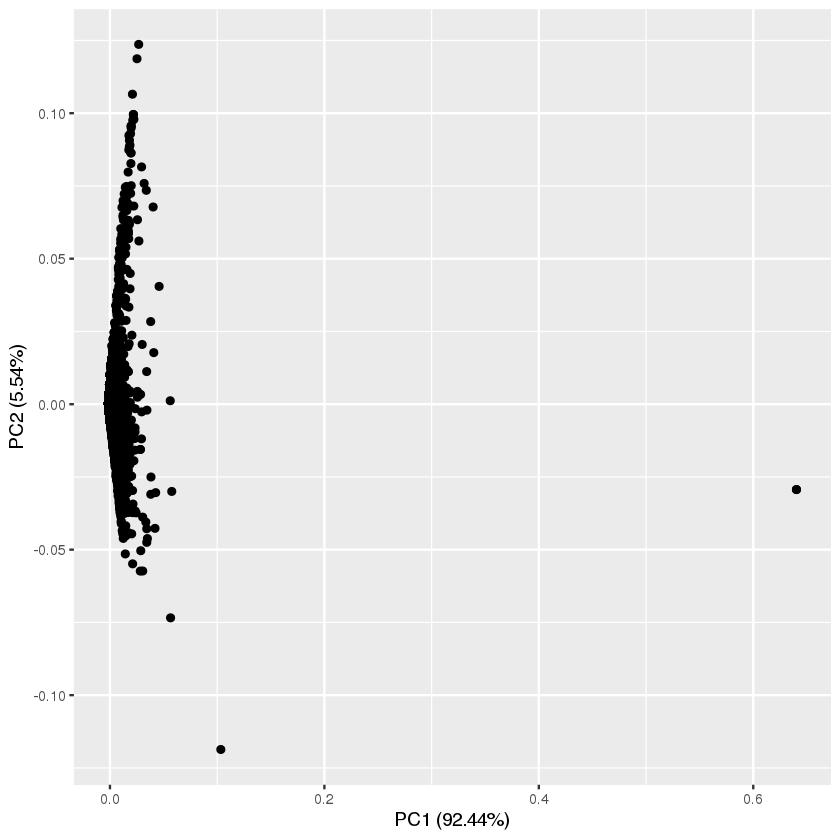

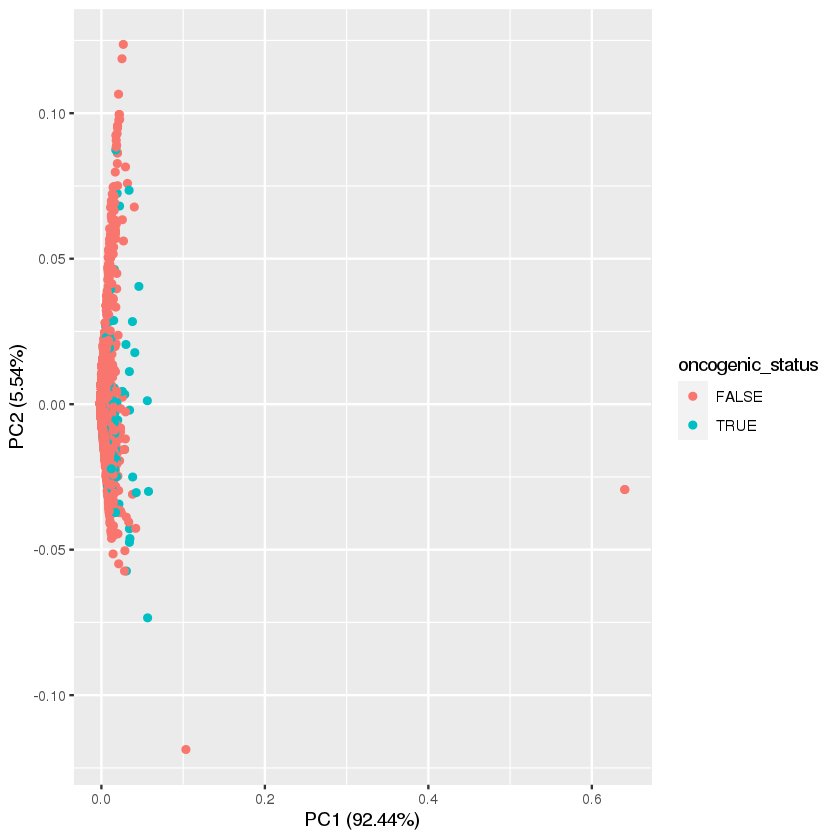

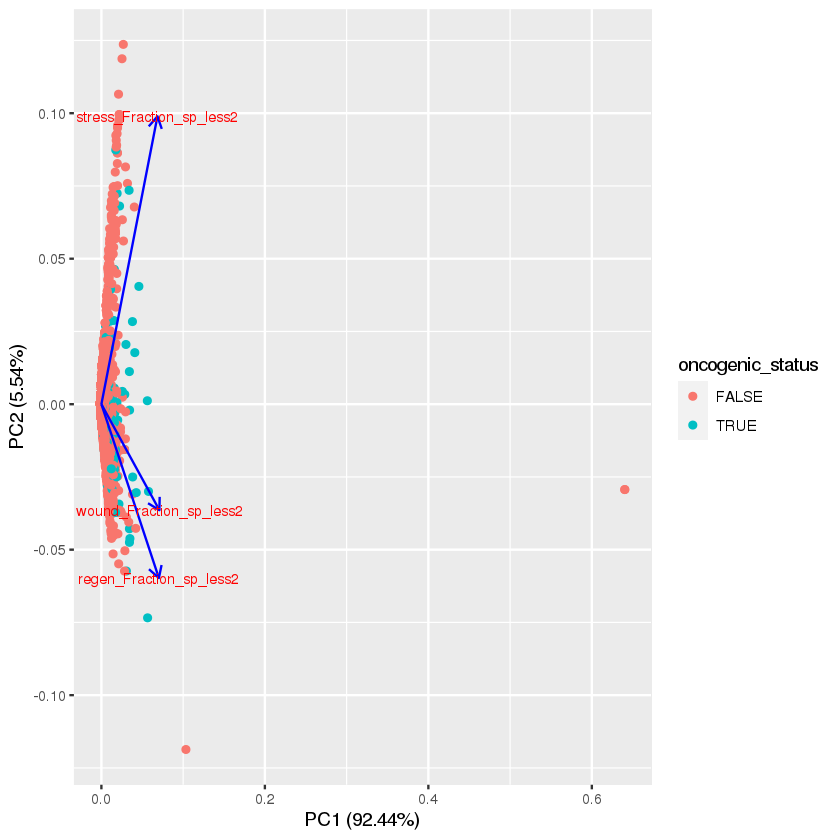

In [13]:
scale2 <- combinedDF[,c('regen_Fraction_sp_less2','wound_Fraction_sp_less2','stress_Fraction_sp_less2')]
pca_res_2 <- prcomp(scale2, scale. = TRUE)
autoplot(pca_res_2)
autoplot(pca_res_2, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_2, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

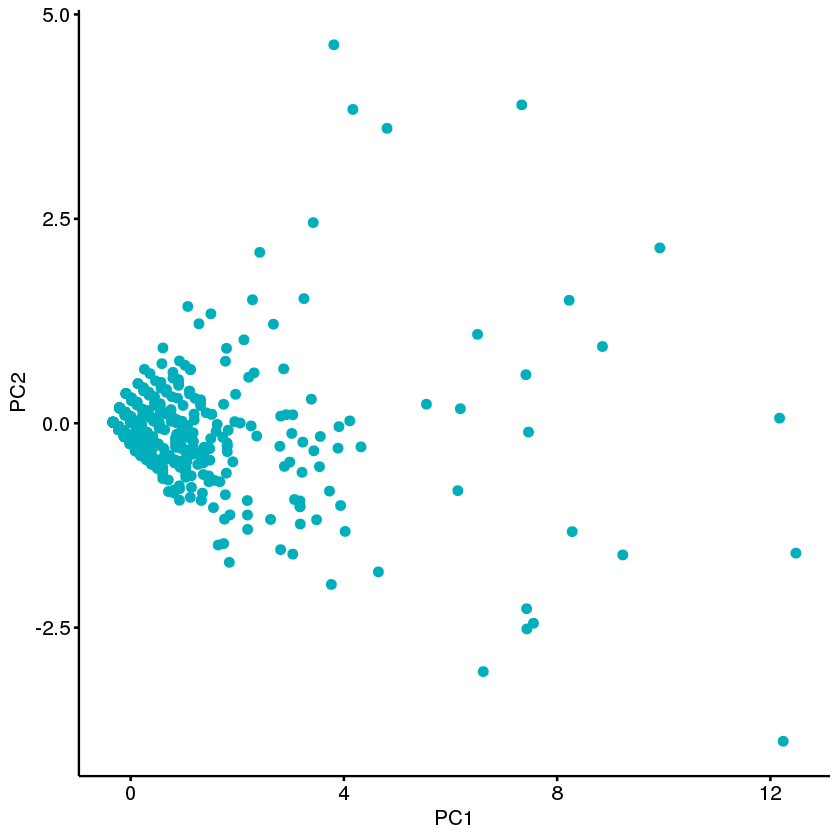

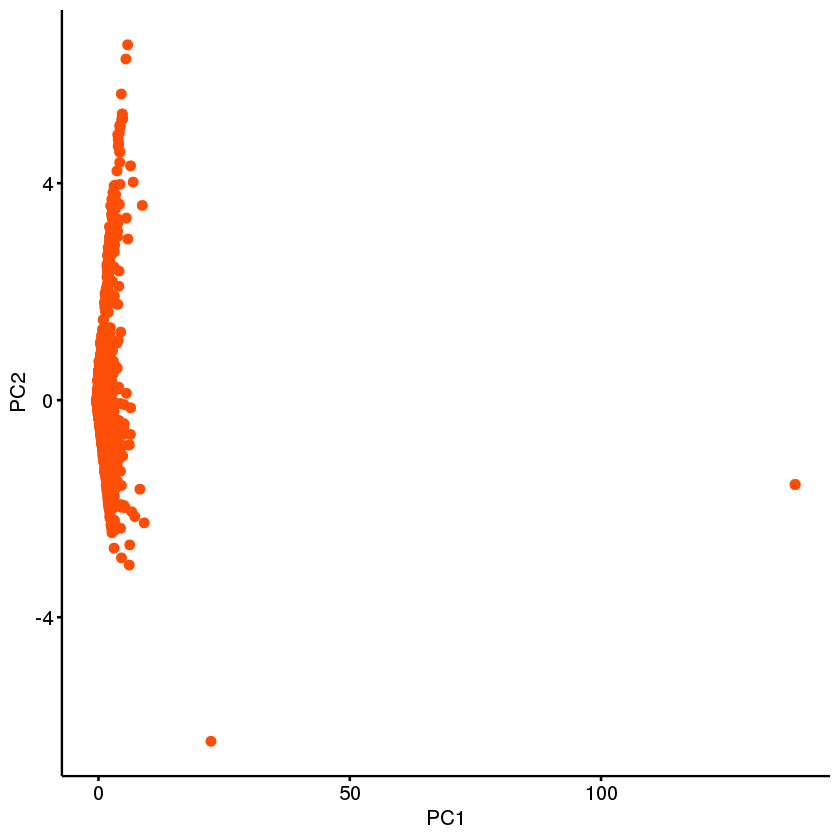

In [13]:
onc_pca_2 <- as.data.frame(pca_res_2$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_2, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_2 <- as.data.frame(pca_res_2$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_2, x = "PC1", y = "PC2",
   color = "#FC4E07")

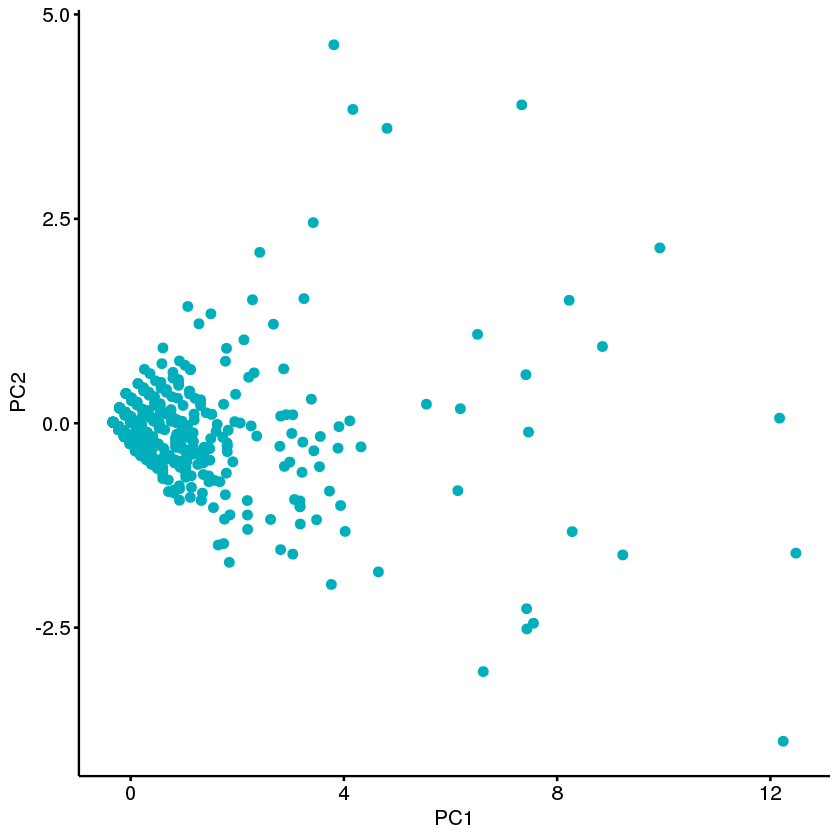

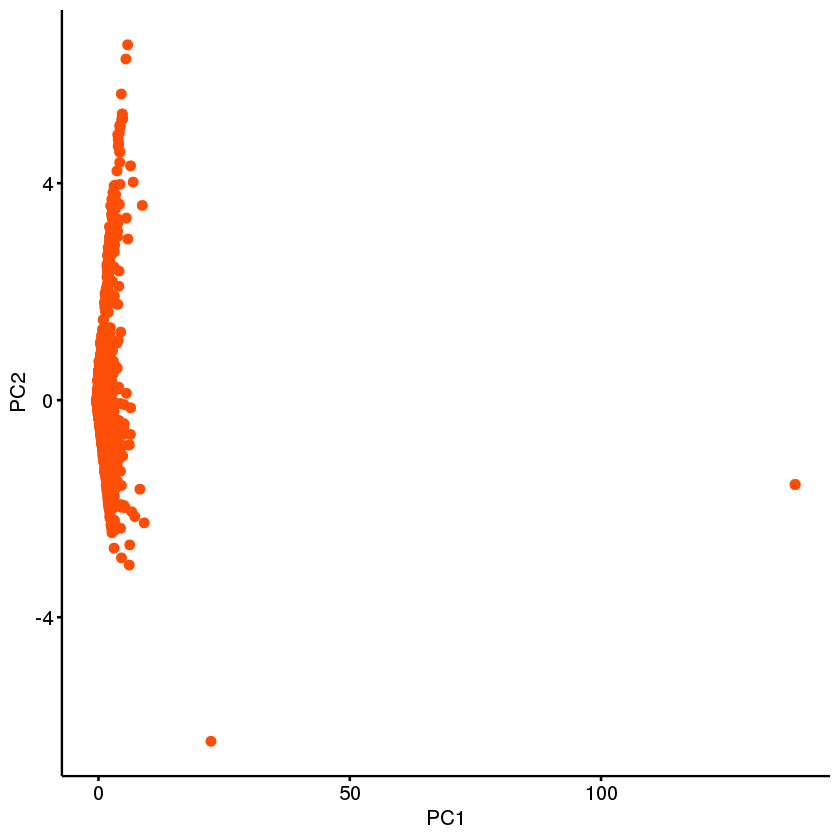

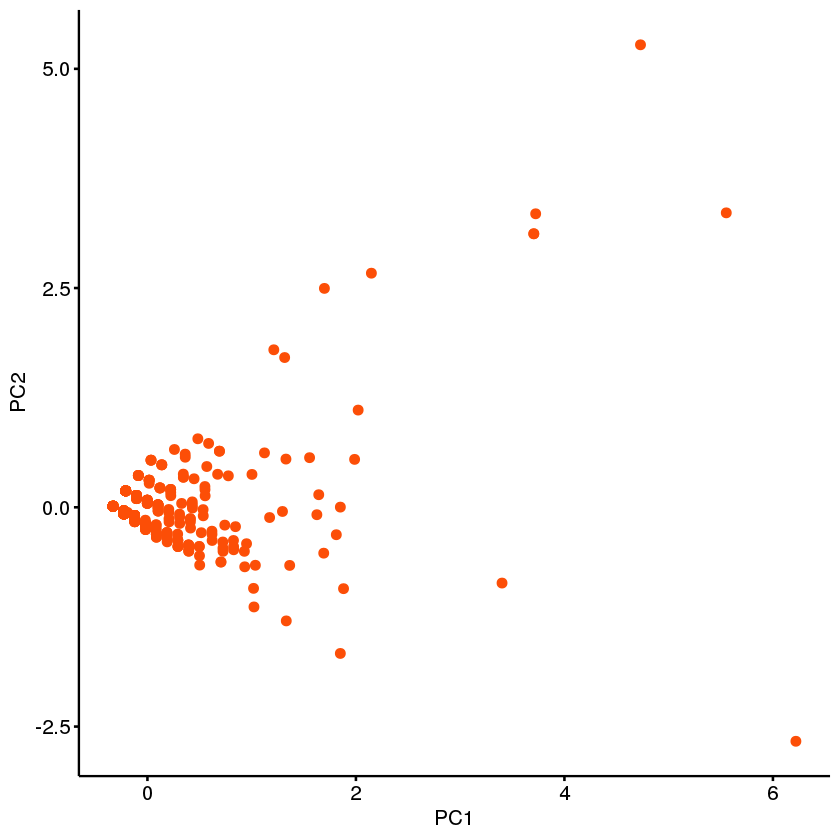

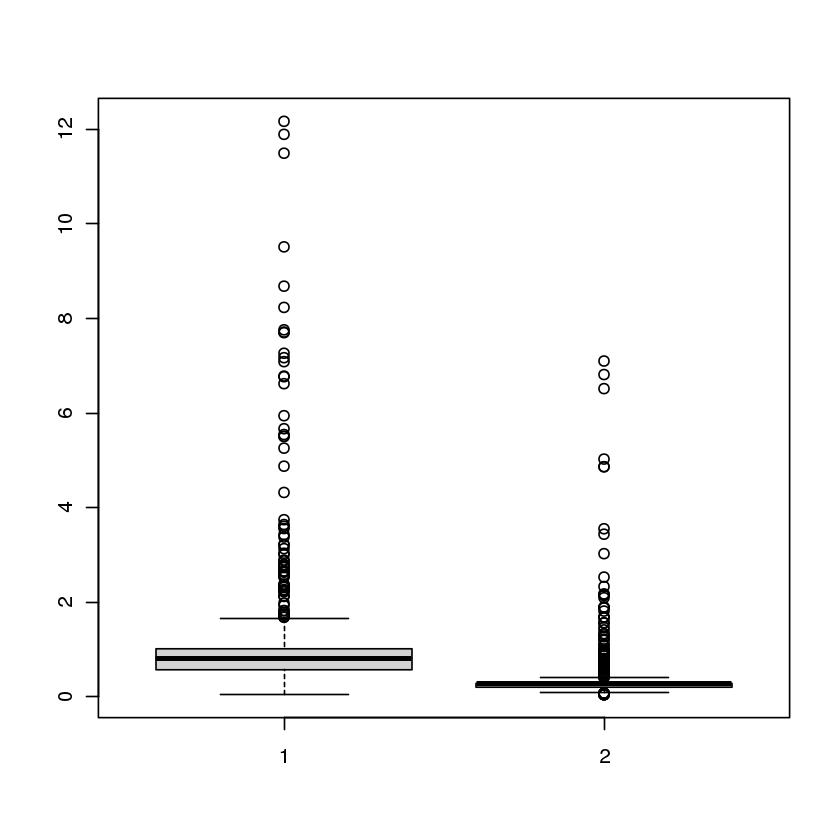

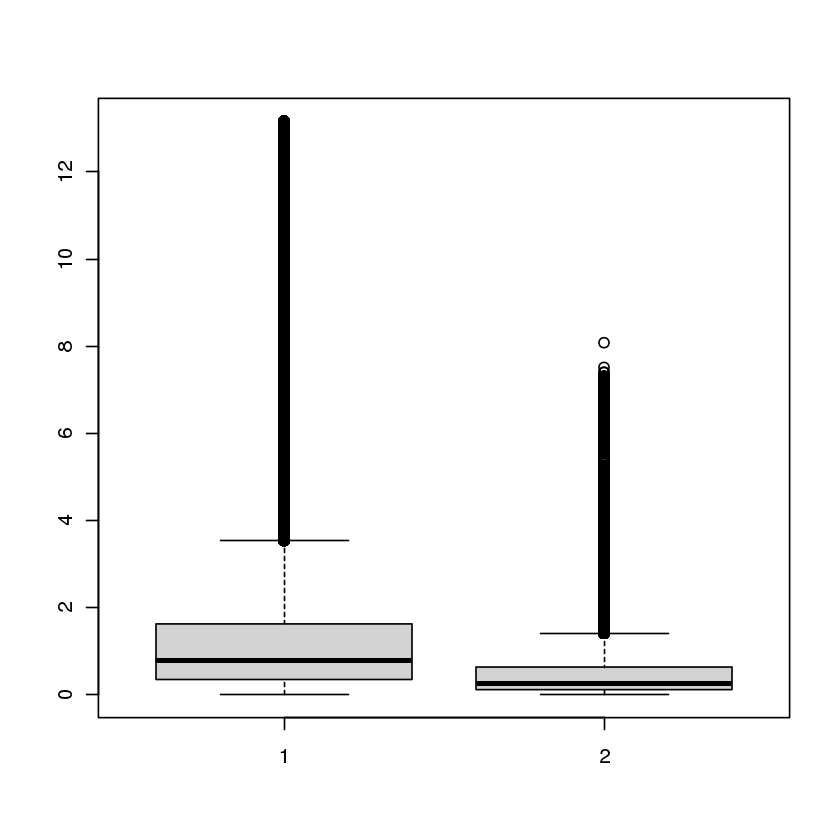

...

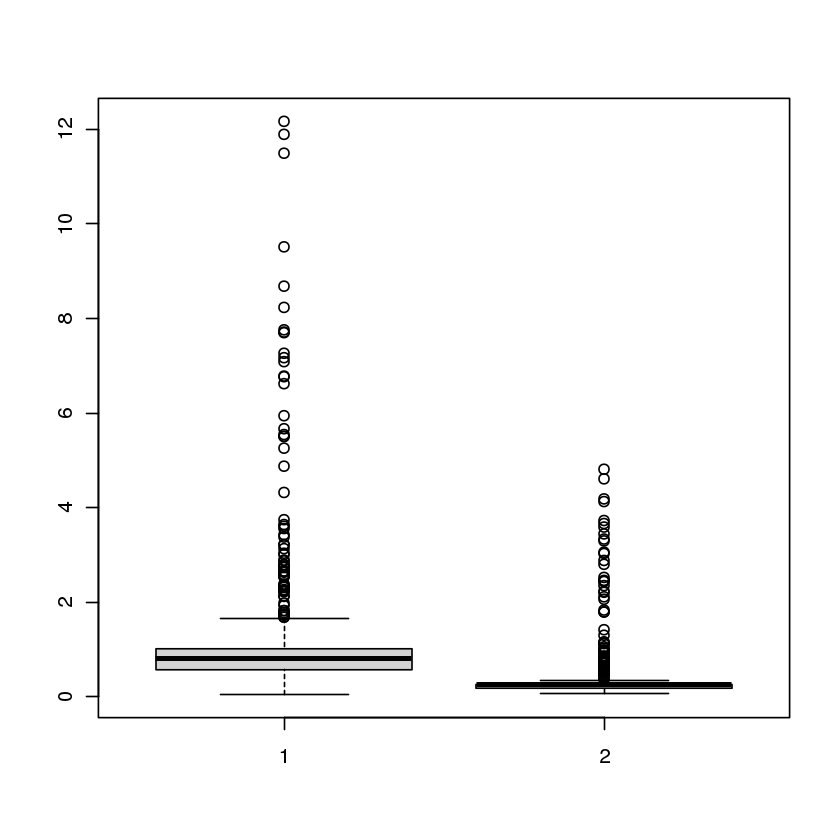

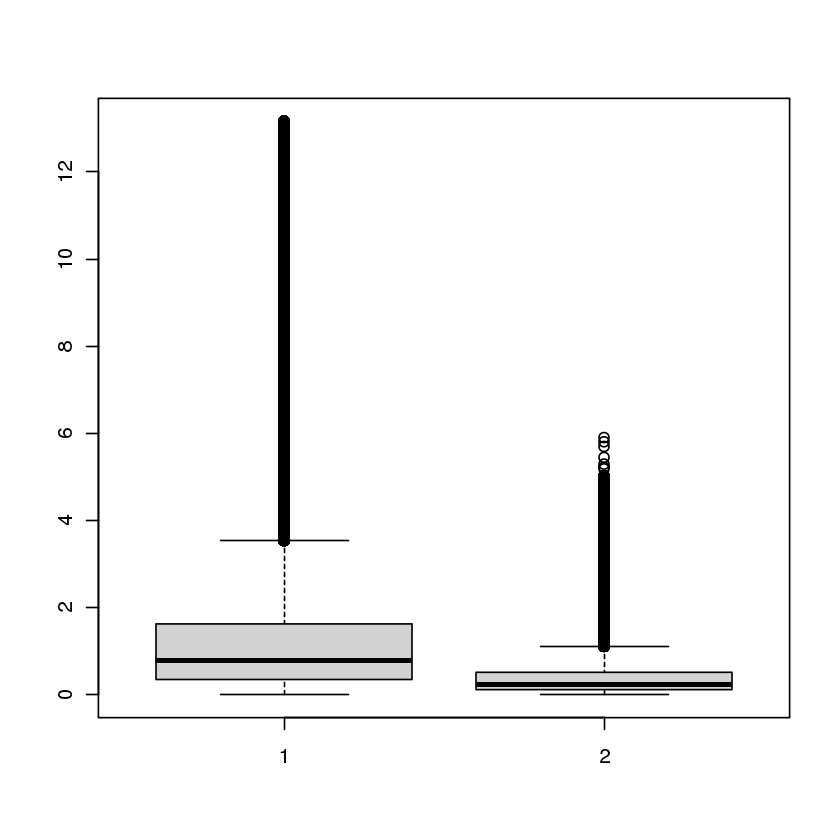

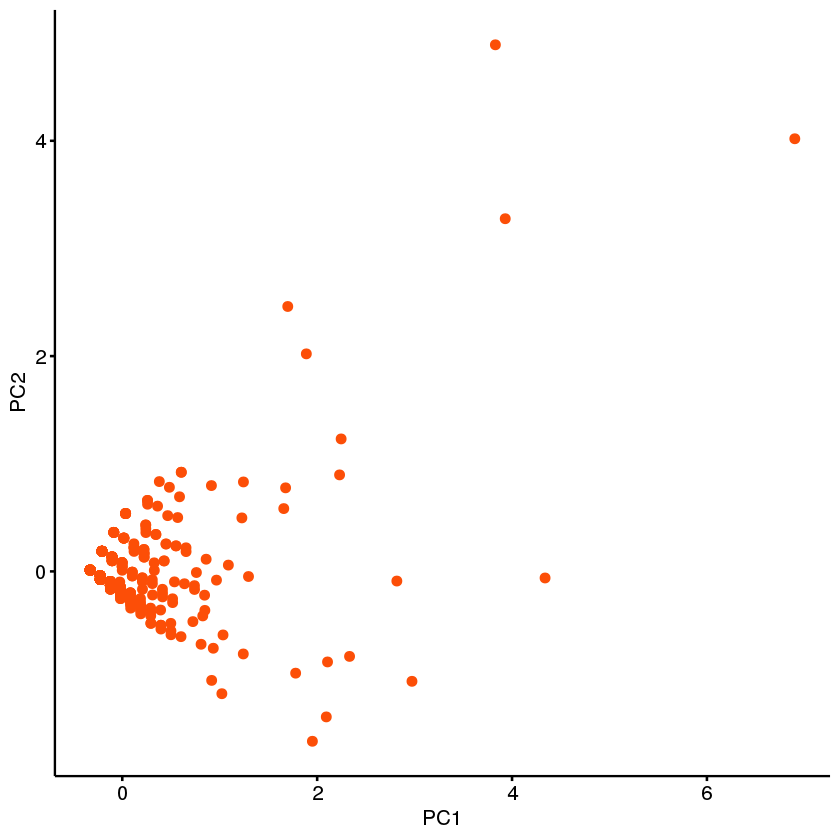

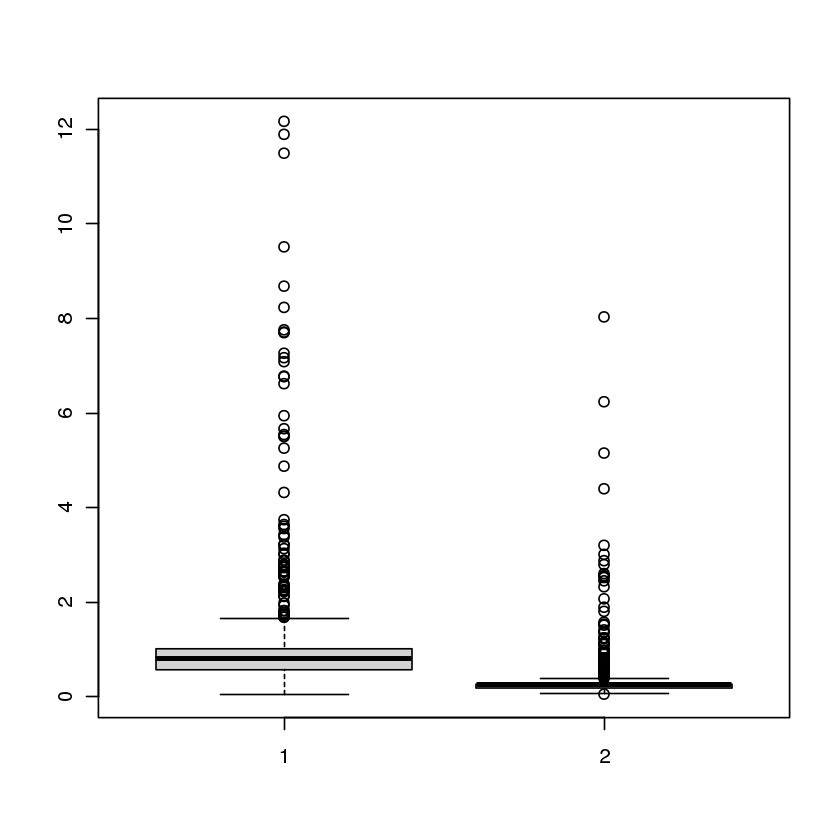

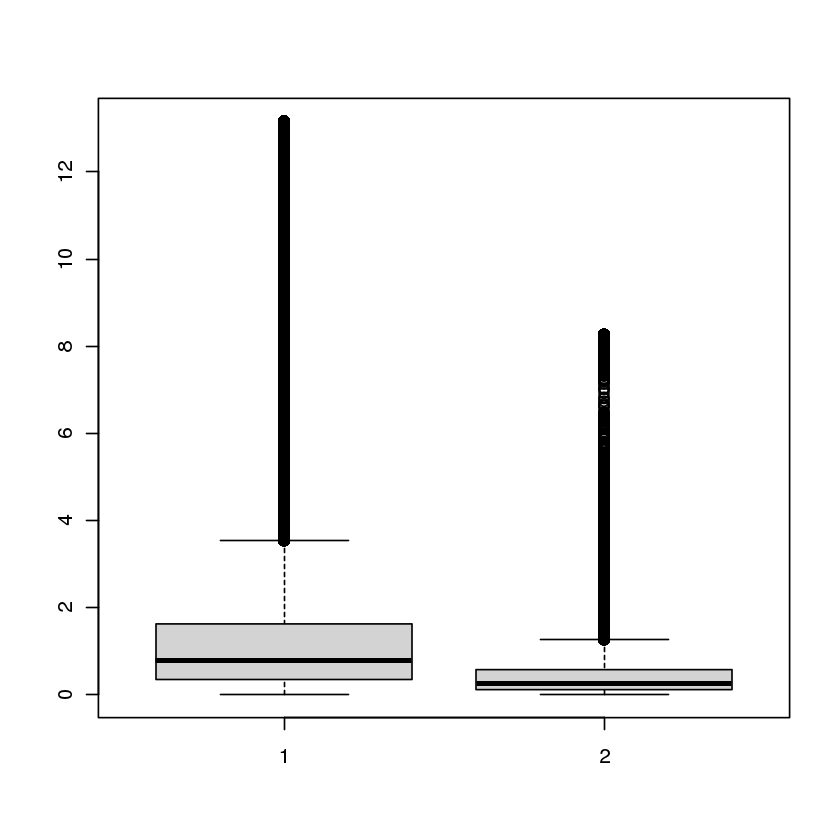

In [40]:
path_2_lists <- get_distance_measures(pca_res_2)

In [ ]:
boxplot(onco_2_distances$centroid, nononco_2_distances)
wilcox.test(onco_2_distances$centroid, nononco_2_distances, alternative = "less")

## SP < 3

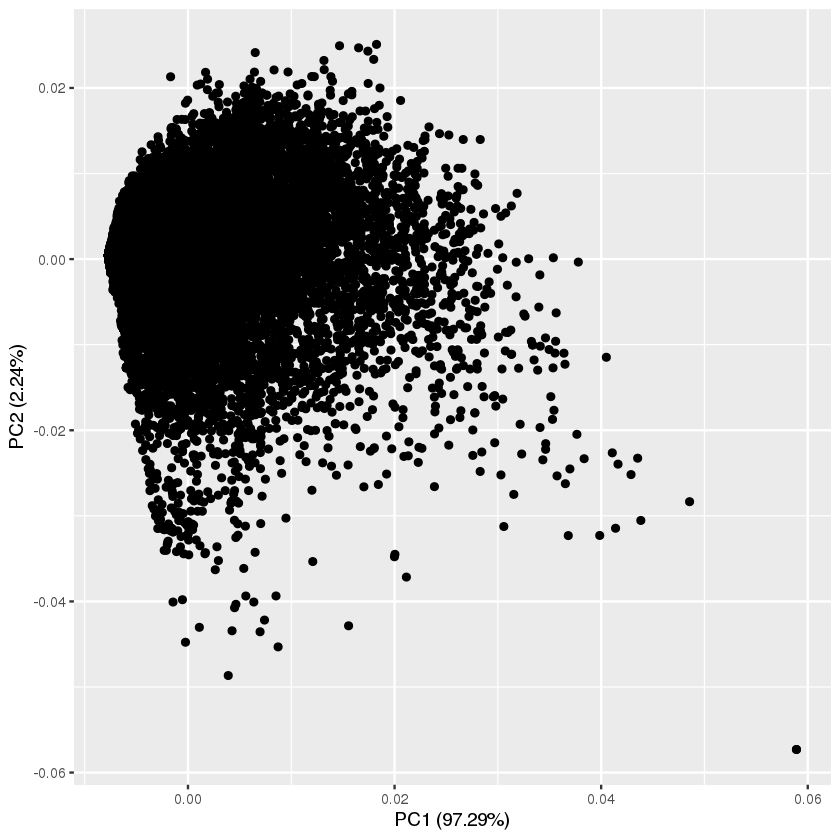

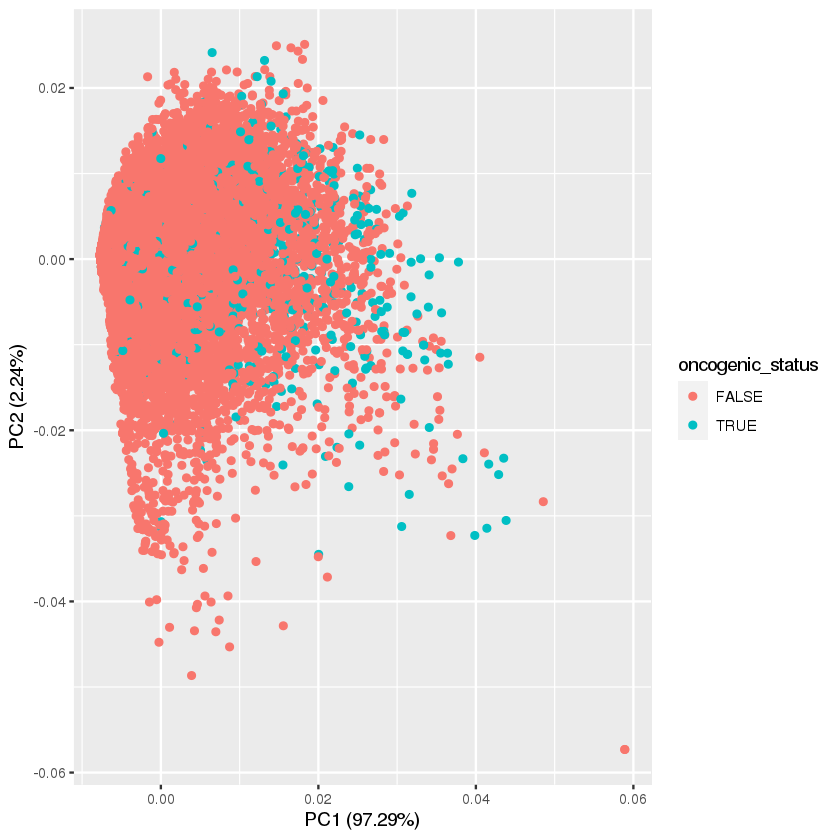

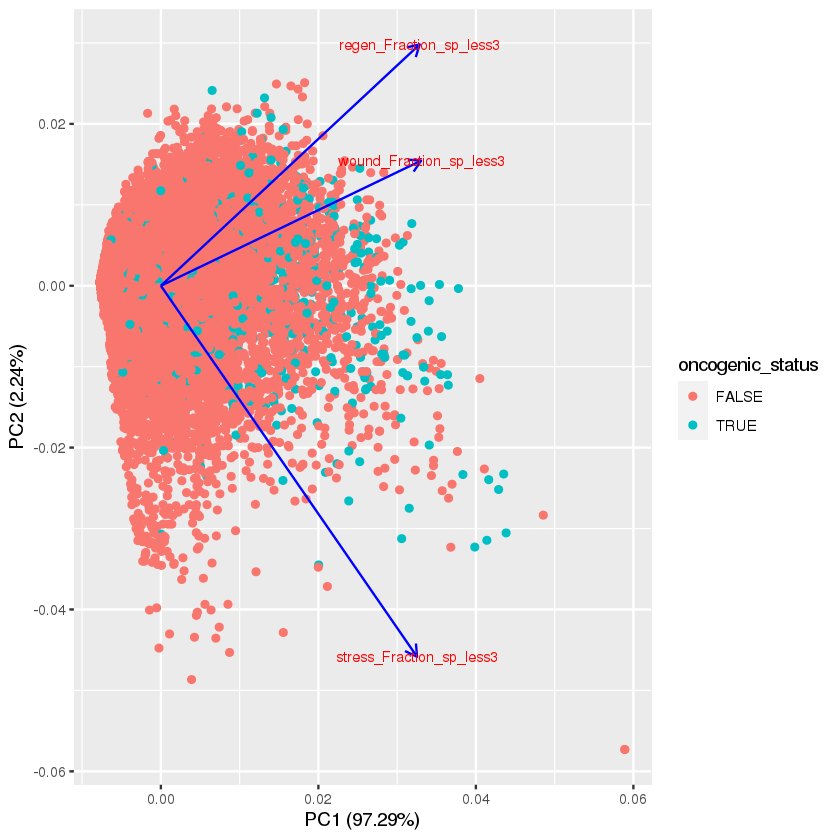

In [32]:
scale3 <- combinedDF[,c('regen_Fraction_sp_less3','wound_Fraction_sp_less3','stress_Fraction_sp_less3')]
pca_res_3 <- prcomp(scale3, scale. = TRUE)
autoplot(pca_res_3)
autoplot(pca_res_3, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_3, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

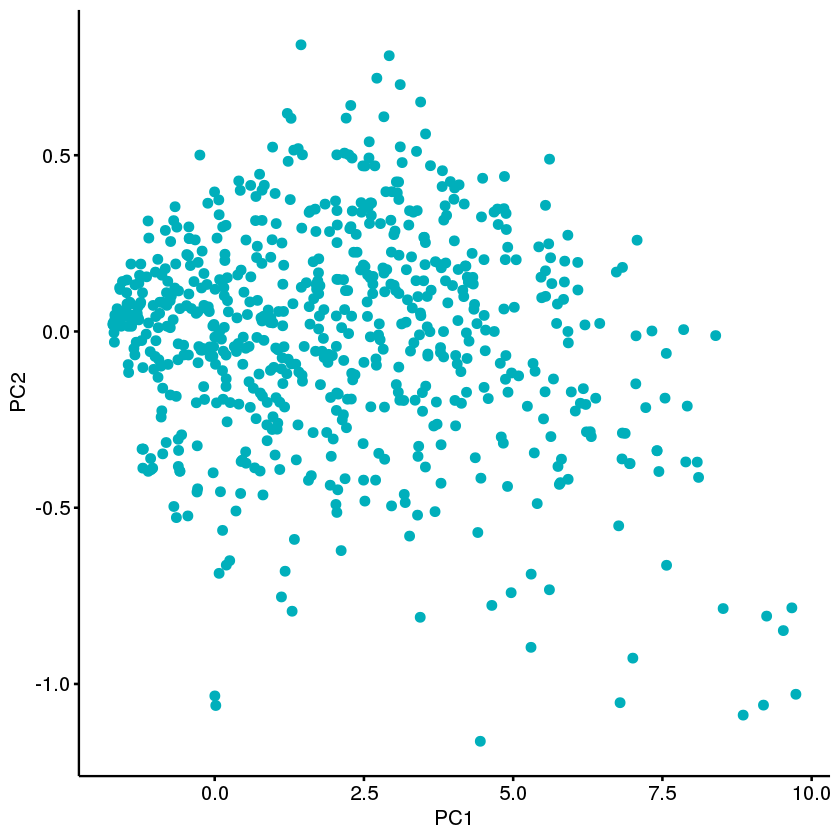

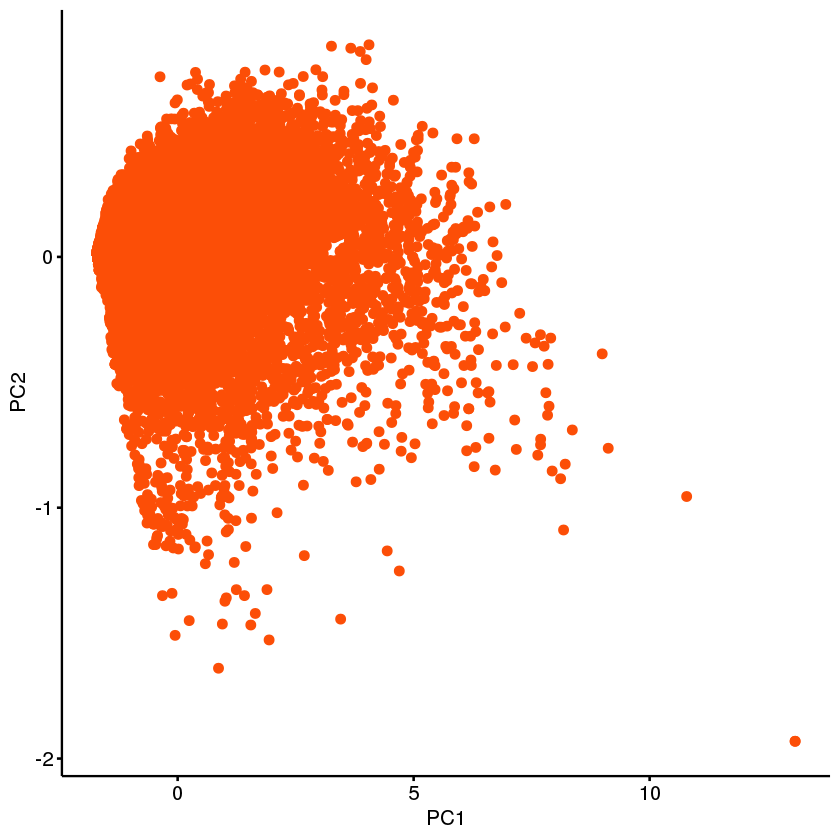

In [33]:
onc_pca_3 <- as.data.frame(pca_res_3$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_3, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_3 <- as.data.frame(pca_res_3$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_3, x = "PC1", y = "PC2",
   color = "#FC4E07")

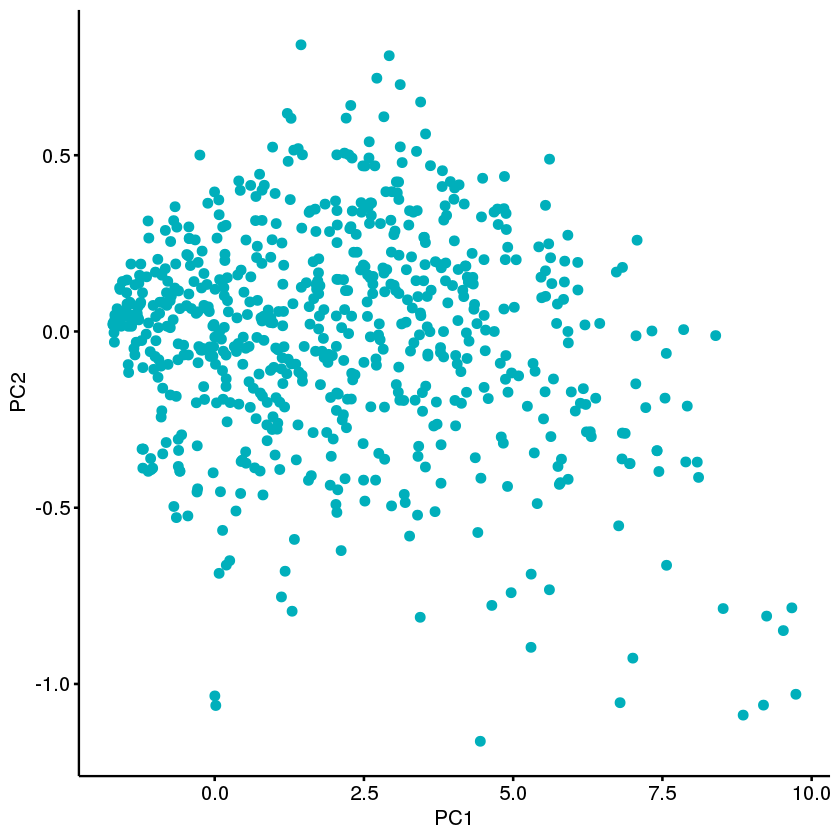

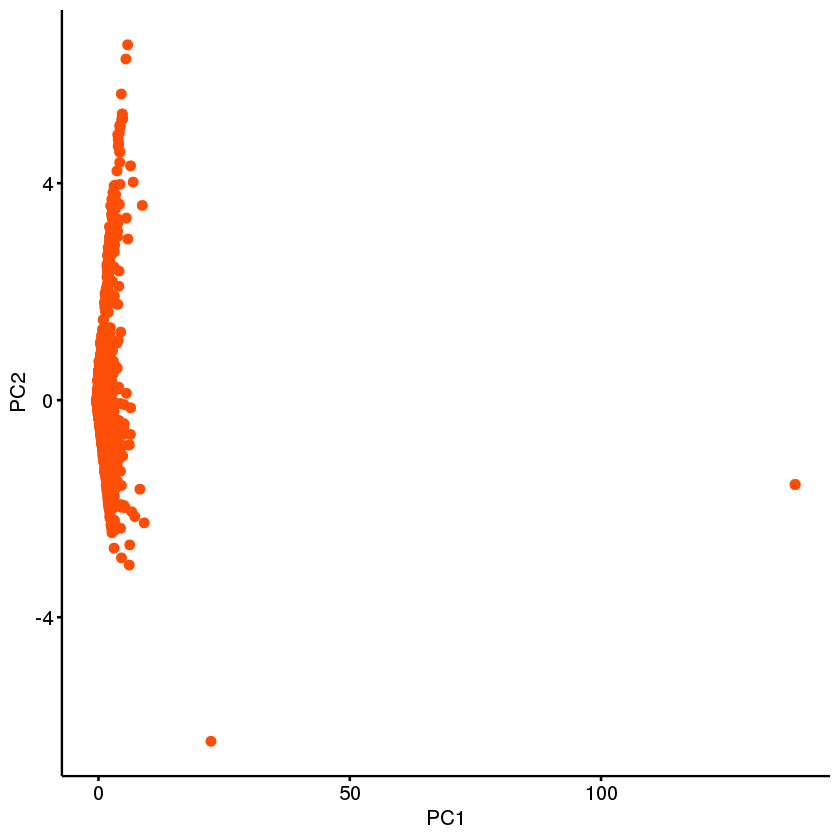

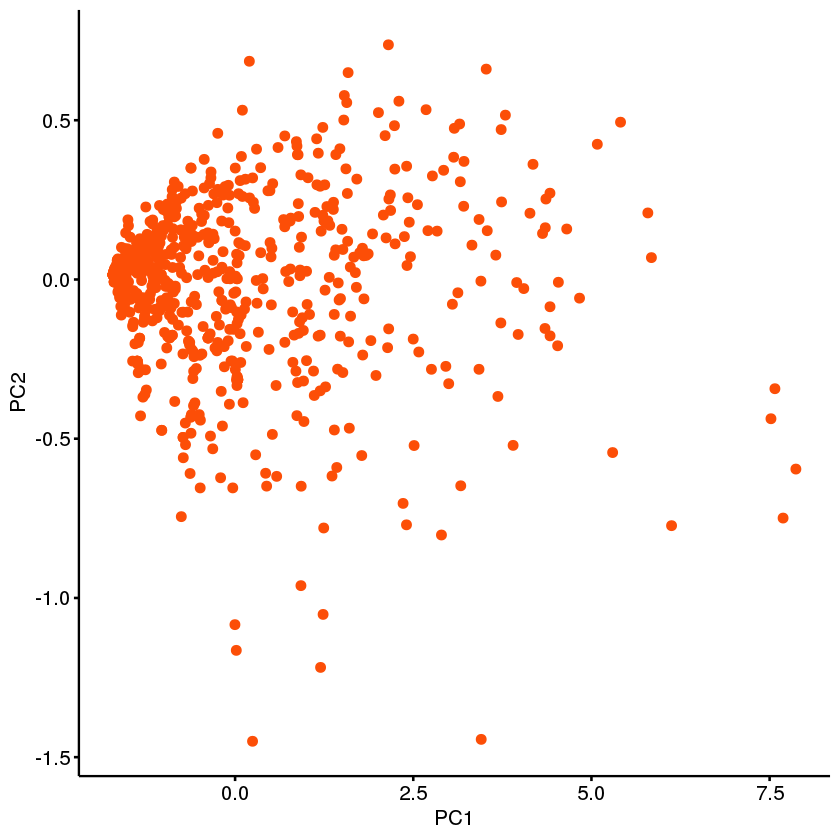

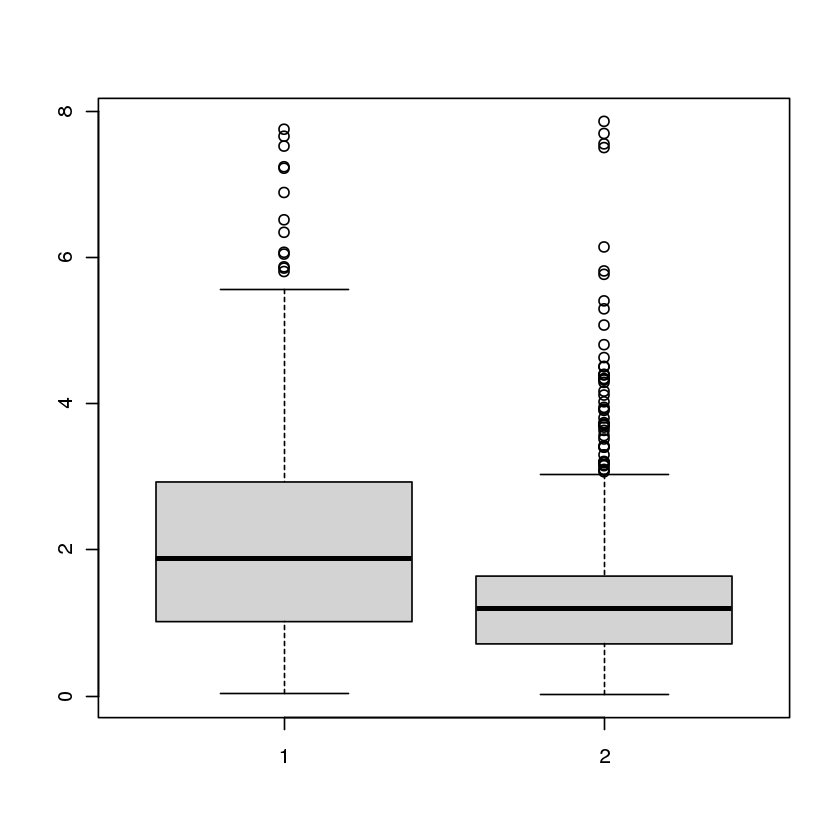

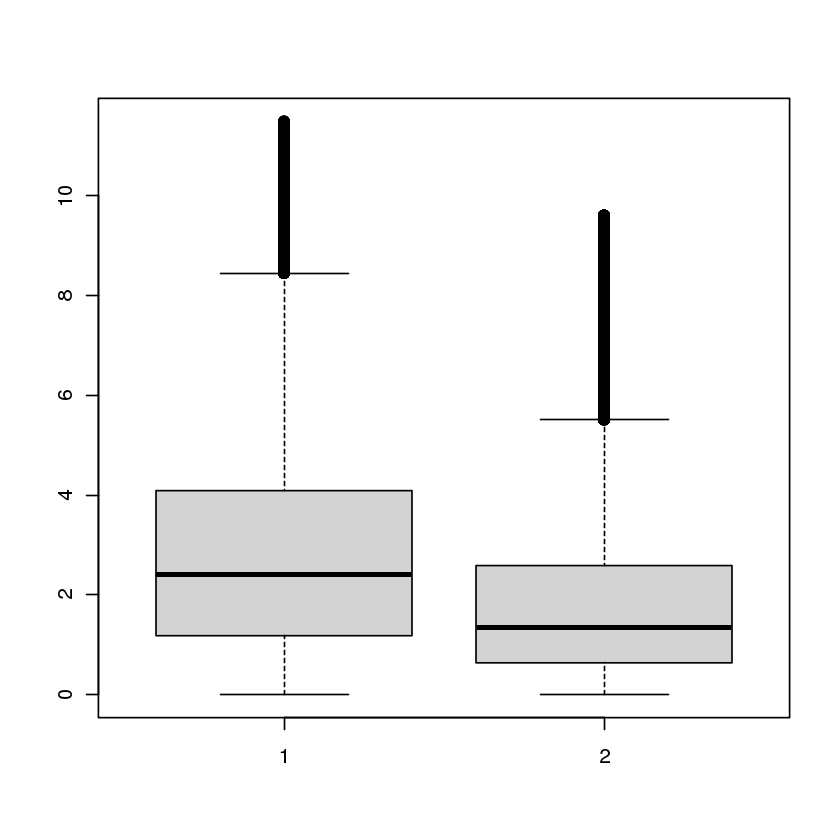

...

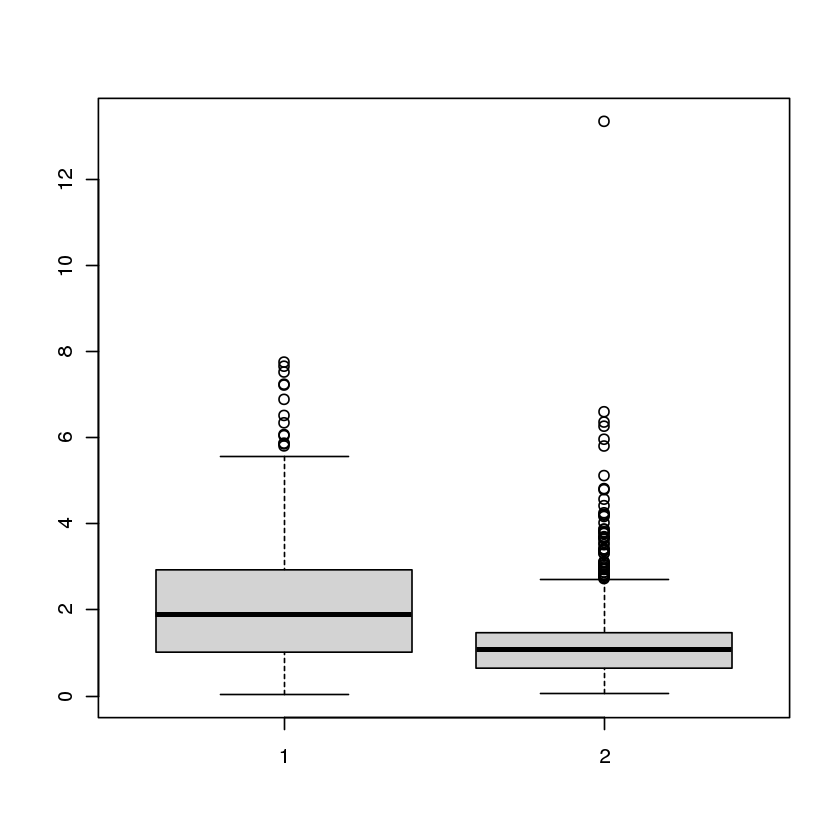

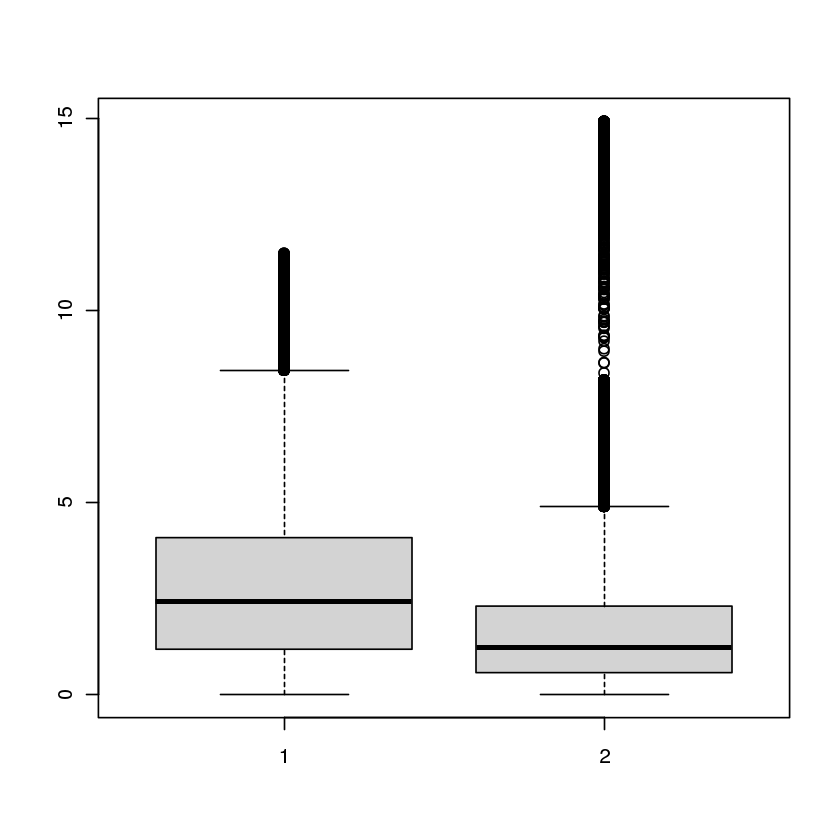

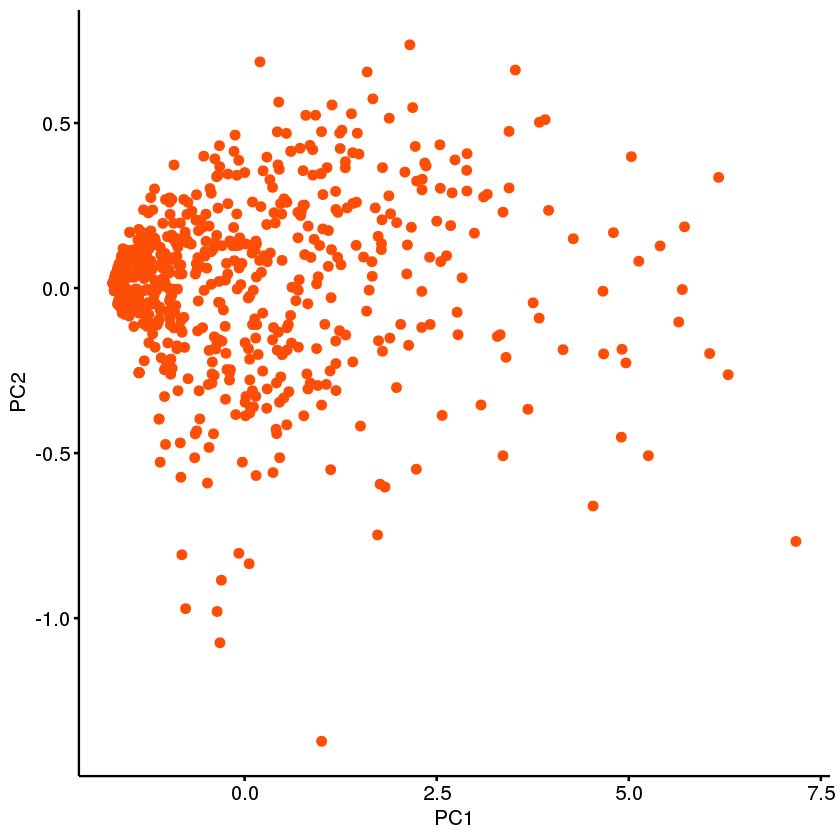

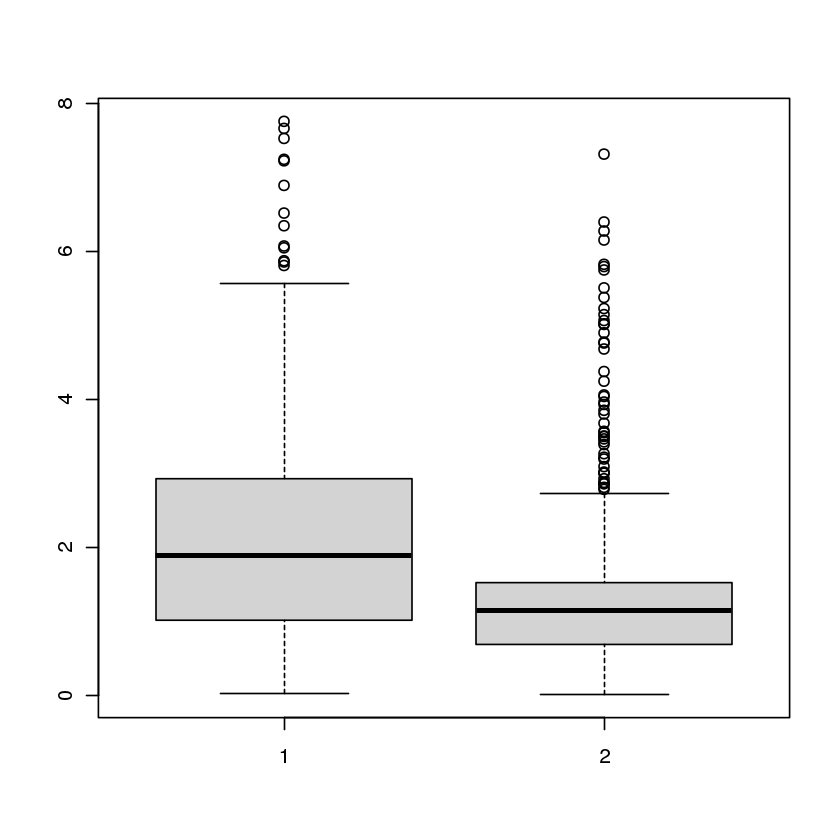

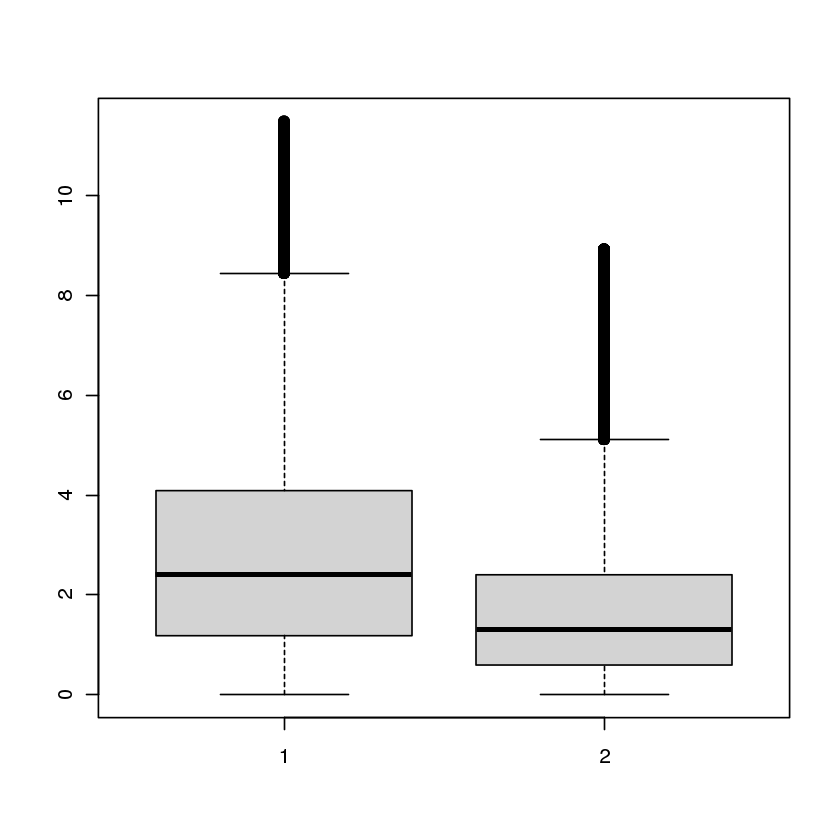

In [41]:
path_3_lists <- get_distance_measures(pca_res_3)

In [ ]:
onco_3_distances <- closeness_measures(onc_pca_3)
nononco_3_distances <- centroid_measures(nononc_pca_3)

In [ ]:
boxplot(onco_3_distances$centroid, nononco_3_distances)
wilcox.test(onco_3_distances$centroid, nononco_3_distances, alternative = "less")

##  SP < 4

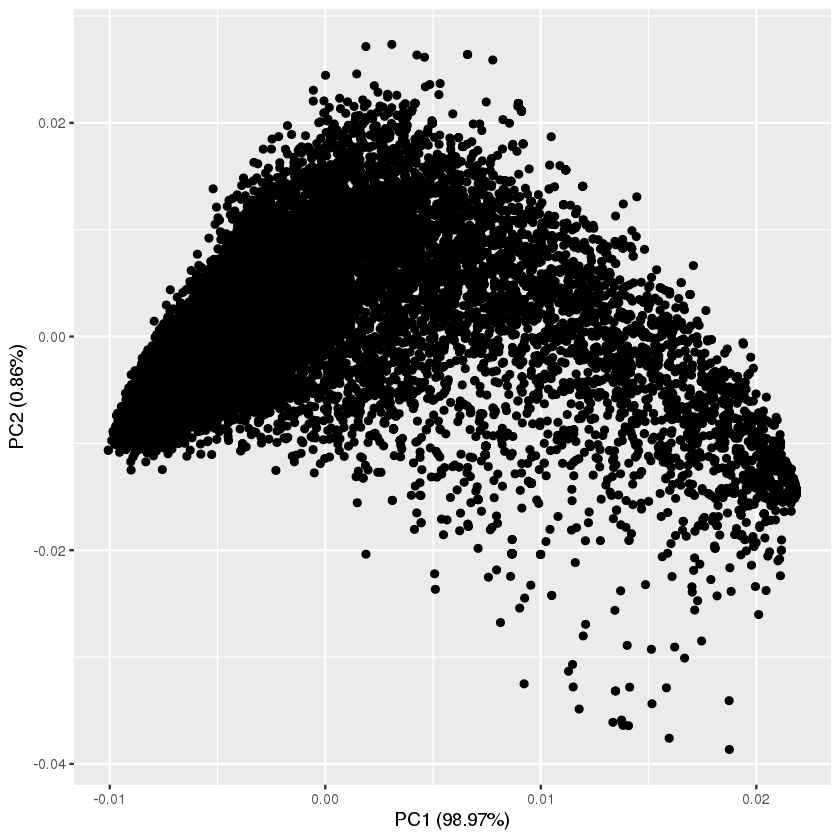

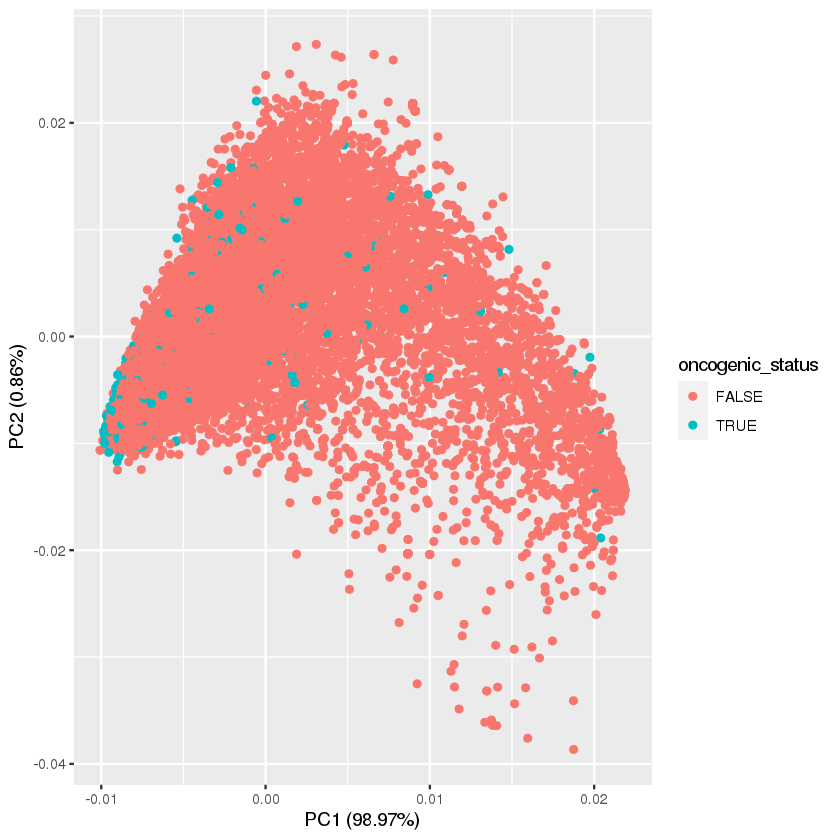

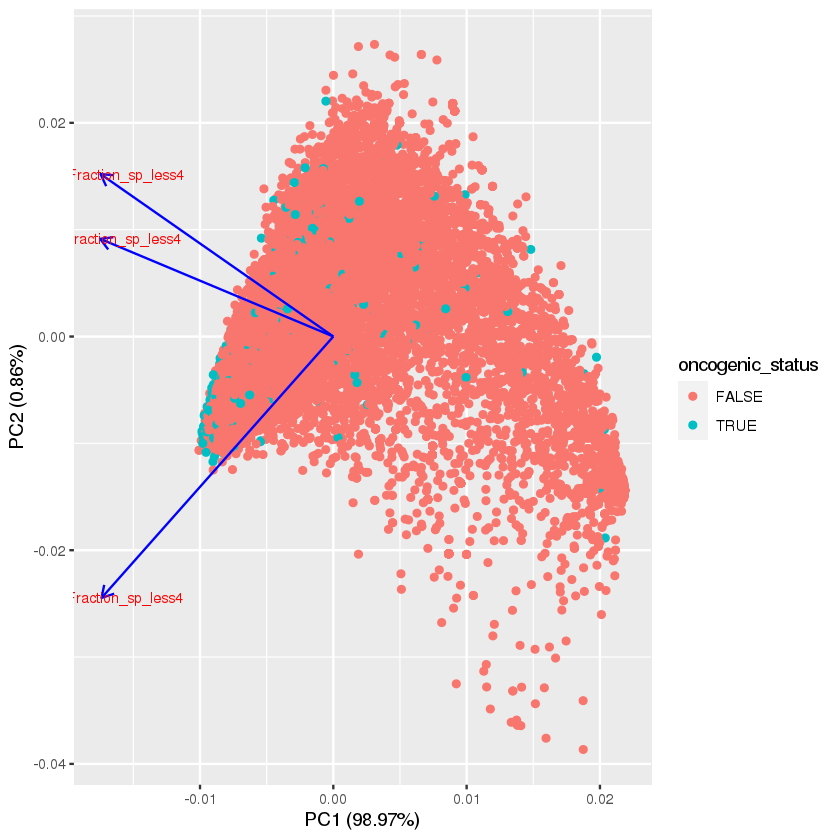

In [86]:
scale4 <- combinedDF[,c('regen_Fraction_sp_less4','wound_Fraction_sp_less4','stress_Fraction_sp_less4')]
pca_res_4 <- prcomp(scale4, scale. = TRUE)
autoplot(pca_res_4)
autoplot(pca_res_4, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_4, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

Using  as id variables



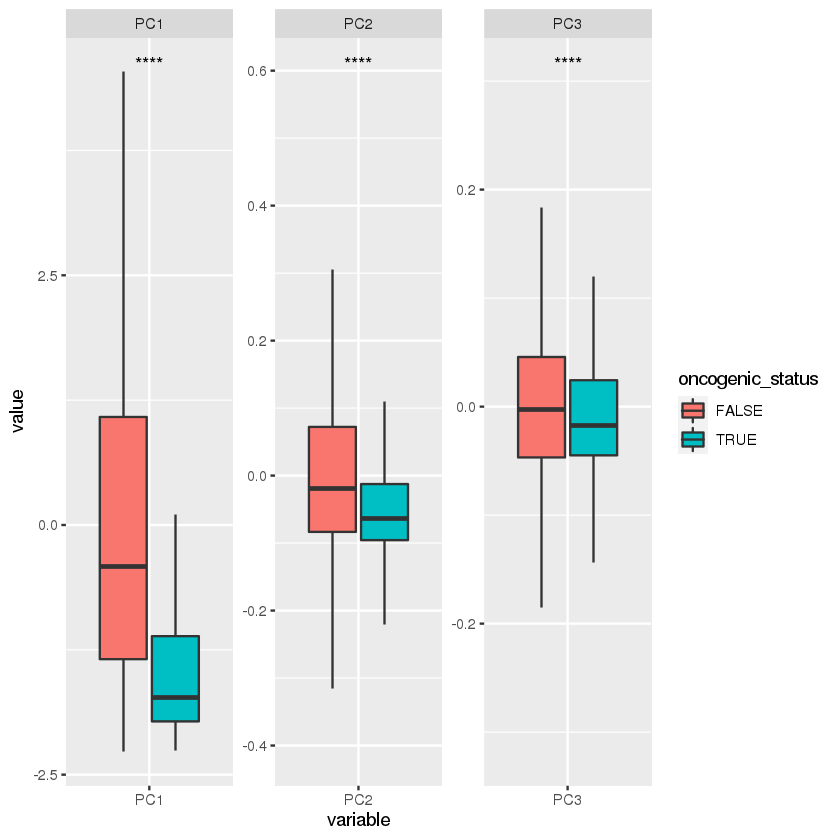

In [87]:
pca_melted_regen4 <- cbind(melt(as.data.frame(pca_res_4$x)), "oncogenic_status" = rep(combinedDF$oncogenic_status, ncol(pca_res_4$x)))

ggplot(pca_melted_human_down4, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



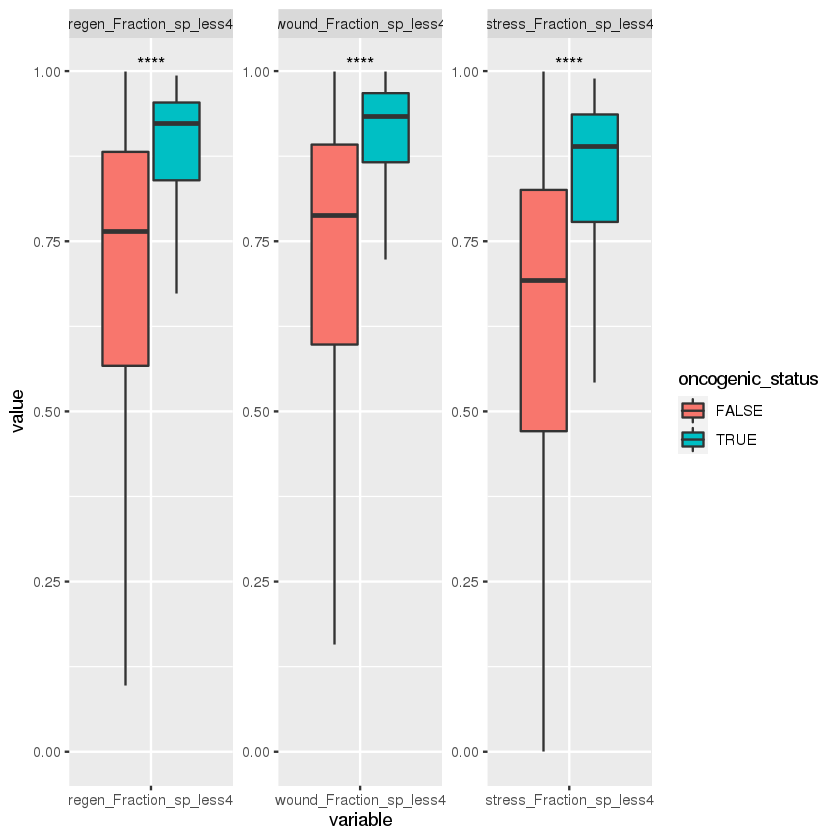

In [88]:
pca_melted_regen4_raw <- cbind(melt(scale4), "oncogenic_status" = rep(combinedDF$oncogenic_status, ncol(scale4)))

ggplot(pca_melted_regen4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

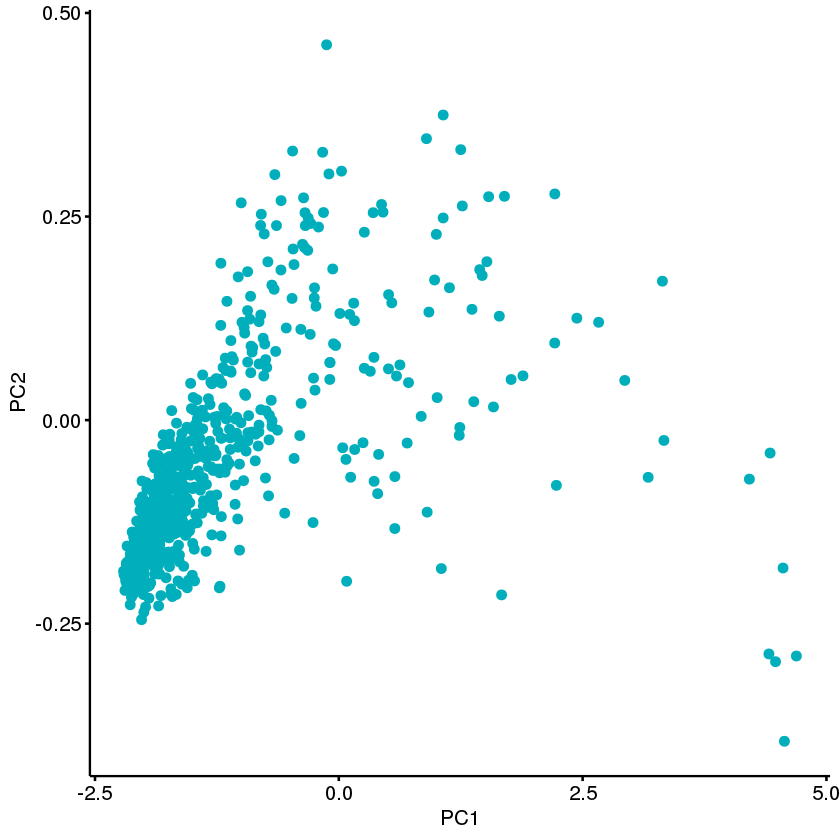

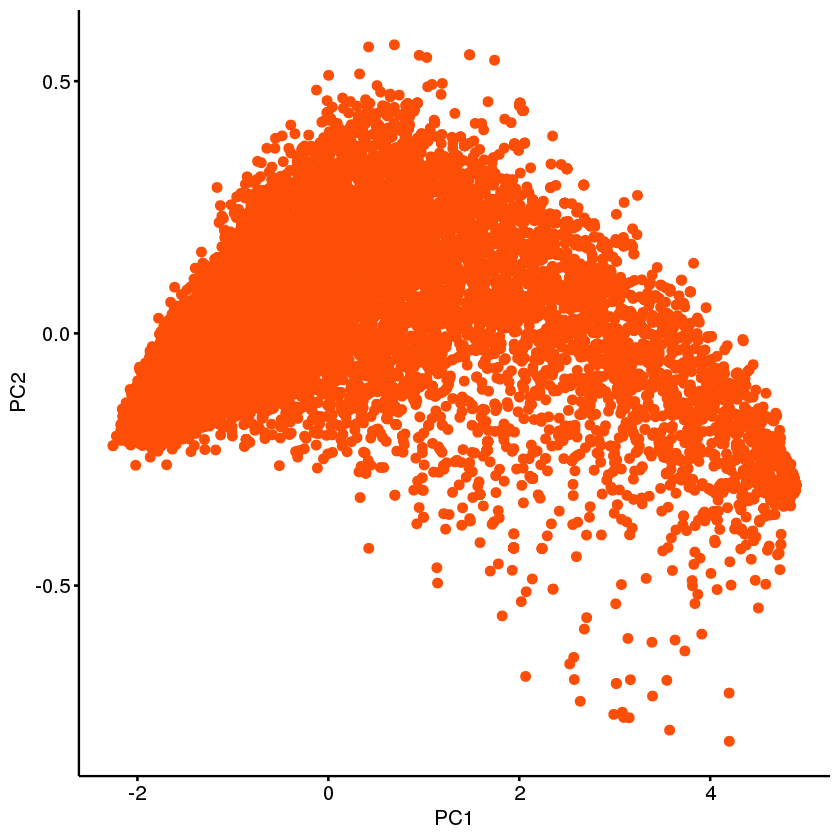

In [35]:
onc_pca_4 <- as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_4, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_4 <- as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_4, x = "PC1", y = "PC2",
   color = "#FC4E07")

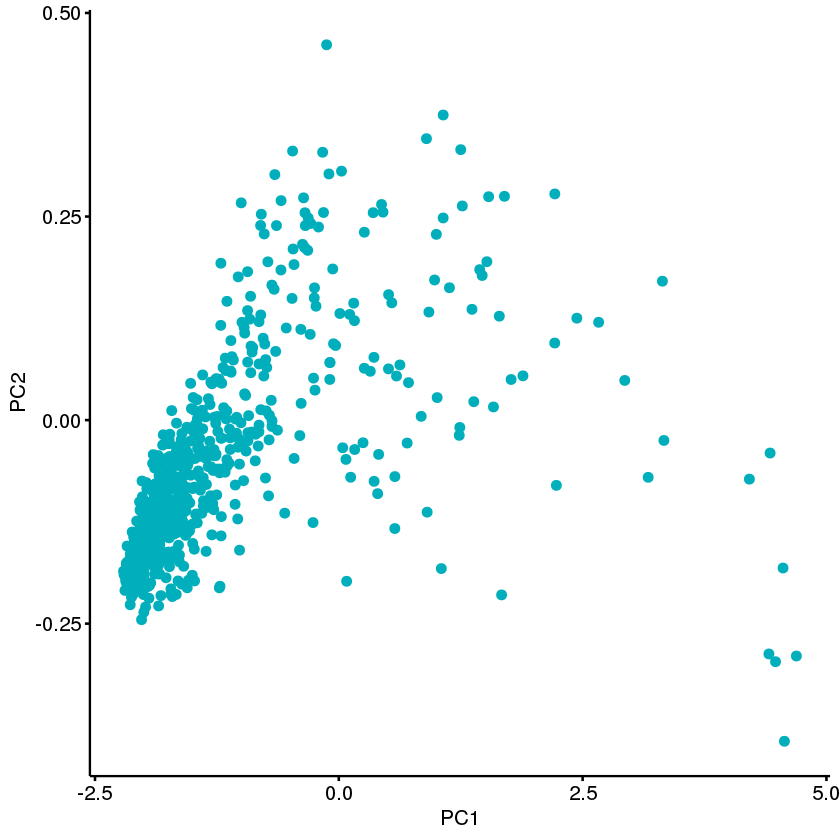

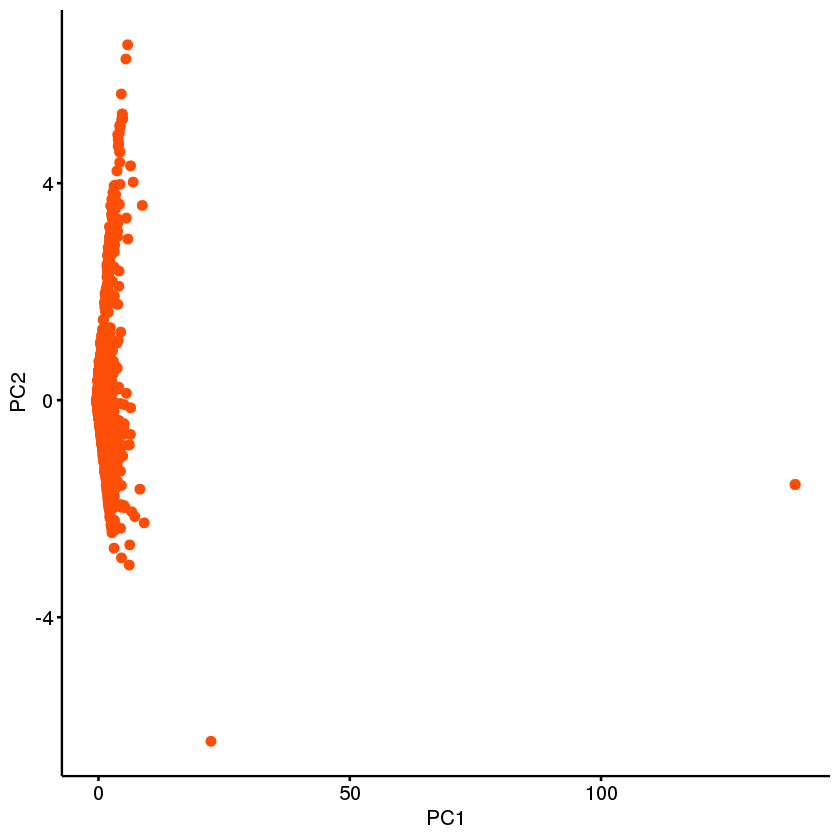

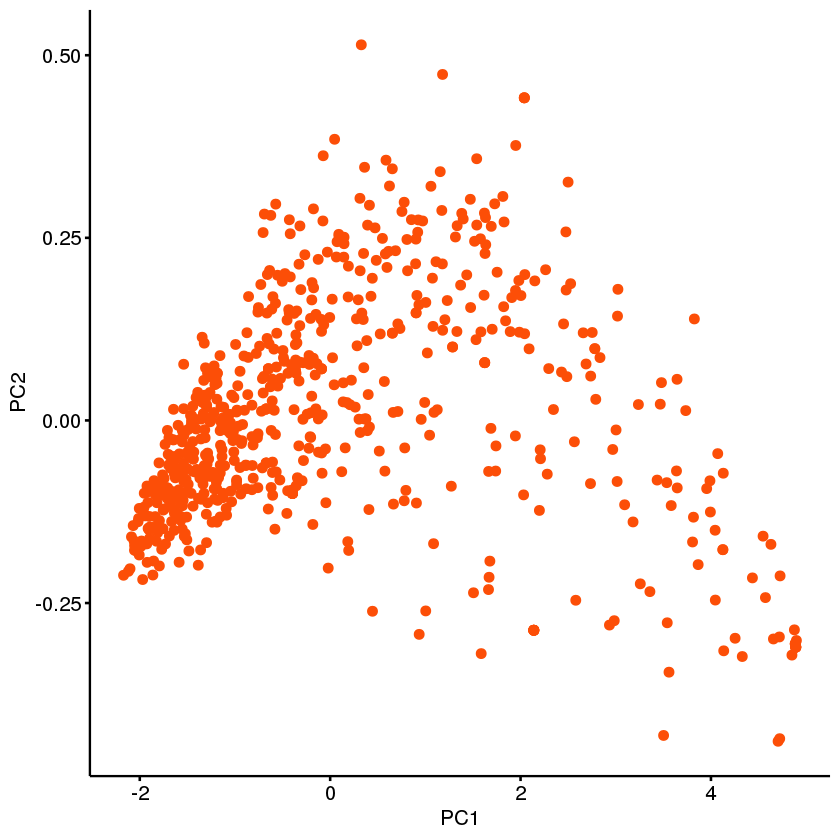

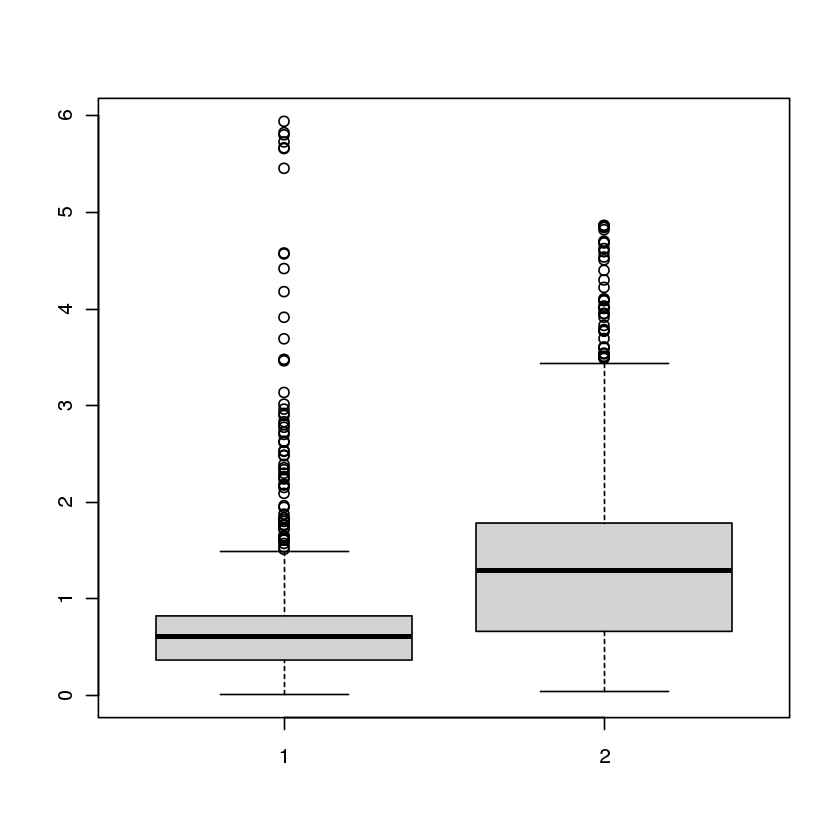

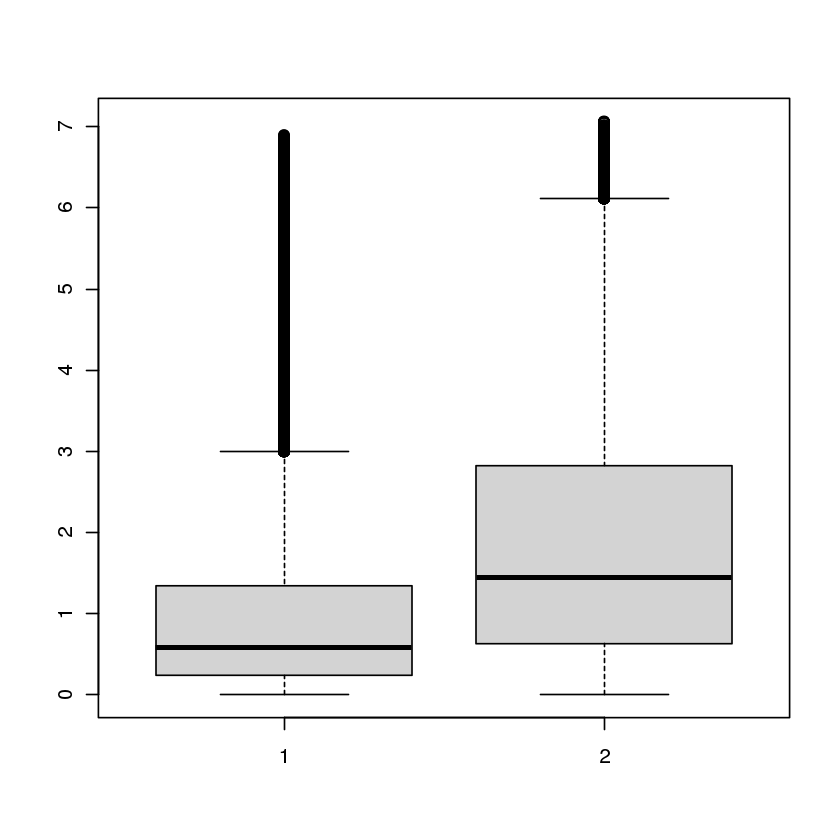

...

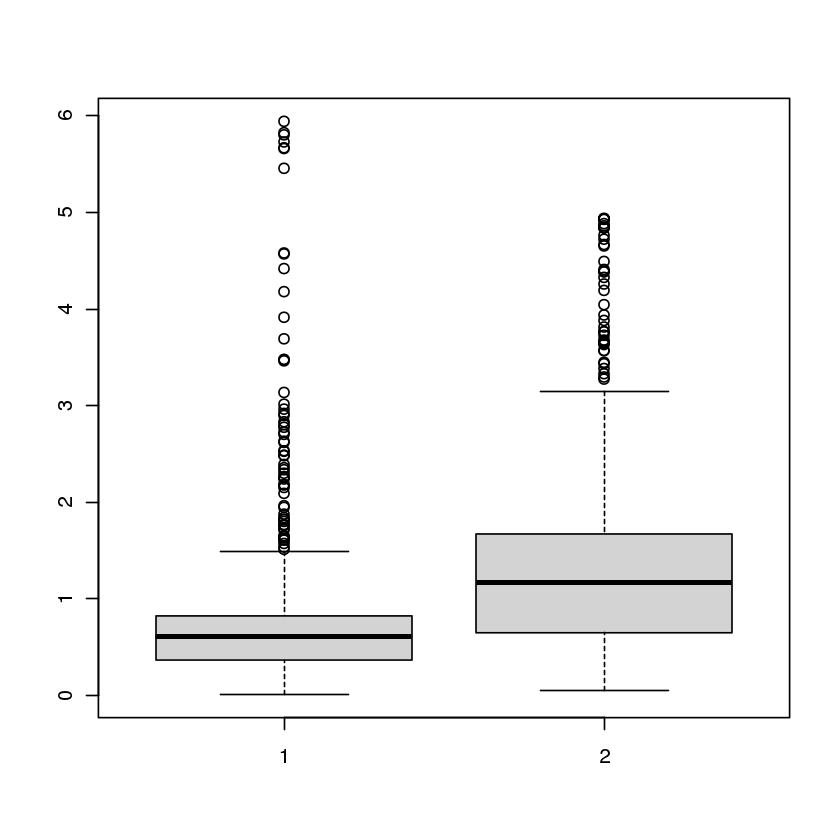

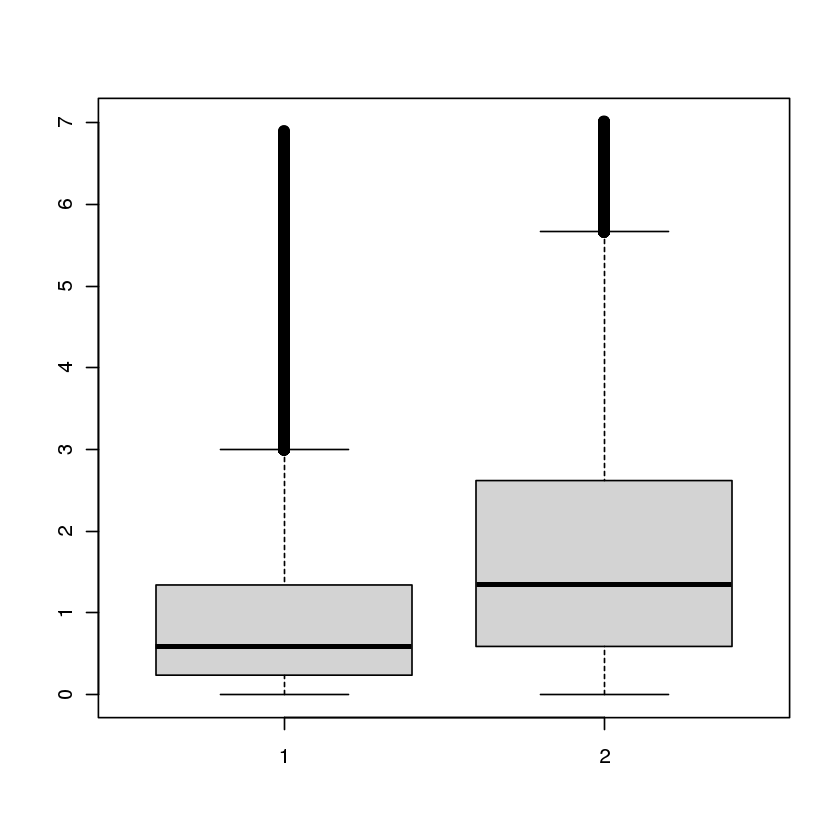

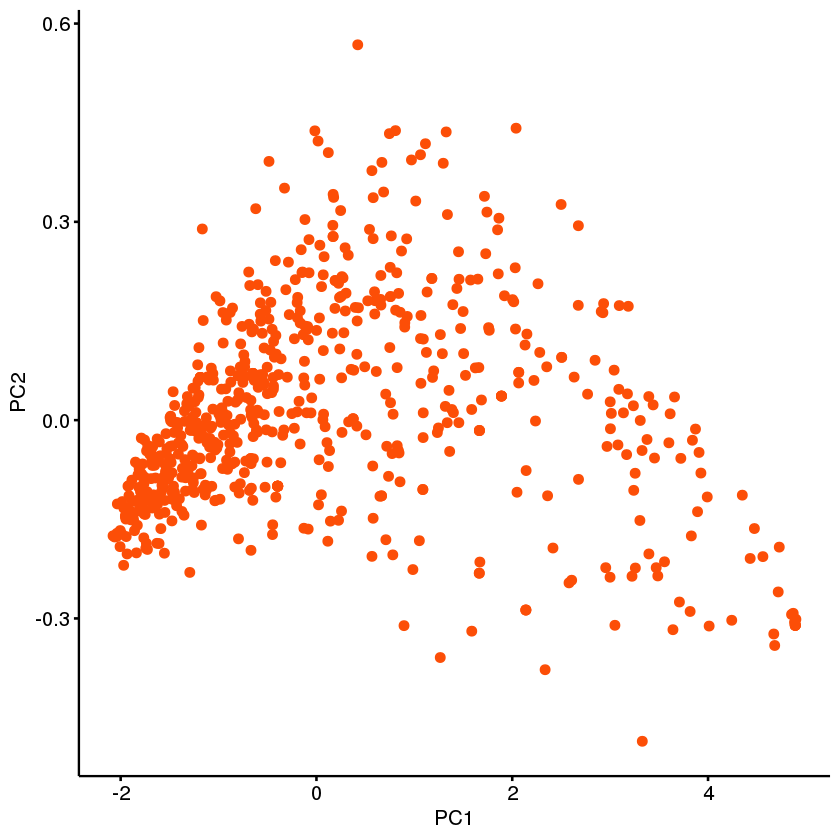

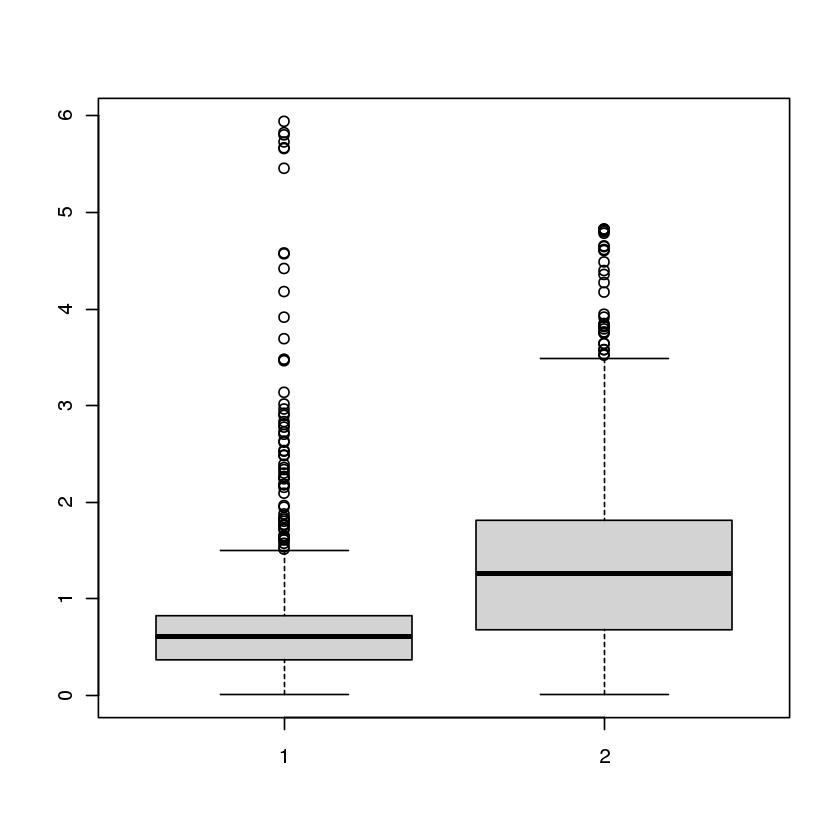

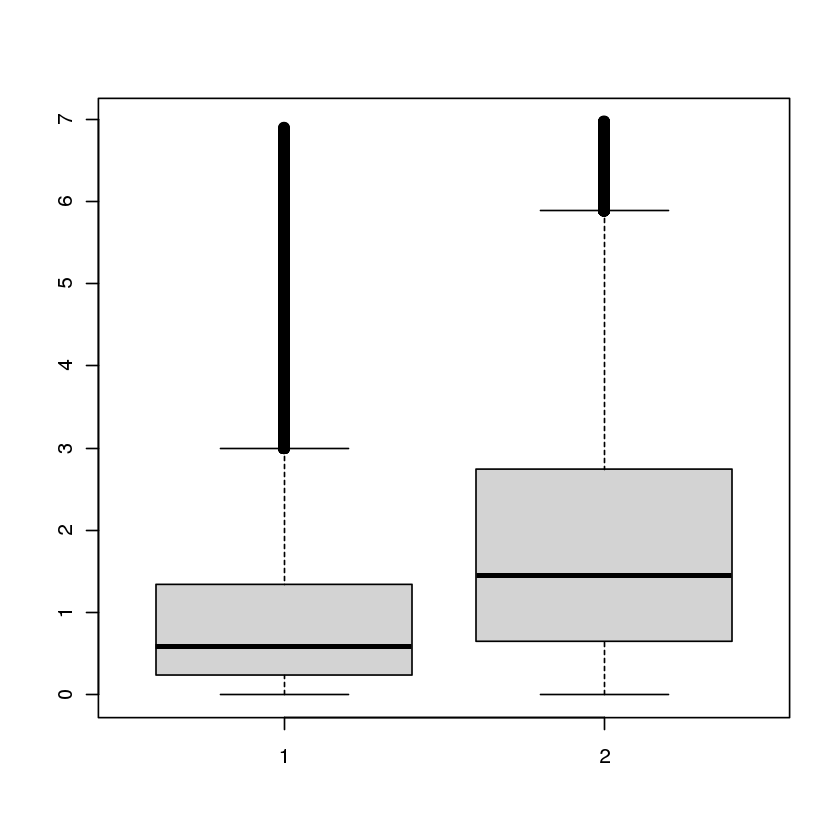

In [42]:
path_4_lists <- get_distance_measures(pca_res_4)

In [52]:
non_onc_centroid <- centroid_measures_GO(as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "TRUE",],
                     as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "FALSE",])

onc_centroid <- centroid_measures_GO(as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "TRUE",],
                     as.data.frame(pca_res_4$x)[combinedDF$oncogenic_status == "TRUE",])

In [56]:
length(non_onc_centroid)
length(onc_centroid)

[1] 16223

[1] 677

In [63]:
centroid_measure_no <-  cbind(combinedDF[combinedDF$oncogenic_status == "FALSE",], non_onc_centroid)
centroid_measure_o <-  cbind(combinedDF[combinedDF$oncogenic_status == "TRUE",], onc_centroid)

go_100_onc <- centroid_measure_o[order(centroid_measure_o$onc_centroid, decreasing =F),]$gene_regen[1:100]

go1000_non<- centroid_measure_no[order(centroid_measure_no$non_onc_centroid, decreasing =F),]$gene_regen[1:1000]

In [64]:
fileConn <- file("clustered_onc_genes.txt")    
writeLines(go_100_onc, fileConn)    
close(fileConn)

fileConn <- file("clustered_nononc_genes.txt")    
writeLines(go1000_non, fileConn)    
close(fileConn)

In [114]:
onco_4_distances <- closeness_measures(onc_pca_4)
nononco_4_distances <- centroid_measures(nononc_pca_4)


	Wilcoxon rank sum test with continuity correction

data:  onco_4_distances$centroid and nononco_4_distances
W = 201224, p-value < 2.2e-16
alternative hypothesis: true location shift is less than 0


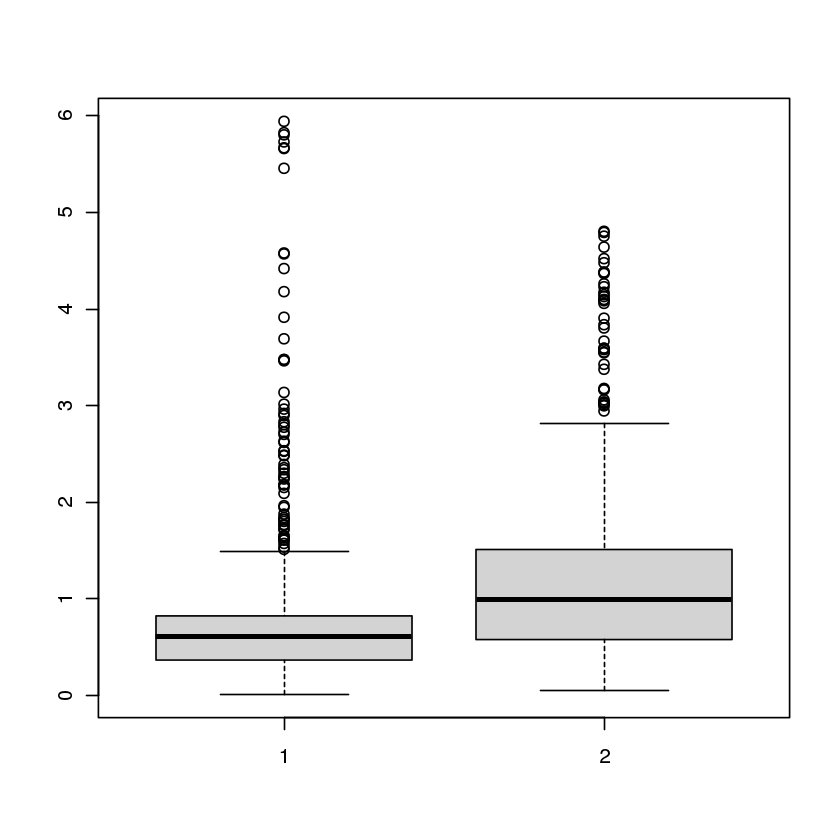

In [121]:
boxplot(onco_4_distances$centroid, nononco_4_distances)
wilcox.test(onco_4_distances$centroid, nononco_4_distances, alternative = "less")

## Regen  fractions

In [126]:
colnames(combinedDF)

[1] "gene_regen"               "regen_Fraction_sp_0"     
 [3] "regen_Fraction_sp_1"      "regen_Fraction_sp_less2" 
 [5] "regen_Fraction_sp_less3"  "regen_Fraction_sp_less4" 
 [7] "gene_wound"               "wound_Fraction_sp_0"     
 [9] "wound_Fraction_sp_1"      "wound_Fraction_sp_less2" 
[11] "wound_Fraction_sp_less3"  "wound_Fraction_sp_less4" 
[13] "gene_stress"              "stress_Fraction_sp_0"    
[15] "stress_Fraction_sp_1"     "stress_Fraction_sp_less2"
[17] "stress_Fraction_sp_less3" "stress_Fraction_sp_less4"
[19] "oncogenic_status"

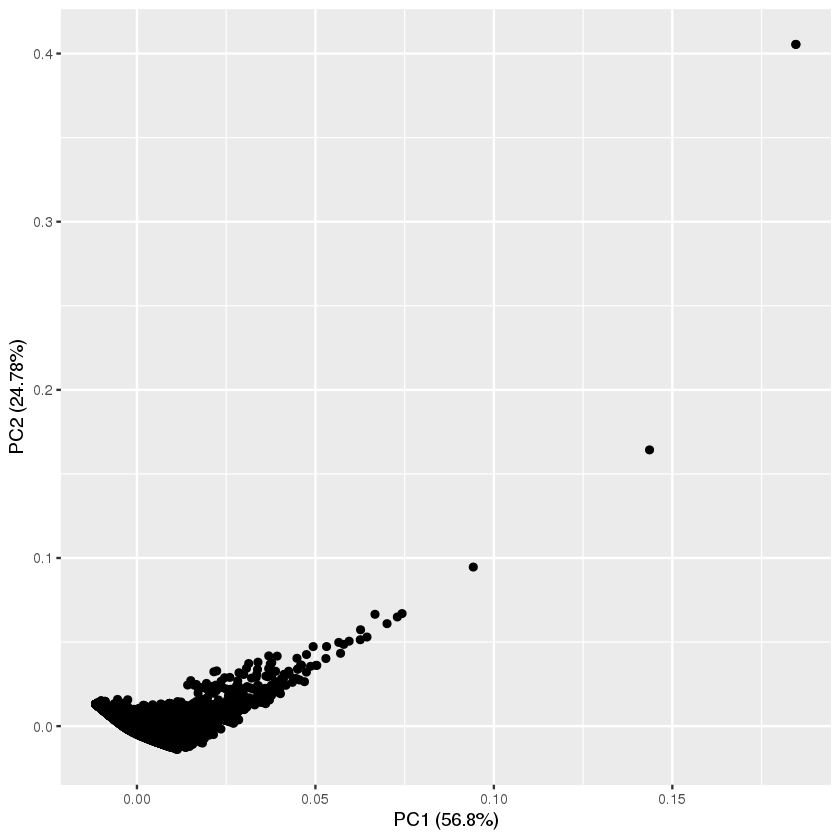

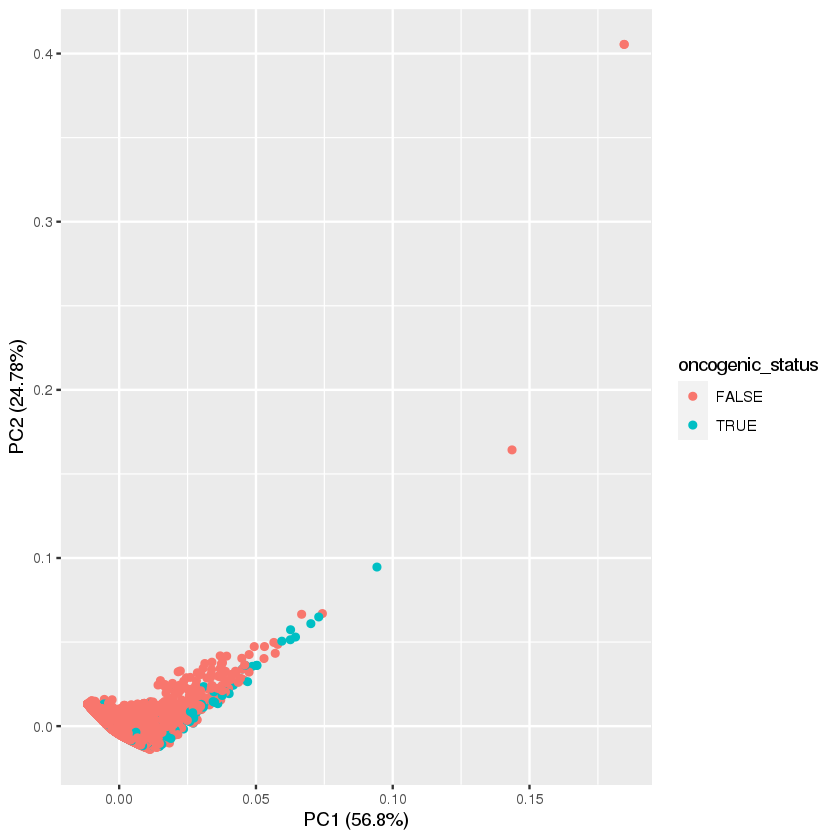

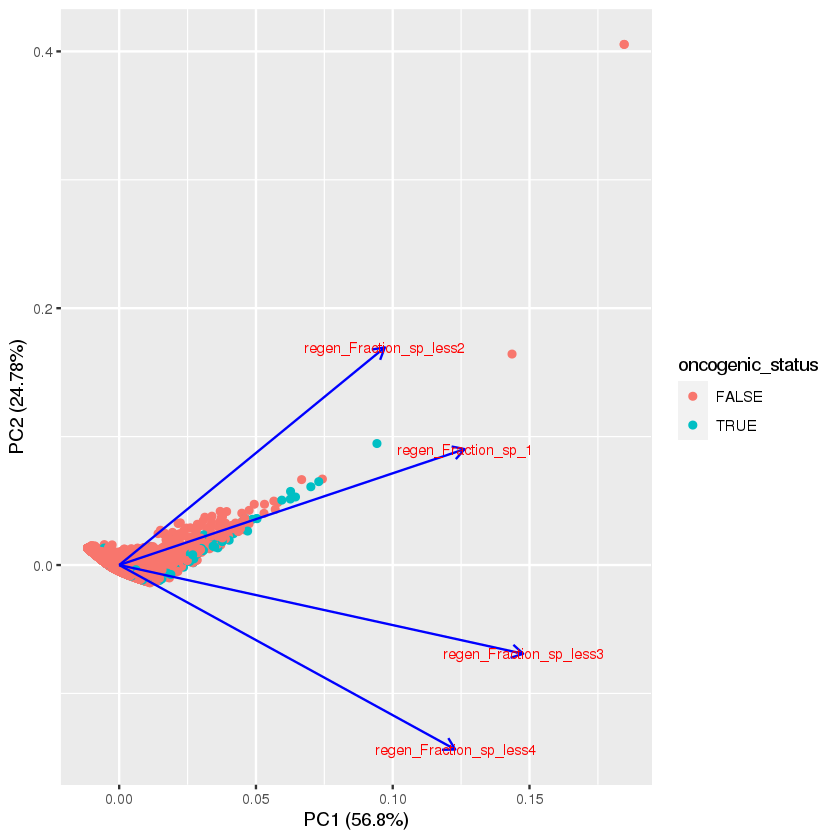

In [65]:
scale_regen <- combinedDF[,c('regen_Fraction_sp_1','regen_Fraction_sp_less2','regen_Fraction_sp_less3','regen_Fraction_sp_less4')]
pca_res_regen <- prcomp(scale_regen, scale. = TRUE)
autoplot(pca_res_regen)
autoplot(pca_res_regen, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_regen, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

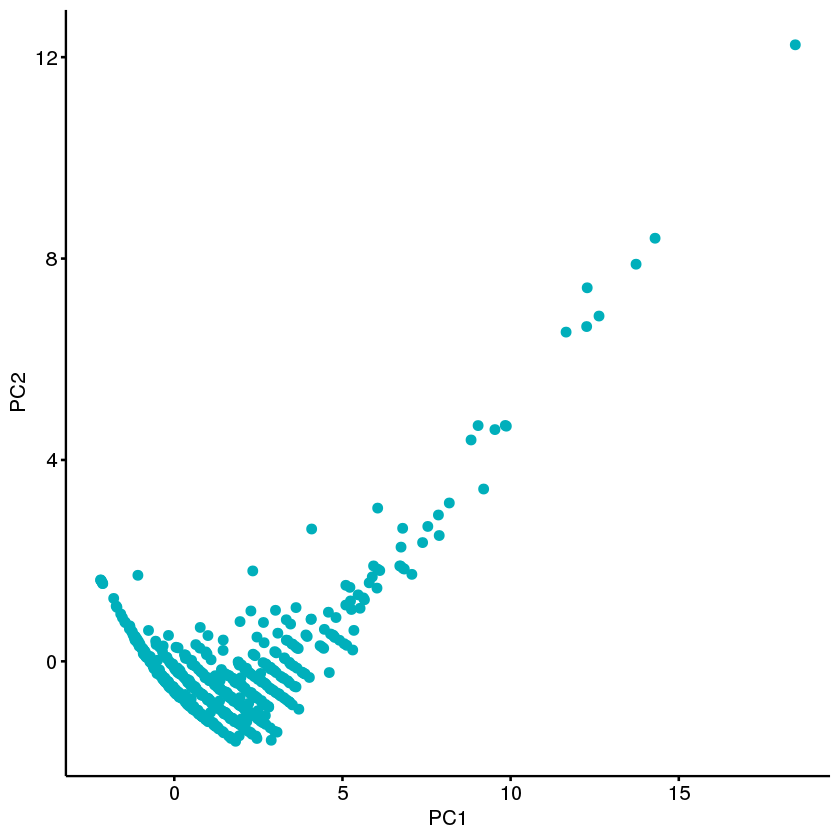

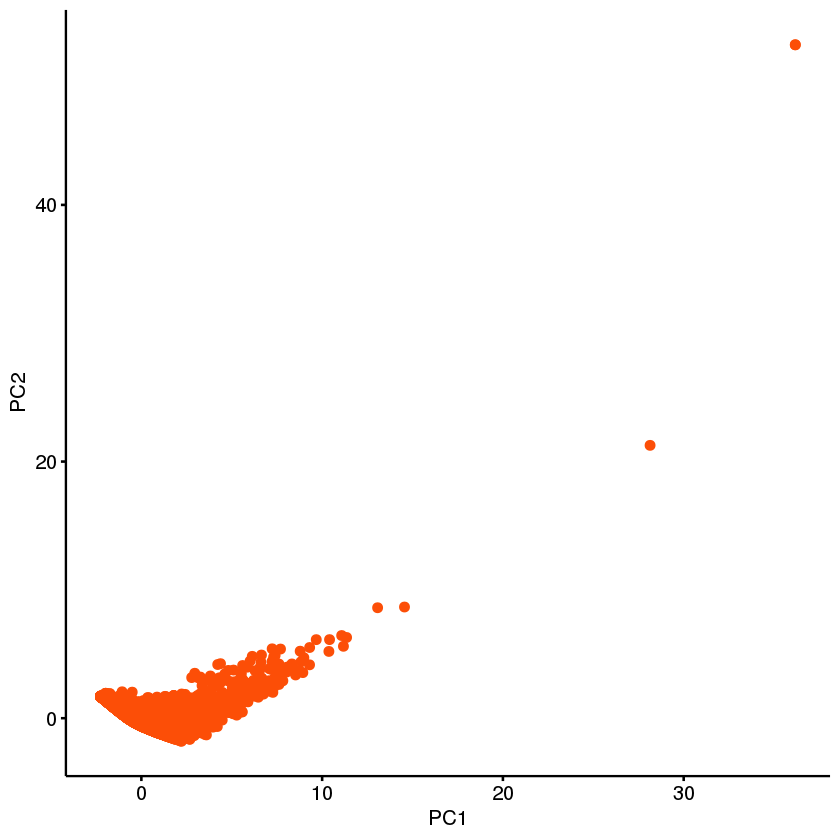

In [66]:
onc_pca_regen <- as.data.frame(pca_res_regen$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_regen, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_regen <- as.data.frame(pca_res_regen$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_regen, x = "PC1", y = "PC2",
   color = "#FC4E07")

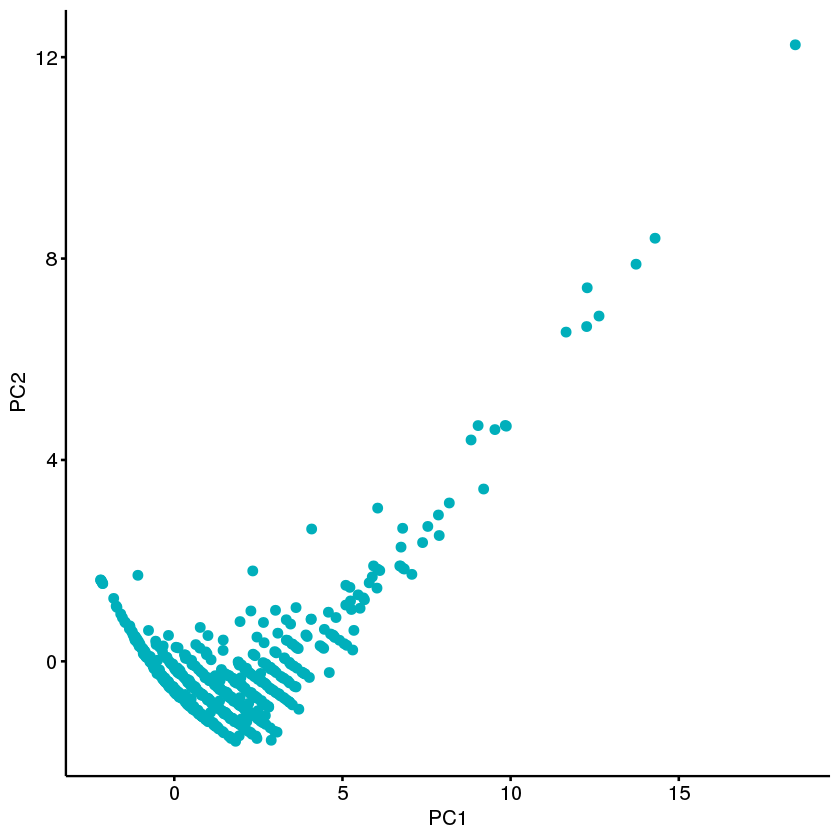

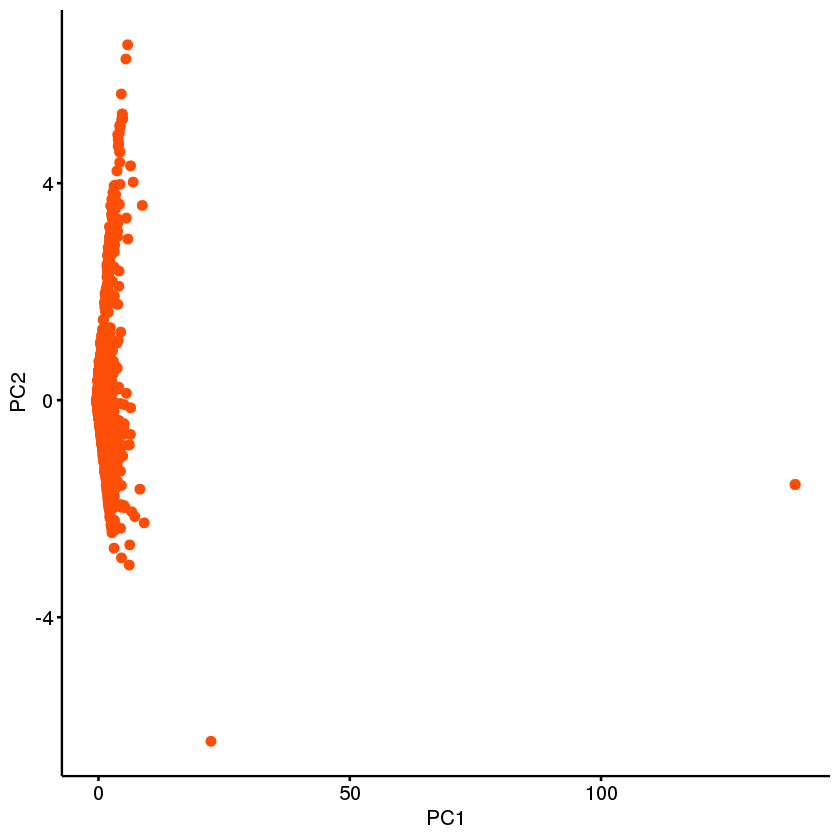

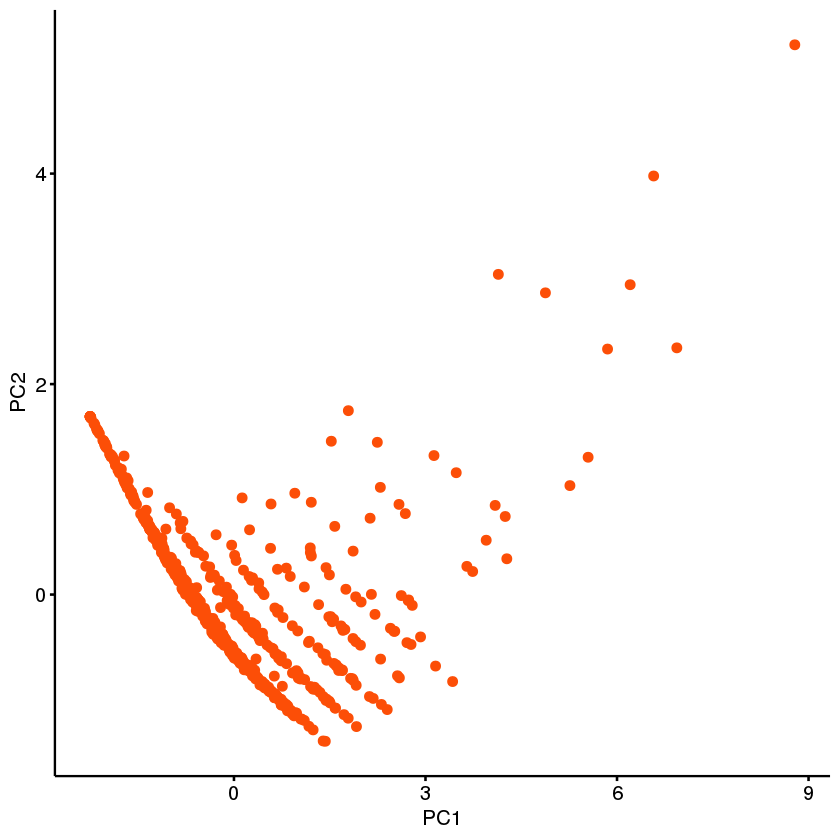

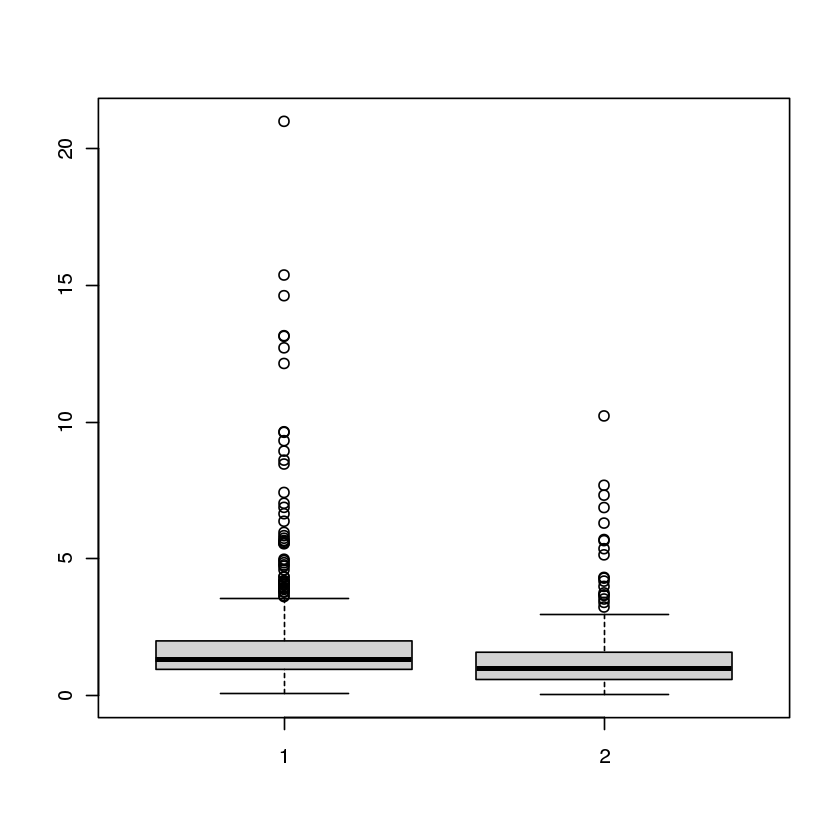

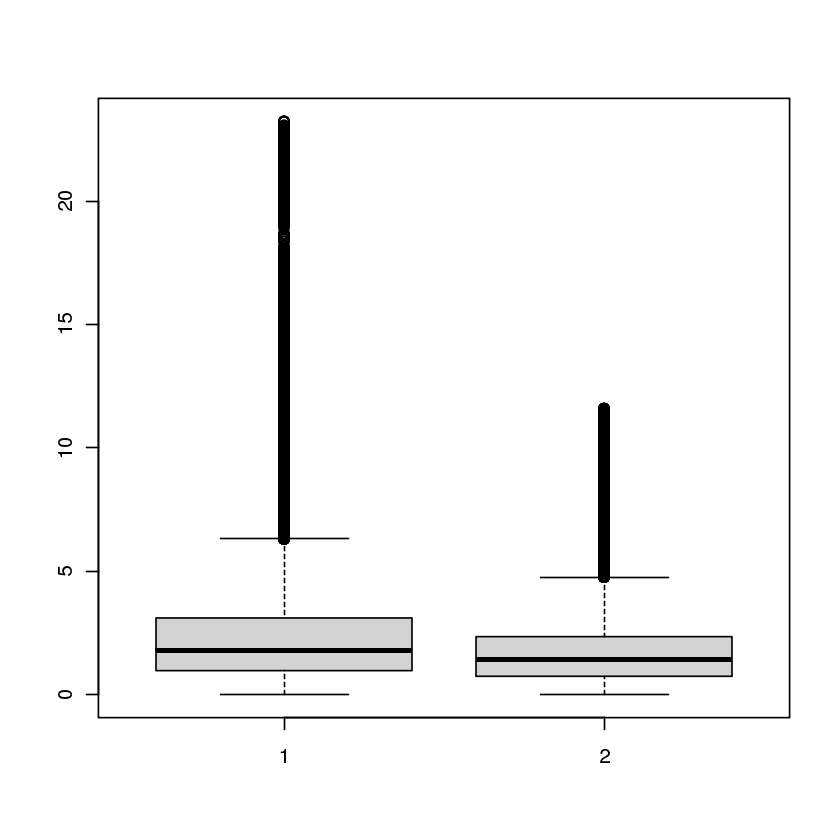

...

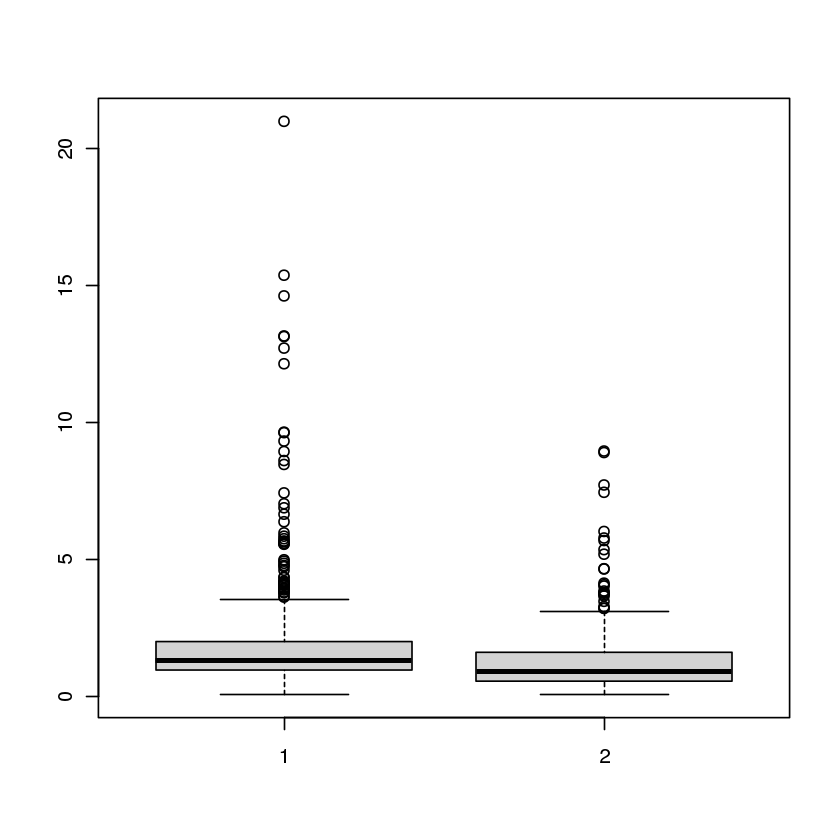

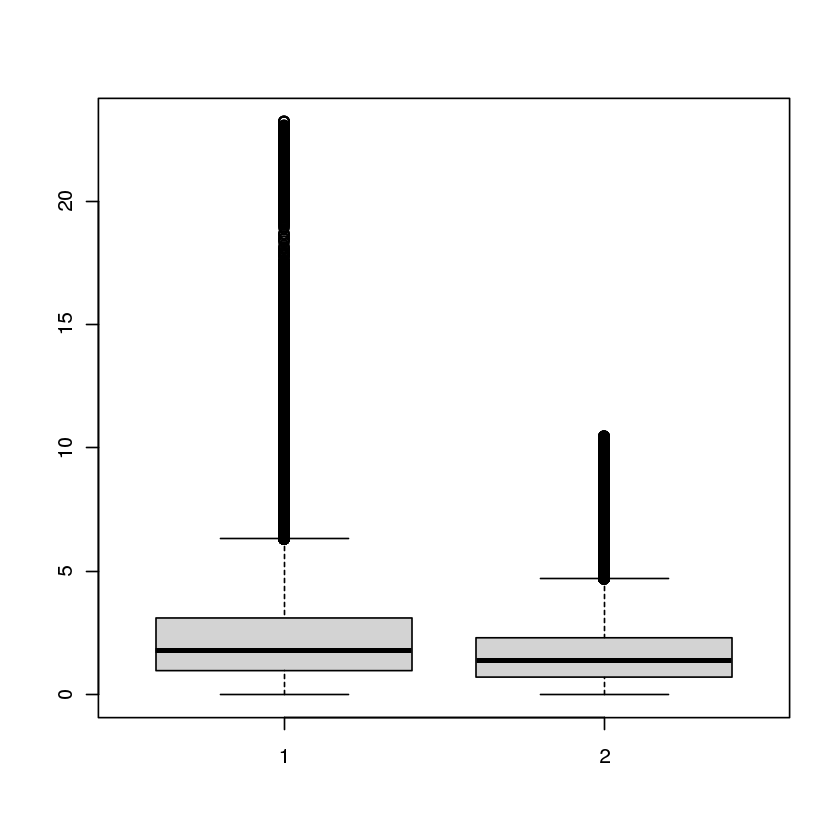

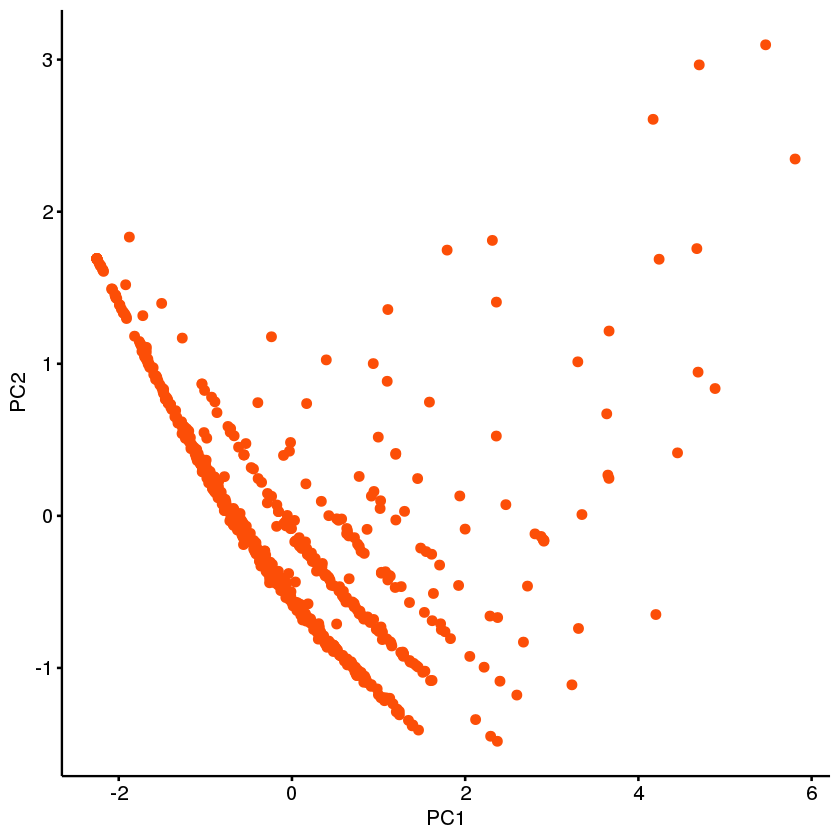

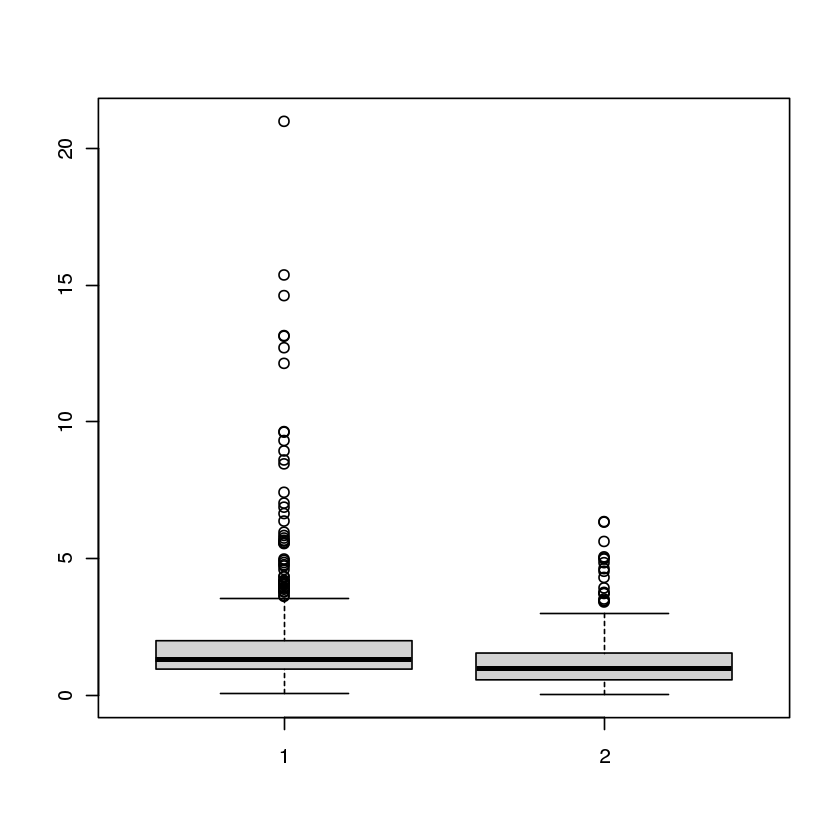

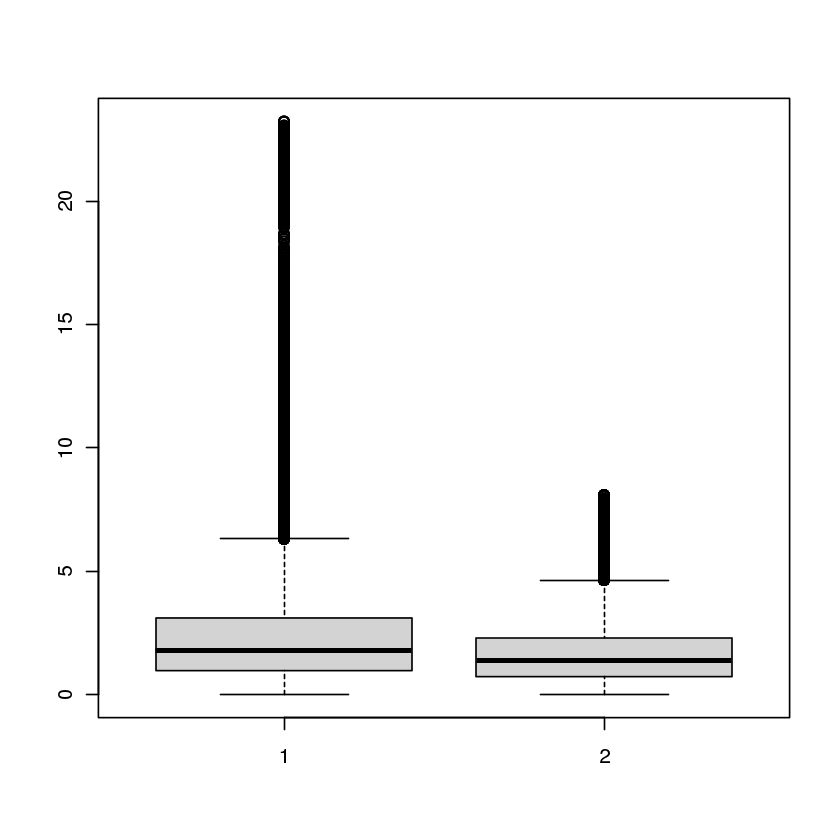

In [67]:
path_regen_lists <- get_distance_measures(pca_res_regen)

In [145]:
onc_pca_regen_distances <- closeness_measures(onc_pca_regen)
nononc_pca_regen_distances <- centroid_measures(nononc_pca_regen)


	Wilcoxon rank sum test with continuity correction

data:  onc_pca_regen_distances$centroid and nononc_pca_regen_distances
W = 506642, p-value = 1
alternative hypothesis: true location shift is less than 0


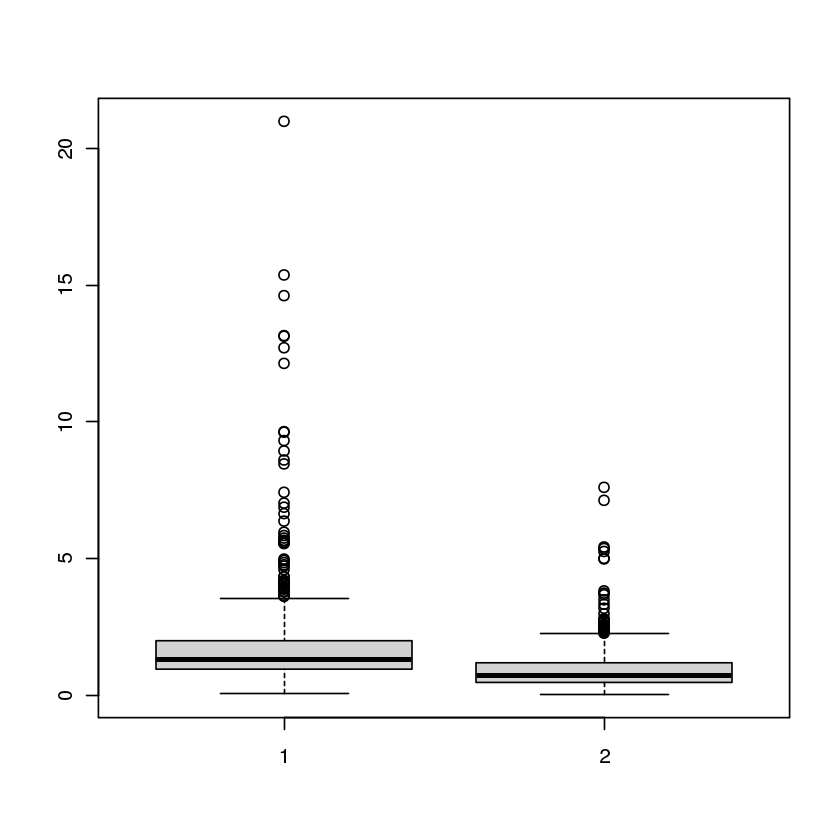

In [146]:
boxplot(onc_pca_regen_distances$centroid, nononc_pca_regen_distances)
wilcox.test(onc_pca_regen_distances$centroid, nononc_pca_regen_distances, alternative = "less")

## Wound  fractions

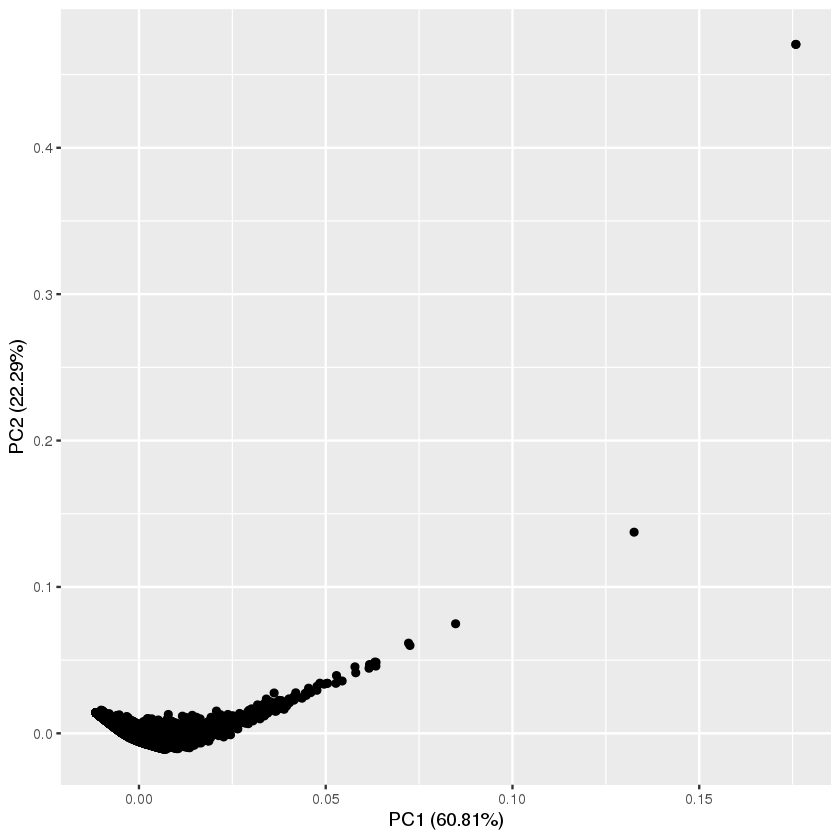

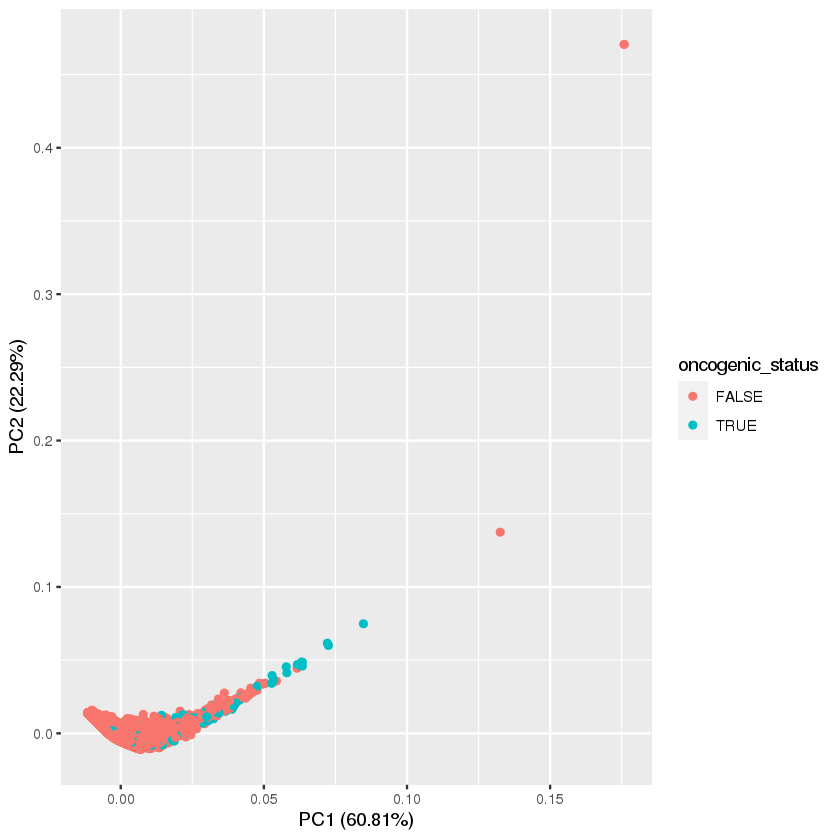

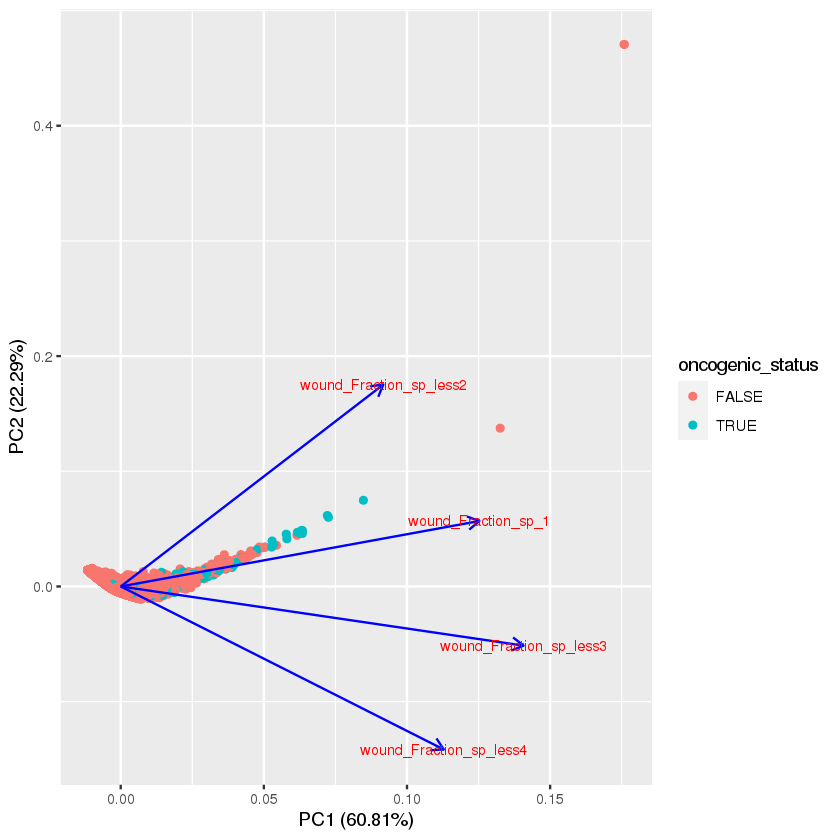

In [68]:
scale_wound <- combinedDF[,c('wound_Fraction_sp_1','wound_Fraction_sp_less2','wound_Fraction_sp_less3','wound_Fraction_sp_less4')]
pca_res_wound <- prcomp(scale_wound, scale. = TRUE)
autoplot(pca_res_wound)
autoplot(pca_res_wound, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_wound, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

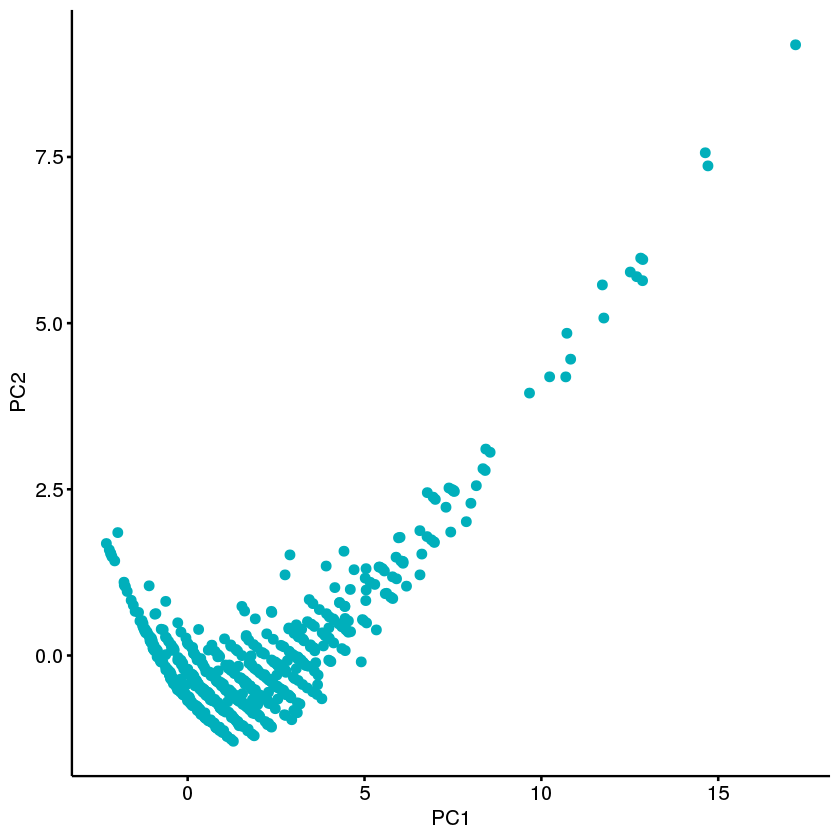

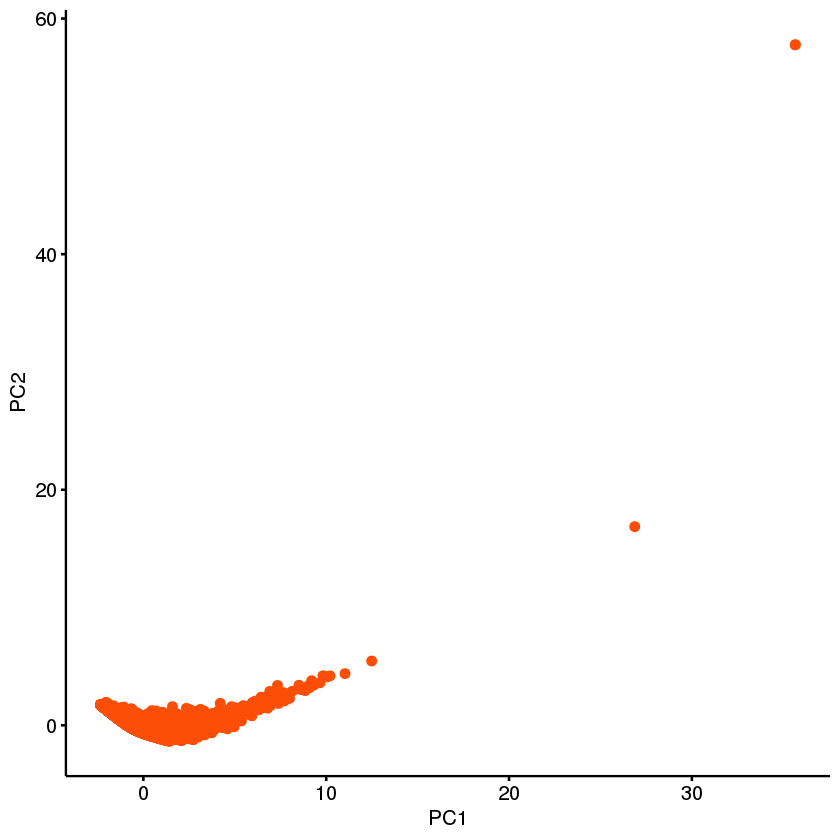

In [69]:
onc_pca_wound <- as.data.frame(pca_res_wound$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_wound, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_wound <- as.data.frame(pca_res_wound$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_wound, x = "PC1", y = "PC2",
   color = "#FC4E07")

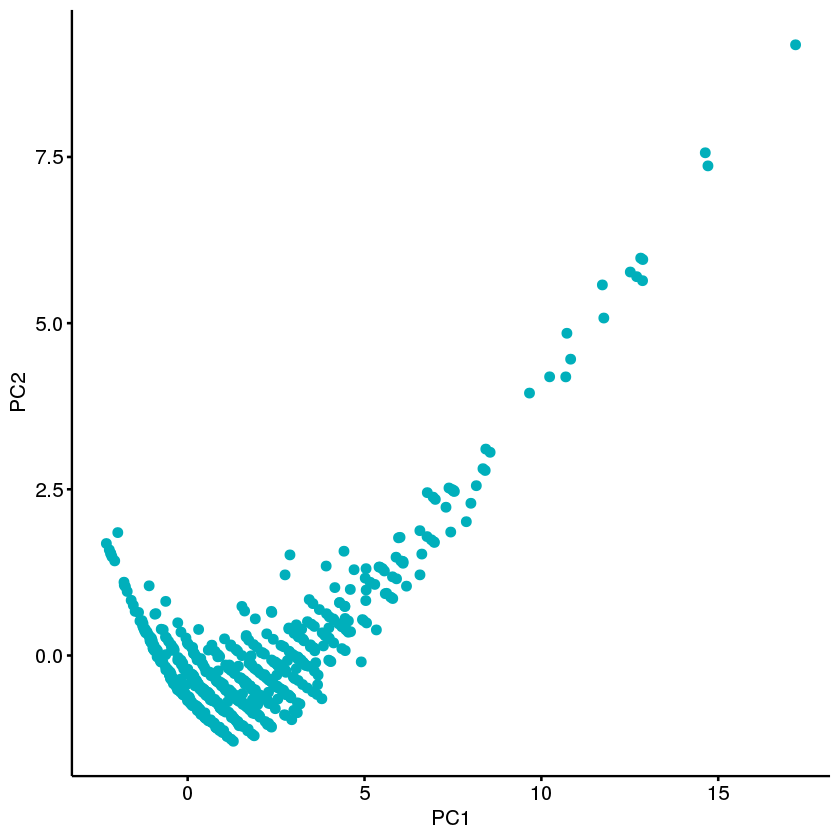

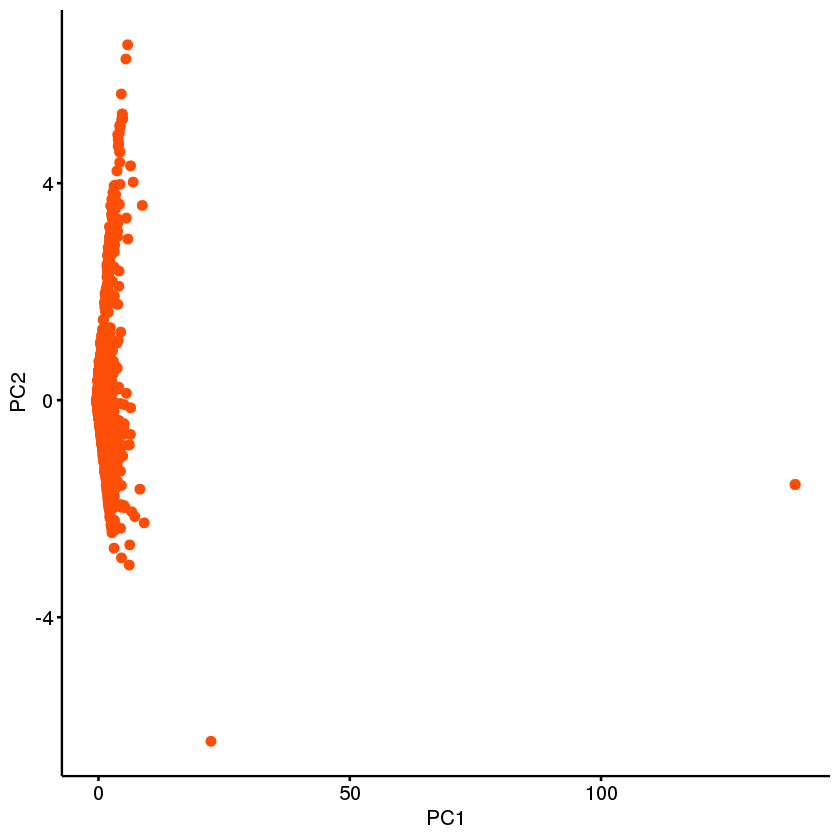

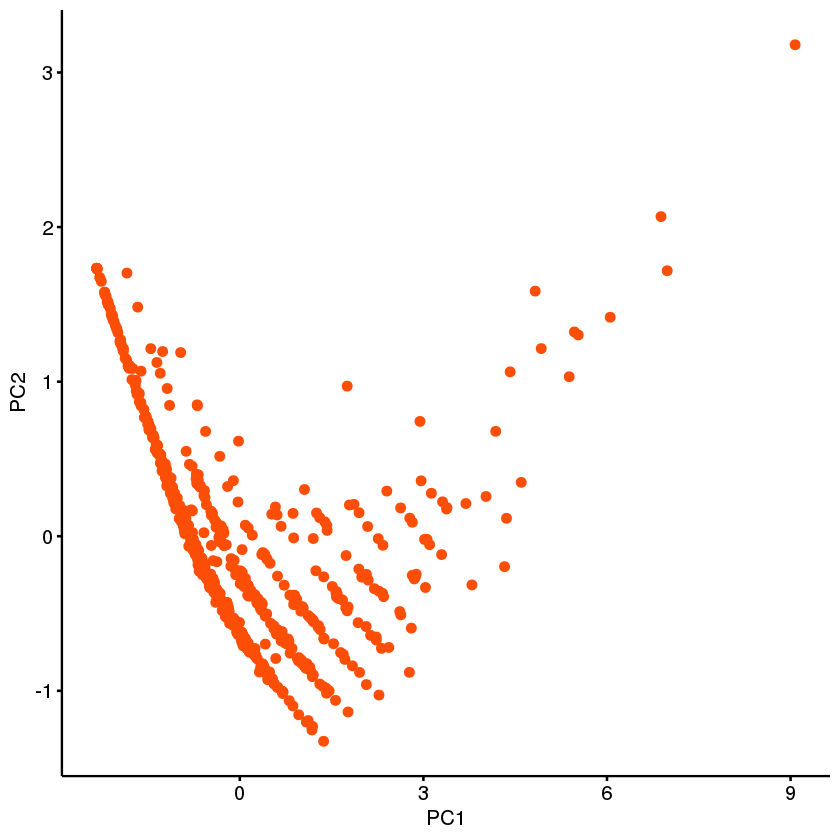

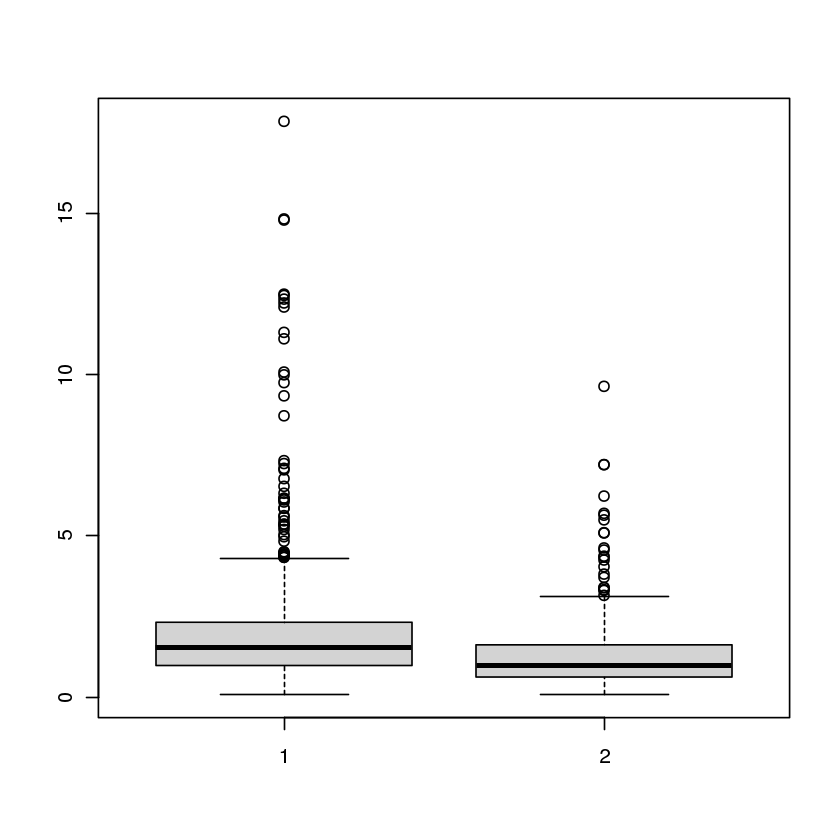

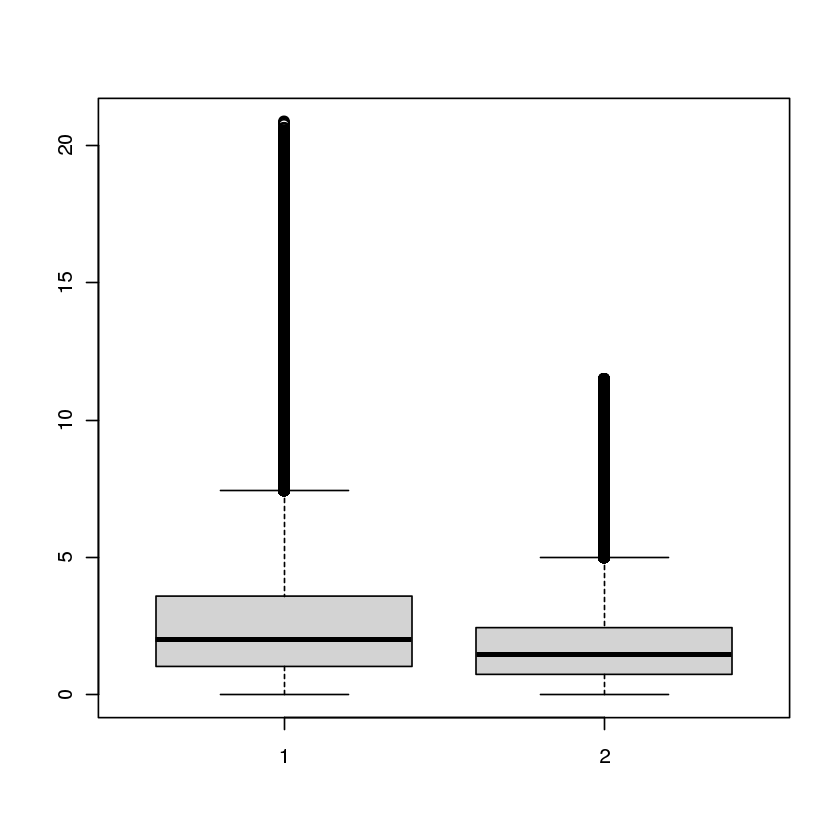

...

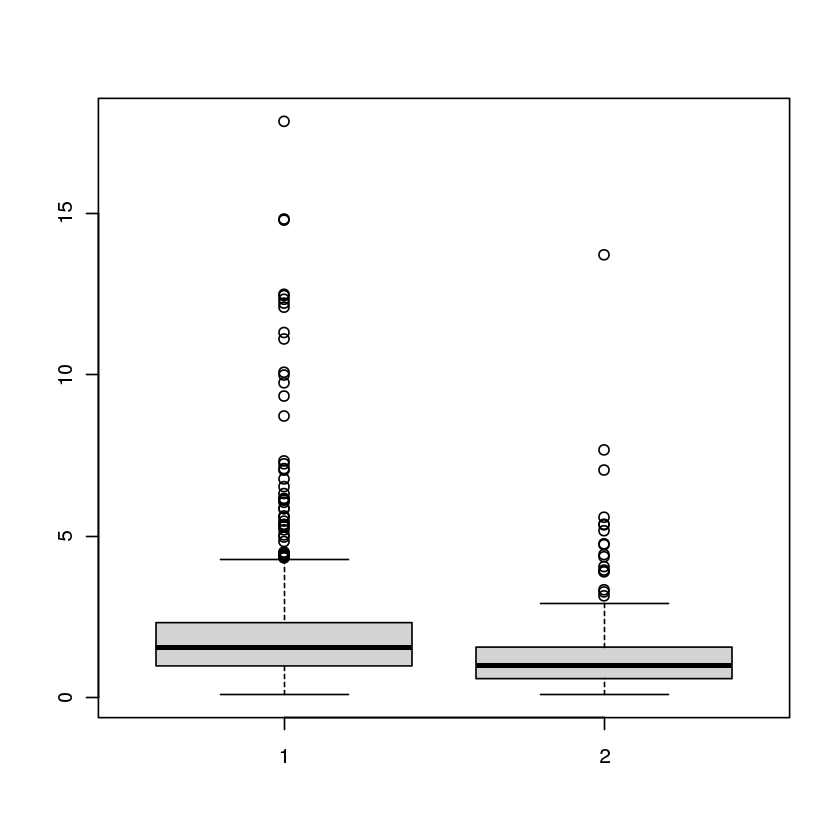

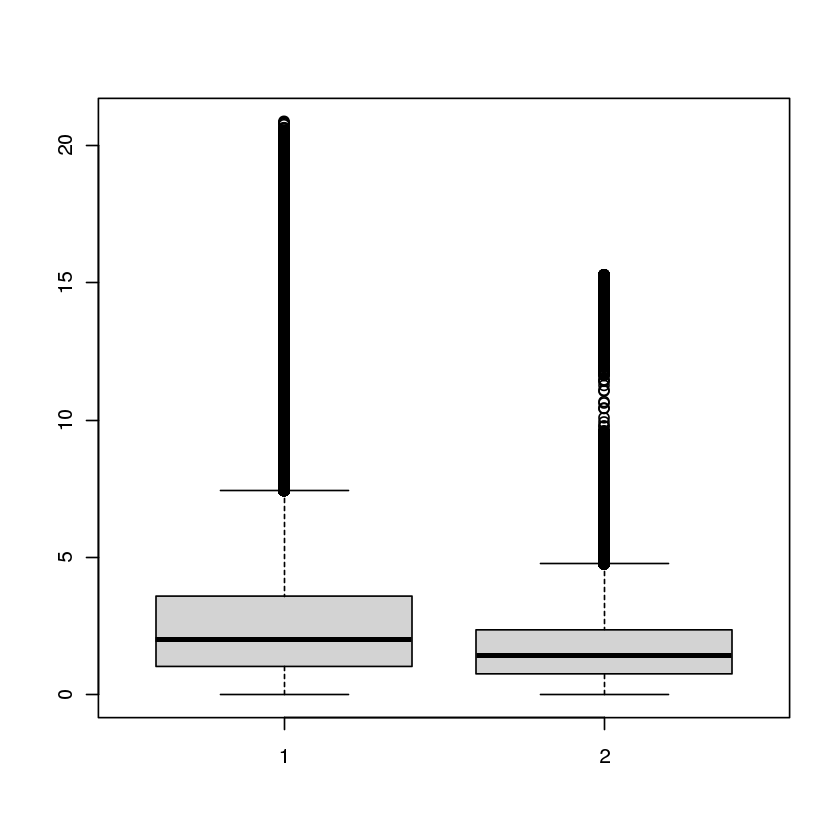

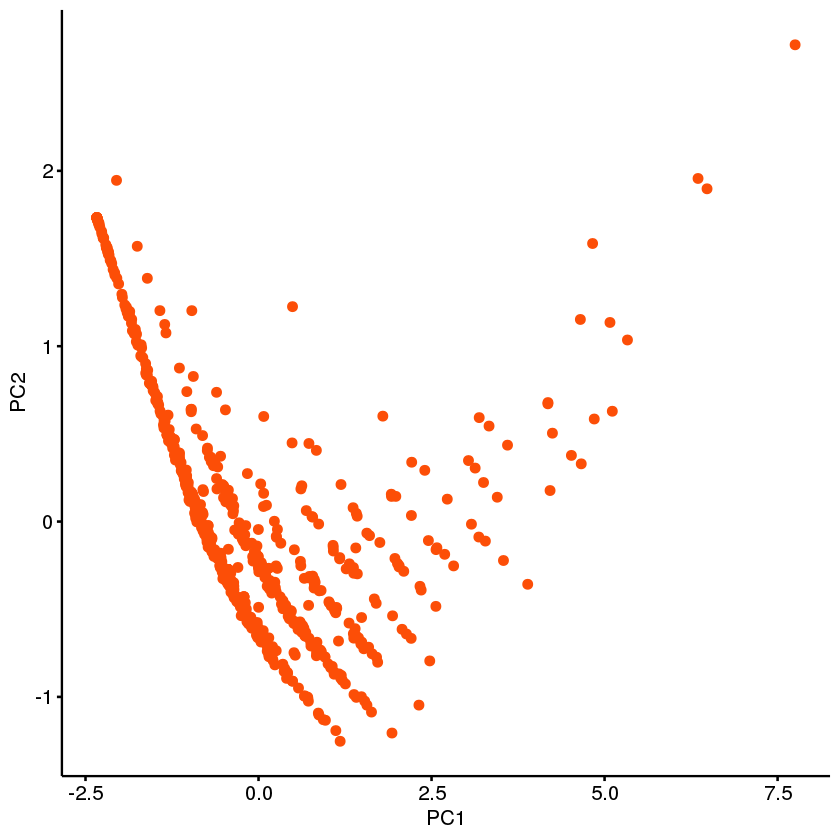

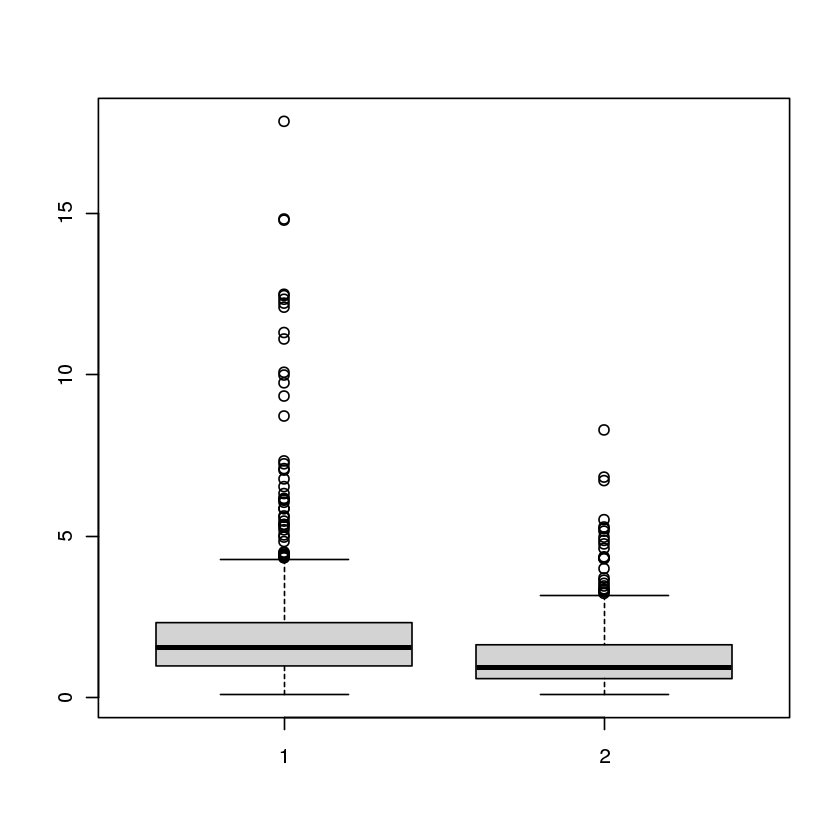

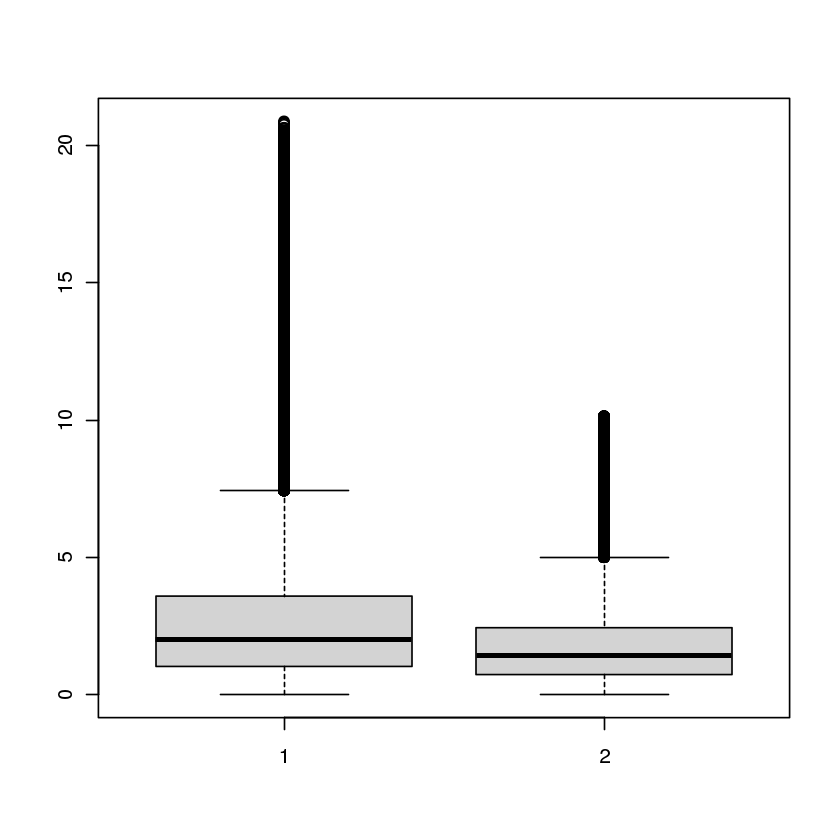

In [70]:
path_wound_lists <- get_distance_measures(pca_res_wound)

In [159]:
onc_pca_wound_distances <- closeness_measures(onc_pca_wound)
nononc_pca_wound_distances <- centroid_measures(nononc_pca_wound)


	Wilcoxon rank sum test with continuity correction

data:  onc_pca_wound_distances$centroid and nononc_pca_wound_distances
W = 525701, p-value = 1
alternative hypothesis: true location shift is less than 0


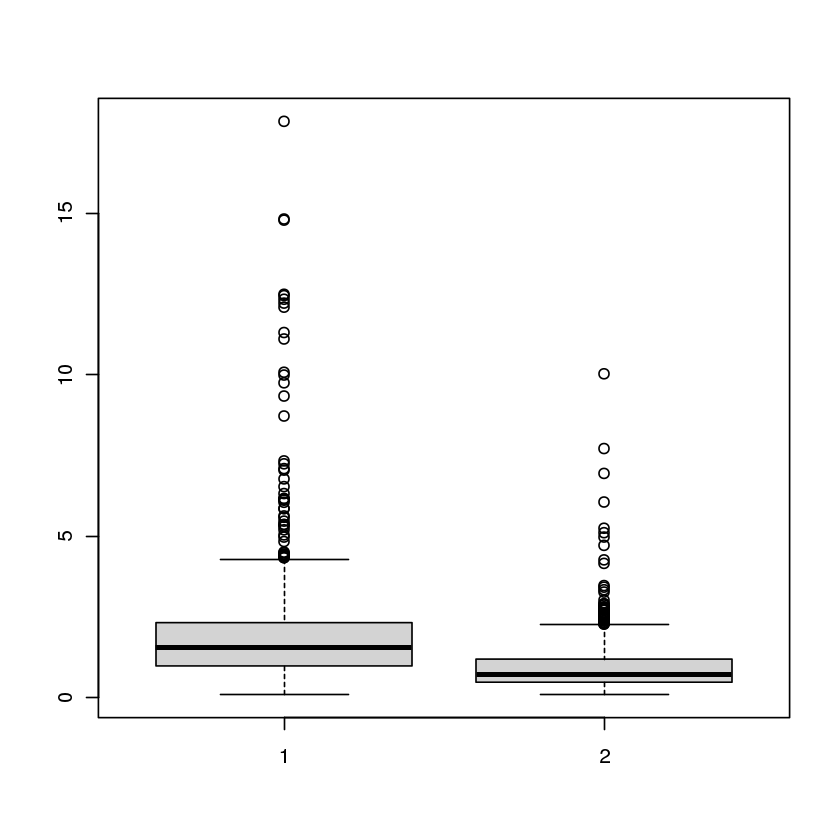

In [160]:
boxplot(onc_pca_wound_distances$centroid, nononc_pca_wound_distances)
wilcox.test(onc_pca_wound_distances$centroid, nononc_pca_wound_distances, alternative = "less")

## Stress  fractions

In [2]:
scale_stress <- combinedDF[,c('stress_Fraction_sp_1','stress_Fraction_sp_less2','stress_Fraction_sp_less3','stress_Fraction_sp_less4')]
pca_res_stress <- prcomp(scale_stress, scale. = TRUE)
autoplot(pca_res_stress)
autoplot(pca_res_stress, data = combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_stress, data = combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

ERROR: Error in eval(expr, envir, enclos): object 'combinedDF' not found


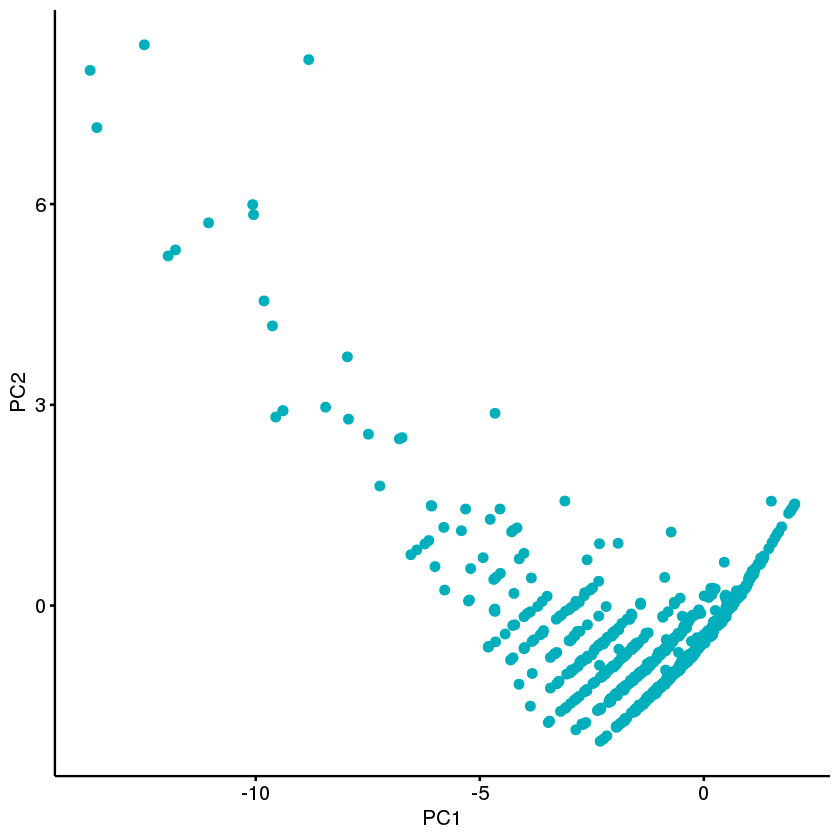

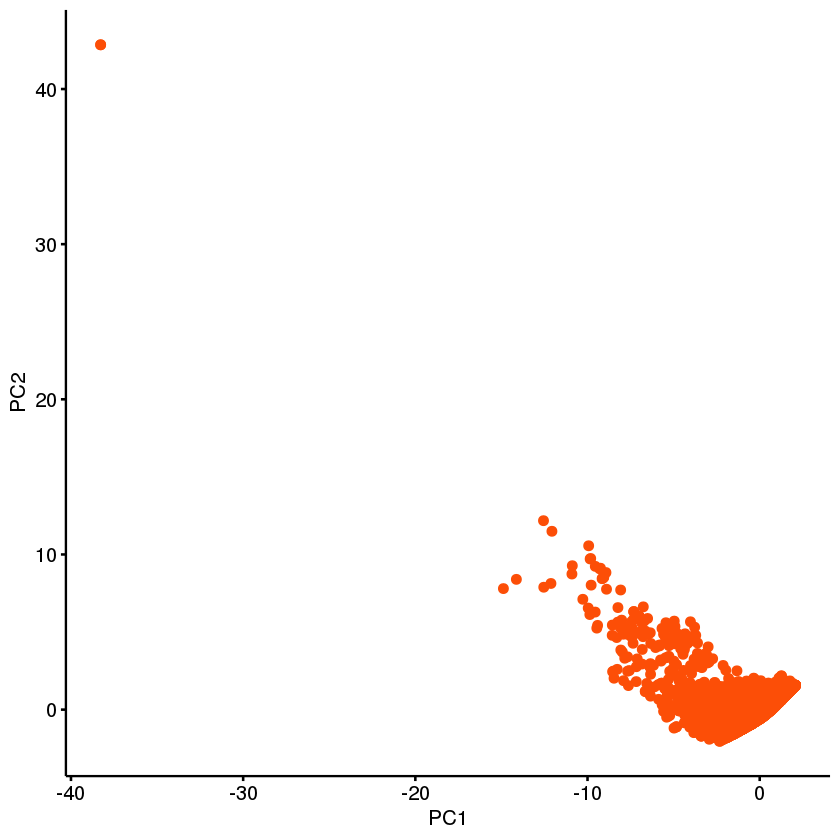

In [72]:
onc_pca_stress <- as.data.frame(pca_res_stress$x)[combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_stress, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_stress <- as.data.frame(pca_res_stress$x)[combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_stress, x = "PC1", y = "PC2",
   color = "#FC4E07")

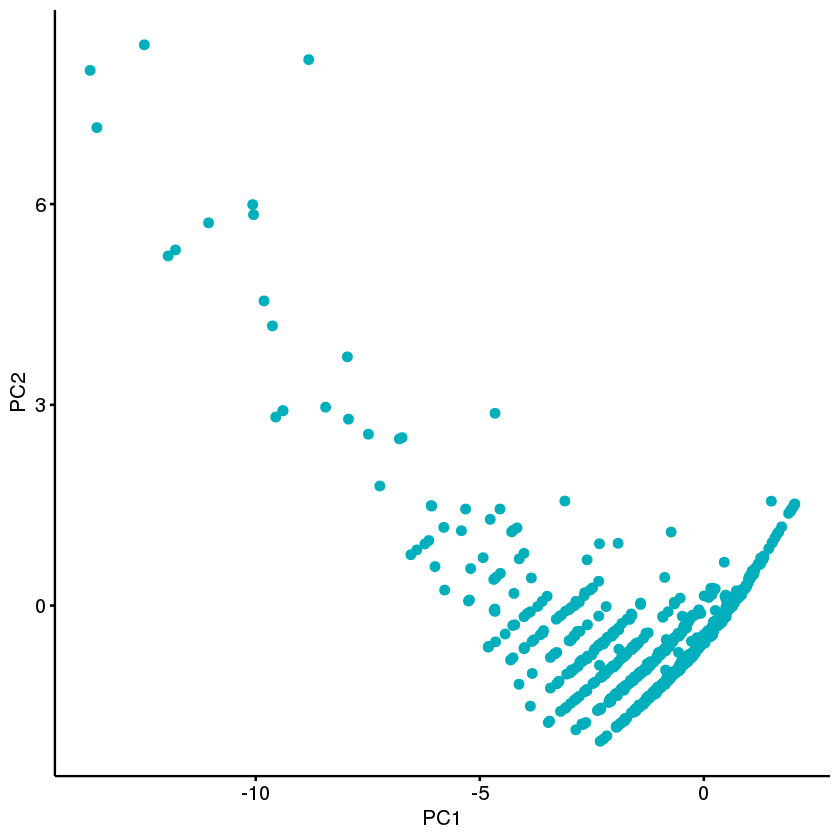

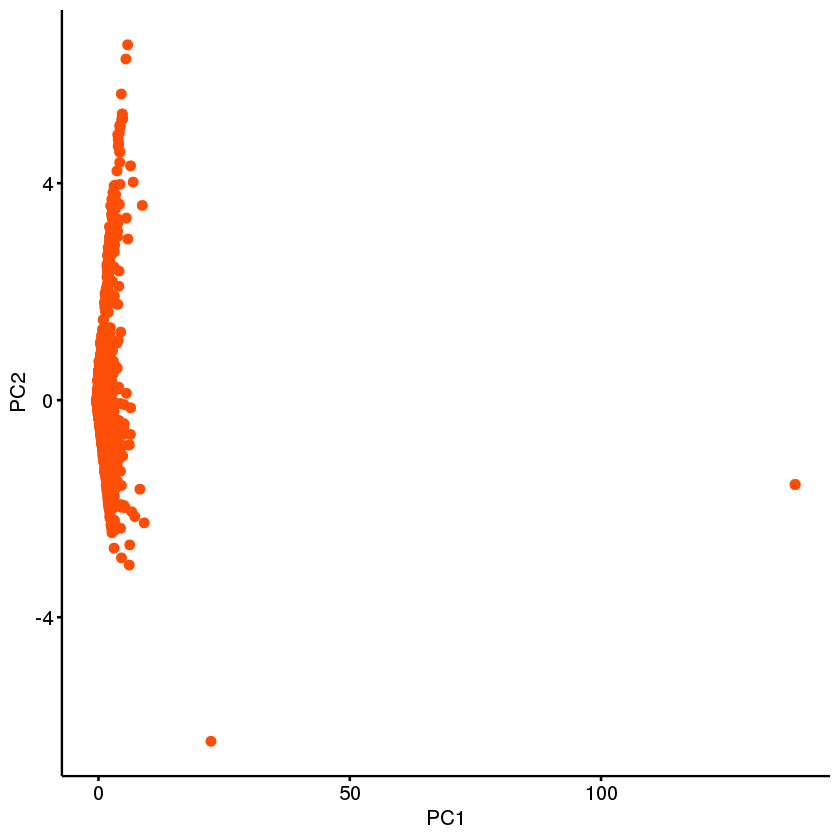

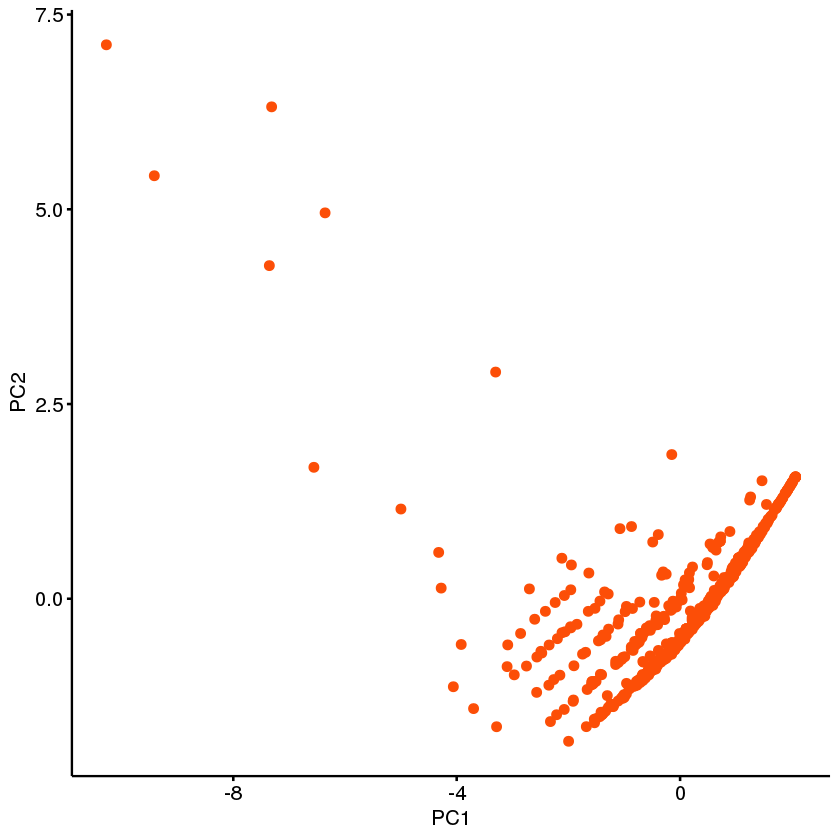

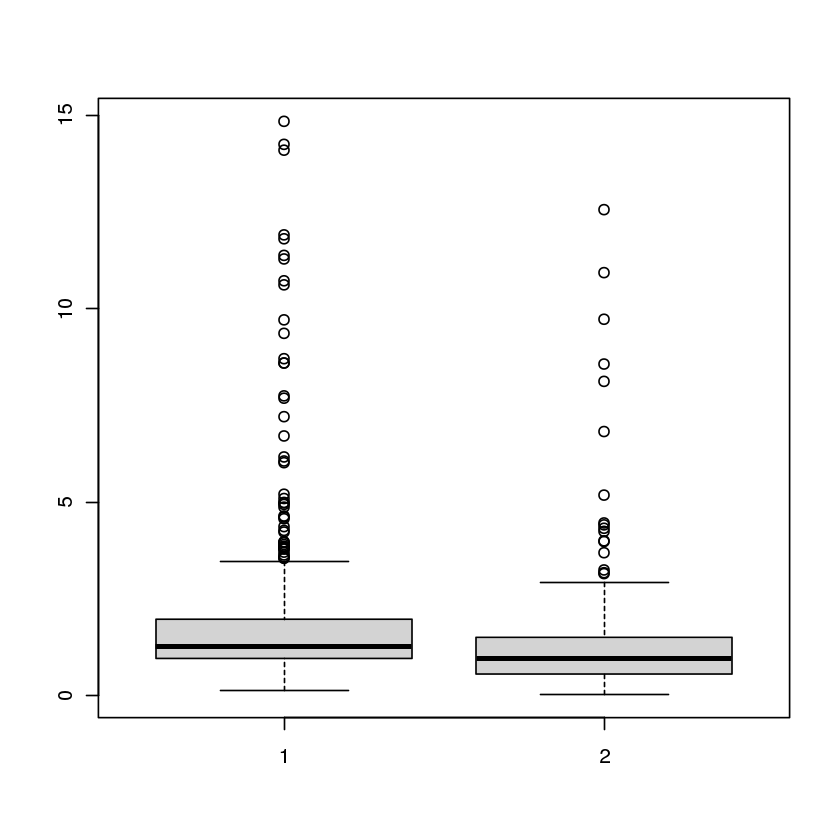

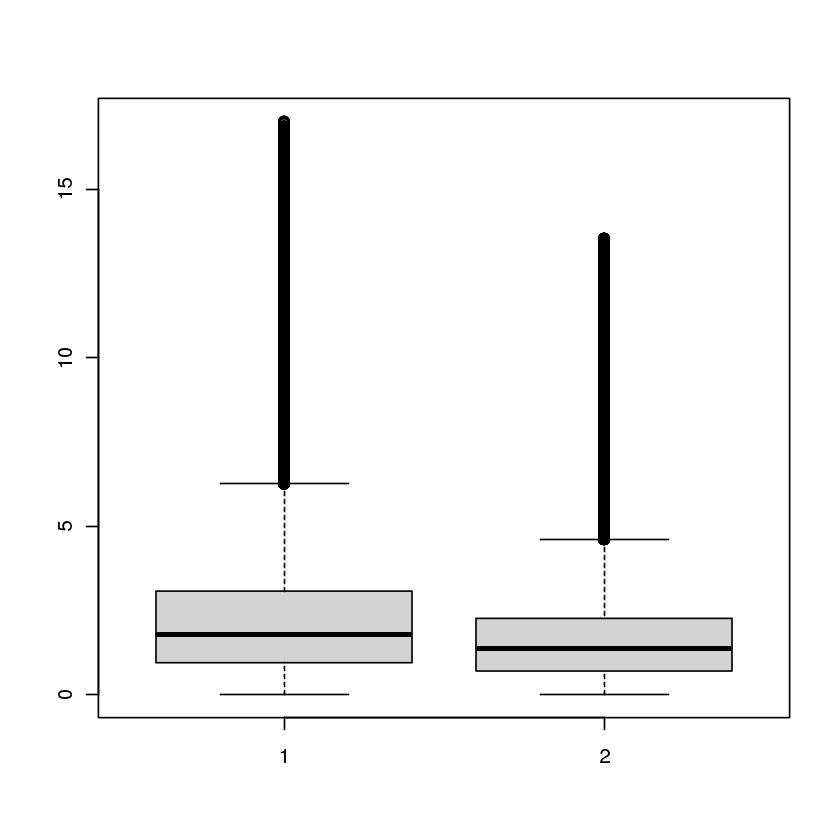

...

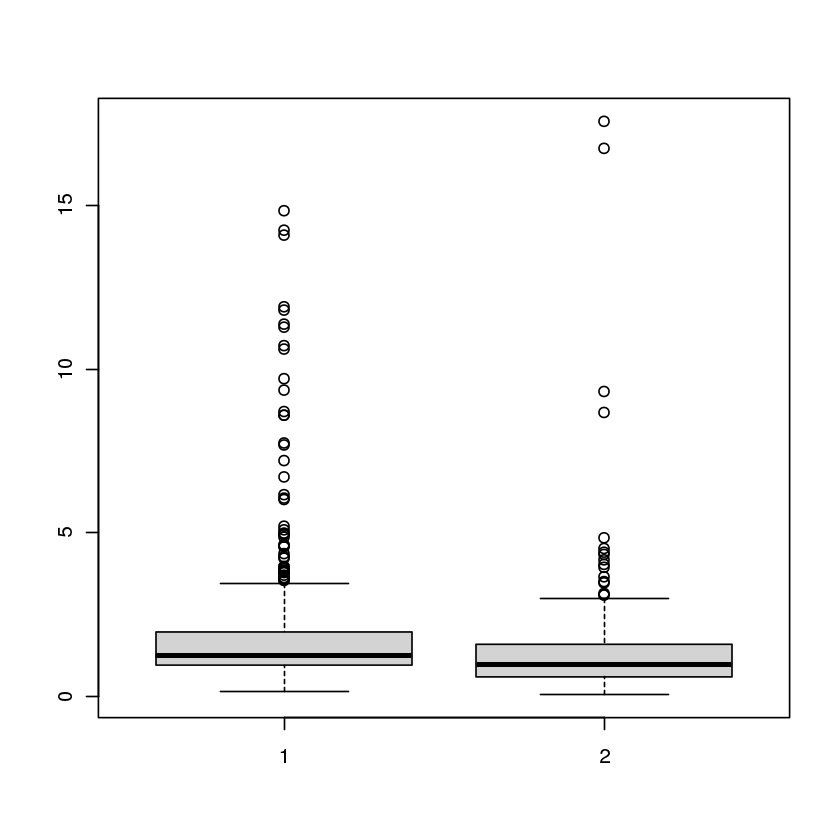

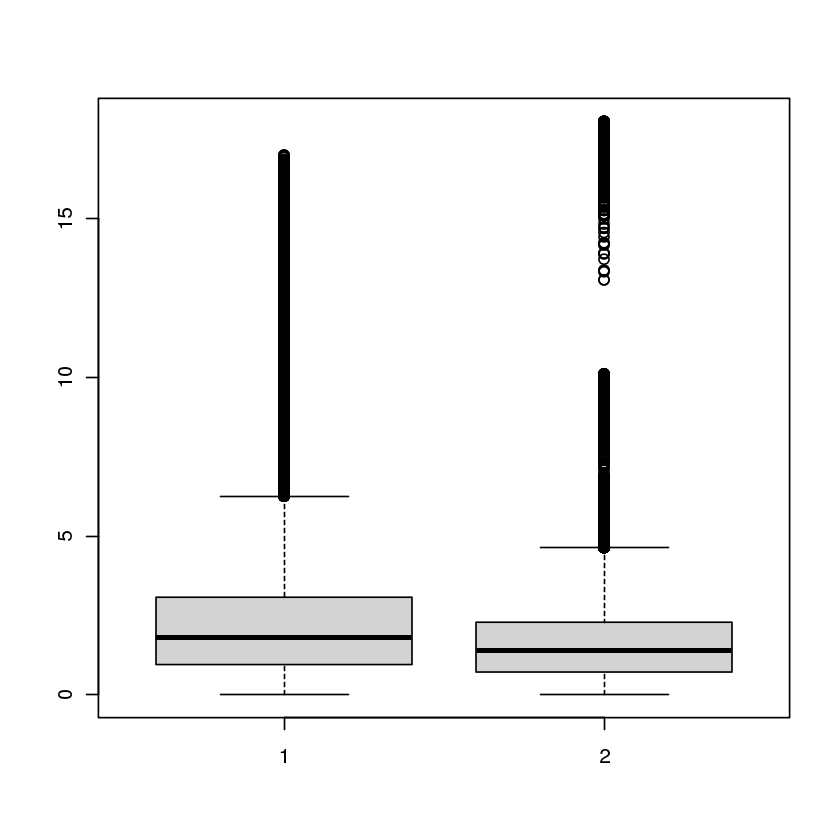

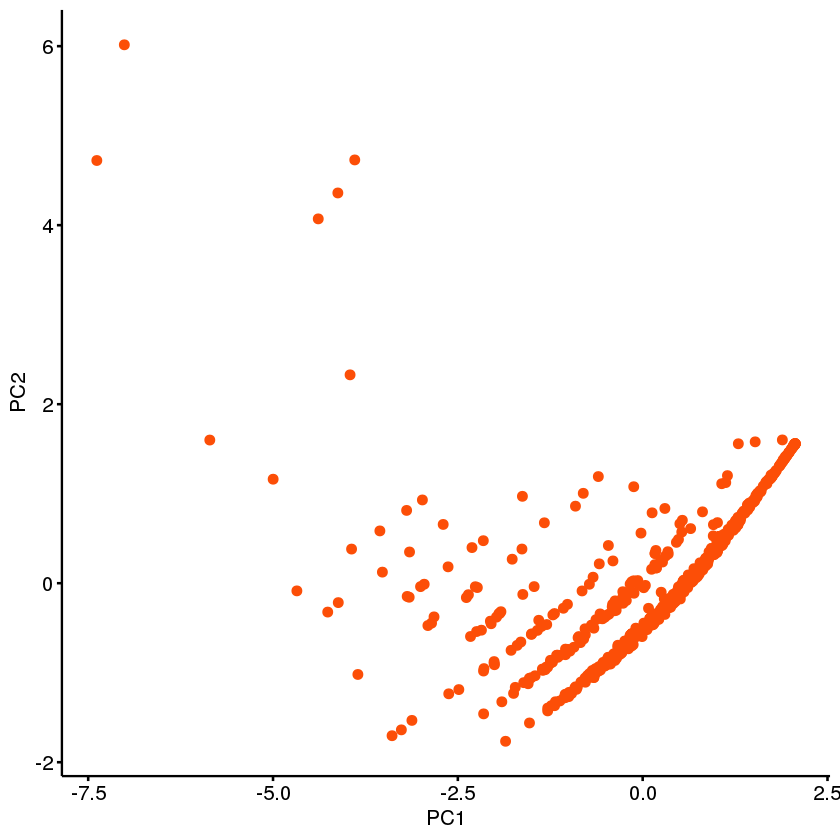

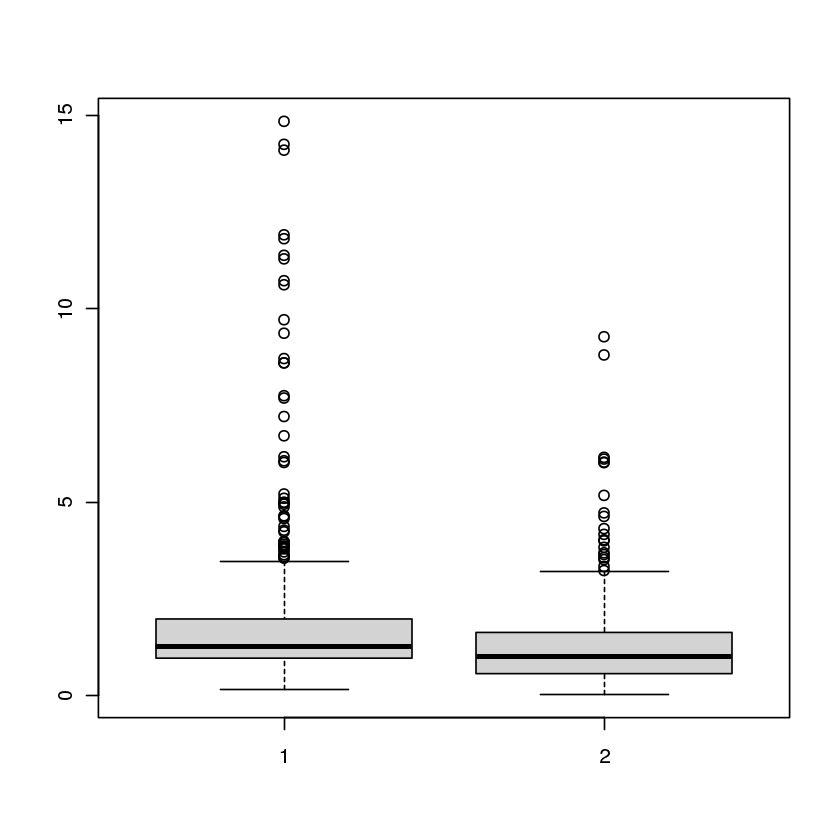

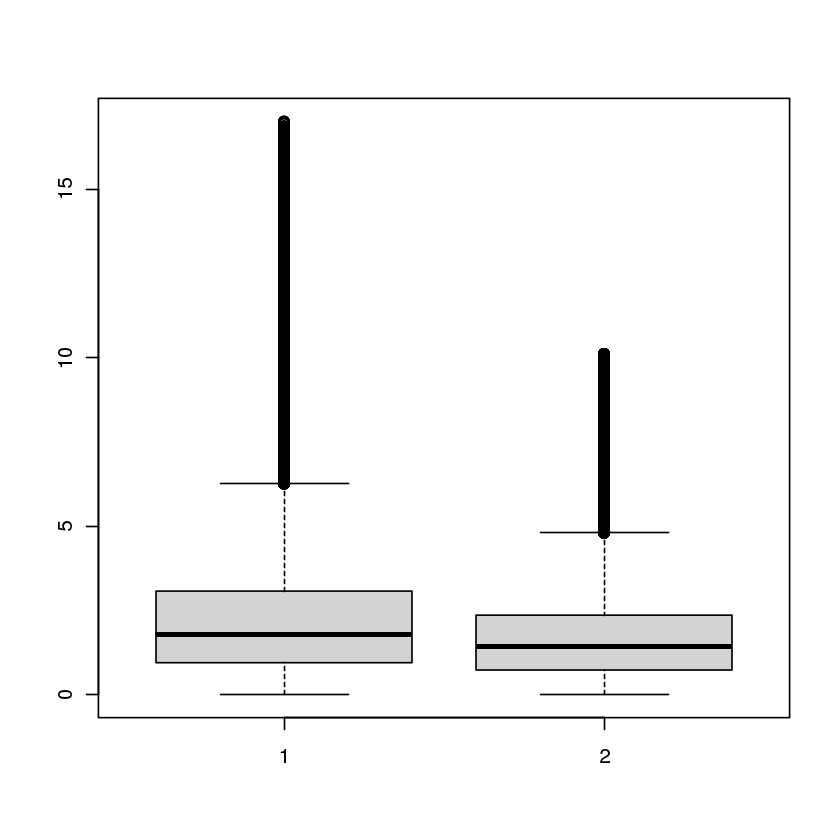

In [73]:
path_stress_lists <- get_distance_measures(pca_res_stress)

In [152]:
onc_pca_stress_distances <- closeness_measures(onc_pca_stress)
nononc_pca_stress_distances <- centroid_measures(nononc_pca_stress)


	Wilcoxon rank sum test with continuity correction

data:  onc_pca_stress_distances$centroid and nononc_pca_stress_distances
W = 486475, p-value = 1
alternative hypothesis: true location shift is less than 0


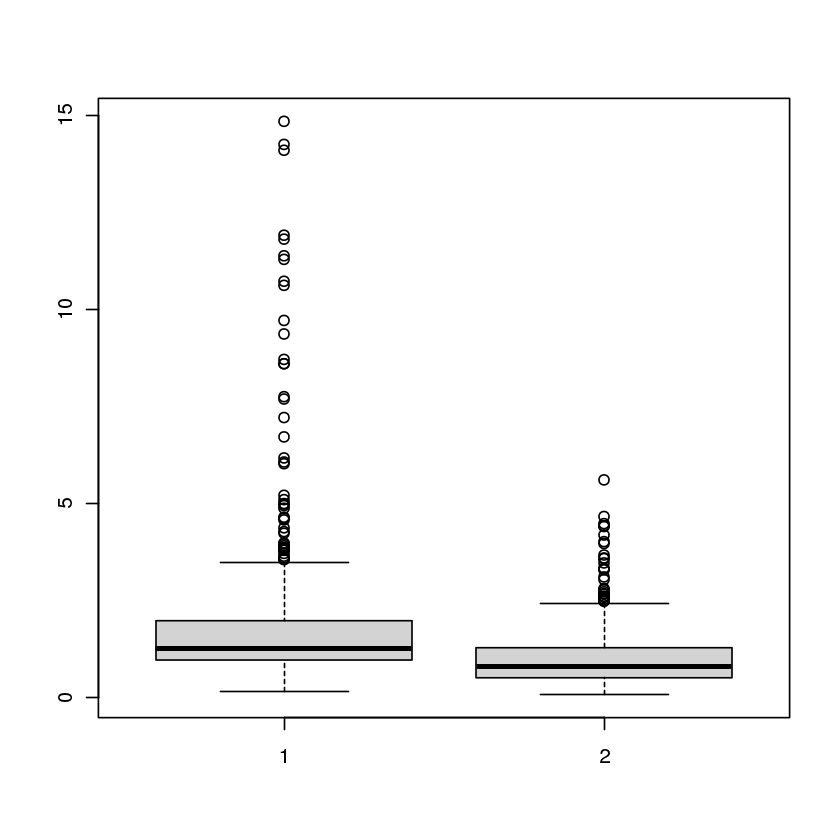

In [153]:
boxplot(onc_pca_stress_distances$centroid, nononc_pca_stress_distances)
wilcox.test(onc_pca_stress_distances$centroid, nononc_pca_stress_distances, alternative = "less")

# Spec_exp experiments

In [1]:
for(file in list.files("/data/timonaj/cancer_as_wound/ppi_analysis/","*_fractions.RDS")) {print(file)}

[1] "amexicanum_regen_down_fractions.RDS"
[1] "amexicanum_regen_up_fractions.RDS"
[1] "celegans_stress_down_fractions.RDS"
[1] "celegans_stress_up_fractions.RDS"
[1] "clupisFamiliaris_wound_up_fractions.RDS"
[1] "dmelanogaster_stress_down_fractions.RDS"
[1] "dmelanogaster_stress_up_fractions.RDS"
[1] "dmelanogaster_wound_down_fractions.RDS"
[1] "dmelanogaster_wound_up_fractions.RDS"
[1] "drerio_regen_down_fractions.RDS"
[1] "drerio_regen_up_fractions.RDS"
[1] "hsapiens_regen_down_fractions.RDS"
[1] "hsapiens_regen_up_fractions.RDS"
[1] "hsapiens_stress_down_fractions.RDS"
[1] "hsapiens_stress_up_fractions.RDS"
[1] "hsapiens_wound_down_fractions.RDS"
[1] "hsapiens_wound_up_fractions.RDS"
[1] "mmusculus_stress_down_fractions.RDS"
[1] "mmusculus_stress_up_fractions.RDS"
[1] "regen_fractions.RDS"
[1] "rnorvegicus_wound_down_fractions.RDS"
[1] "rnorvegicus_wound_up_fractions.RDS"
[1] "sscrofa_wound_down_fractions.RDS"
[1] "sscrofa_wound_up_fractions.RDS"
[1] "stress_fractions.RDS"
[1] "woun

In [5]:
fractions_list <- list()
for(file in list.files("/data/timonaj/cancer_as_wound/ppi_analysis/","*_fractions.RDS")) {
    fractions_list[[gsub("_fractions.RDS", "",file)]] <- readRDS(file)
}

final_fractions_list <- fractions_list[-c(20,25,26)]

fractions_initial_combinedDF <- data.frame("gene_list" = final_fractions_list[[1]][,c(1)])
for(i in 2:length(final_fractions_list)) {
    print(names(final_fractions_list)[i])
    temp <- cbind(fractions_initial_combinedDF[fractions_initial_combinedDF$gene_list %in% final_fractions_list[[i]][,c(1)],],
                                                        final_fractions_list[[i]][final_fractions_list[[i]][,c(1)] %in% fractions_initial_combinedDF$gene_list,])
    colnames(temp)[1] <- "gene_list"
    print(nrow(temp))
    print(ncol(temp))
    fractions_initial_combinedDF <- temp
}

cosmic_genes<-fread("cosmic_hallmarks.txt",header=F)
cosmic_genes<-as.data.frame(cosmic_genes)
colnames(cosmic_genes)<-c("gene")

cosmic_matched_genes<-fread("cosmic_driver_matched.txt",header=F)
cosmic_matched_genes<-as.data.frame(cosmic_matched_genes)
colnames(cosmic_matched_genes)<-c("gene")

#oncogenic_status<-gsub(" ", "", combinedDF$gene_regen) %in% as.character(cosmic_genes$gene)
oncogenic_status<-as.character(fractions_initial_combinedDF$gene_list) %in% as.character(cosmic_genes$gene)
fractions_initial_combinedDF<- cbind(fractions_initial_combinedDF,"oncogenic_status" =as.character(oncogenic_status))


oncogenic_status_degree_matched<-as.character(fractions_initial_combinedDF$gene_list) %in% as.character(cosmic_matched_genes$gene)
fractions_initial_combinedDF<- cbind(fractions_initial_combinedDF,"degree_matched_oncogenic_status" =as.character(oncogenic_status_degree_matched))

current_oncogenic_status <- as.factor(fractions_initial_combinedDF$oncogenic_status)
levels(current_oncogenic_status) <- c("Non-Cancer-Driver", "COSMIC-Driver")
current_oncogenic_status <- as.character(current_oncogenic_status)
current_oncogenic_status[fractions_initial_combinedDF$degree_matched_oncogenic_status == 'TRUE'] <- 'Matched-Controls'

fractions_initial_combinedDF<- cbind(fractions_initial_combinedDF,"total_oncogenic_status" =current_oncogenic_status)

[1] "amexicanum_regen_up"
[1] 16899
[1] 7
[1] "celegans_stress_down"
[1] 16899
[1] 13
[1] "celegans_stress_up"
[1] 16899
[1] 19
[1] "clupisFamiliaris_wound_up"
[1] 16899
[1] 25
[1] "dmelanogaster_stress_down"
[1] 16897
[1] 31
[1] "dmelanogaster_stress_up"
[1] 16897
[1] 37
[1] "dmelanogaster_wound_down"
[1] 16897
[1] 43
[1] "dmelanogaster_wound_up"
[1] 16897
[1] 49
[1] "drerio_regen_down"
[1] 16897
[1] 55
[1] "drerio_regen_up"
[1] 16897
[1] 61
[1] "hsapiens_regen_down"
[1] 16897
[1] 67
[1] "hsapiens_regen_up"
[1] 16897
[1] 73
[1] "hsapiens_stress_down"
[1] 16897
[1] 79
[1] "hsapiens_stress_up"
[1] 16897
[1] 85
[1] "hsapiens_wound_down"
[1] 16897
[1] 91
[1] "hsapiens_wound_up"
[1] 16897
[1] 97
[1] "mmusculus_stress_down"
[1] 16897
[1] 103
[1] "mmusculus_stress_up"
[1] 16897
[1] 109
[1] "rnorvegicus_wound_down"
[1] 16897
[1] 115
[1] "rnorvegicus_wound_up"
[1] 16897
[1] 121
[1] "sscrofa_wound_down"
[1] 16897
[1] 127
[1] "sscrofa_wound_up"
[1] 16897
[1] 133


In [6]:
hppin_degree <- fread("hPPIN_degree_list.txt", header=F)
overlapping_degree_genes <- fractions_initial_combinedDF[fractions_initial_combinedDF$gene_list %in% hppin_degree$V1,]
nrow(overlapping_degree_genes)
degree_list <- hppin_degree[hppin_degree$V1 %in% overlapping_degree_genes$gene_list]$V2
length(degree_list)
current_oncogenic_status <- as.factor(overlapping_degree_genes$oncogenic_status)
levels(current_oncogenic_status) <- c(0, 1)

[1] 16832

[1] 16832

In [7]:
overlapping_degree_genes

,gene_list,gene_amexicanum_regen_up,amexicanum_regen_up_Fraction_sp_0,amexicanum_regen_up_Fraction_sp_1,amexicanum_regen_up_Fraction_sp_less2,amexicanum_regen_up_Fraction_sp_less3,amexicanum_regen_up_Fraction_sp_less4,gene_celegans_stress_down,celegans_stress_down_Fraction_sp_0,celegans_stress_down_Fraction_sp_1,⋯,sscrofa_wound_down_Fraction_sp_less4,gene_sscrofa_wound_up,sscrofa_wound_up_Fraction_sp_0,sscrofa_wound_up_Fraction_sp_1,sscrofa_wound_up_Fraction_sp_less2,sscrofa_wound_up_Fraction_sp_less3,sscrofa_wound_up_Fraction_sp_less4,oncogenic_status,degree_matched_oncogenic_status,total_oncogenic_status
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,⋯,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,A1BG,A1BG,0.000000000,0.002262443,0.002262443,0.054298643,0.723981900,A1BG,0.000000000,0.002941176,⋯,0.78703704,A1BG,0,0.000000000,0.000000000,0.08026030,0.79609544,FALSE,FALSE,Non-Cancer-Driver
2,ANXA7,ANXA7,0.000000000,0.011312217,0.011312217,0.328054299,0.923076923,ANXA7,0.000000000,0.002941176,⋯,0.96990741,ANXA7,0,0.010845987,0.010845987,0.34273319,0.96963124,FALSE,FALSE,Non-Cancer-Driver
3,CDKN1A,CDKN1A,0.000000000,0.038461538,0.038461538,0.615384615,0.975113122,CDKN1A,0.000000000,0.035294118,⋯,0.99074074,CDKN1A,0,0.045553145,0.045553145,0.68980477,0.99566161,TRUE,FALSE,COSMIC-Driver
4,CRISP3,CRISP3,0.000000000,0.000000000,0.000000000,0.002262443,0.054298643,CRISP3,0.002941176,0.000000000,⋯,0.09259259,CRISP3,0,0.000000000,0.000000000,0.00000000,0.08026030,FALSE,FALSE,Non-Cancer-Driver
5,TK1,TK1,0.002262443,0.015837104,0.018099548,0.509049774,0.959276018,TK1,0.000000000,0.008823529,⋯,0.97916667,TK1,0,0.026030369,0.026030369,0.59869848,0.98698482,FALSE,FALSE,Non-Cancer-Driver
6,A1CF,A1CF,0.000000000,0.000000000,0.000000000,0.009049774,0.454751131,A1CF,0.000000000,0.000000000,⋯,0.57638889,A1CF,0,0.000000000,0.000000000,0.01301518,0.52711497,TRUE,FALSE,COSMIC-Driver
7,APOBEC1,APOBEC1,0.000000000,0.002262443,0.002262443,0.072398190,0.708144796,APOBEC1,0.000000000,0.000000000,⋯,0.79861111,APOBEC1,0,0.000000000,0.000000000,0.06941432,0.79826464,FALSE,FALSE,Non-Cancer-Driver
8,CELF2,CELF2,0.000000000,0.000000000,0.000000000,0.000000000,0.009049774,CELF2,0.000000000,0.000000000,⋯,0.03009259,CELF2,0,0.000000000,0.000000000,0.00000000,0.01301518,FALSE,FALSE,Non-Cancer-Driver
9,KHSRP,KHSRP,0.000000000,0.004524887,0.004524887,0.223981900,0.920814480,KHSRP,0.000000000,0.002941176,⋯,0.95370370,KHSRP,0,0.002169197,0.002169197,0.31453362,0.95010846,FALSE,FALSE,Non-Cancer-Driver


In [8]:
up_fractions<- overlapping_degree_genes[,
                                        colnames(overlapping_degree_genes)[grep("(up_Fraction_sp_less4$|gene_list)",
                                                                                colnames(overlapping_degree_genes))]]
up_fraction_input_total <- cbind("degree" = degree_list, up_fractions, "label" = current_oncogenic_status)
up_fraction_input_total <- up_fraction_input_total %>% relocate(gene_list, .after = last_col())

up_cd<- up_fraction_input_total[up_fraction_input_total$label == 1,]
up_ncd<- up_fraction_input_total[up_fraction_input_total$label == 0,]

sampled_up_cd <- up_cd[sample(nrow(up_cd)),]
sampled_up_ncd <- up_ncd[sample(nrow(up_ncd)),]


down_fractions <- overlapping_degree_genes[,
                                           colnames(overlapping_degree_genes)[grep("(gene_list|down_Fraction_sp_less4$)",
                                                                                   colnames(overlapping_degree_genes))]]

down_fraction_input_total <- cbind("degree" = degree_list, down_fractions, "label" = current_oncogenic_status)
down_fraction_input_total <- down_fraction_input_total %>% relocate(gene_list, .after = last_col())


down_cd<- down_fraction_input_total[down_fraction_input_total$label == 1,]
down_ncd<- down_fraction_input_total[down_fraction_input_total$label == 0,]

sampled_down_cd <- down_cd[sample(nrow(down_cd)),]
sampled_down_ncd <- down_ncd[sample(nrow(down_ncd)),]



total_fractions<- overlapping_degree_genes[,
                                        colnames(overlapping_degree_genes)[grep("(Fraction_sp_less4$|gene_list)",
                                                                                colnames(overlapping_degree_genes))]]
total_fraction_input_total <- cbind("degree" = degree_list, total_fractions, "label" = current_oncogenic_status)
total_fraction_input_total <- total_fraction_input_total %>% relocate(gene_list, .after = last_col())

total_cd<- total_fraction_input_total[total_fraction_input_total$label == 1,]
total_ncd<- total_fraction_input_total[total_fraction_input_total$label == 0,]

sampled_total_cd <- total_cd[sample(nrow(total_cd)),]
sampled_total_ncd <- total_ncd[sample(nrow(total_ncd)),]


In [9]:
total_fraction_input_total 

,degree,amexicanum_regen_up_Fraction_sp_less4,celegans_stress_down_Fraction_sp_less4,celegans_stress_up_Fraction_sp_less4,clupisFamiliaris_wound_up_Fraction_sp_less4,dmelanogaster_stress_down_Fraction_sp_less4,dmelanogaster_stress_up_Fraction_sp_less4,dmelanogaster_wound_down_Fraction_sp_less4,dmelanogaster_wound_up_Fraction_sp_less4,drerio_regen_down_Fraction_sp_less4,⋯,hsapiens_wound_down_Fraction_sp_less4,hsapiens_wound_up_Fraction_sp_less4,mmusculus_stress_down_Fraction_sp_less4,mmusculus_stress_up_Fraction_sp_less4,rnorvegicus_wound_down_Fraction_sp_less4,rnorvegicus_wound_up_Fraction_sp_less4,sscrofa_wound_down_Fraction_sp_less4,sscrofa_wound_up_Fraction_sp_less4,label,gene_list
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
1,7,0.723981900,0.555882353,0.625000000,0.5652174,0.64130435,0.601671309,0.75576037,0.674616695,0.694050992,⋯,0.74603175,0.662068966,0.710027100,0.773480663,0.82474227,0.629392971,0.78703704,0.79609544,0,A1BG
2,102,0.923076923,0.929411765,0.923295455,0.9130435,0.97826087,0.927576602,0.93548387,0.950596252,0.940509915,⋯,0.94179894,0.924137931,0.956639566,0.944751381,0.97164948,0.939297125,0.96990741,0.96963124,0,ANXA7
3,286,0.975113122,0.970588235,0.977272727,0.9565217,0.98913043,0.972144847,0.97695853,0.986371380,0.977337110,⋯,0.97354497,1.000000000,0.981029810,0.991712707,0.98711340,0.974440895,0.99074074,0.99566161,1,CDKN1A
4,1,0.054298643,0.055882353,0.048295455,0.0000000,0.05434783,0.064066852,0.04608295,0.054514480,0.042492918,⋯,0.08465608,0.055172414,0.043360434,0.066298343,0.06701031,0.035143770,0.09259259,0.08026030,0,CRISP3
5,202,0.959276018,0.961764706,0.954545455,0.9565217,0.98913043,0.952646240,0.97235023,0.981260647,0.963172805,⋯,0.95767196,0.951724138,0.978319783,0.977900552,0.98195876,0.955271565,0.97916667,0.98698482,0,TK1
6,5,0.454751131,0.344117647,0.355113636,0.1086957,0.39130435,0.384401114,0.51612903,0.458262351,0.410764873,⋯,0.46560847,0.400000000,0.382113821,0.469613260,0.59793814,0.383386581,0.57638889,0.52711497,1,A1CF
7,16,0.708144796,0.673529412,0.670454545,0.6086957,0.68478261,0.685236769,0.77419355,0.701873935,0.750708215,⋯,0.75132275,0.731034483,0.688346883,0.784530387,0.83505155,0.587859425,0.79861111,0.79826464,0,APOBEC1
8,1,0.009049774,0.002941176,0.002840909,0.0000000,0.01086957,0.005571031,0.04147465,0.001703578,0.008498584,⋯,0.01587302,0.006896552,0.005420054,0.008287293,0.01288660,0.003194888,0.03009259,0.01301518,0,CELF2
9,39,0.920814480,0.900000000,0.897727273,0.8695652,0.90217391,0.849582173,0.92165899,0.916524702,0.895184136,⋯,0.92592593,0.896551724,0.932249322,0.947513812,0.96134021,0.872204473,0.95370370,0.95010846,0,KHSRP


In [7]:
total_cd

,degree,amexicanum_regen_up_Fraction_sp_less4,celegans_stress_down_Fraction_sp_less4,celegans_stress_up_Fraction_sp_less4,clupisFamiliaris_wound_up_Fraction_sp_less4,dmelanogaster_stress_down_Fraction_sp_less4,dmelanogaster_stress_up_Fraction_sp_less4,dmelanogaster_wound_down_Fraction_sp_less4,dmelanogaster_wound_up_Fraction_sp_less4,drerio_regen_down_Fraction_sp_less4,⋯,hsapiens_wound_down_Fraction_sp_less4,hsapiens_wound_up_Fraction_sp_less4,mmusculus_stress_down_Fraction_sp_less4,mmusculus_stress_up_Fraction_sp_less4,rnorvegicus_wound_down_Fraction_sp_less4,rnorvegicus_wound_up_Fraction_sp_less4,sscrofa_wound_down_Fraction_sp_less4,sscrofa_wound_up_Fraction_sp_less4,label,gene_list
,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
3,286,0.97511312,0.97058824,0.97727273,0.9565217,0.98913043,0.9721448,0.97695853,0.98637138,0.97733711,⋯,0.97354497,1.00000000,0.98102981,0.99171271,0.9871134,0.974440895,0.99074074,0.99566161,1,CDKN1A
6,5,0.45475113,0.34411765,0.35511364,0.1086957,0.39130435,0.3844011,0.51612903,0.45826235,0.41076487,⋯,0.46560847,0.40000000,0.38211382,0.46961326,0.5979381,0.383386581,0.57638889,0.52711497,1,A1CF
30,84,0.94331066,0.95294118,0.94602273,0.9130435,0.95652174,0.9359331,0.96313364,0.96763203,0.95184136,⋯,0.97354497,0.95138889,0.97831978,0.96408840,0.9793814,0.955271565,0.97685185,0.97180043,1,PAX5
36,95,0.94117647,0.92647059,0.92613636,0.9347826,0.91304348,0.9275766,0.95852535,0.95570698,0.95184136,⋯,0.96825397,0.95862069,0.97289973,0.96961326,0.9768041,0.945686901,0.97453704,0.97830803,1,CDKN2A
109,66,0.75791855,0.70294118,0.71306818,0.6956522,0.69565217,0.5595238,0.70967742,0.71209540,0.83333333,⋯,0.80952381,0.77931034,0.72357724,0.80939227,0.8427835,0.654952077,0.82407407,0.82429501,1,EXT1
111,208,0.88235294,0.85588235,0.84943182,0.8043478,0.84782609,0.7142857,0.87557604,0.86541738,0.94444444,⋯,0.91005291,0.87586207,0.91056911,0.91160221,0.9329897,0.801916933,0.93055556,0.92841649,1,LIFR
115,113,0.85972851,0.75000000,0.78125000,0.8695652,0.81521739,0.6547619,0.83410138,0.81431005,0.77777778,⋯,0.87830688,0.86206897,0.80758808,0.89226519,0.9149485,0.785942492,0.88888889,0.92190889,1,TNC
122,41,0.69909502,0.61176471,0.65056818,0.5869565,0.71739130,0.5714286,0.77419355,0.72061329,0.75000000,⋯,0.67195767,0.68275862,0.70460705,0.75414365,0.8350515,0.645367412,0.81944444,0.80260304,1,CNTRL
150,161,0.90476190,0.87941176,0.88920455,0.8913043,0.92391304,0.8523677,0.89861751,0.89267462,0.88101983,⋯,0.92592593,0.92361111,0.92411924,0.93370166,0.9664948,0.884984026,0.94212963,0.93926247,1,TFE3


In [31]:
(nrow(sampled_up_cd)*.8)
(nrow(sampled_up_ncd)*.8)

(nrow(sampled_down_cd)*.8)
(nrow(sampled_down_ncd)*.8)

[1] 541.6

[1] 12924

[1] 541.6

[1] 12924

In [8]:
###up
write.table(up_fraction_input_total,
            "./machine_learning/up_fraction_total.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(rbind(sampled_up_cd[1:542,1:length(up_fraction_input_total)-1], sampled_up_ncd[1:12924,1:length(up_fraction_input_total) -1]),
            "./machine_learning/up_fraction_train.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(rbind(sampled_up_cd[543:nrow(sampled_up_cd),1:length(up_fraction_input_total)-1], sampled_up_ncd[12925:nrow(sampled_up_ncd),1:length(up_fraction_input_total)-1]),
            "./machine_learning/up_fraction_test.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)


write.table(c(sampled_up_cd[1:542,]$gene_list, sampled_up_ncd[1:12924,]$gene_list),
            "./machine_learning/up_fraction_train_gene_list.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(c(sampled_up_cd[543:nrow(sampled_up_cd),]$gene_list, sampled_up_ncd[12925:nrow(sampled_up_ncd),]$gene_list),
            "./machine_learning/up_fraction_test_gene_list.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)

### total
write.table(total_fraction_input_total,
            "./machine_learning/total_fraction_total.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(rbind(sampled_total_cd[1:542,1:length(total_fraction_input_total)-1], sampled_total_ncd[1:12924,1:length(total_fraction_input_total) -1]),
            "./machine_learning/total_fraction_train.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(rbind(sampled_total_cd[543:nrow(sampled_total_cd),1:length(total_fraction_input_total)-1], sampled_total_ncd[12925:nrow(sampled_total_ncd),1:length(total_fraction_input_total)-1]),
            "./machine_learning/total_fraction_test.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)


write.table(c(sampled_total_cd[1:542,]$gene_list, sampled_total_ncd[1:12924,]$gene_list),
            "./machine_learning/total_fraction_train_gene_list.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(c(sampled_total_cd[543:nrow(sampled_total_cd),]$gene_list, sampled_total_ncd[12925:nrow(sampled_total_ncd),]$gene_list),
            "./machine_learning/total_fraction_test_gene_list.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)


###  down
write.table(down_fraction_input_total,
            "./machine_learning/down_fraction_total.csv",
            sep=",", quote=F, row.names = F, col.names=FALSE)

write.table(rbind(sampled_down_cd[1:542,], sampled_down_ncd[1:12924,]),
            "./machine_learning/down_fraction_train.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)
write.table(rbind(sampled_down_cd[543:nrow(sampled_down_cd),], sampled_down_ncd[12925:nrow(sampled_down_ncd),]),
            "./machine_learning/down_fraction_test.csv",
            sep=",", quote=F, row.names = F, col.names=TRUE)

## spec_exp_type PCA < 3

### upregulated

Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_warnings()` to see where this warning was generated.”


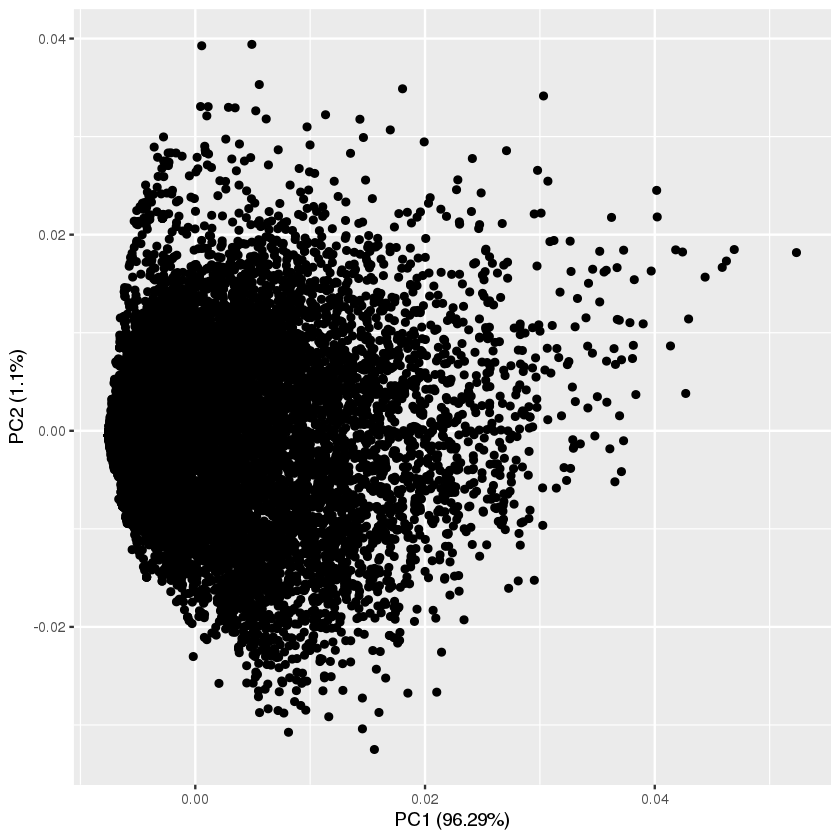

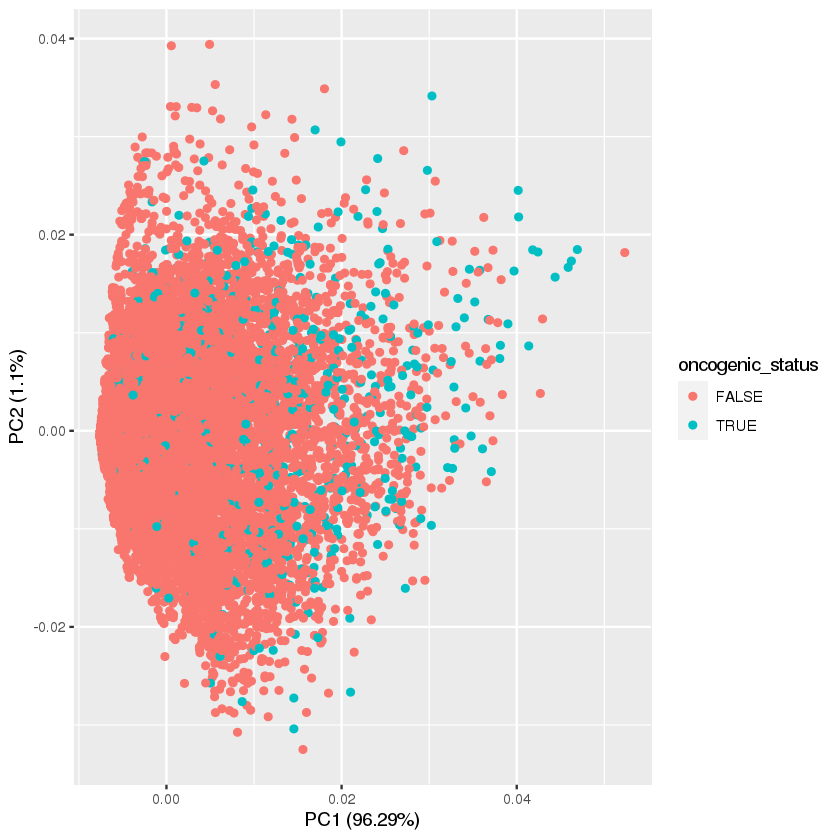

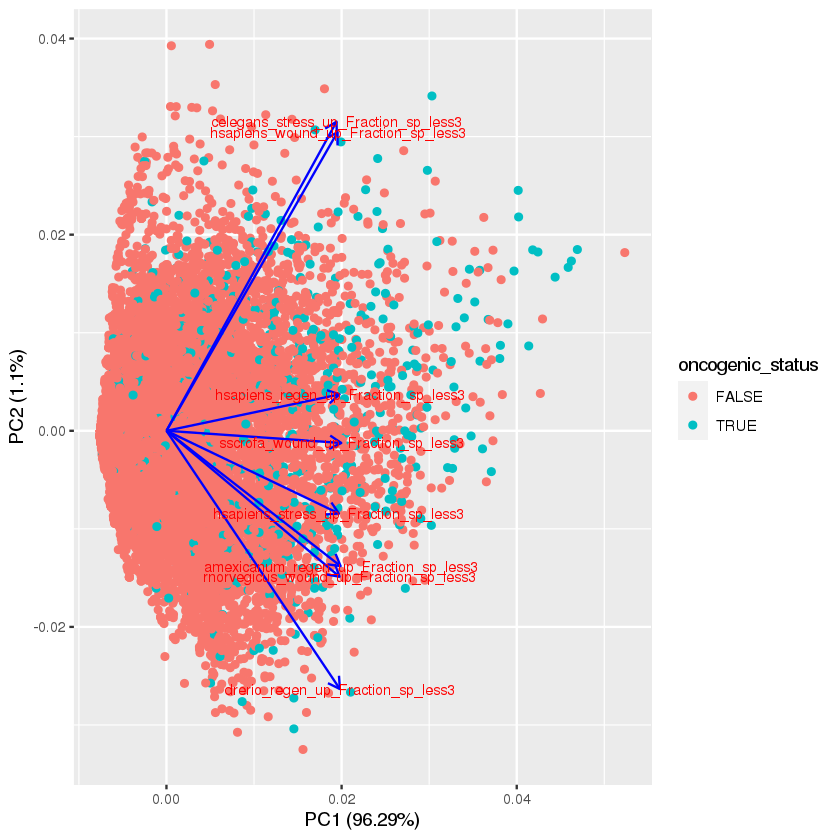

In [8]:
scale_spec_exp_3 <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_3 <- prcomp(scale_spec_exp_3, scale. = TRUE)
autoplot(pca_res_spec_exp_3)
autoplot(pca_res_spec_exp_3, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_3, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

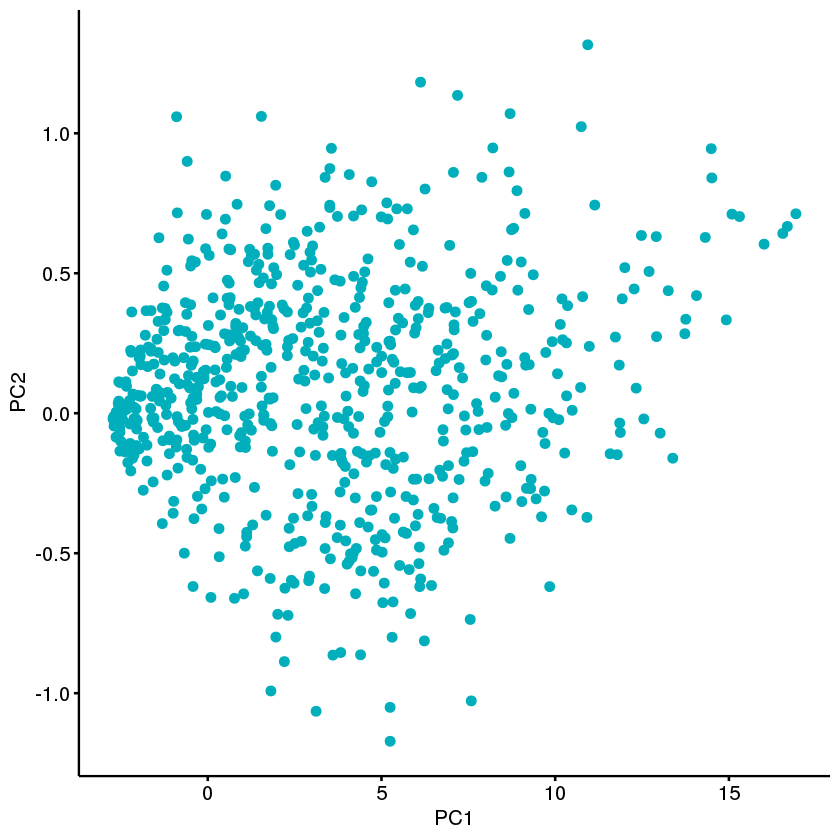

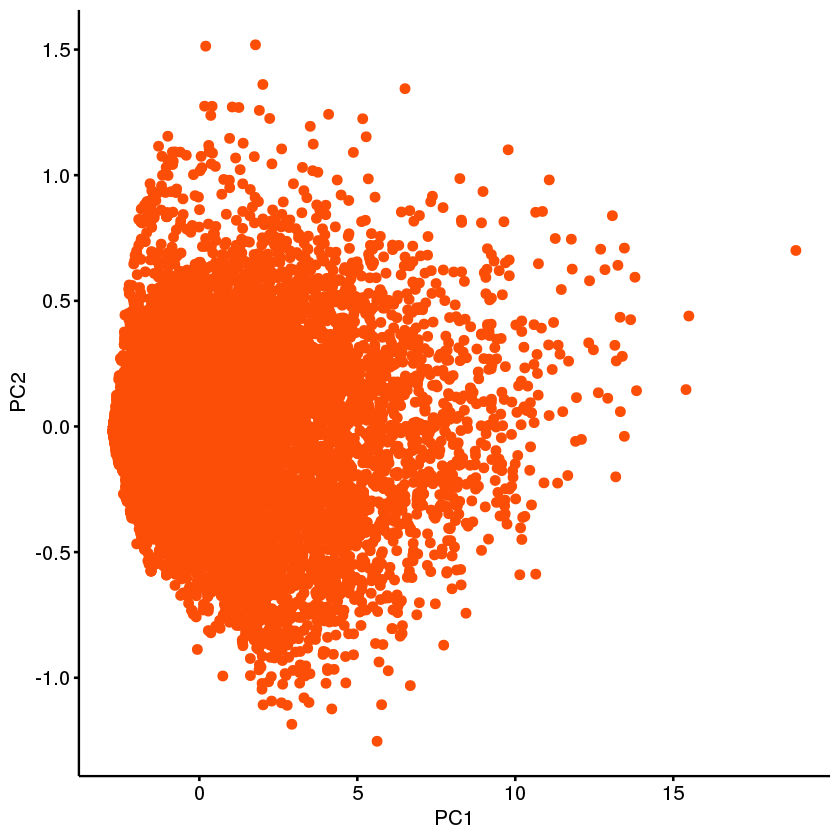

In [9]:
onc_pca_spec_exp_3 <- as.data.frame(pca_res_spec_exp_3$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_3, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_3 <- as.data.frame(pca_res_spec_exp_3$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_3, x = "PC1", y = "PC2",
   color = "#FC4E07")

Using  as id variables



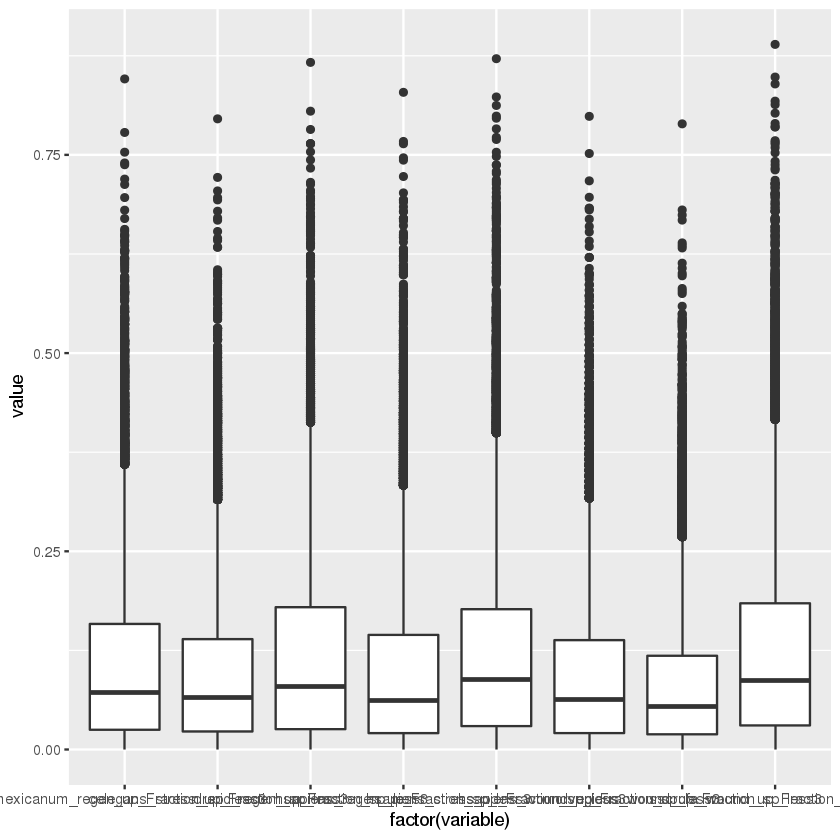

In [10]:
scale_spec_exp_3 <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_3)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

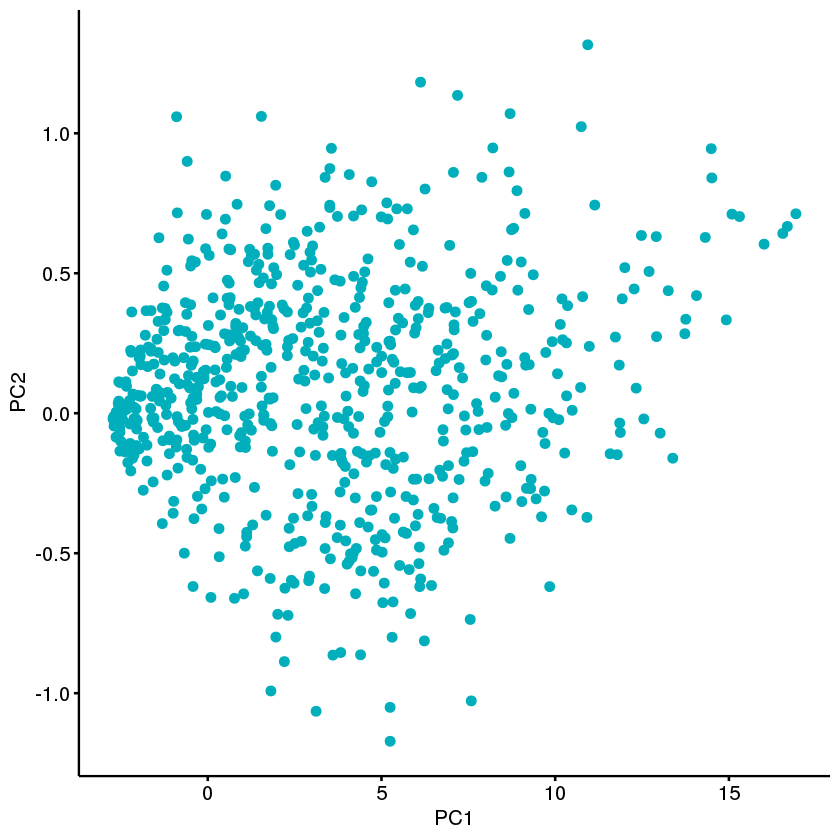

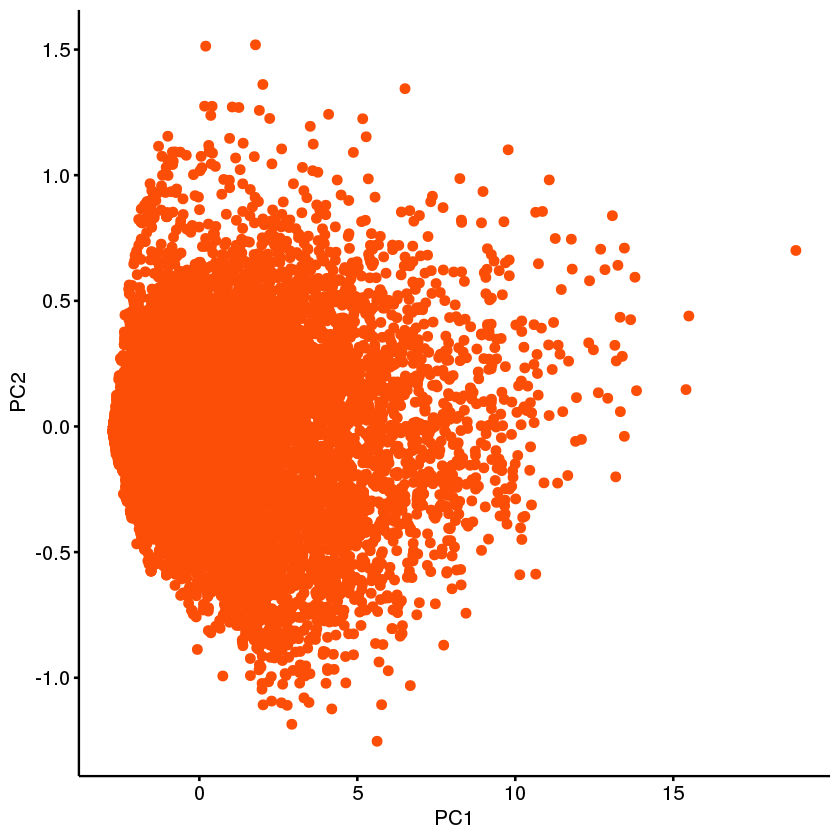

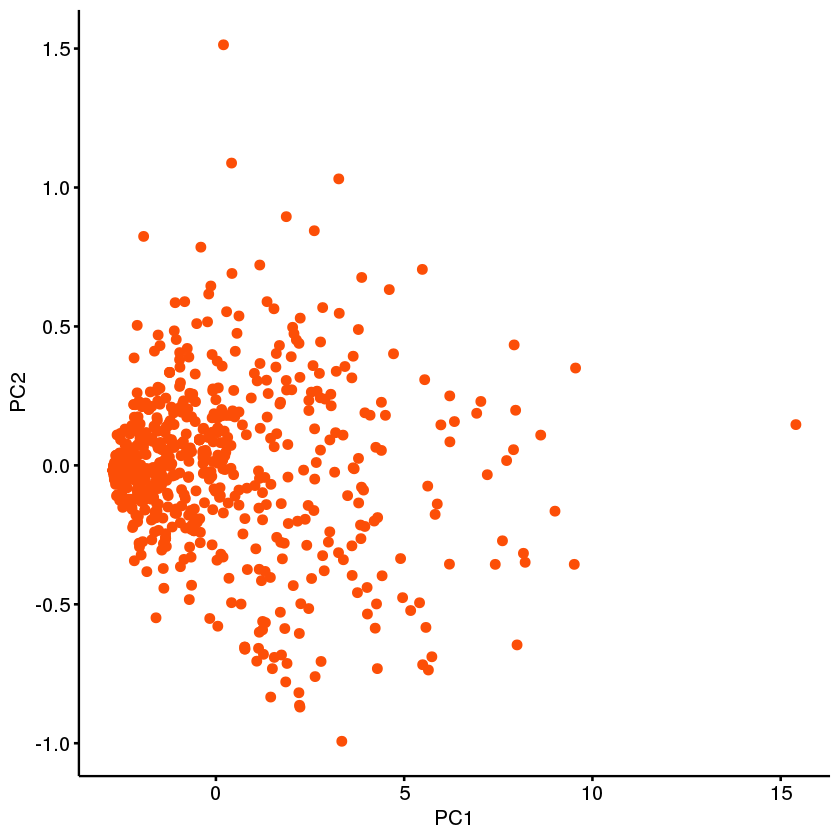

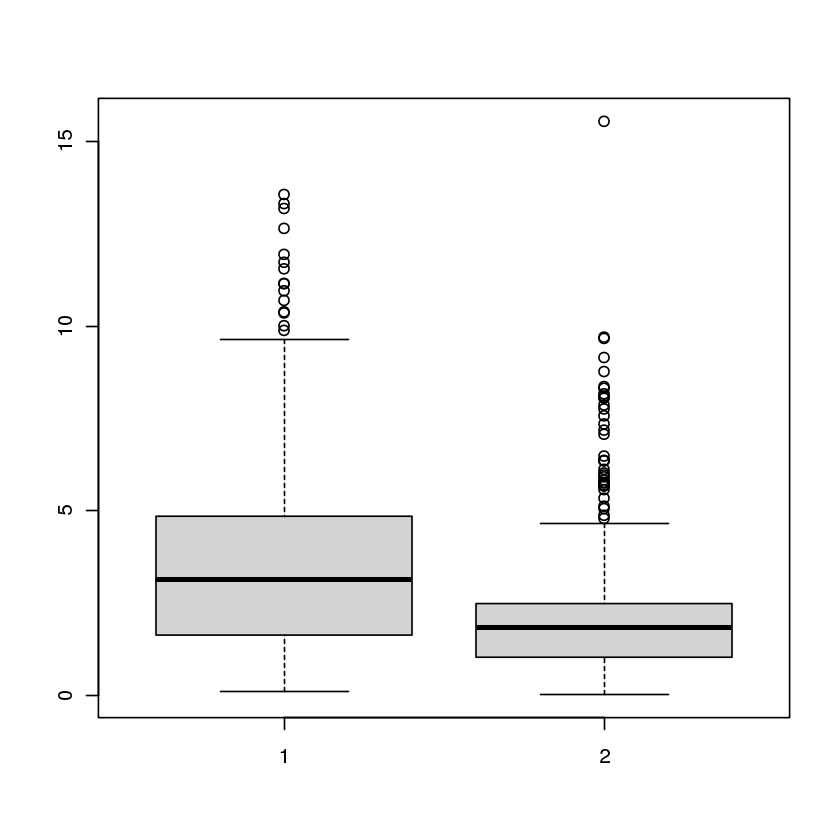

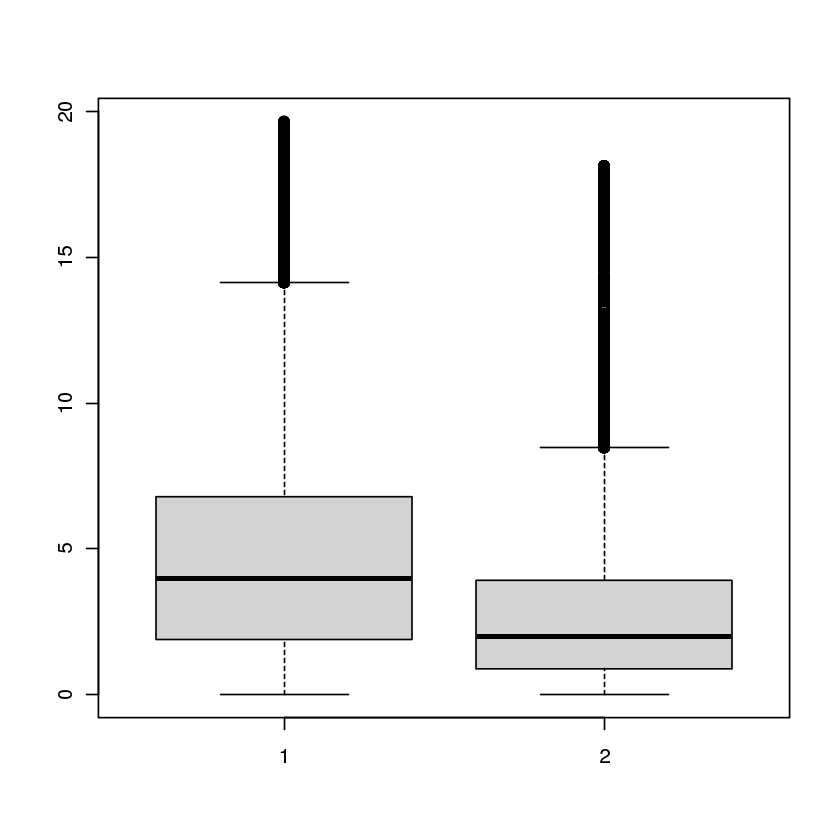

...

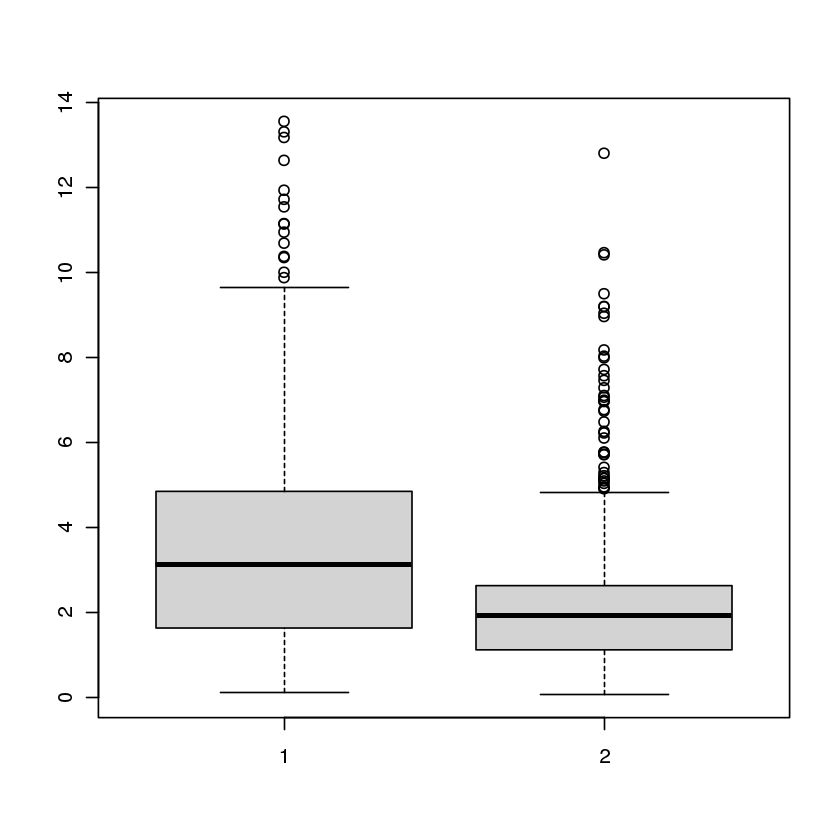

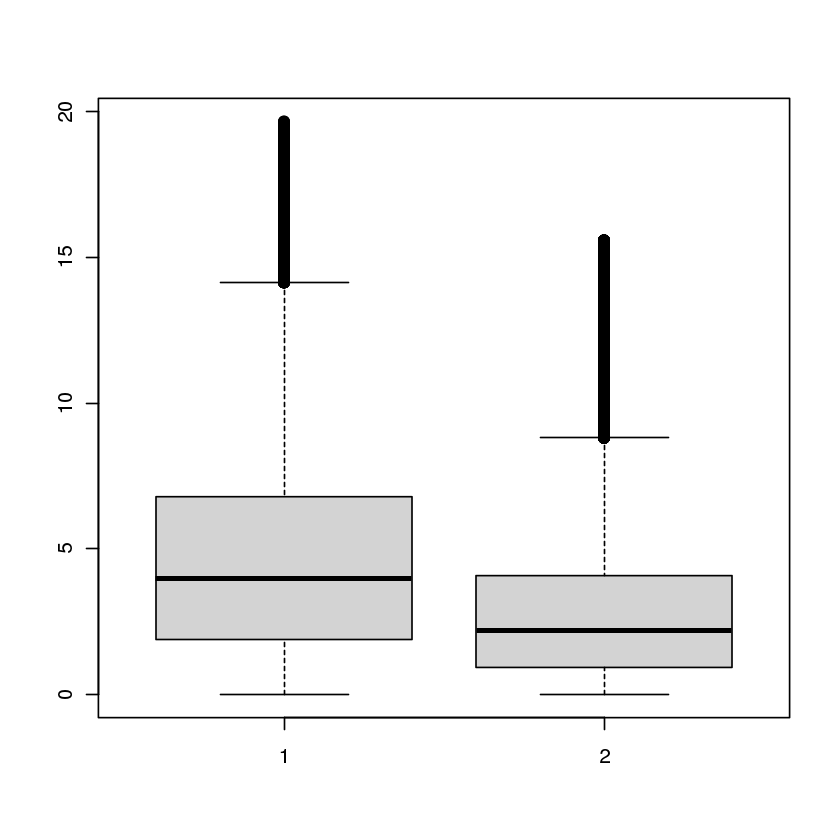

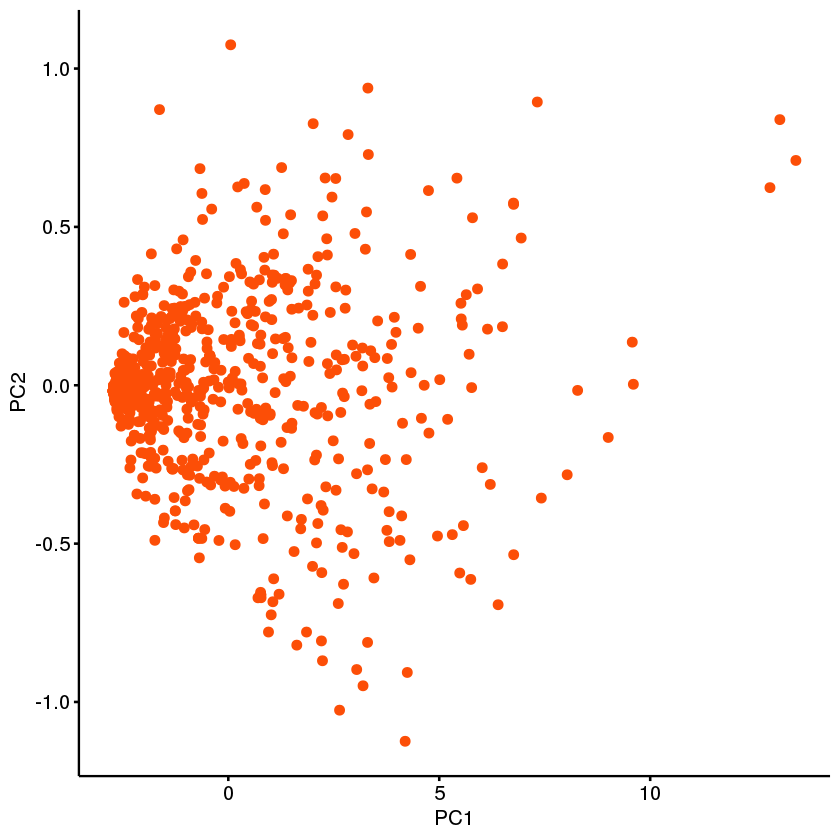

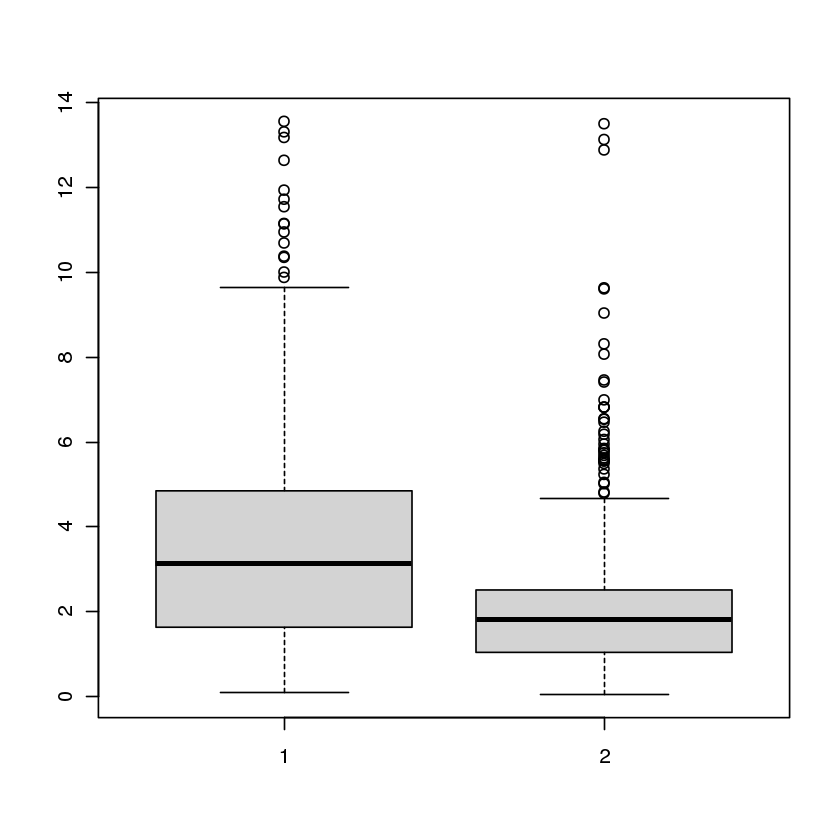

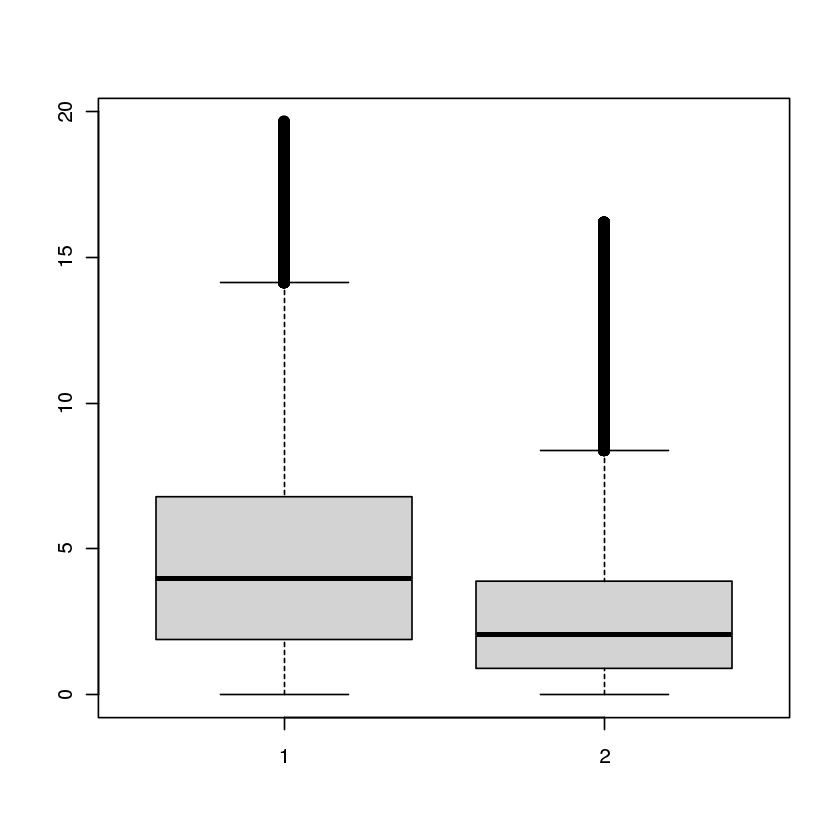

In [17]:
path_spec_exp_3_up_lists <- get_distance_measures(pca_res_spec_exp_3, fractions_initial_combinedDF)

### downregulated

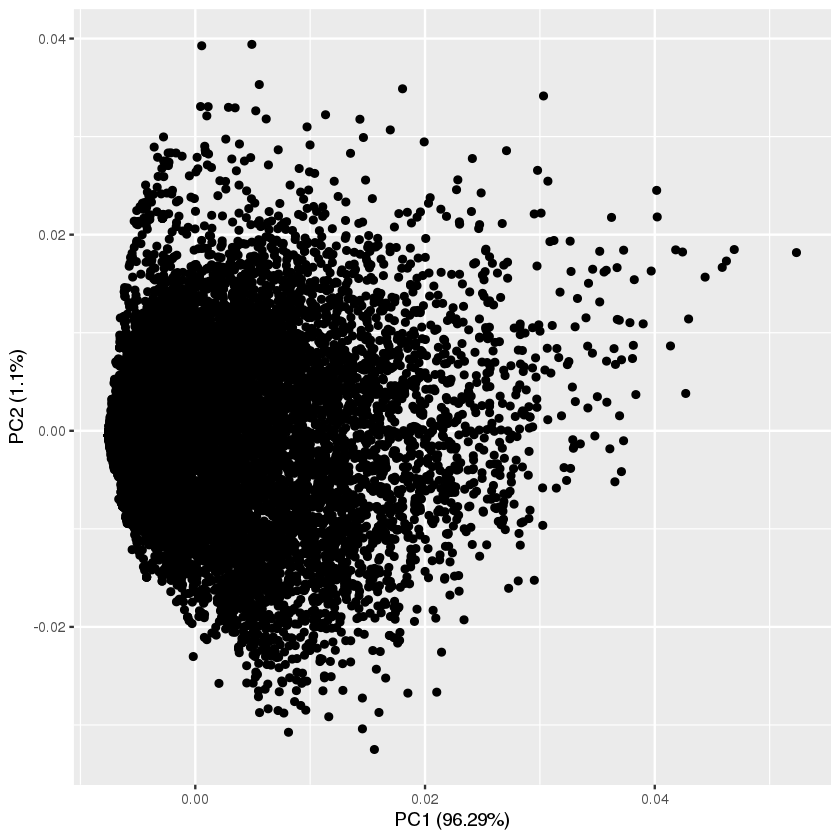

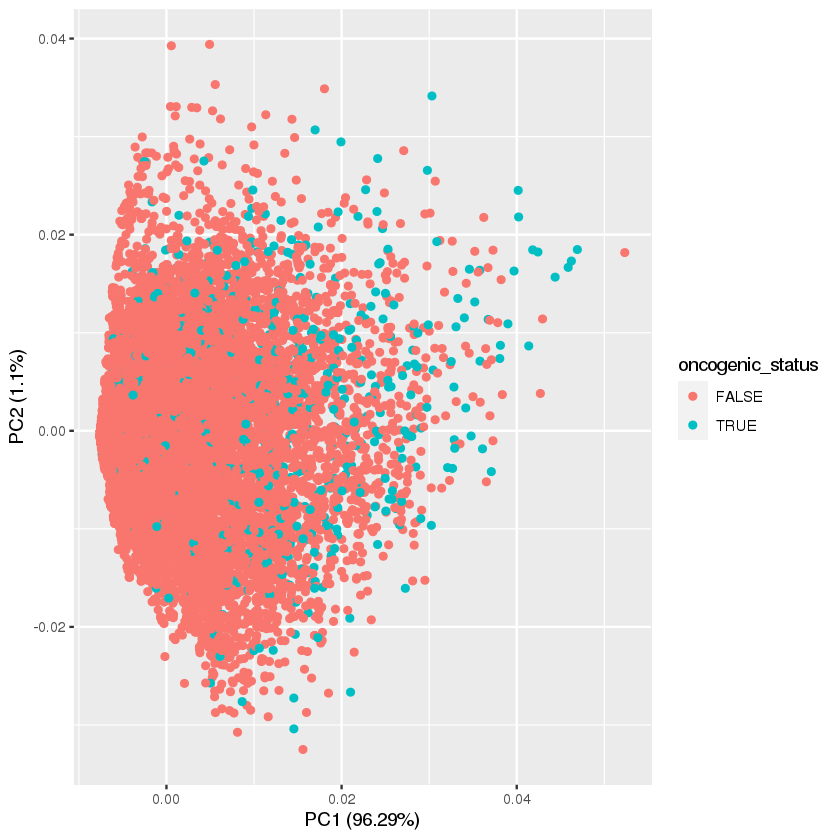

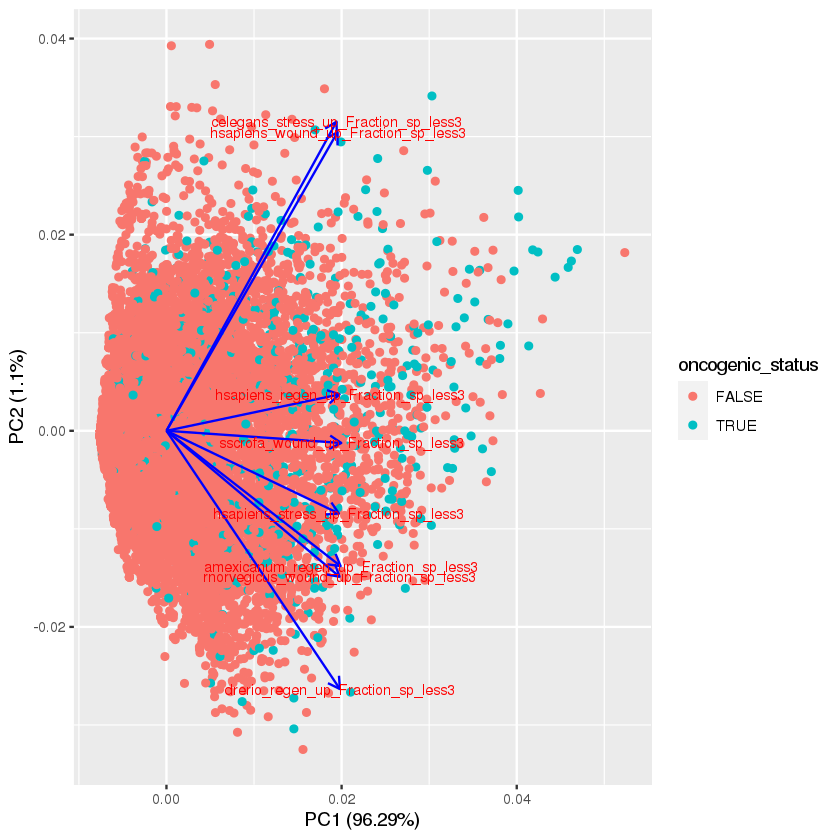

In [18]:
scale_spec_exp_3_down <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_3_down <- prcomp(scale_spec_exp_3_down, scale. = TRUE)
autoplot(pca_res_spec_exp_3_down)
autoplot(pca_res_spec_exp_3_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_3_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

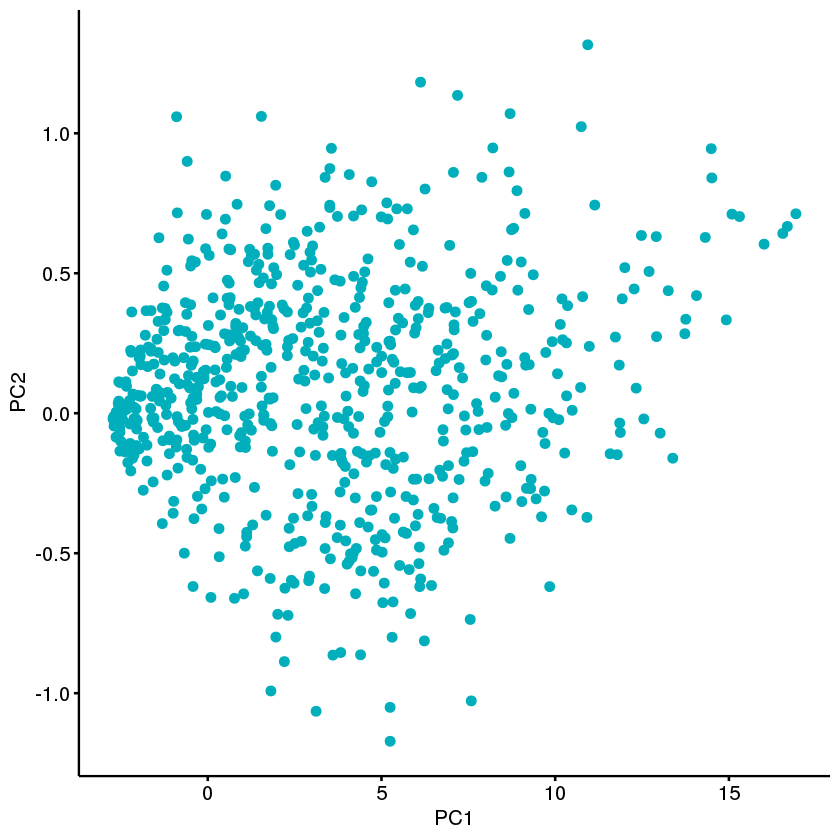

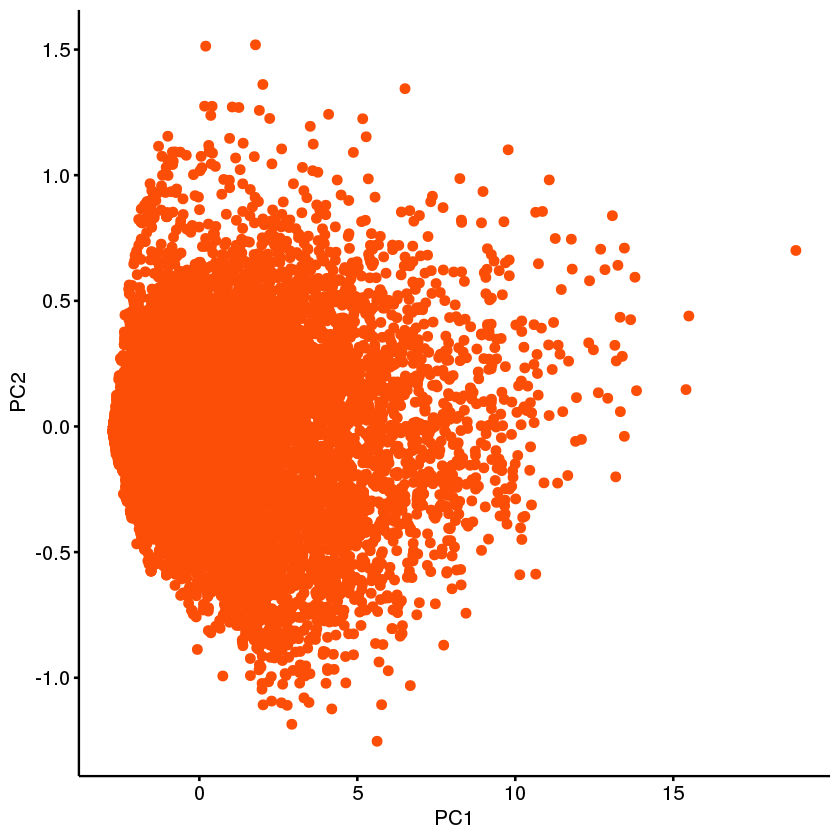

In [19]:
onc_pca_spec_exp_3_down <- as.data.frame(pca_res_spec_exp_3_down$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_3_down, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_3_down <- as.data.frame(pca_res_spec_exp_3_down$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_3_down, x = "PC1", y = "PC2",
   color = "#FC4E07")

Using  as id variables



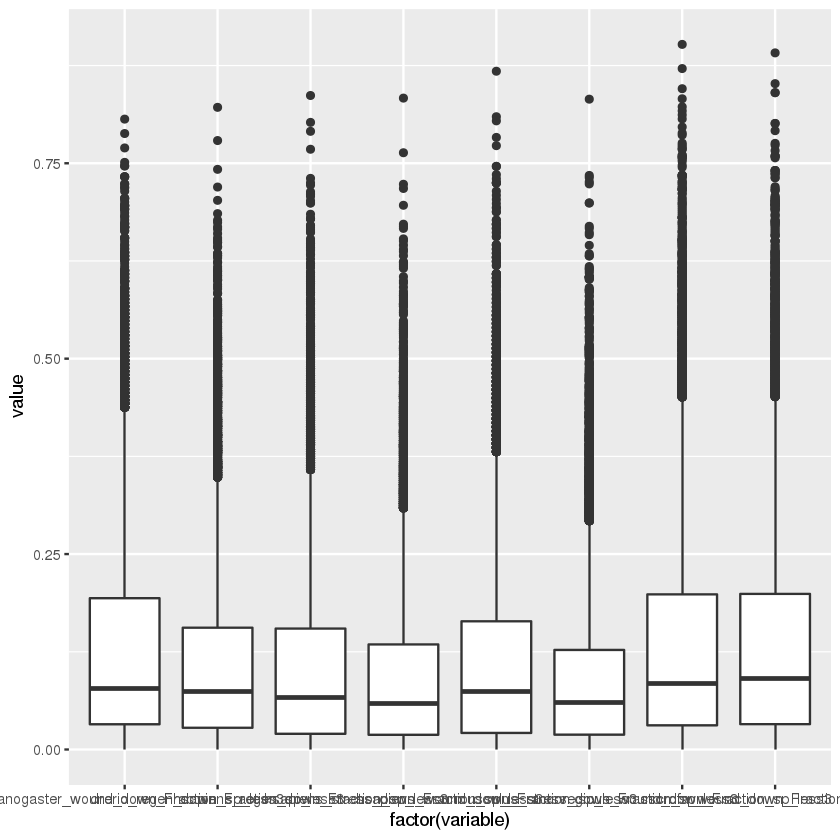

In [20]:
scale_spec_exp_3_down <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("down_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_3_down)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

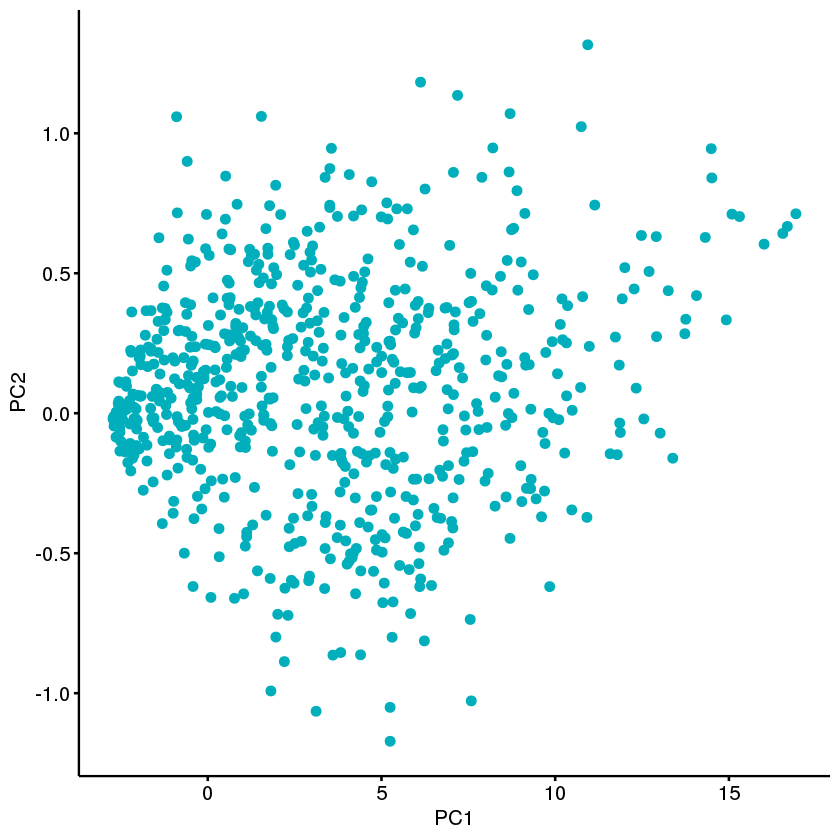

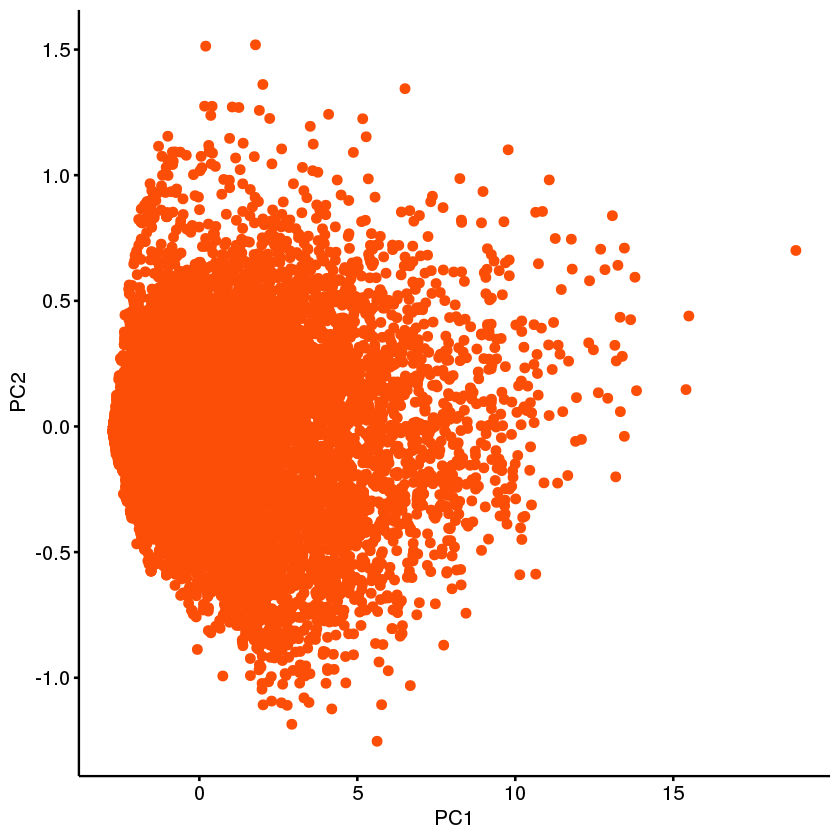

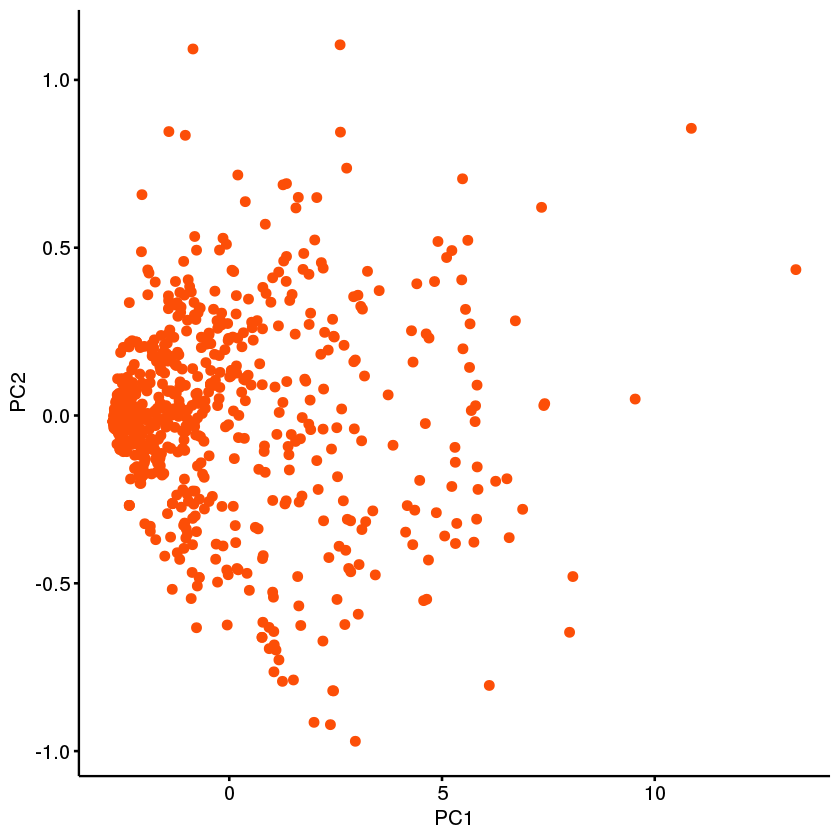

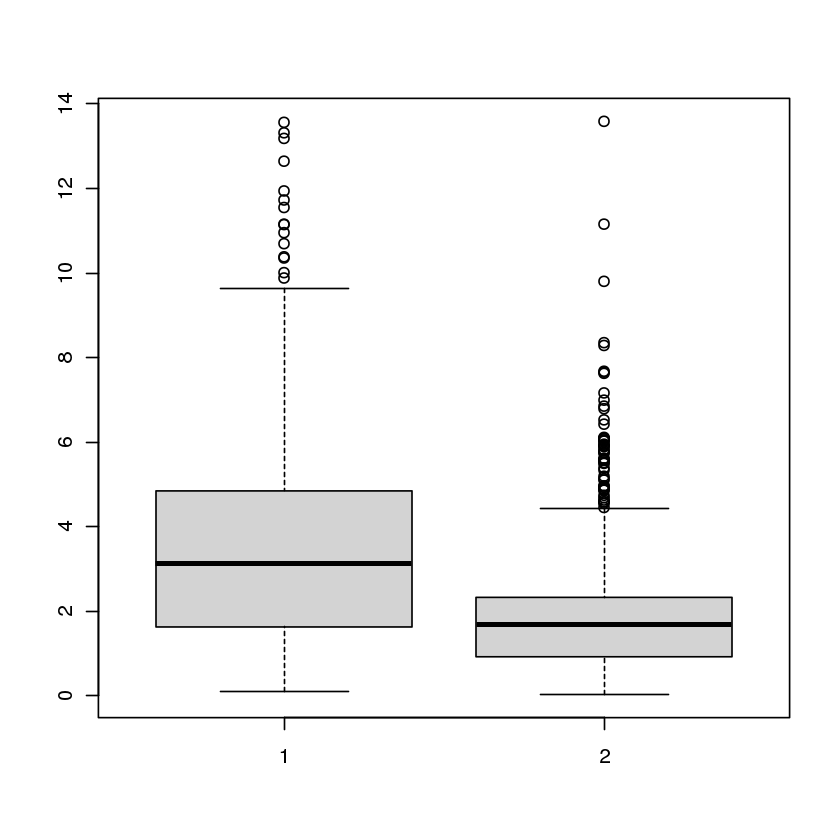

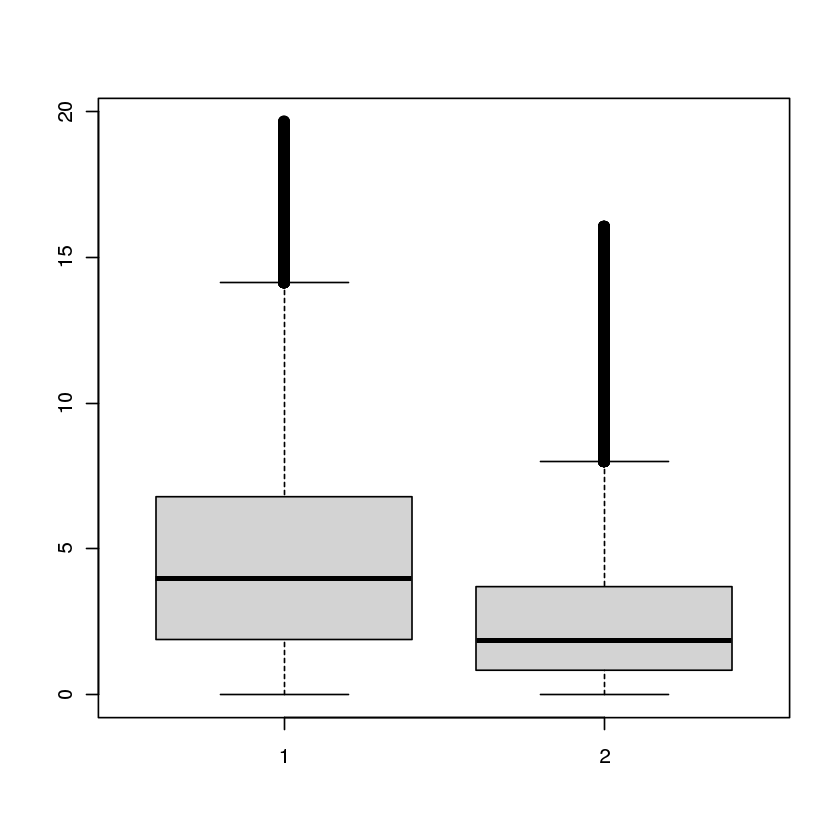

...

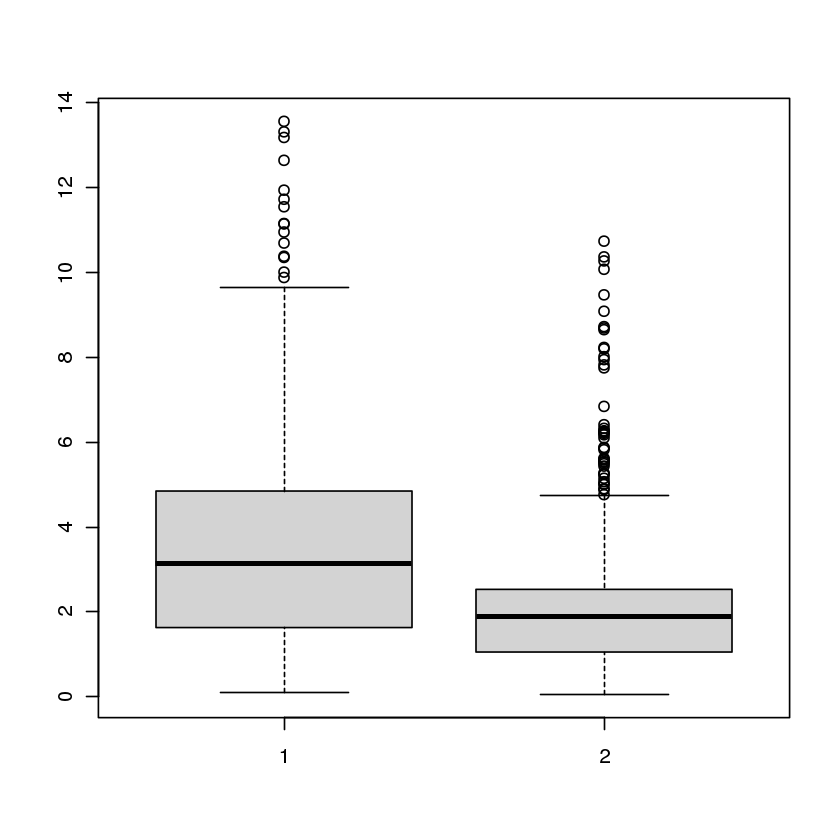

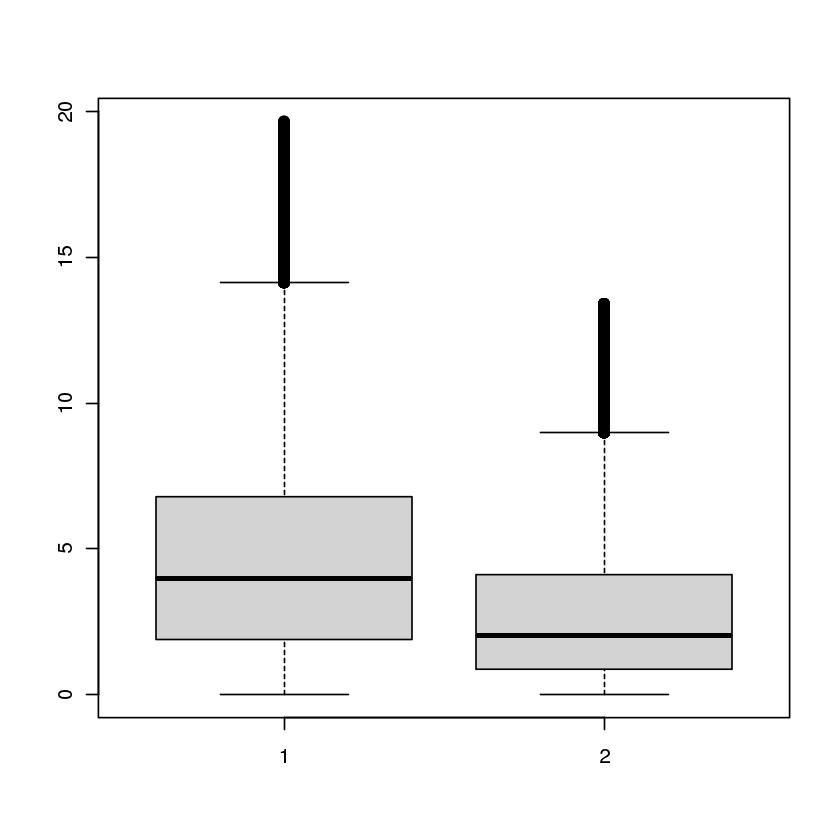

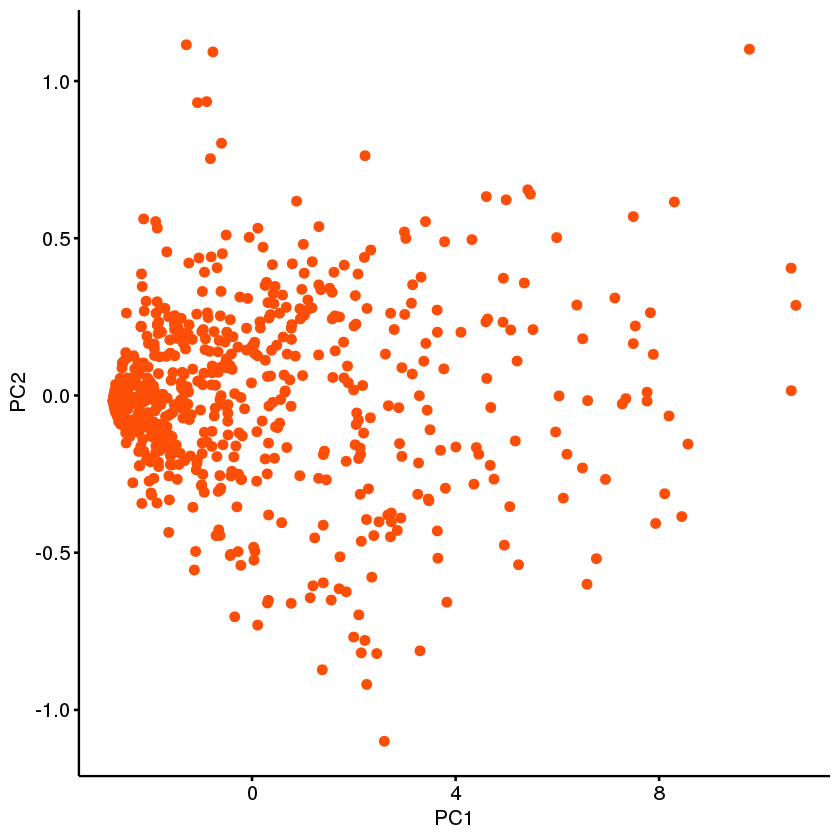

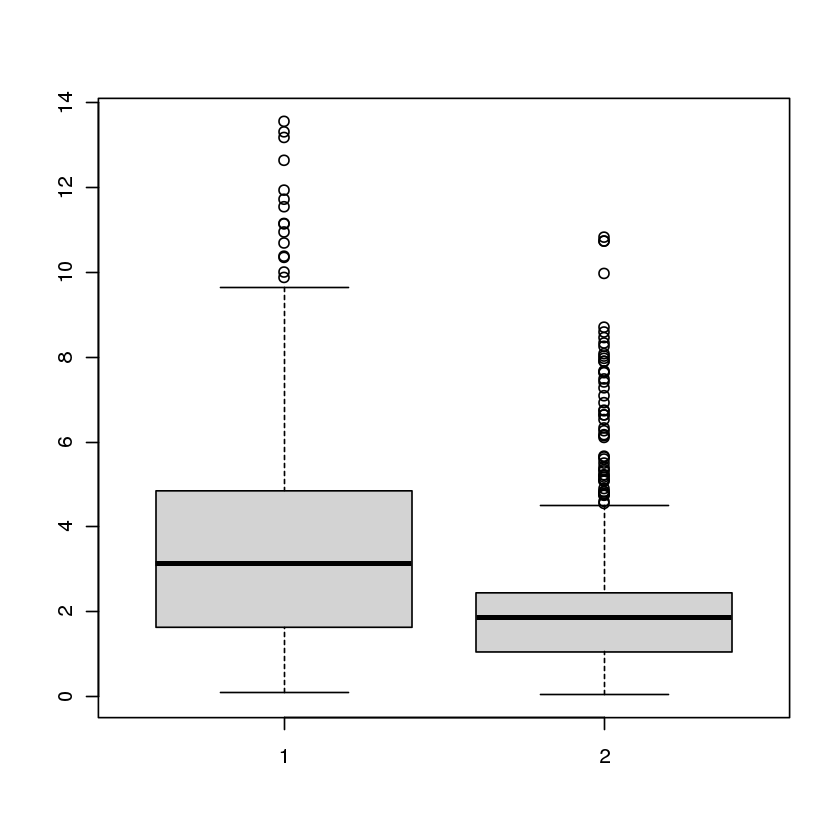

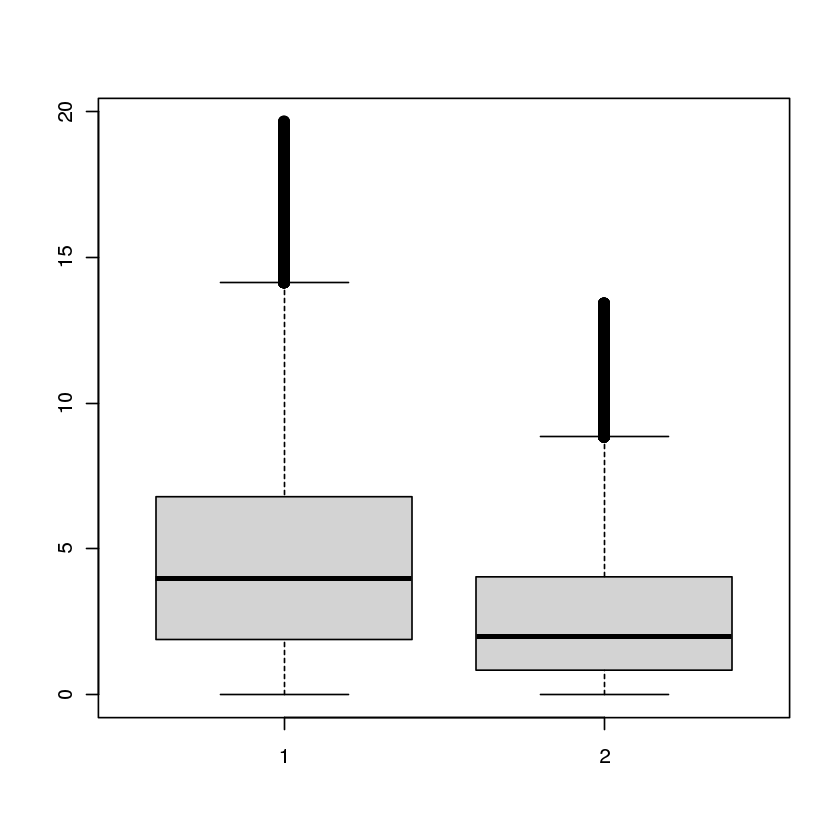

In [21]:
path_spec_exp_3_down_lists <- get_distance_measures(pca_res_spec_exp_3_down, fractions_initial_combinedDF)

### human up

In [ ]:
scale_spec_exp_3_human_up <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_3_human_up <- prcomp(scale_spec_exp_3_human_up, scale. = TRUE)
autoplot(pca_res_spec_exp_3_human_up)
autoplot(pca_res_spec_exp_3_human_up, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_3_human_up, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

In [ ]:
onc_pca_spec_exp_3_human_up <- as.data.frame(pca_res_spec_exp_3_human_up$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_3_human_up, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_3_human_up <- as.data.frame(pca_res_spec_exp_3_human_up$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_3_human_up, x = "PC1", y = "PC2",
   color = "#FC4E07")

In [ ]:
scale_spec_exp_3_human_up <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("hsapiens.*up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_3_human_up)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

In [ ]:
path_spec_exp_3_human_up_lists <- get_distance_measures(pca_res_spec_exp_3_human_up, fractions_initial_combinedDF)

### human down

In [ ]:
scale_spec_exp_3_human_down <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_3_human_down <- prcomp(scale_spec_exp_3_human_down, scale. = TRUE)
autoplot(pca_res_spec_exp_3_human_down)
autoplot(pca_res_spec_exp_3_human_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_3_human_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

In [ ]:
onc_pca_spec_exp_3_human_down <- as.data.frame(pca_res_spec_exp_3_human_down$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_3_human_down, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_3_human_down <- as.data.frame(pca_res_spec_exp_3_human_down$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_3_human_down, x = "PC1", y = "PC2",
   color = "#FC4E07")

In [ ]:
scale_spec_exp_3_human <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("down_Fraction_sp_less3",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_3)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

In [ ]:
path_spec_exp_3_human_down_lists <- get_distance_measures(pca_res_spec_exp_3_human_down, fractions_initial_combinedDF)

## spec_exp_type PCA < 4

### upregulated

In [20]:
colnames(fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]])

[1] "amexicanum_regen_up_Fraction_sp_less4"      
 [2] "celegans_stress_up_Fraction_sp_less4"       
 [3] "clupisFamiliaris_wound_up_Fraction_sp_less4"
 [4] "dmelanogaster_stress_up_Fraction_sp_less4"  
 [5] "dmelanogaster_wound_up_Fraction_sp_less4"   
 [6] "drerio_regen_up_Fraction_sp_less4"          
 [7] "hsapiens_regen_up_Fraction_sp_less4"        
 [8] "hsapiens_stress_up_Fraction_sp_less4"       
 [9] "hsapiens_wound_up_Fraction_sp_less4"        
[10] "mmusculus_stress_up_Fraction_sp_less4"      
[11] "rnorvegicus_wound_up_Fraction_sp_less4"     
[12] "sscrofa_wound_up_Fraction_sp_less4"

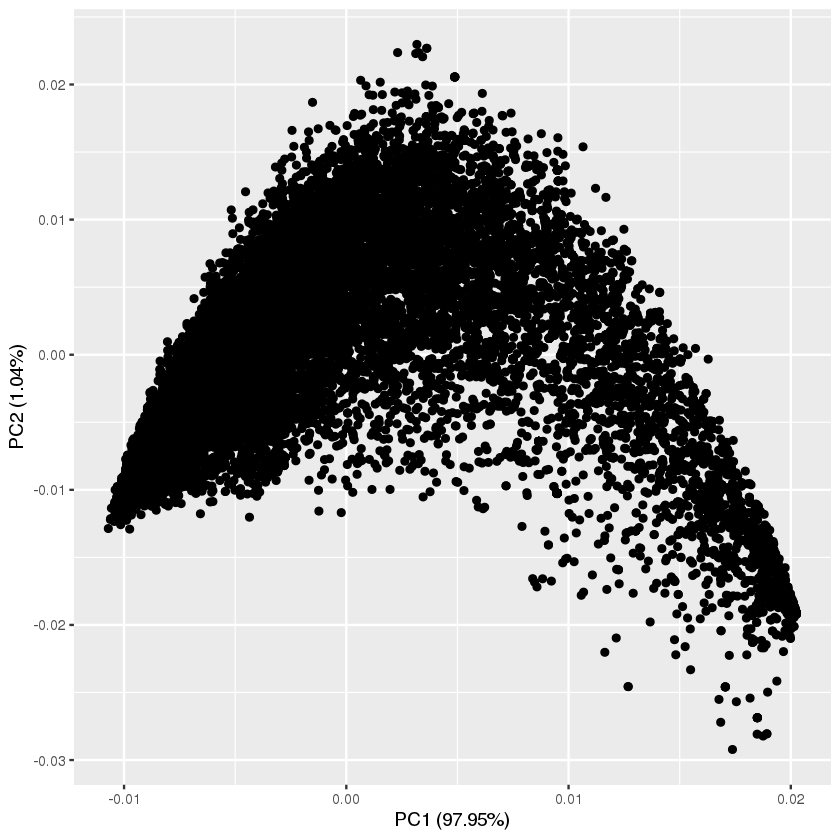

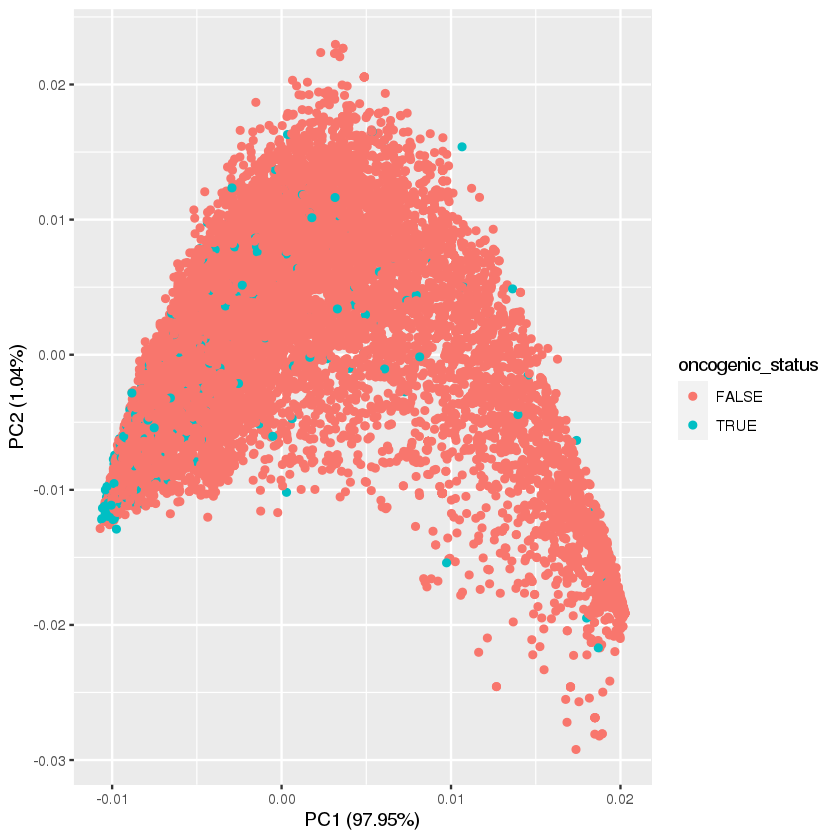

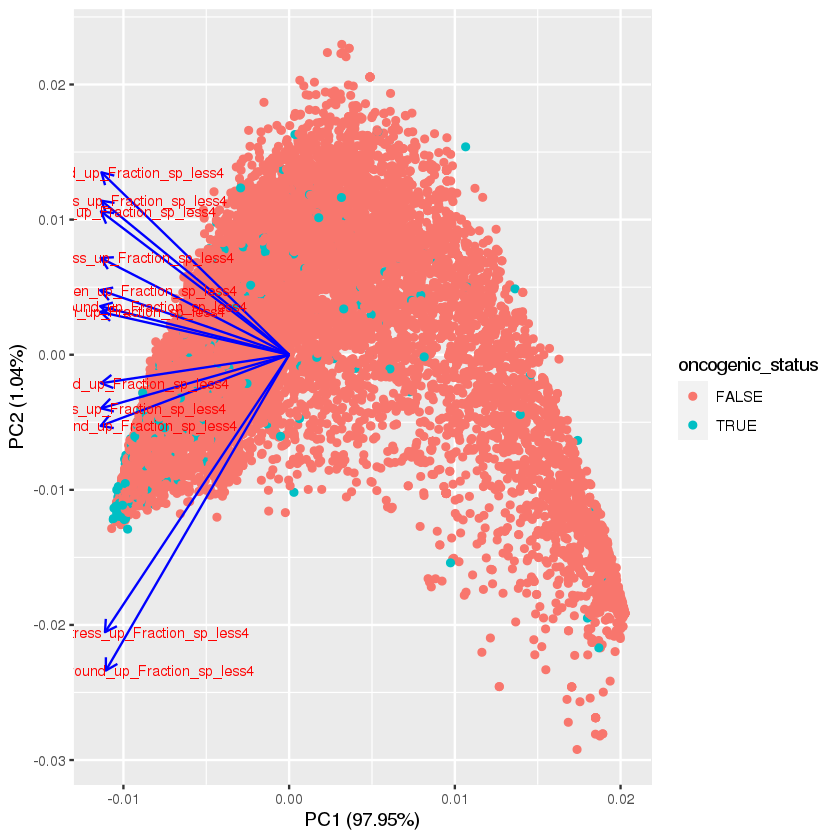

In [21]:
scale_spec_exp <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp <- prcomp(scale_spec_exp, scale. = TRUE)
autoplot(pca_res_spec_exp)
autoplot(pca_res_spec_exp, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

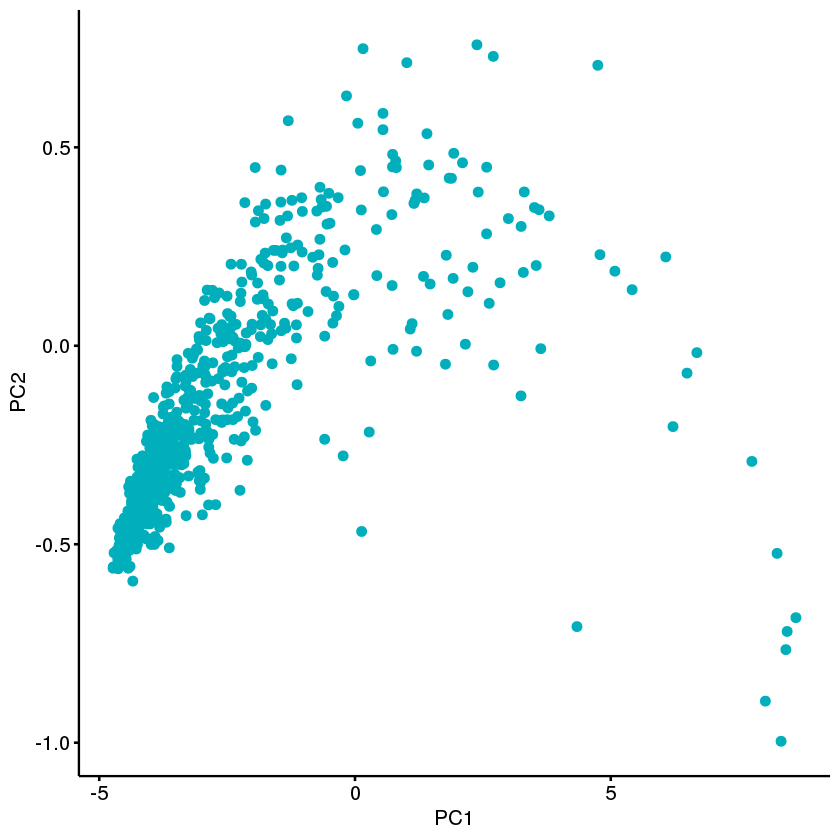

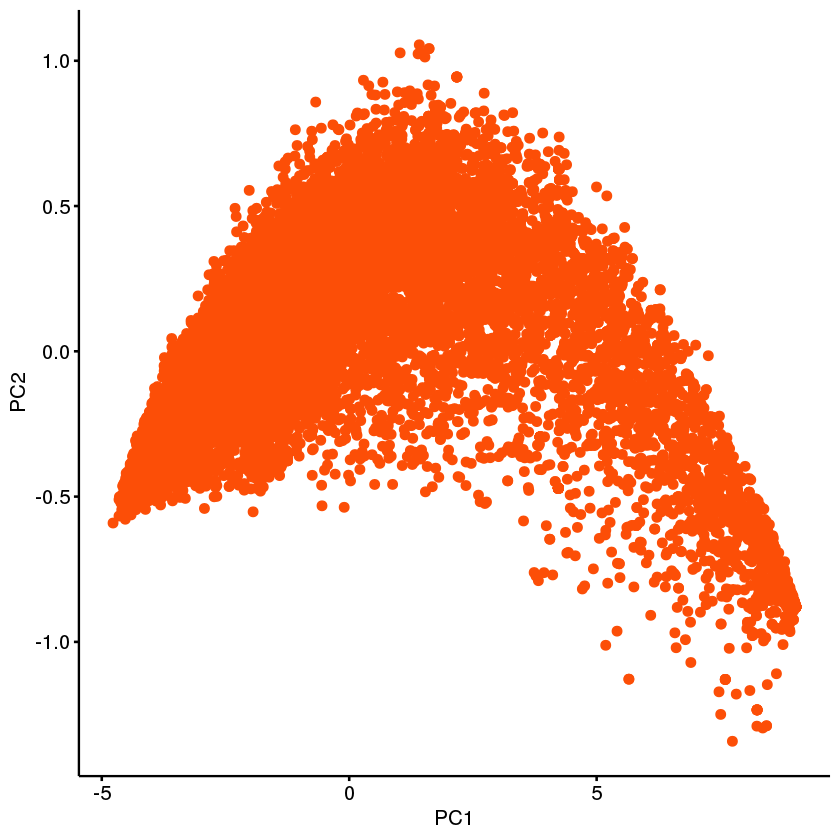

In [22]:
onc_pca_spec_exp <- as.data.frame(pca_res_spec_exp$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp <- as.data.frame(pca_res_spec_exp$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp, x = "PC1", y = "PC2",
   color = "#FC4E07")

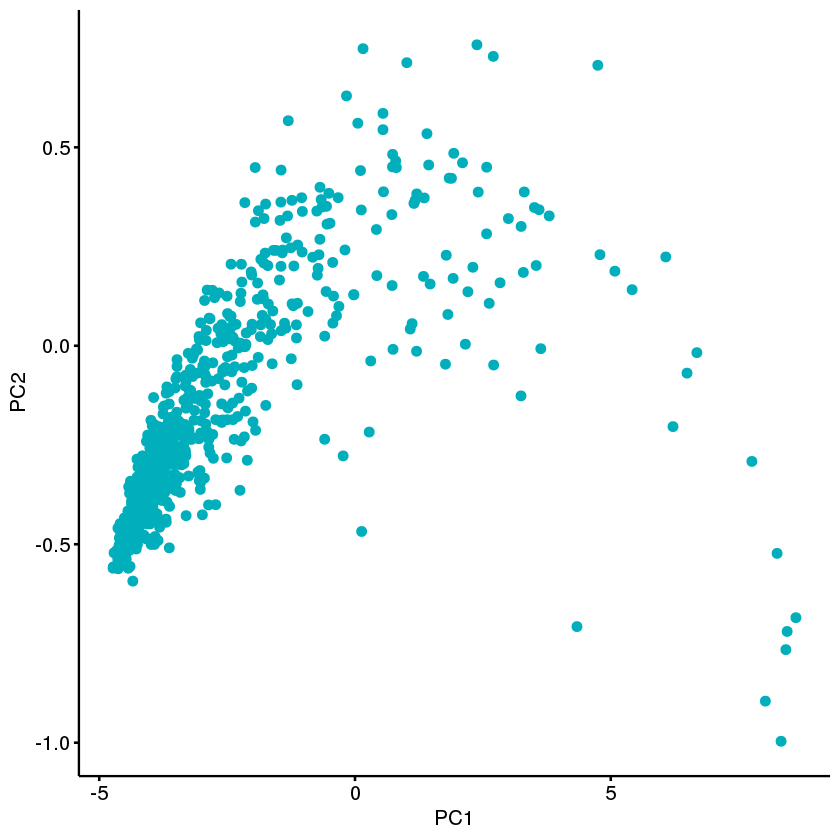

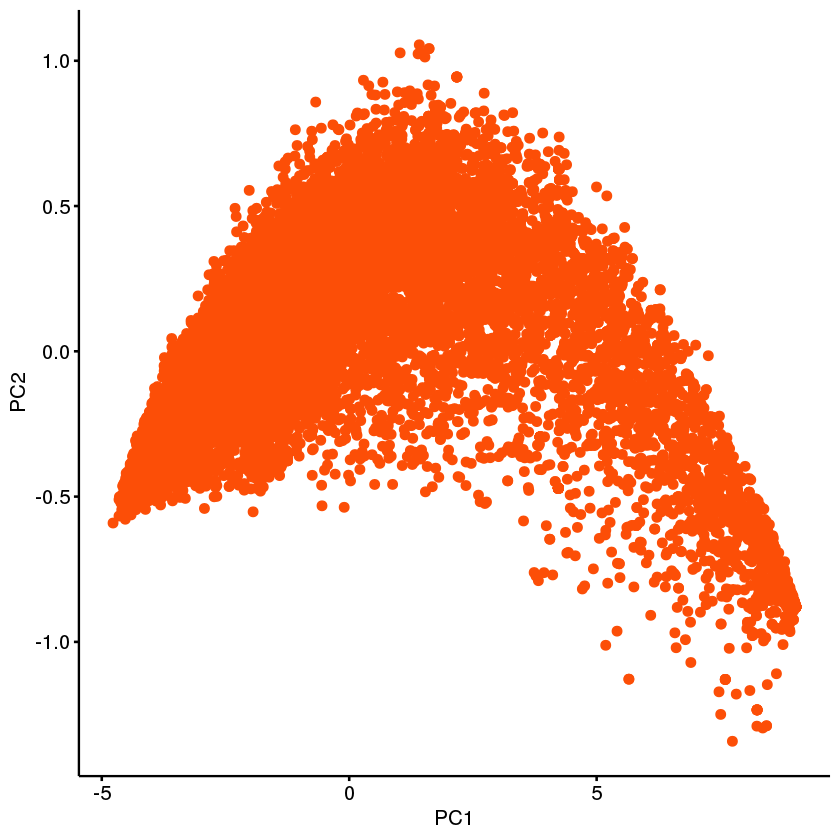

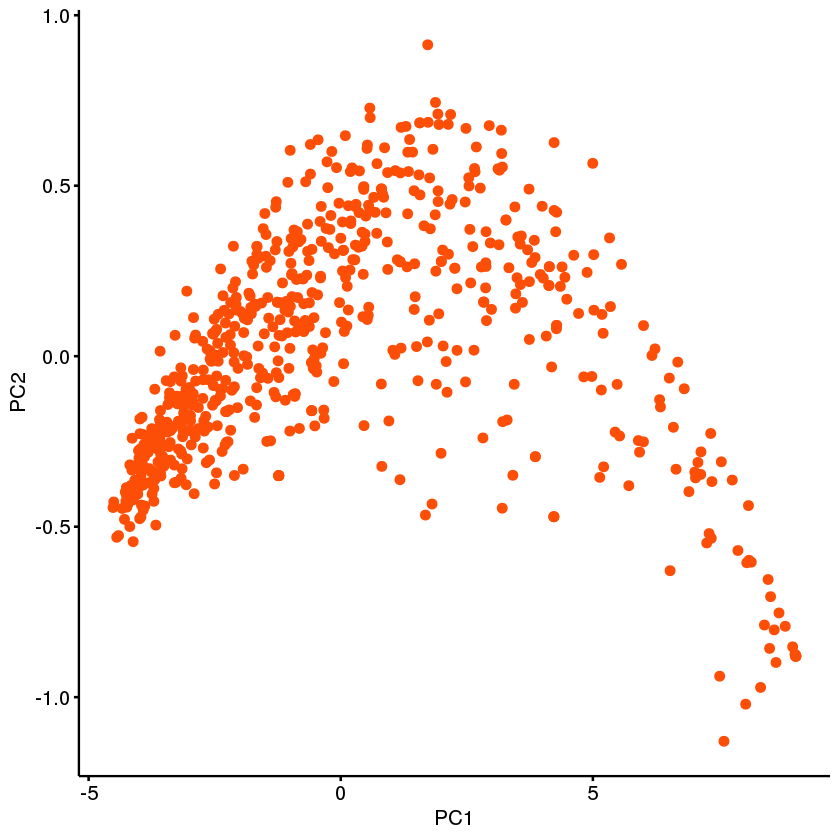

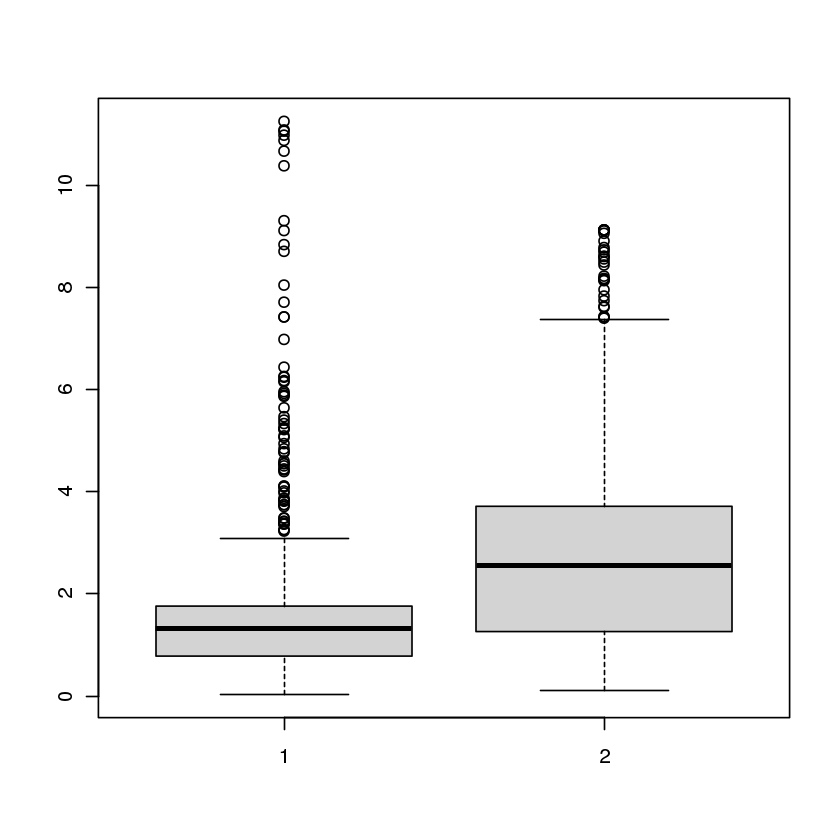

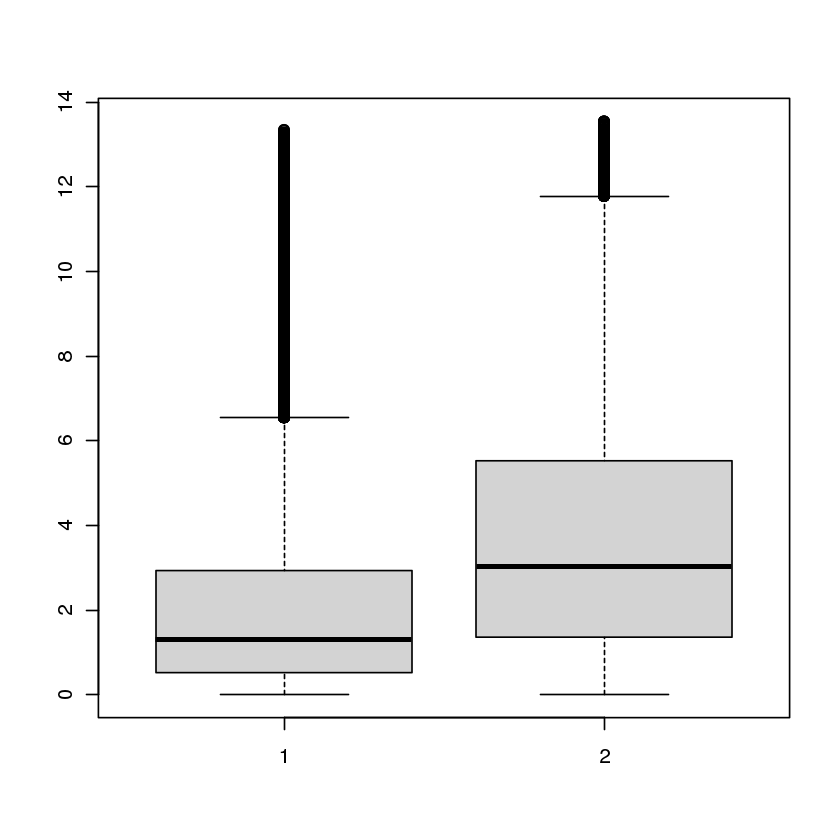

In [23]:
path_spec_exp_up_lists <- get_distance_measures(pca_res_spec_exp, fractions_initial_combinedDF)

In [ ]:
path_spec_exp_up_lists$pval_list

Using  as id variables



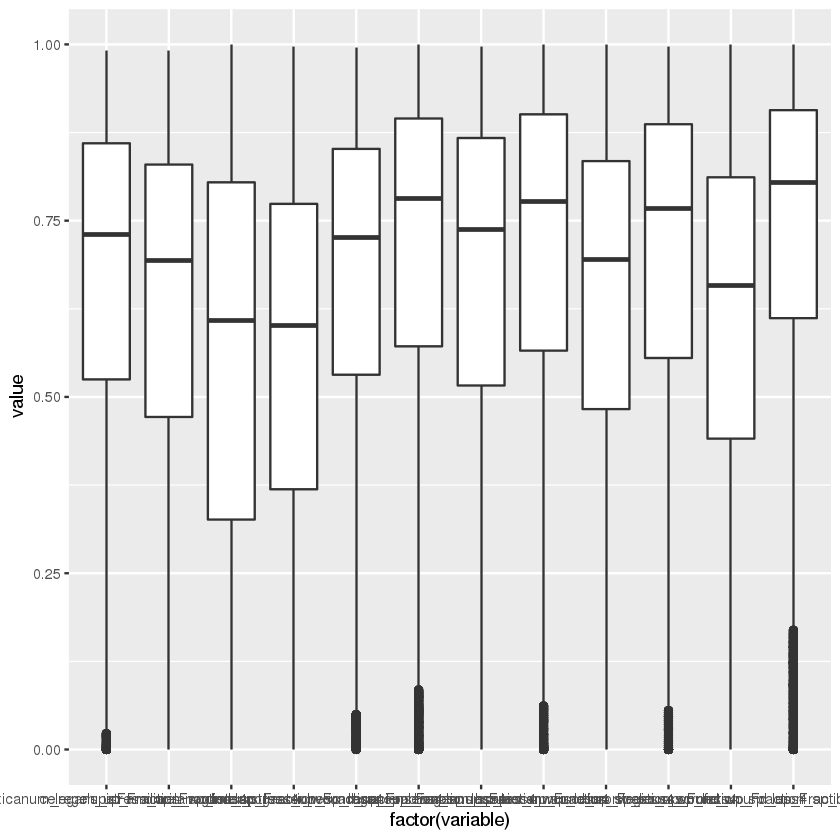

In [24]:
scale_spec_exp_4 <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("up_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_4)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

Using  as id variables



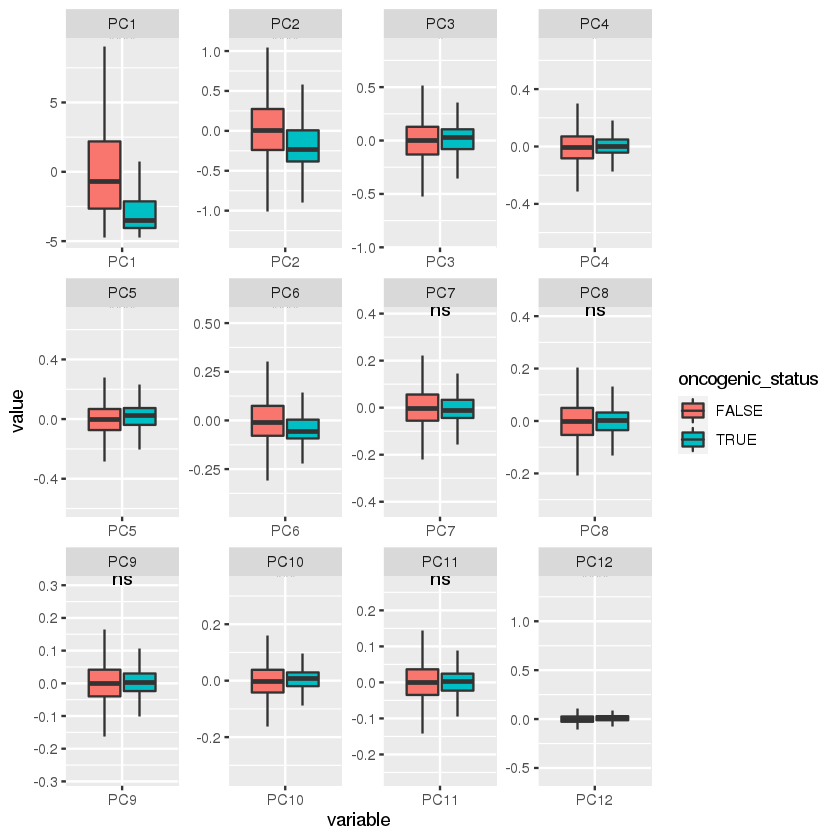

In [25]:
pca_melted_up4 <- cbind(melt(as.data.frame(pca_res_spec_exp$x)), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(pca_res_spec_exp$x)))

ggplot(pca_melted_up4, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



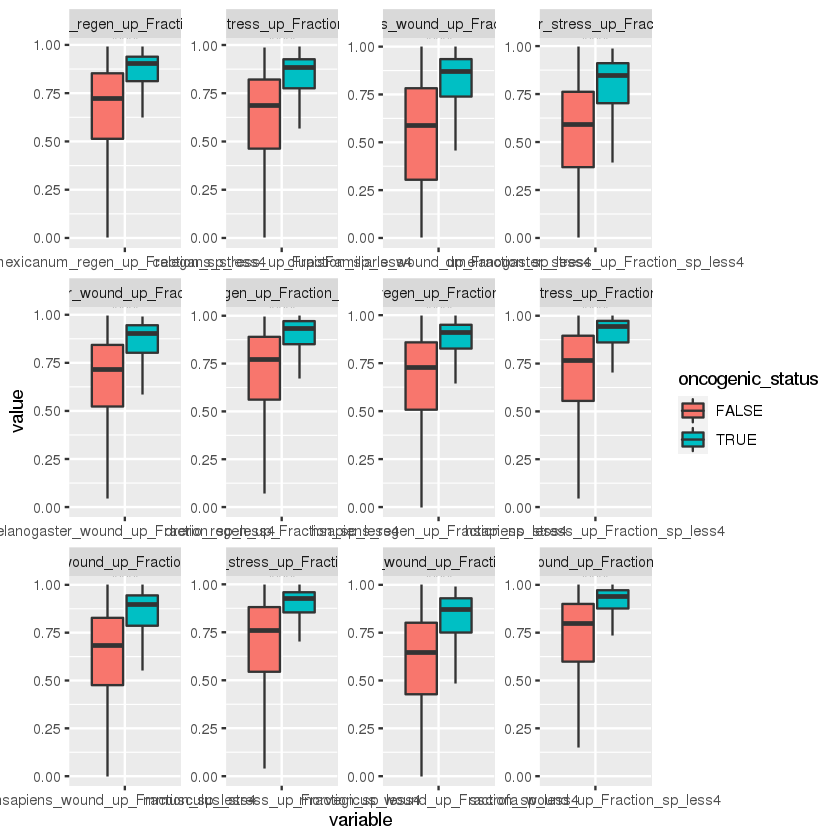

In [26]:
pca_melted_exp_up4_raw <- cbind(melt(scale_spec_exp), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(scale_spec_exp)))

ggplot(pca_melted_exp_up4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



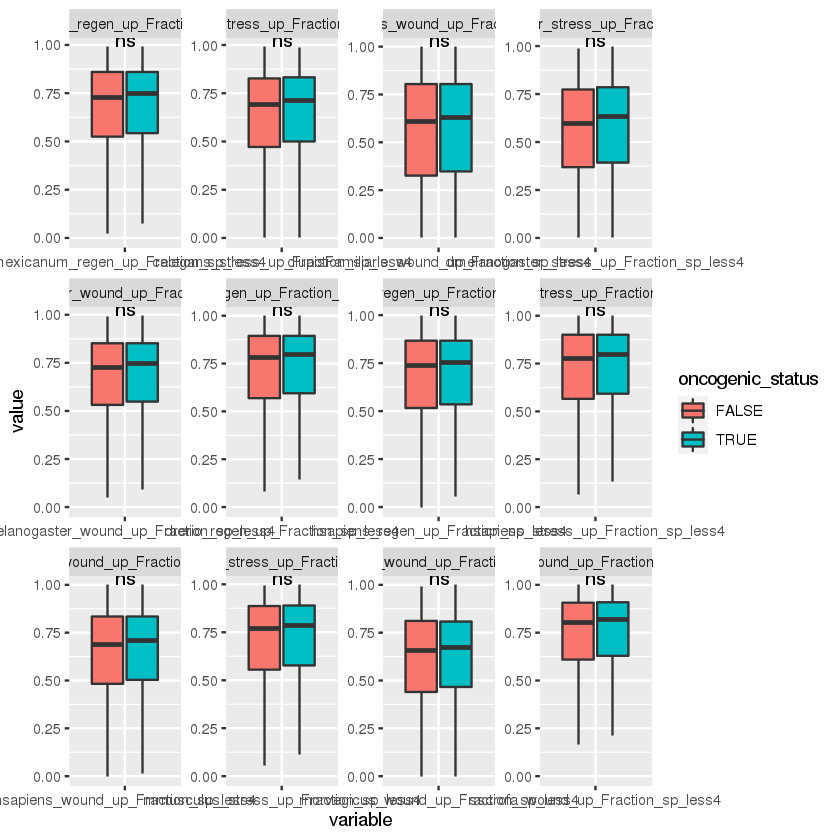

In [27]:
random_pca_melted_exp_up4_raw <- cbind(melt(scale_spec_exp), "oncogenic_status" = rep(sample(fractions_initial_combinedDF$oncogenic_status), ncol(scale_spec_exp)))

ggplot(random_pca_melted_exp_up4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



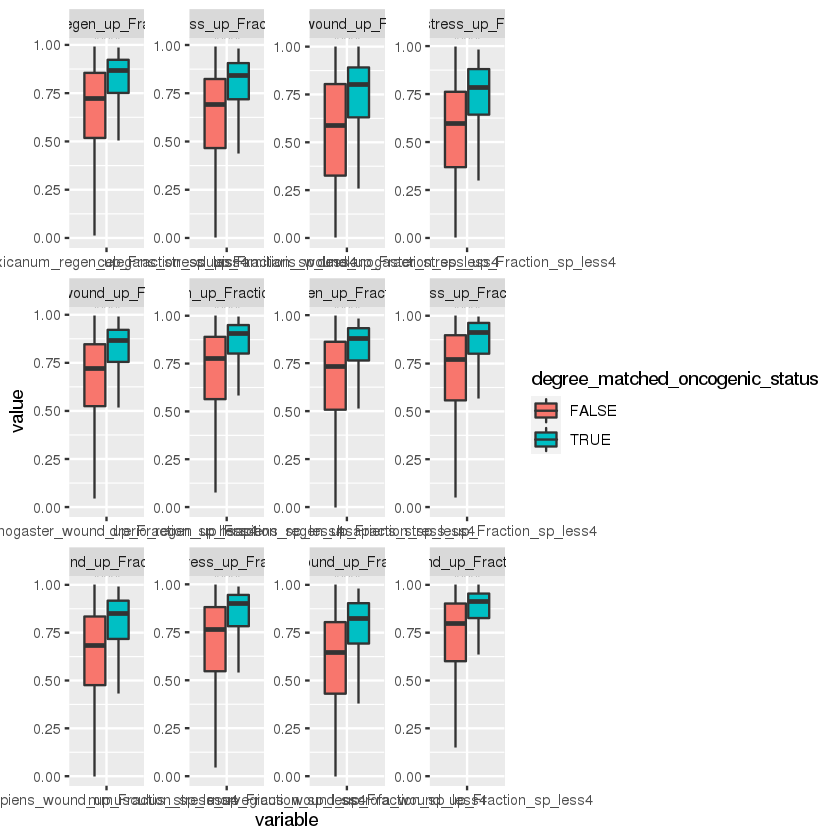

In [28]:
degree_matched_pca_melted_exp_up4_raw <- cbind(melt(scale_spec_exp), "degree_matched_oncogenic_status" = rep(fractions_initial_combinedDF$degree_matched_oncogenic_status, ncol(scale_spec_exp)))

ggplot(degree_matched_pca_melted_exp_up4_raw, aes(x=variable, y=value,
                                   fill=degree_matched_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = degree_matched_oncogenic_status), label = "p.signif")

Using  as id variables



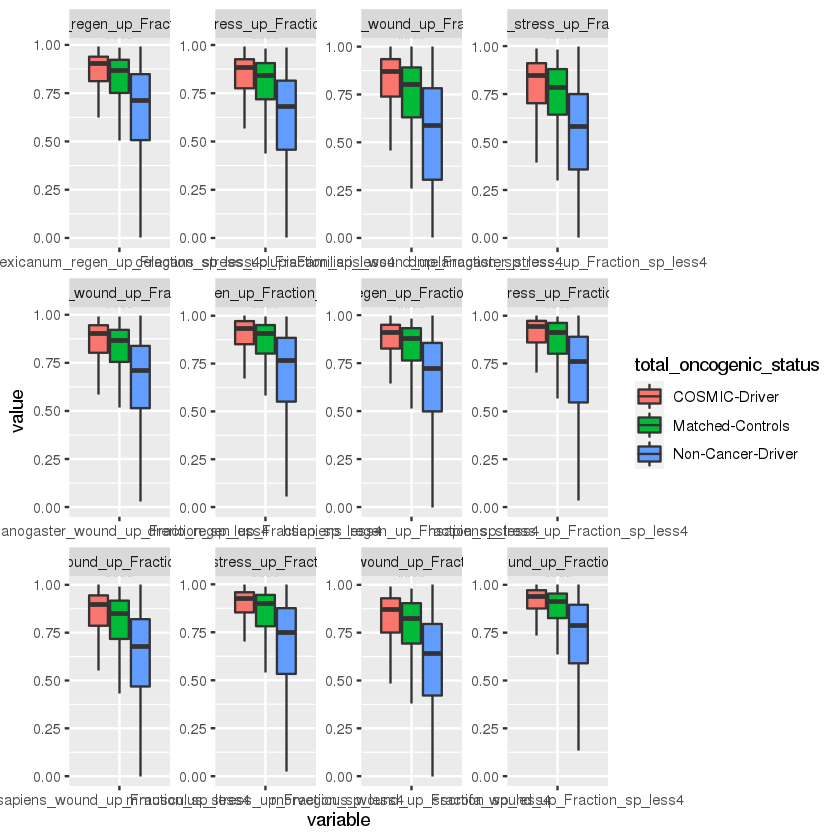

In [29]:
triple_pca_melted_exp_up4_raw <- cbind(melt(scale_spec_exp), "total_oncogenic_status" = rep(fractions_initial_combinedDF$total_oncogenic_status, ncol(scale_spec_exp)))

ggplot(triple_pca_melted_exp_up4_raw, aes(x=variable, y=value,
                                   fill=total_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = total_oncogenic_status), label = "p.signif")

### downregulated

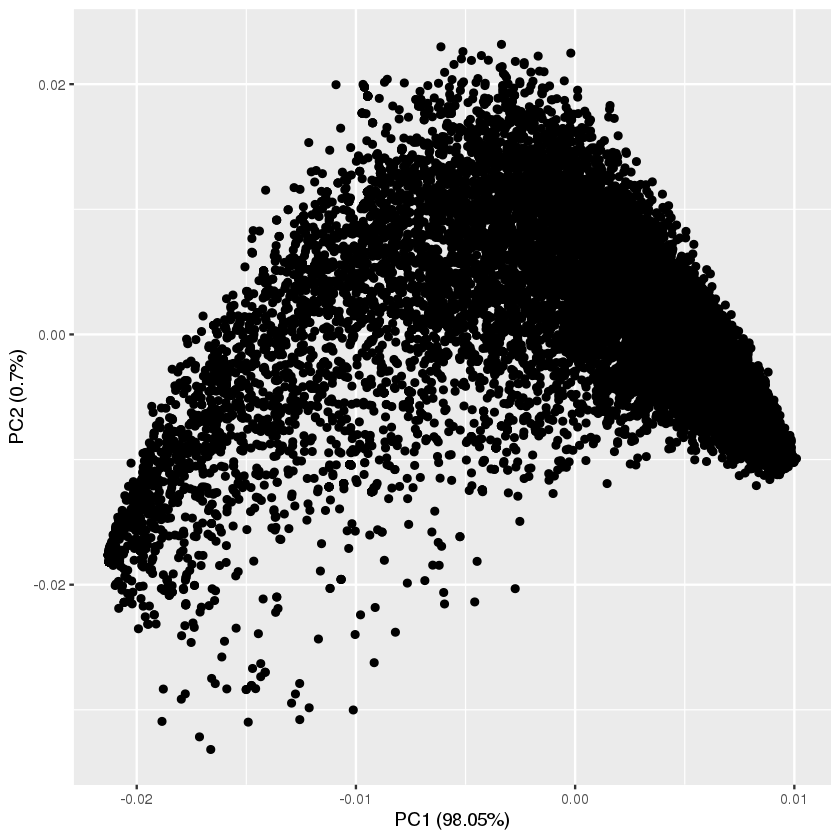

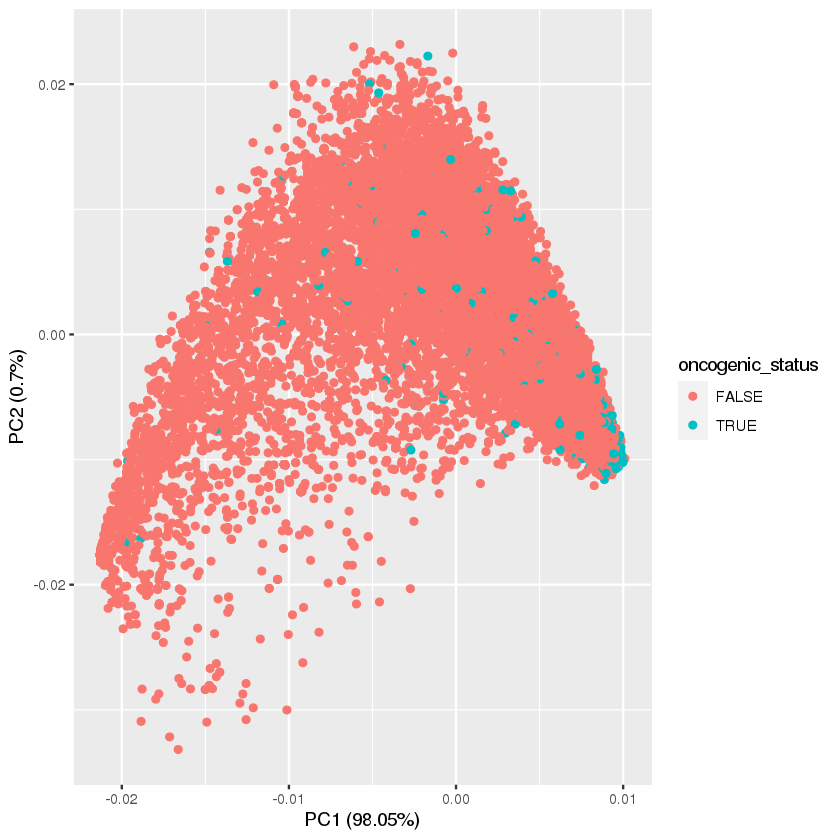

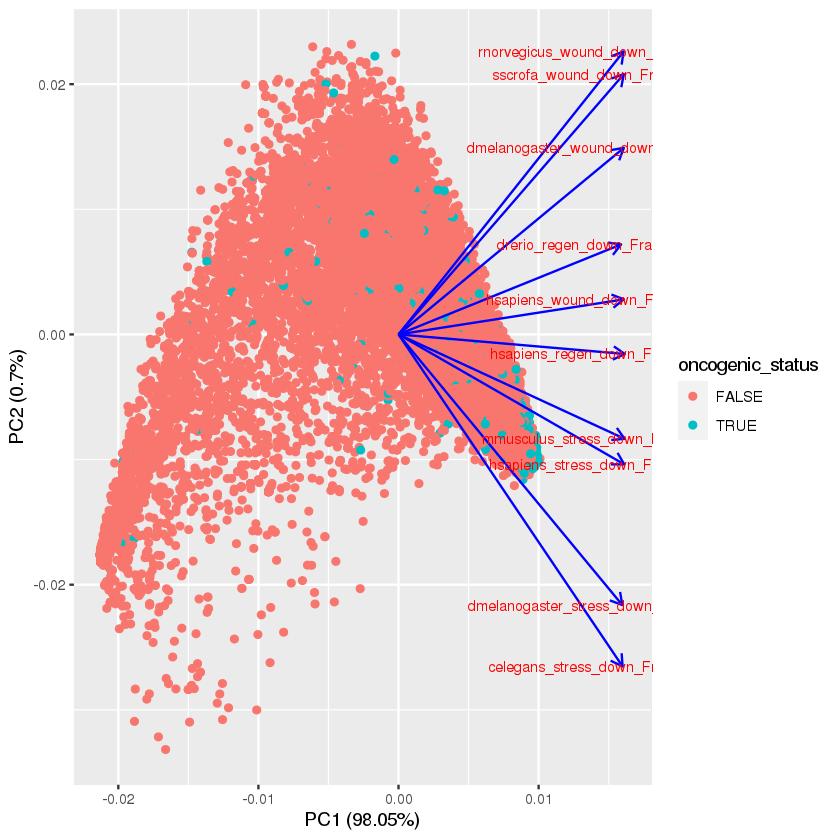

In [30]:
scale_spec_exp_down <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("down_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_down <- prcomp(scale_spec_exp_down, scale. = TRUE)
autoplot(pca_res_spec_exp_down)
autoplot(pca_res_spec_exp_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_down, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

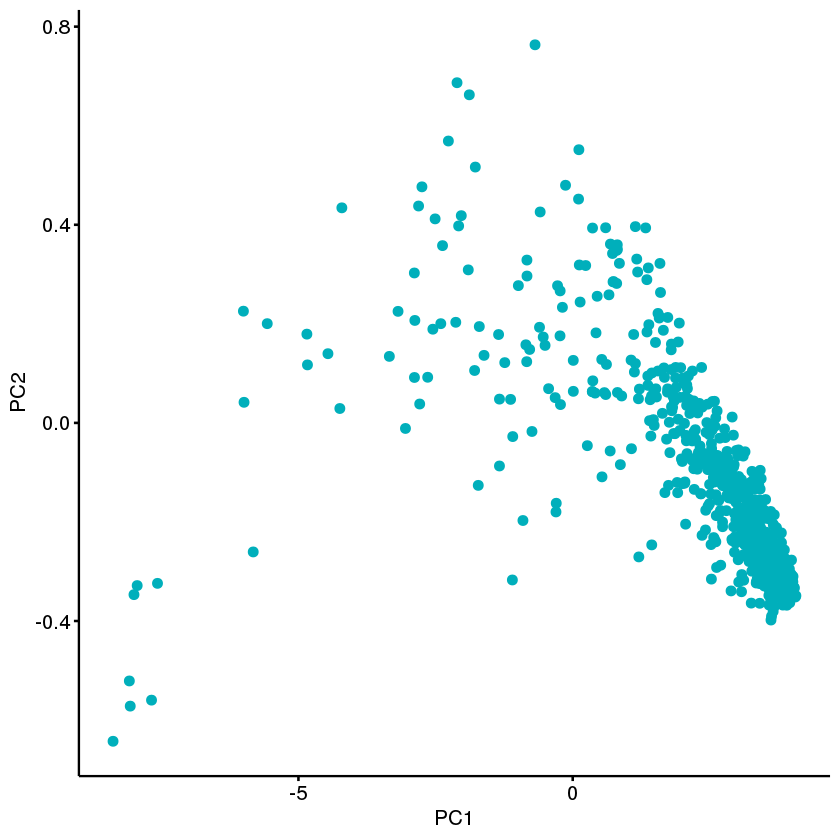

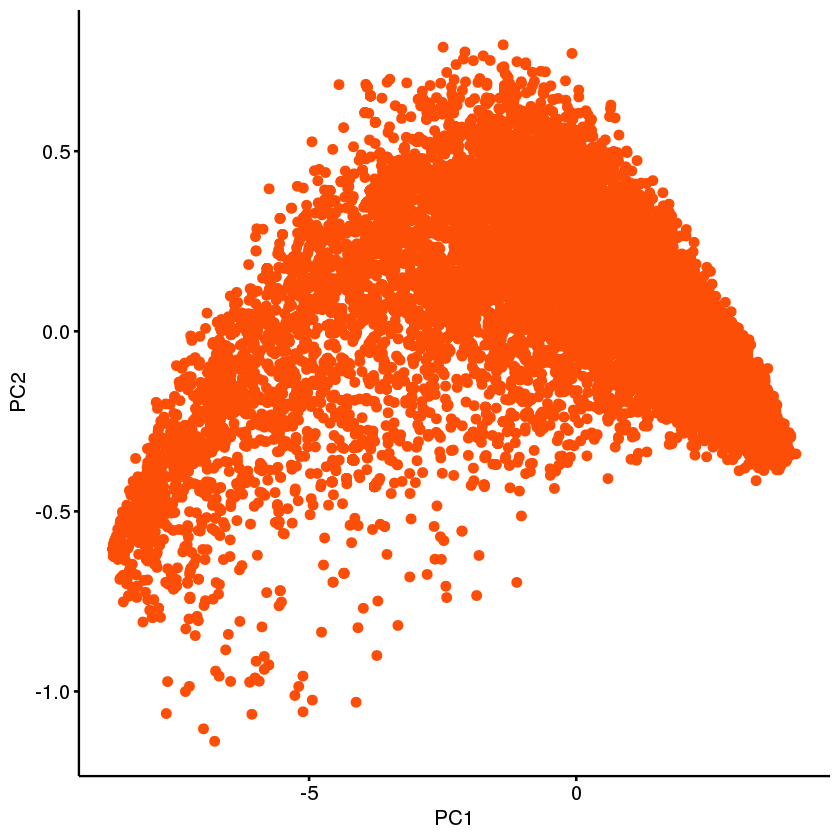

In [31]:
onc_pca_spec_exp_down <- as.data.frame(pca_res_spec_exp_down$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_down, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_down <- as.data.frame(pca_res_spec_exp_down$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_down, x = "PC1", y = "PC2",
   color = "#FC4E07")

Using  as id variables



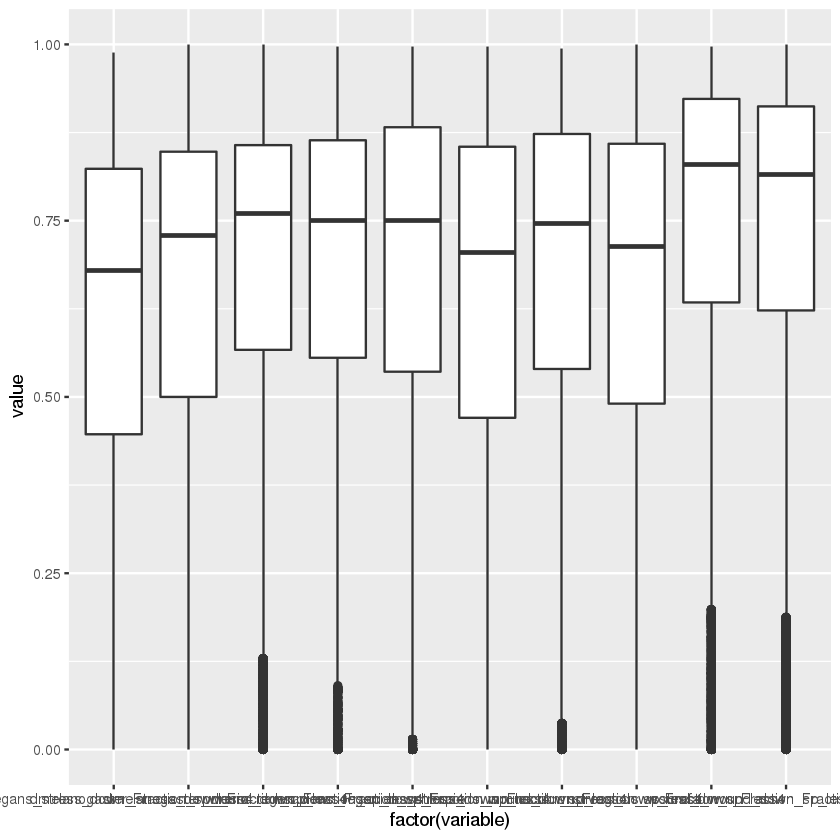

In [32]:
scale_spec_exp_4_down <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("down_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_4_down)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

In [ ]:
path_spec_exp_down_lists <- get_distance_measures(pca_res_spec_exp_down, fractions_initial_combinedDF)

In [ ]:
path_spec_exp_down_lists$pval_list

Using  as id variables



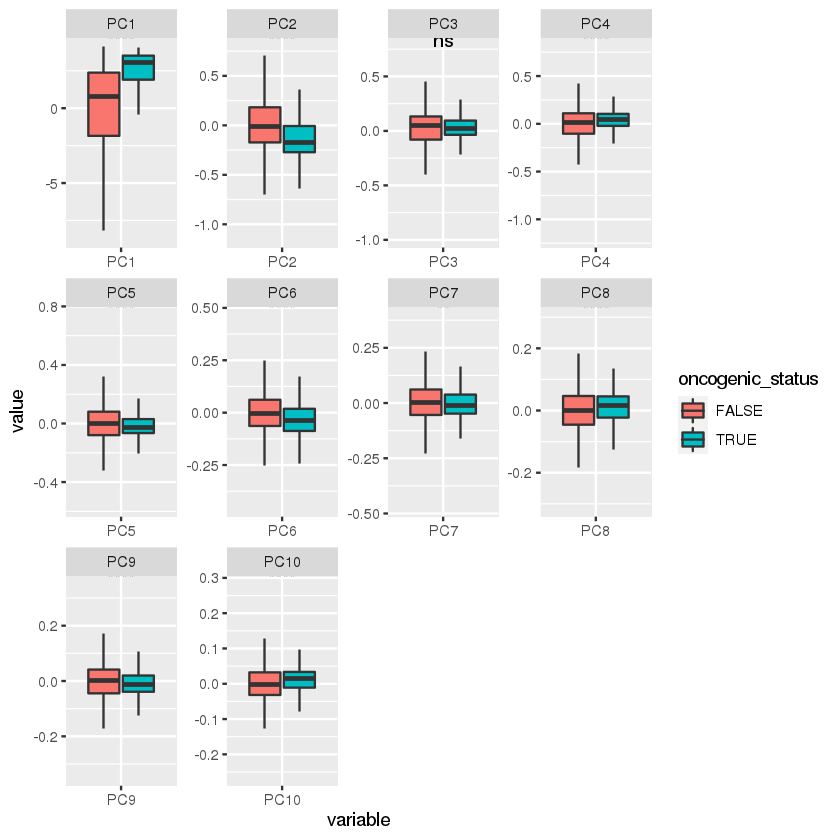

In [33]:
pca_melted_down4 <- cbind(melt(as.data.frame(pca_res_spec_exp_down$x)), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(pca_res_spec_exp_down$x)))

ggplot(pca_melted_down4, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



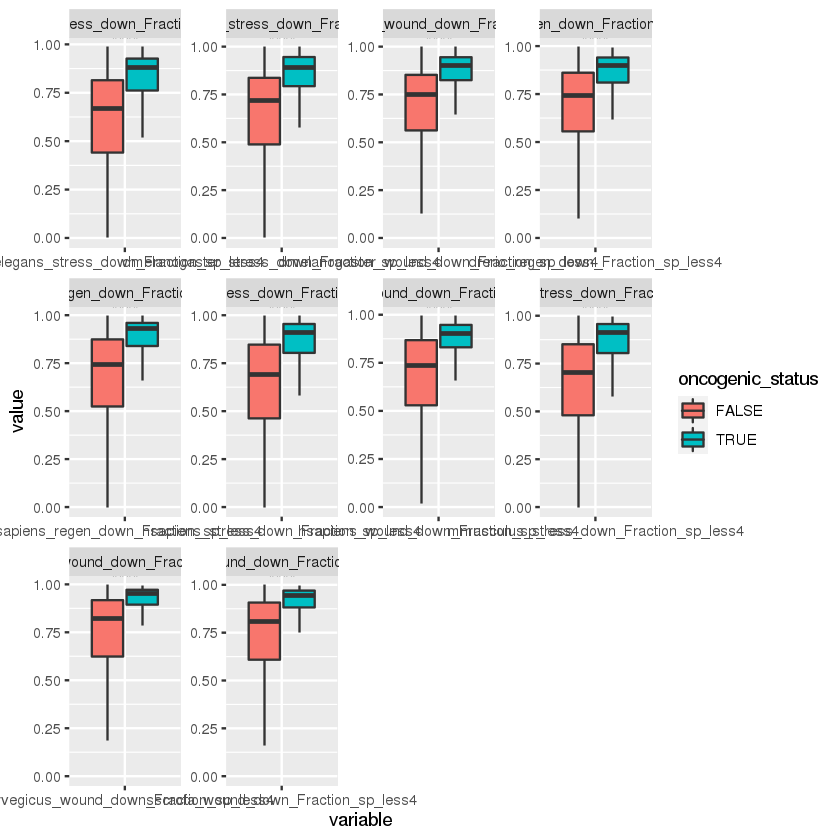

In [34]:
pca_melted_down4_raw <- cbind(melt(scale_spec_exp_down), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(scale_spec_exp_down)))

ggplot(pca_melted_down4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



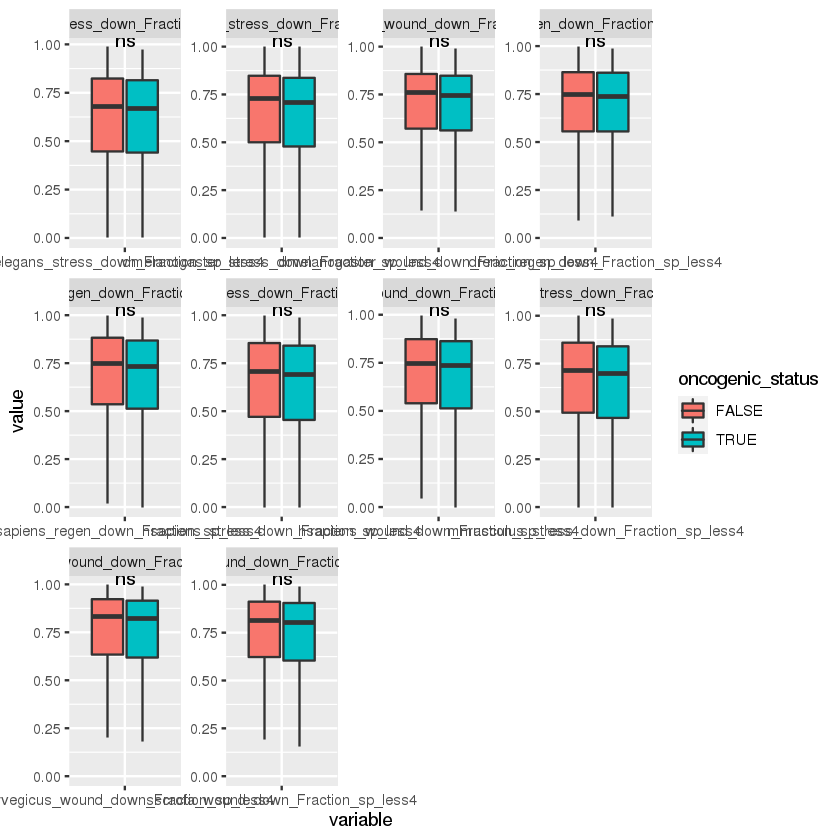

In [35]:
random_pca_melted_down4_raw <- cbind(melt(scale_spec_exp_down), "oncogenic_status" = rep(sample(fractions_initial_combinedDF$oncogenic_status), ncol(scale_spec_exp_down)))

ggplot(random_pca_melted_down4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



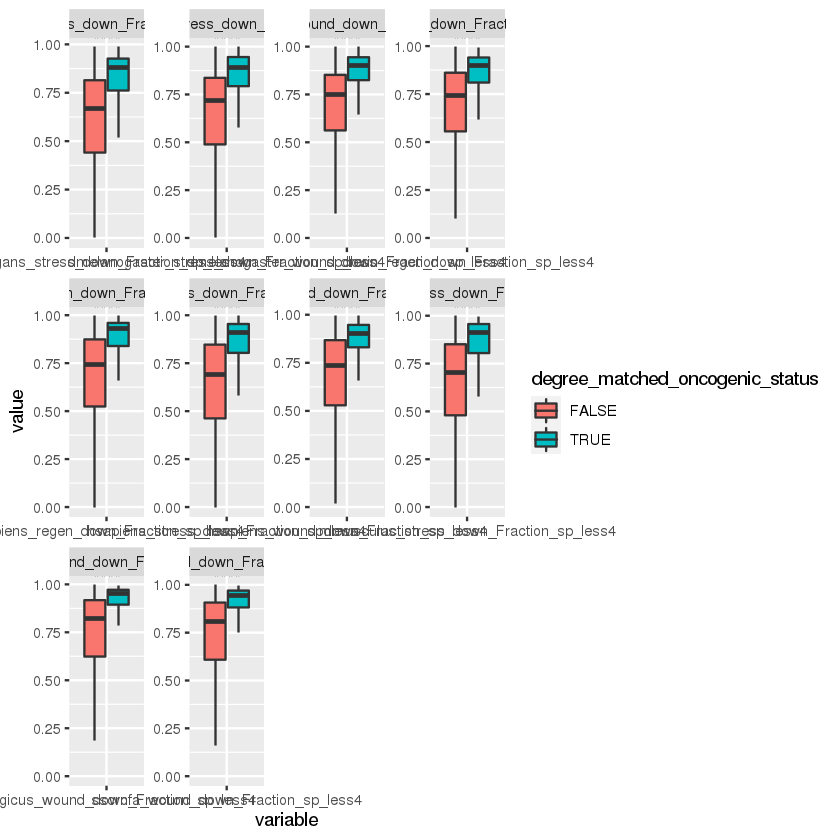

In [36]:
degree_matched_pca_melted_down4_raw <- cbind(melt(scale_spec_exp_down), "degree_matched_oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(scale_spec_exp_down)))

ggplot(degree_matched_pca_melted_down4_raw, aes(x=variable, y=value,
                                   fill=degree_matched_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = degree_matched_oncogenic_status), label = "p.signif")

Using  as id variables



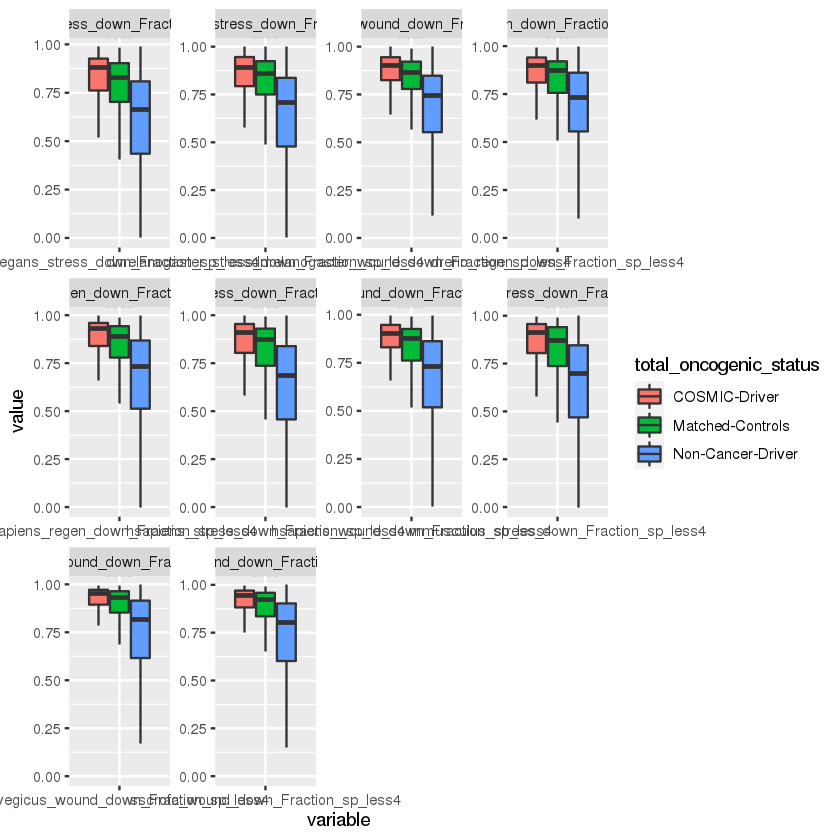

In [37]:
triple_pca_melted_down4_raw <- cbind(melt(scale_spec_exp_down), "total_oncogenic_status" = rep(fractions_initial_combinedDF$total_oncogenic_status, ncol(scale_spec_exp_down)))

ggplot(triple_pca_melted_down4_raw, aes(x=variable, y=value,
                                   fill=total_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = total_oncogenic_status), label = "p.signif")

### human up

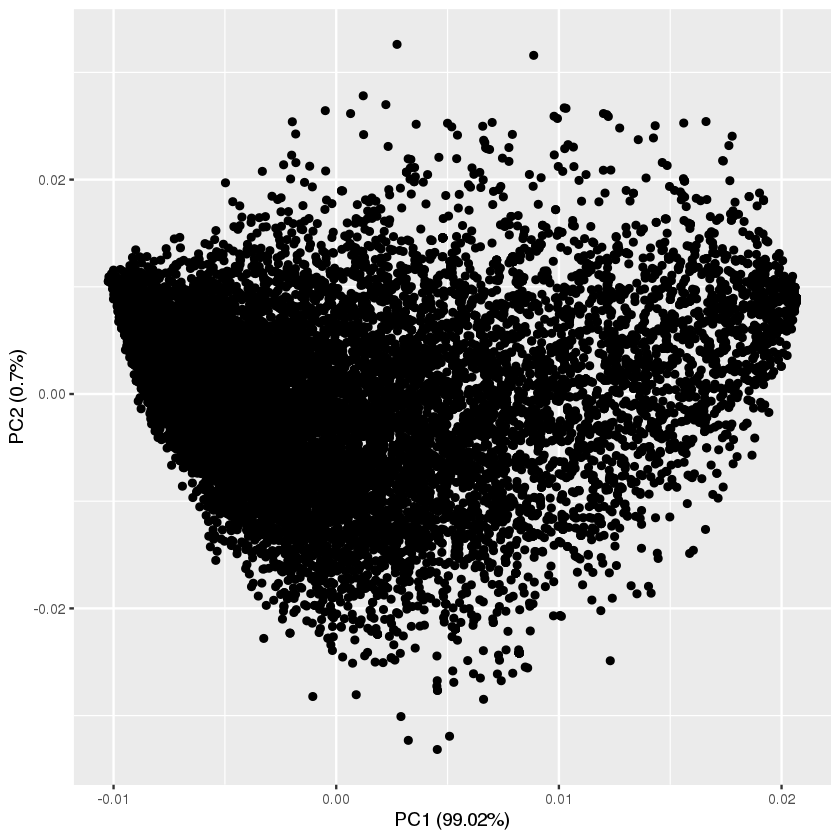

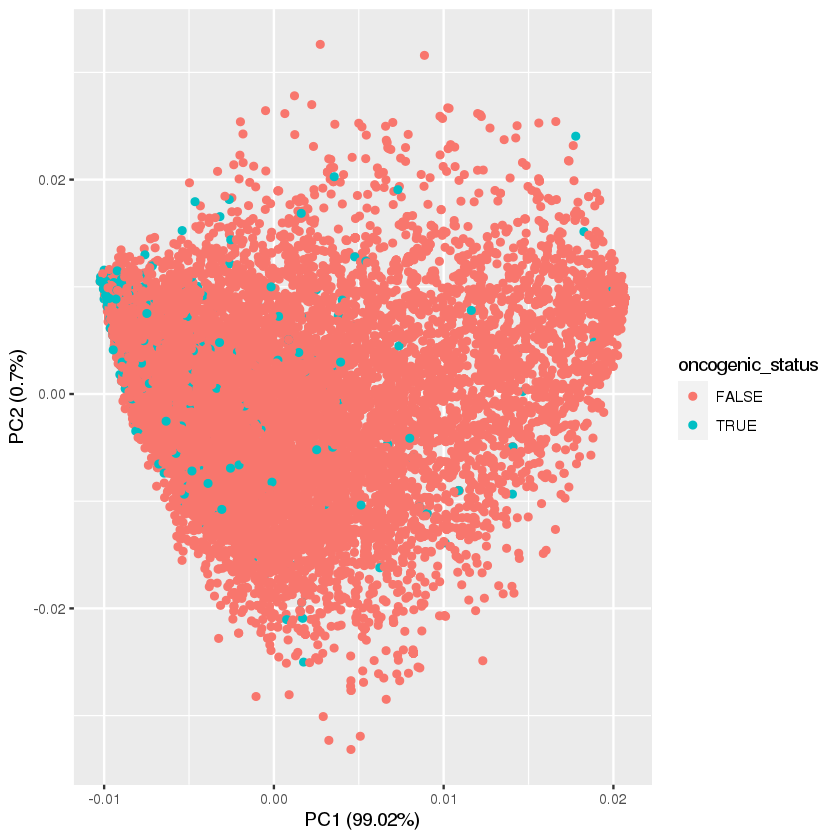

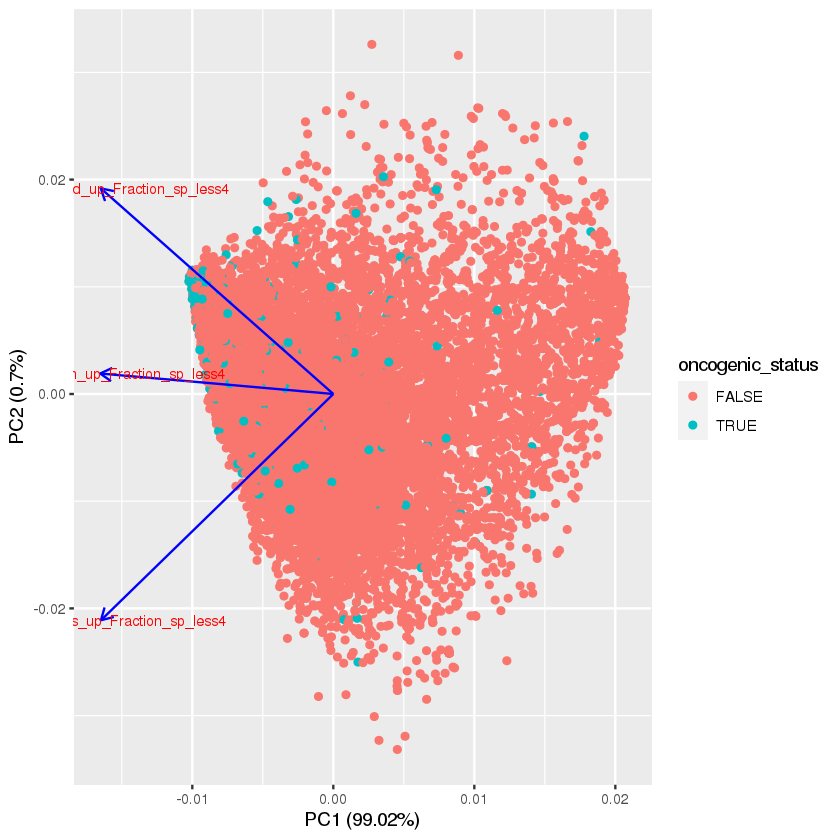

In [38]:
scale_spec_exp_human_up <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("hsapiens.*up_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_human_up <- prcomp(scale_spec_exp_human_up, scale. = TRUE)
autoplot(pca_res_spec_exp_human_up)
autoplot(pca_res_spec_exp_human_up, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_human_up, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

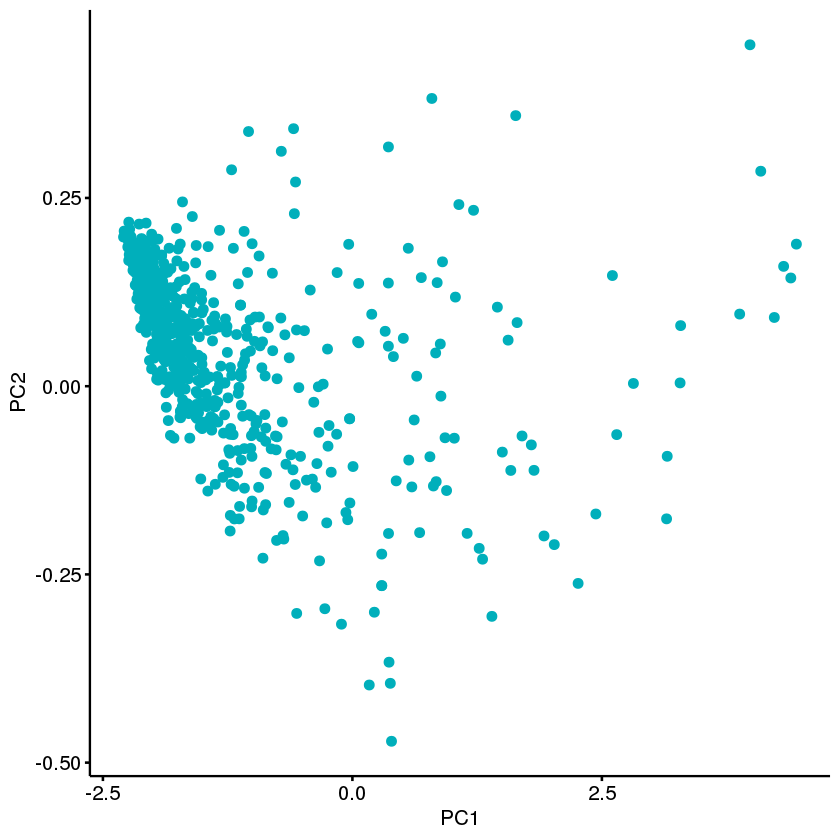

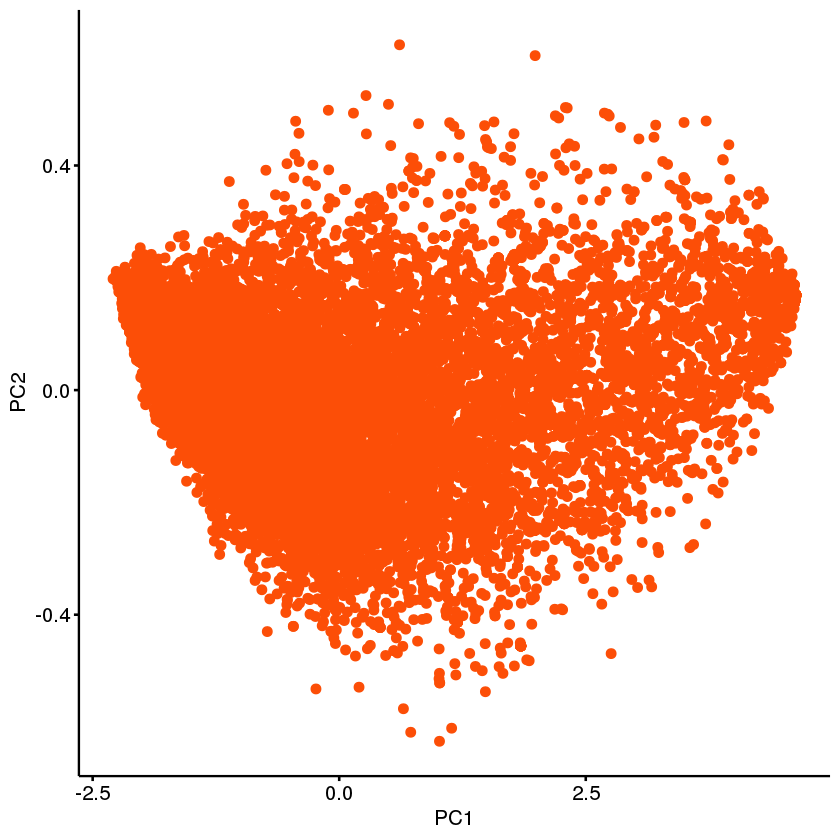

In [39]:
onc_pca_spec_exp_human_up <- as.data.frame(pca_res_spec_exp_human_up$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_human_up, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_human_up <- as.data.frame(pca_res_spec_exp_human_up$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_human_up, x = "PC1", y = "PC2",
   color = "#FC4E07")

Using  as id variables



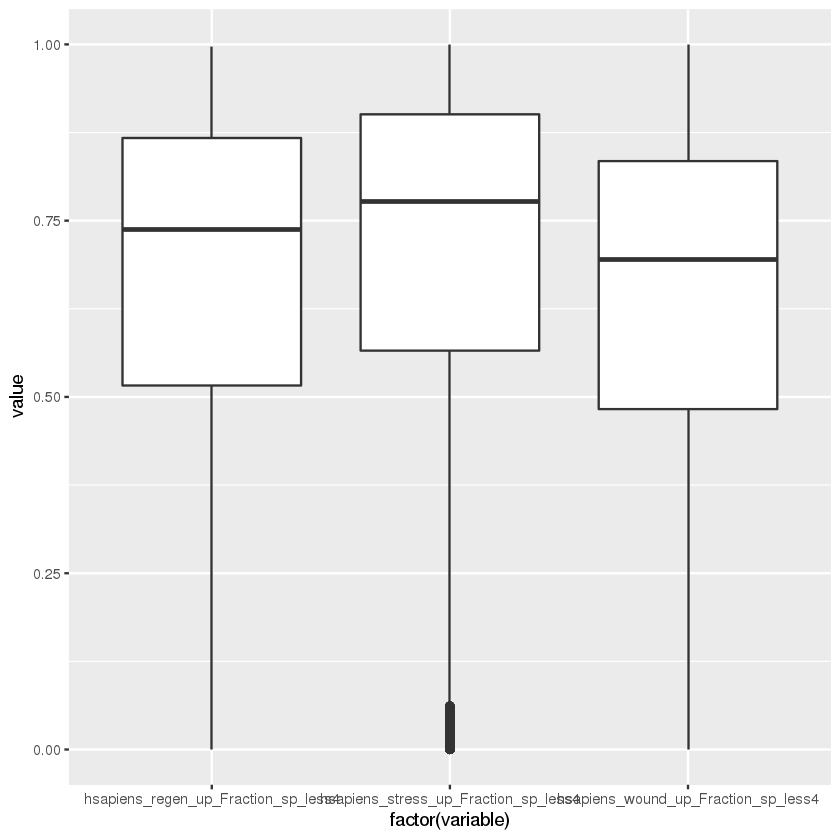

In [40]:
scale_spec_exp_4_human_up <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("hsapiens.*up_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_4_human_up)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

In [ ]:
path_spec_exp_human_up_lists <- get_distance_measures(pca_res_spec_exp_human_up, fractions_initial_combinedDF)

In [ ]:
path_spec_exp_human_up_lists$pval_list

Using  as id variables



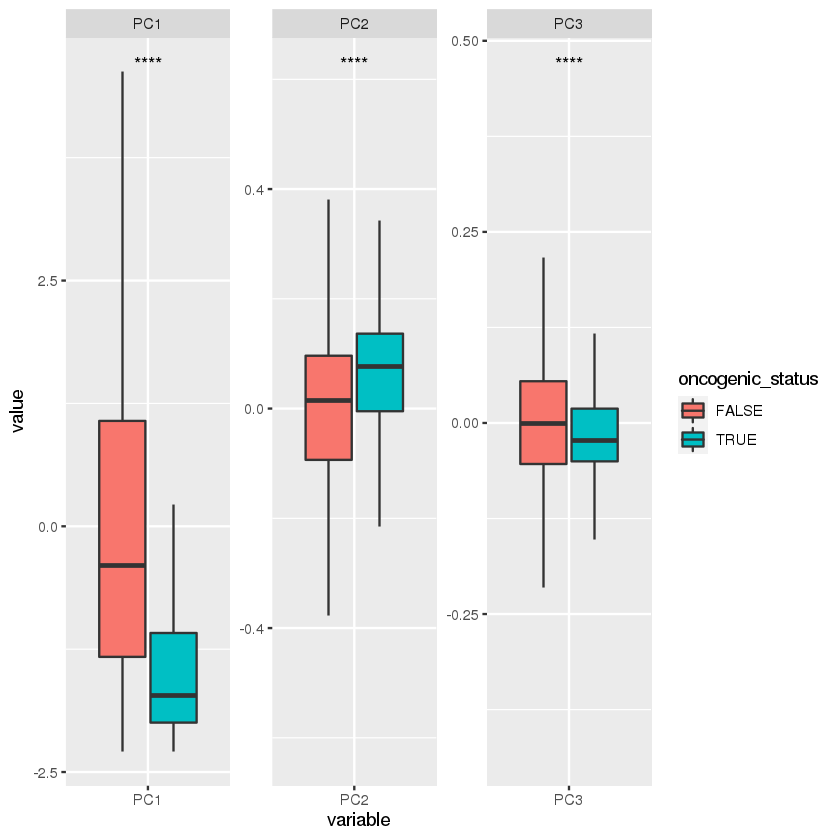

In [41]:
pca_melted_human_up4 <- cbind(melt(as.data.frame(pca_res_spec_exp_human_up$x)), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(pca_res_spec_exp_human_up$x)))

ggplot(pca_melted_human_up4, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



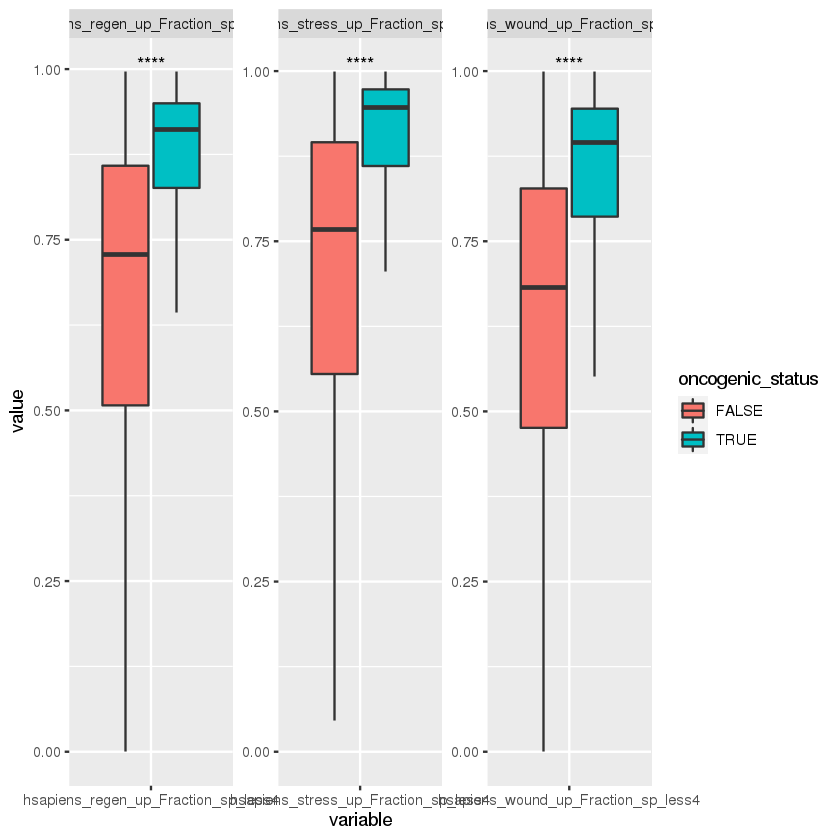

In [42]:
pca_melted_human_up4_raw <- cbind(melt(scale_spec_exp_human_up), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(scale_spec_exp_human_up)))

ggplot(pca_melted_human_up4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



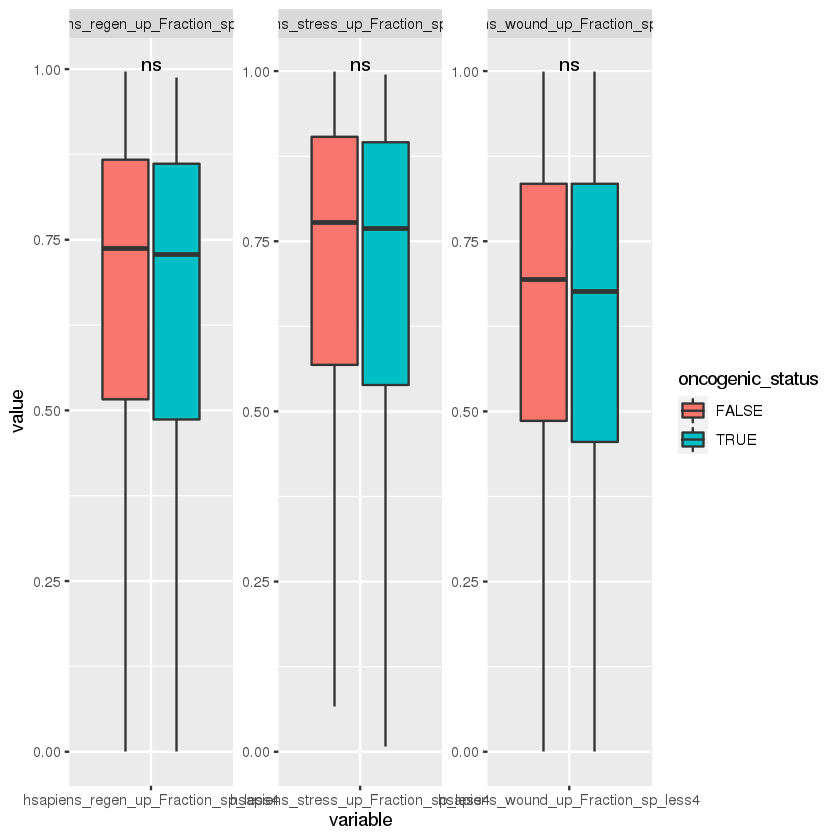

In [43]:
random_pca_melted_human_up4_raw <- cbind(melt(scale_spec_exp_human_up), "oncogenic_status" = rep(sample(fractions_initial_combinedDF$oncogenic_status), ncol(scale_spec_exp_human_up)))

ggplot(random_pca_melted_human_up4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



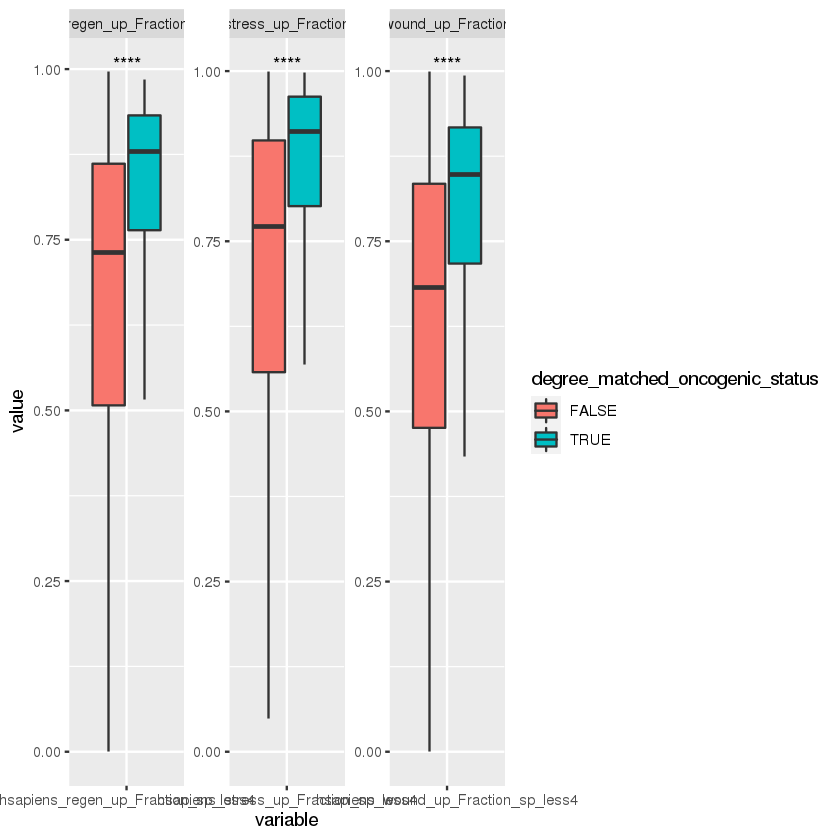

In [44]:
matched_pca_melted_human_up4_raw <- cbind(melt(scale_spec_exp_human_up), "degree_matched_oncogenic_status" = rep(fractions_initial_combinedDF$degree_matched_oncogenic_status, ncol(scale_spec_exp_human_up)))

ggplot(matched_pca_melted_human_up4_raw, aes(x=variable, y=value,
                                   fill=degree_matched_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = degree_matched_oncogenic_status), label = "p.signif")

Using  as id variables



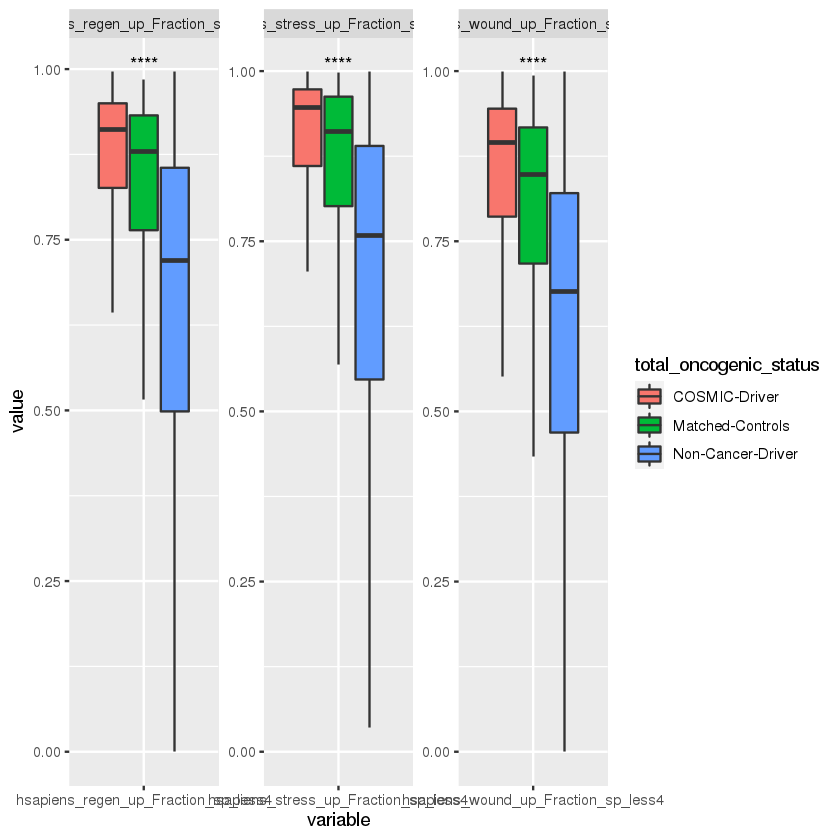

In [45]:
triple_pca_melted_human_up4_raw <- cbind(melt(scale_spec_exp_human_up), "total_oncogenic_status" = rep(fractions_initial_combinedDF$total_oncogenic_status, ncol(scale_spec_exp_human_up)))

ggplot(triple_pca_melted_human_up4_raw, aes(x=variable, y=value,
                                   fill=total_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = total_oncogenic_status), label = "p.signif")

###  human down

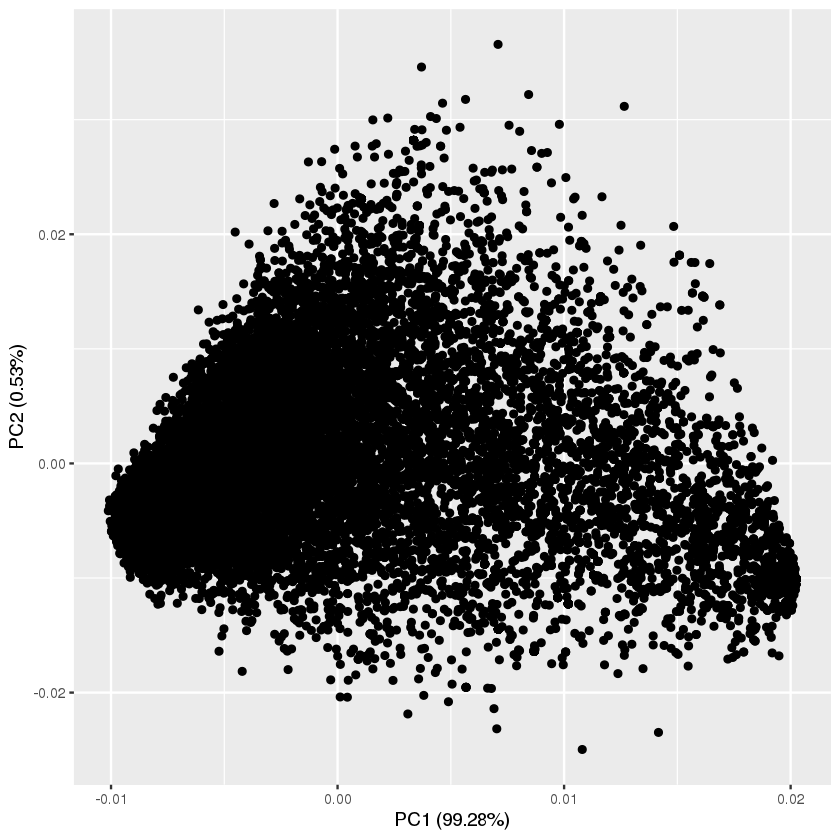

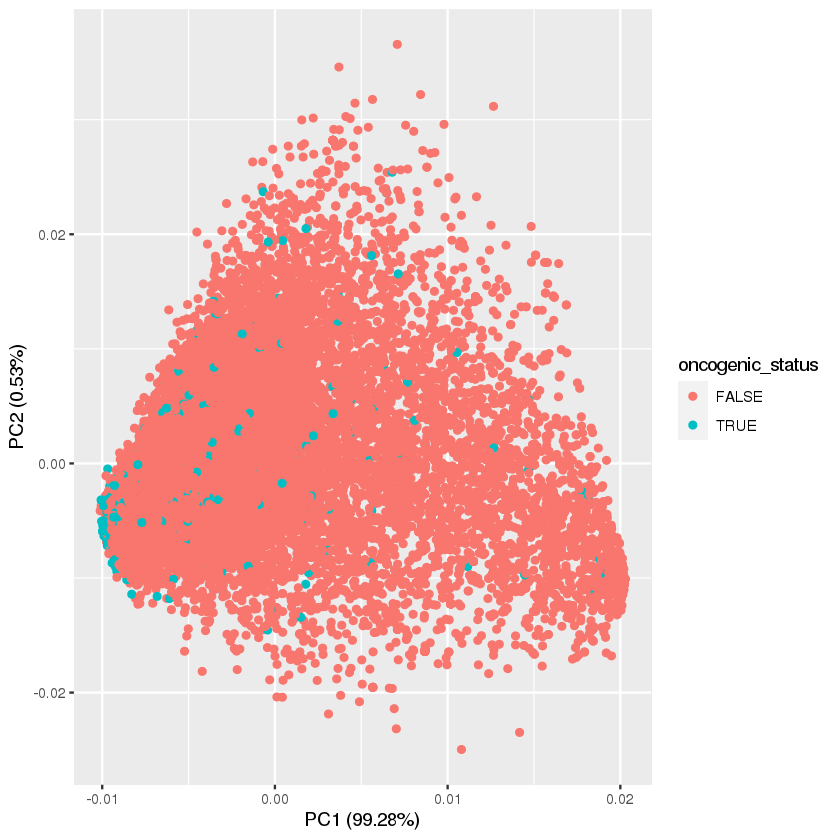

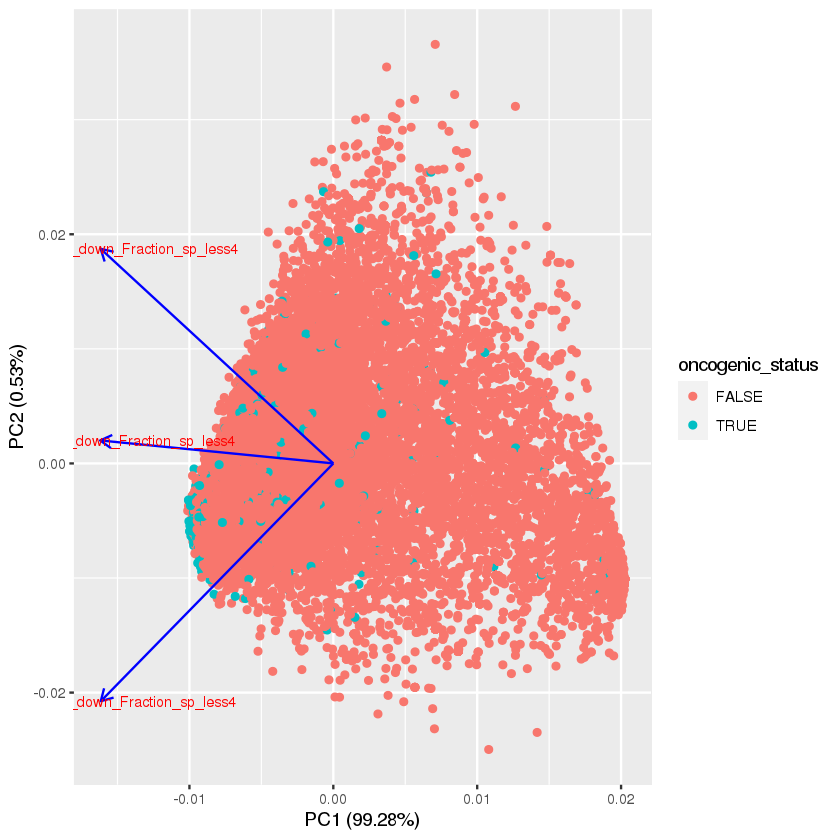

In [46]:
scale_spec_exp_human <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("hsapiens.*down_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
pca_res_spec_exp_human <- prcomp(scale_spec_exp_human, scale. = TRUE)
autoplot(pca_res_spec_exp_human)
autoplot(pca_res_spec_exp_human, data = fractions_initial_combinedDF, colour = 'oncogenic_status')

autoplot(pca_res_spec_exp_human, data = fractions_initial_combinedDF, colour = 'oncogenic_status',
         loadings = TRUE, loadings.colour = 'blue',
         loadings.label = TRUE, loadings.label.size = 3)

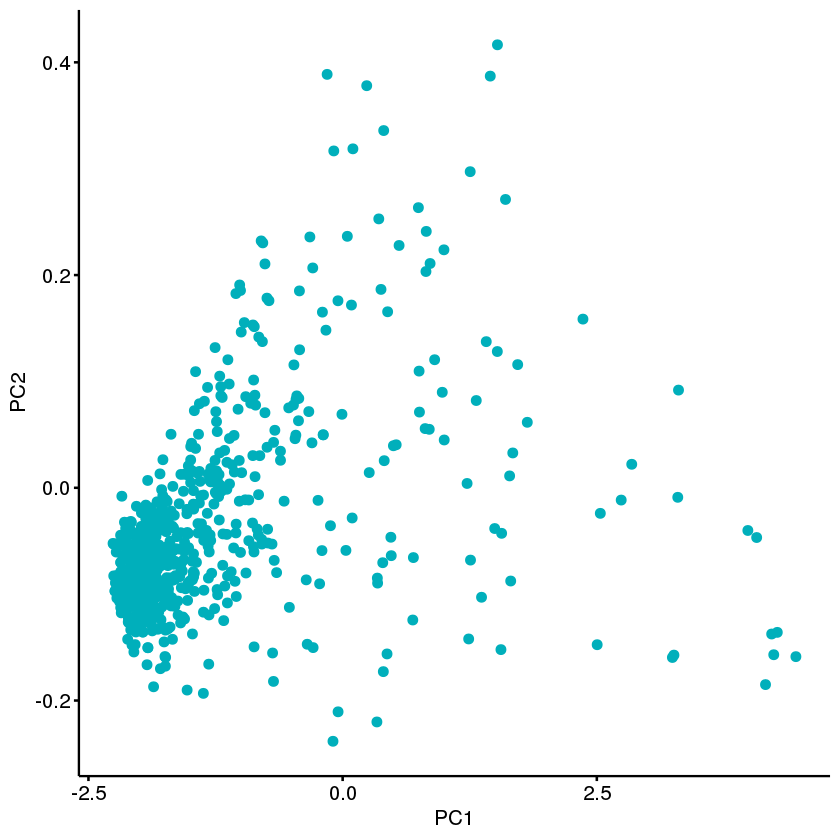

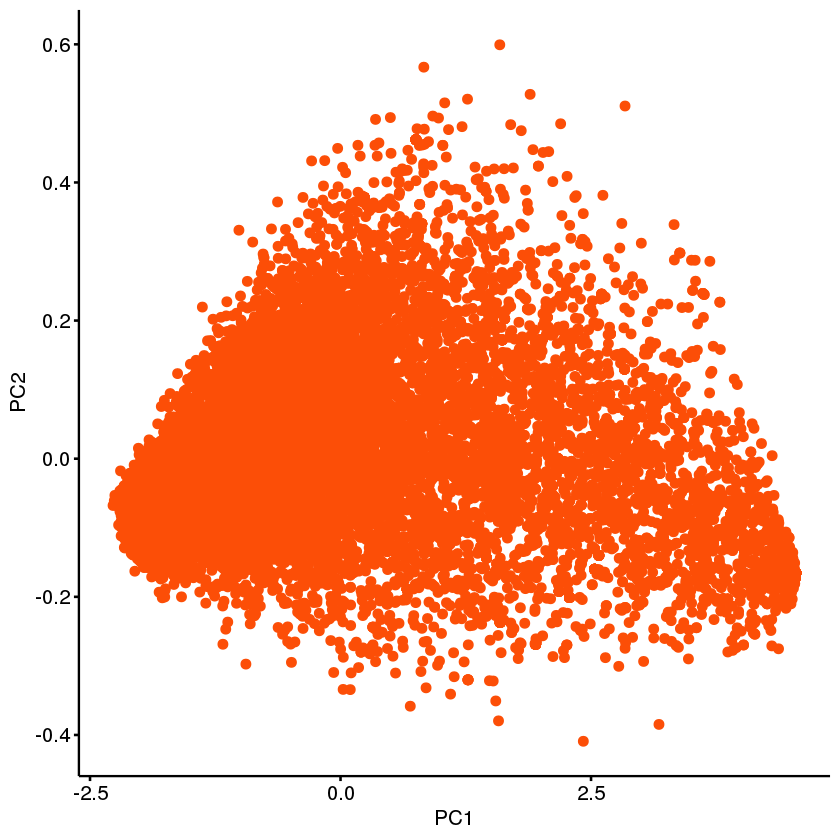

In [47]:
onc_pca_spec_exp_human <- as.data.frame(pca_res_spec_exp_human$x)[fractions_initial_combinedDF$oncogenic_status == "TRUE",]
ggscatter(onc_pca_spec_exp_human, x = "PC1", y = "PC2",
   color = "#00AFBB")

nononc_pca_spec_exp_human <- as.data.frame(pca_res_spec_exp_human$x)[fractions_initial_combinedDF$oncogenic_status == "FALSE",]
ggscatter(nononc_pca_spec_exp_human, x = "PC1", y = "PC2",
   color = "#FC4E07")

Using  as id variables



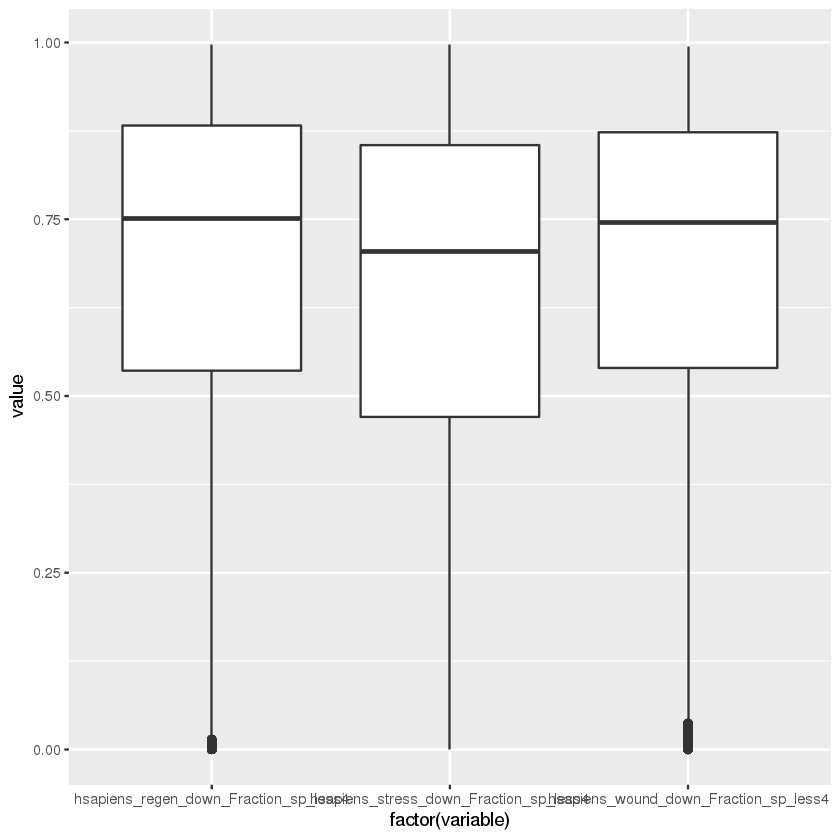

In [48]:
scale_spec_exp_4_human <- fractions_initial_combinedDF[,colnames(fractions_initial_combinedDF)[grep("hsapiens.*down_Fraction_sp_less4",colnames(fractions_initial_combinedDF))]]
meltData <- melt(scale_spec_exp_4_human)
p <- ggplot(meltData, aes(factor(variable), value)) 
p + geom_boxplot() 

In [ ]:
path_spec_exp_human_lists <- get_distance_measures(pca_res_spec_exp_human, fractions_initial_combinedDF)

In [ ]:
path_spec_exp_human_lists$pval_list

Using  as id variables



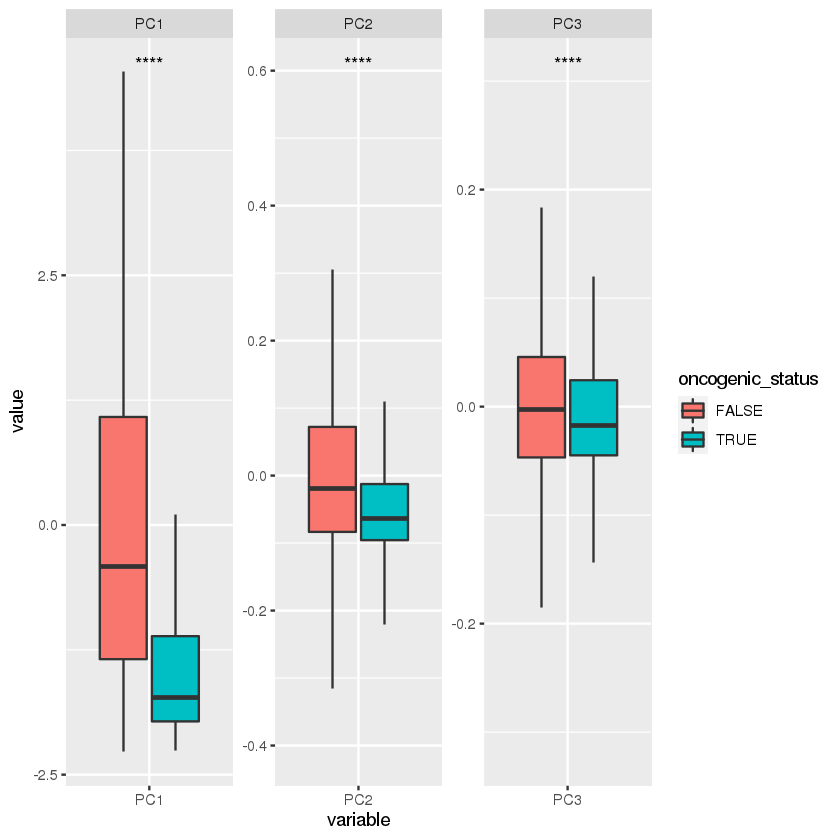

In [49]:
pca_melted_human_down4 <- cbind(melt(as.data.frame(pca_res_spec_exp_human$x)), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(pca_res_spec_exp_human$x)))

ggplot(pca_melted_human_down4, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



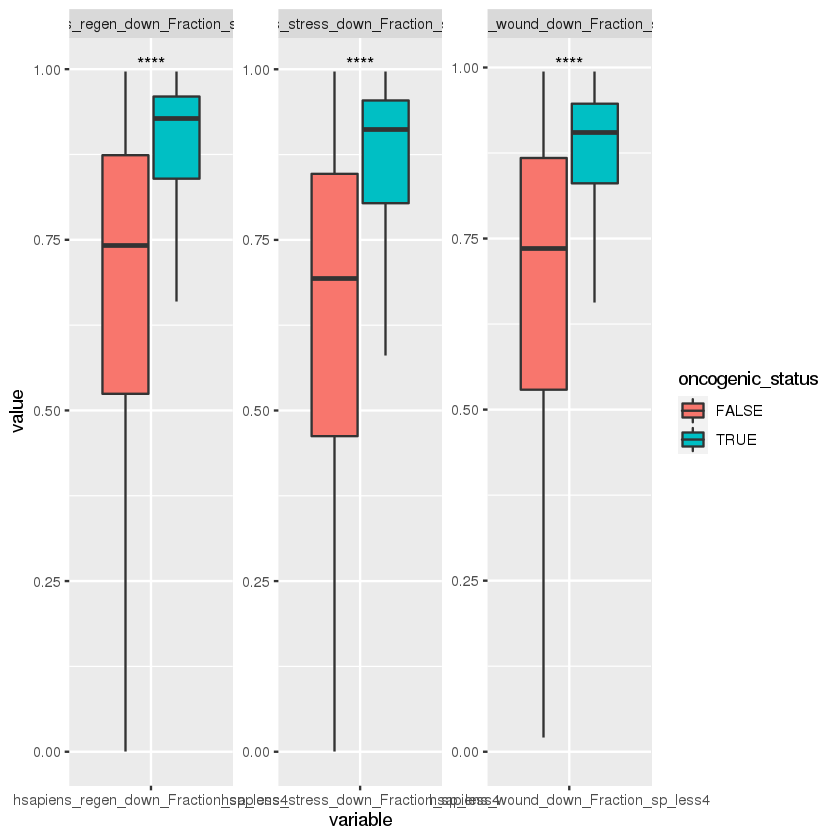

In [50]:
pca_melted_human_down4_raw <- cbind(melt(scale_spec_exp_human), "oncogenic_status" = rep(fractions_initial_combinedDF$oncogenic_status, ncol(scale_spec_exp_human)))

ggplot(pca_melted_human_down4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

FALSE  TRUE 
16220   677

FALSE  TRUE 
16220   677

Using  as id variables



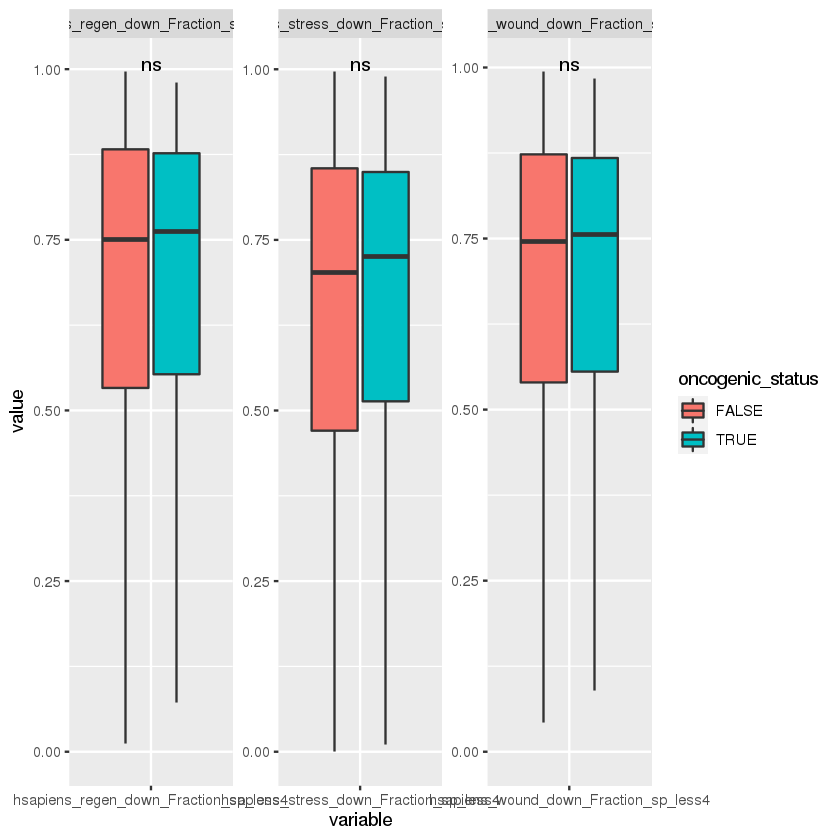

In [51]:
###  Randomized oncogenic
summary(as.factor(fractions_initial_combinedDF$oncogenic_status))
summary(as.factor(sample(fractions_initial_combinedDF$oncogenic_status)))
rand_pca_melted_human_down4_raw <- cbind(melt(scale_spec_exp_human), "oncogenic_status" = rep(sample(fractions_initial_combinedDF$oncogenic_status), ncol(scale_spec_exp_human)))

ggplot(rand_pca_melted_human_down4_raw, aes(x=variable, y=value,
                                   fill=oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = oncogenic_status), label = "p.signif")

Using  as id variables



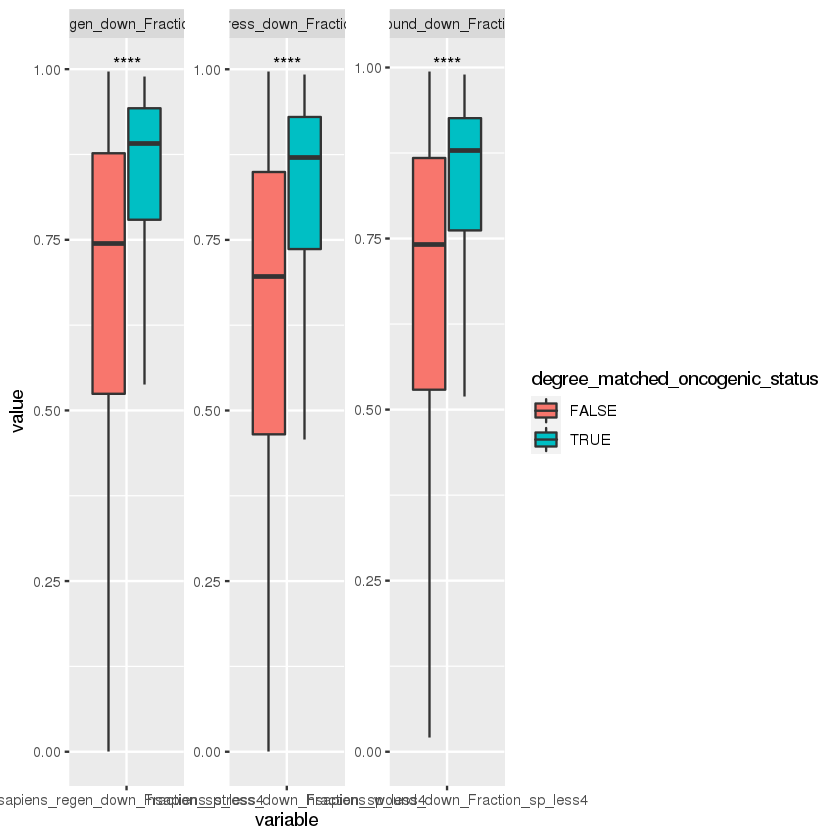

In [52]:
# matched_control
matched_pca_melted_human_down4_raw <- cbind(melt(scale_spec_exp_human), "degree_matched_oncogenic_status" = rep(fractions_initial_combinedDF$degree_matched_oncogenic_status, ncol(scale_spec_exp_human)))

ggplot(matched_pca_melted_human_down4_raw, aes(x=variable, y=value,
                                   fill=degree_matched_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = degree_matched_oncogenic_status), label = "p.signif")

Using  as id variables



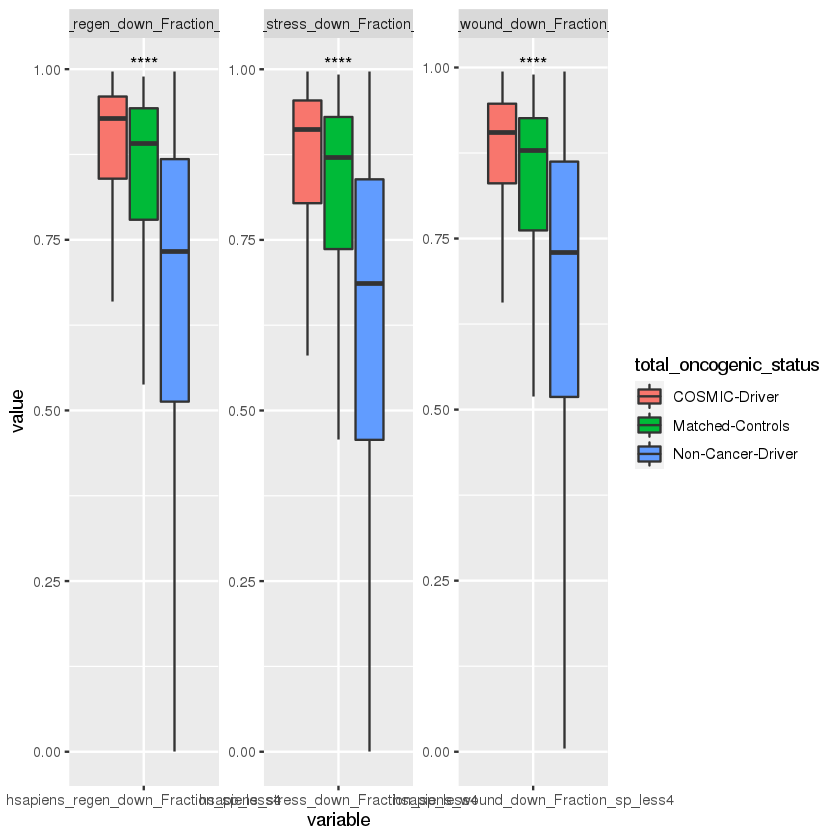

In [53]:
triple_pca_melted_human_down4_raw <- cbind(melt(scale_spec_exp_human), "total_oncogenic_status" = rep(fractions_initial_combinedDF$total_oncogenic_status, ncol(scale_spec_exp_human)))

ggplot(triple_pca_melted_human_down4_raw, aes(x=variable, y=value,
                                   fill=total_oncogenic_status)) + 
geom_boxplot(outlier.shape = NA) +
facet_wrap(~variable, scale="free") +
stat_compare_means(aes(group = total_oncogenic_status), label = "p.signif")

In [54]:
sum(cosmic_genes$gene %in% cosmic_matched_genes$gene)

[1] 0

In [55]:
cosmic_genes$gene

[1] "A1CF"      "ABI1"      "ABL1"      "ABL2"      "ACKR3"     "ACSL3"    
  [7] "ACSL6"     "ACVR1"     "ACVR2A"    "AFDN"      "AFF1"      "AFF3"     
 [13] "AFF4"      "AKAP9"     "AKT1"      "AKT2"      "AKT3"      "ALDH2"    
 [19] "ALK"       "AMER1"     "ANK1"      "APC"       "APOBEC3B"  "AR"       
 [25] "ARAF"      "ARHGAP26"  "ARHGAP5"   "ARHGEF10"  "ARHGEF10L" "ARHGEF12" 
 [31] "ARID1A"    "ARID1B"    "ARID2"     "ARNT"      "ASPSCR1"   "ASXL1"    
 [37] "ASXL2"     "ATF1"      "ATIC"      "ATM"       "ATP1A1"    "ATP2B3"   
 [43] "ATR"       "ATRX"      "AXIN1"     "AXIN2"     "B2M"       "BAP1"     
 [49] "BARD1"     "BAX"       "BAZ1A"     "BCL10"     "BCL11A"    "BCL11B"   
 [55] "BCL2"      "BCL2L12"   "BCL3"      "BCL6"      "BCL7A"     "BCL9"     
 [61] "BCL9L"     "BCLAF1"    "BCOR"      "BCORL1"    "BCR"       "BIRC3"    
 [67] "BIRC6"     "BLM"       "BMP5"      "BMPR1A"    "BRAF"      "BRCA1"    
 [73] "BRCA2"     "BRD3"      "BRD4"      "BRIP1"     "BTG1"      "BTK"      
 [79] "BUB1B"     "C15orf65"  "CACNA1D"   "CALR"      "CAMTA1"    "CANT1"    
 [85] "CARD11"    "CARS"      "CASP3"     "CASP8"     "CASP9"     "CBFA2T3"  
 [91] "CBFB"      "CBL"       "CBLB"      "CBLC"      "CCDC6"     "CCNB1IP1" 
 [97] "CCNC"      "CCND1"     "CCND2"     "CCND3"     "CCNE1"     "CCR4"     
[103] "CCR7"      "CD209"     "CD274"     "CD28"      "CD74"      "CD79A"    
[109] "CD79B"     "CDC73"     "CDH1"      "CDH10"     "CDH11"     "CDH17"    
[115] "CDK12"     "CDK4"      "CDK6"      "CDKN1A"    "CDKN1B"    "CDKN2A"   
[121] "CDKN2C"    "CDX2"      "CEBPA"     "CEP89"     "CHCHD7"    "CHD2"     
[127] "CHD4"      "CHEK2"     "CHIC2"     "CHST11"    "CIC"       "CIITA"    
[133] "CLIP1"     "CLP1"      "CLTC"      "CLTCL1"    "CNBD1"     "CNBP"     
[139] "CNOT3"     "CNTNAP2"   "CNTRL"     "COL1A1"    "COL2A1"    "COL3A1"   
[145] "COX6C"     "CPEB3"     "CREB1"     "CREB3L1"   "CREB3L2"   "CREBBP"   
[151] "CRLF2"     "CRNKL1"    "CRTC1"     "CRTC3"     "CSF1R"     "CSF3R"    
[157] "CSMD3"     "CTCF"      "CTNNA2"    "CTNNB1"    "CTNND1"    "CTNND2"   
[163] "CUL3"      "CUX1"      "CXCR4"     "CYLD"      "CYP2C8"    "CYSLTR2"  
[169] "DAXX"      "DCAF12L2"  "DCC"       "DCTN1"     "DDB2"      "DDIT3"    
[175] "DDR2"      "DDX10"     "DDX3X"     "DDX5"      "DDX6"      "DEK"      
[181] "DGCR8"     "DICER1"    "DNAJB1"    "DNM2"      "DNMT3A"    "DROSHA"   
[187] "DUX4L1"    "EBF1"      "ECT2L"     "EED"       "EGFR"      "EIF1AX"   
[193] "EIF3E"     "EIF4A2"    "ELF3"      "ELF4"      "ELK4"      "ELL"      
[199] "ELN"       "EML4"      "EP300"     "EPAS1"     "EPHA3"     "EPHA7"    
[205] "EPS15"     "ERBB2"     "ERBB3"     "ERBB4"     "ERC1"      "ERCC2"    
[211] "ERCC3"     "ERCC4"     "ERCC5"     "ERG"       "ESR1"      "ETNK1"    
[217] "ETV1"      "ETV4"      "ETV5"      "ETV6"      "EWSR1"     "EXT1"     
[223] "EXT2"      "EZH2"      "EZR"       "FAM131B"   "FAM135B"   "FAM47C"   
[229] "FANCA"     "FANCC"     "FANCD2"    "FANCE"     "FANCF"     "FANCG"    
[235] "FAS"       "FAT1"      "FAT3"      "FAT4"      "FBLN2"     "FBXO11"   
[241] "FBXW7"     "FCGR2B"    "FCRL4"     "FEN1"      "FES"       "FEV"      
[247] "FGFR1"     "FGFR1OP"   "FGFR2"     "FGFR3"     "FGFR4"     "FH"       
[253] "FHIT"      "FIP1L1"    "FKBP9"     "FLCN"      "FLI1"      "FLNA"     
[259] "FLT3"      "FLT4"      "FNBP1"     "FOXA1"     "FOXL2"     "FOXO1"    
[265] "FOXO3"     "FOXO4"     "FOXP1"     "FOXR1"     "FSTL3"     "FUBP1"    
[271] "FUS"       "GAS7"      "GATA1"     "GATA2"     "GATA3"     "GLI1"     
[277] "GMPS"      "GNA11"     "GNAQ"      "GNAS"      "GOLGA5"    "GOPC"     
[283] "GPC3"      "GPC5"      "GPHN"      "GRIN2A"    "GRM3"      "H3F3A"    
[289] "H3F3B"     "HERPUD1"   "HEY1"      "HIF1A"     "HIP1"      "HIST1H3B" 
[295] "HIST1H4I"  "HLA-A"     "HLF"       "HMGA1"     "HMGA2"     "HMGN2P46" 
[301] "HNF1A"     "HNRNPA2B1" "HOOK3"     "HOXA11"    "HOXA13"    "HOXA9"    
[307] "HOXC11"    "HOXC1

In [56]:
cosmic_matched_genes$gene

[1] "NLRC5"         "MRPS33"        "UFC1"          "TRIM13"       
  [5] "SNORD29"       "TMEM18"        "WDR25"         "OR5A1"        
  [9] "DKFZP564O0523" "INTS3"         "CASP4"         "CD19"         
 [13] "SFRS4"         "GIPR"          "KIAA0323"      "TRAF6"        
 [17] "POLR3E"        "RRM1"          "CD8A"          "PFKM"         
 [21] "NANOS1"        "TLR2"          "RGS19"         "TUBB3"        
 [25] "ULK3"          "SORBS3"        "CST3"          "ERN1"         
 [29] "COL28A1"       "CSPG4"         "TXNRD2"        "LAMB1"        
 [33] "TH"            "DTX1"          "SRP68"         "KCNS3"        
 [37] "PLDN"          "GATAD2B"       "TMSB4X"        "EXOC4"        
 [41] "PRKACG"        "NDUFV2"        "PLA2G12A"      "LDHB"         
 [45] "RUNX3"         "ZNF217"        "ATP6V1C1"      "SNHG3"        
 [49] "BCAN"          "HBP1"          "WNT10B"        "JAKMIP1"      
 [53] "FAM3C"         "TCTEX1D4"      "PPFIA4"        "HSPA13"       
 [57] "ZNF7"          "TSNAXIP1"      "RTCB"          "DIP2A"        
 [61] "ARPP19"        "MORC2"         "ZZEF1"         "DLX4"         
 [65] "CKMT1A"        "ZBTB34"        "MRPL32"        "RER1"         
 [69] "C11ORF73"      "SLC9A5"        "NOSTRIN"       "MCM10"        
 [73] "ERCC8"         "CETN2"         "C5"            "GTF2I"        
 [77] "ZNF280A"       "GATA4"         "AGTR2"         "METTL3"       
 [81] "XCR1"          "SMAD5"         "PSEN1"         "C1orf103"     
 [85] "MED28"         "TNNT1"         "PLA2G2A"       "POLR3K"       
 [89] "ANKRD1"        "ZBTB44"        "TOP3B"         "ADH6"         
 [93] "HIRA"          "SNRPE"         "NRIP2"         "TAF4"         
 [97] "PDE10A"        "ENTPD4"        "FLJ23356"      "PRKAB2"       
[101] "HGS"           "MBNL3"         "IPO11"         "LAMB2"        
[105] "ZNF423"        "COQ4"          "NOB1"          "ERO1L"        
[109] "SPTLC3"        "ZNF668"        "FAM83D"        "CLDN4"        
[113] "TMEM60"        "SYT5"          "ZNF337"        "PHOSPHO1"     
[117] "ZNF764"        "NGFB"          "IKBKG"         "TCF1"         
[121] "INTS10"        "UBE4B"         "SMARCA1"       "SUPV3L1"      
[125] "INO80E"        "HIST1H1B"      "ARF4L"         "FUNDC2"       
[129] "OR8U1"         "OR7A10"        "CHSY3"         "FSCN1"        
[133] "PPP5C"         "INTS5"         "NOC4L"         "KCNA6"        
[137] "KCNG1"         "KIF2B"         "PIK3C2B"       "FAF2"         
[141] "AKAP13"        "PDE7A"         "PPM1E"         "KRT74"        
[145] "LASS1"         "ARL13B"        "MORC4"         "GNL1"         
[149] "RGPD4"         "C19orf6"       "D4S234E"       "TRMU"         
[153] "SNAP23P"       "ZNHIT6"        "ZNF141"        "KLK7"         
[157] "AQP10"         "FAIM2"         "LPAR5"         "COL6A4P1"     
[161] "Pfs2"          "CIAS1"         "SCGB3A2"       "PRSS35"       
[165] "XIRP2"         "TMEPAI"        "SENP3"         "CYFIP1"       
[169] "MYST3"         "GNMT"          "RNU12-2P"      "PELI1"        
[173] "MPDZ"          "MKRN3"         "TNRC6B"        "HS3ST3A1"     
[177] "RASGRP1"       "PAFAH1B1"      "PLCZ1"         "TLR4"         
[181] "FAU"           "RP4-691N24.1"  "OR7A5"         "TUBGCP3"      
[185] "USP39"         "DHRS1"         "GAD2"          "NPR1"         
[189] "PDE7B"         "ADHFE1"        "BLCAP"         "ARFGAP2"      
[193] "DOK6"          "ZNF514"        "GEFT"          "CMAS"         
[197] "DHODH"         "LETMD1"        "C5ORF55"       "TEAD3"        
[201] "VCAN"          "S1PR1"         "CCDC116"       "SF3B6"        
[205] "GSTM4"         "IRF3"          "CCL24"         "AP3B1"        
[209] "BCKDHA"        "LTBP1"         "UBOX5"         "GTF3C4"       
[213] "RSL24D1"       "ZFPM2"         "IMP4"          "OR4C5"        
[217] "IRS2"          "ZDHHC11"       "FZR1"          "PFDN1"        
[221] "IL4"           "C14orf1"       "C19ORF25"      "CTTNBP2NL"    
[225] "TANK"          "ANG"           "ALAS1"         "C20ORF24"     
[229] "ZMYM5

# Functions and Code

### Euclidean distance and Centroid code

In [5]:
euclidean <- function(x1,y1,x2,y2) {
    return(sqrt((x2-x1)^2+(y2-y1)^2))
}
closeness_measures <-function(df) {
    pairwise_euclidean_distances <- numeric()
    for(i in 1:nrow(df)) {
        for(j in i:nrow(df)) {
            if(j != i) {
                pairwise_euclidean_distances <- append(pairwise_euclidean_distances,
                                                       euclidean(df[i,1],df[i,2],df[j,1],df[j,2]),
                                                       length(pairwise_euclidean_distances))
            }
        }
    }
    
    centroid_x <- mean(df$PC1)
    centroid_y <- mean(df$PC2)
    
    centroid_distances <- numeric()
    for(i in 1:nrow(df)) {
        centroid_distances <- append(centroid_distances,
                                     euclidean(df[i,1],df[i,2],centroid_x,centroid_y),
                                     length(centroid_distances))
    }
    
    return(list("euclidean" = pairwise_euclidean_distances,
                "centroid" = centroid_distances))
}

centroid_measures <-function(df) {
    
    centroid_x <- mean(df$PC1)
    centroid_y <- mean(df$PC2)
    
    centroid_distances <- numeric()
    for(i in 1:nrow(df)) {
        centroid_distances <- append(centroid_distances,
                                     euclidean(df[i,1],df[i,2],centroid_x,centroid_y),
                                     length(centroid_distances))
    }
    
    return(centroid_distances)
}

centroid_measures_GO <-function(df,df2) {
    
    centroid_x <- mean(df$PC1)
    centroid_y <- mean(df$PC2)
    
    centroid_distances <- numeric()
    for(i in 1:nrow(df2)) {
        centroid_distances <- append(centroid_distances,
                                     euclidean(df2[i,1],df2[i,2],centroid_x,centroid_y),
                                     length(centroid_distances))
    }
    
    return(centroid_distances)
}

In [9]:
ptm <- proc.time()
onc_distances<- closeness_measures(onc_pca)
proc.time() - ptm

ERROR: Error in nrow(df): object 'onc_pca' not found


In [10]:
euclidean <- function(x1,y1,x2,y2) {
    return(sqrt((x2-x1)^2+(y2-y1)^2))
}
closeness_measures <-function(df,comparison) {
    pairwise_euclidean_distances <- numeric()
    for(i in 1:nrow(df)) {
        for(j in 1:nrow(comparison)) {
            if(rownames(comparison)[j] != rownames(df)[i]) {
                pairwise_euclidean_distances <- append(pairwise_euclidean_distances,
                                                       euclidean(df[i,1],df[i,2],comparison[j,1],comparison[j,2]),
                                                       length(pairwise_euclidean_distances))
            }
        }
    }
    
    return(pairwise_euclidean_distances)
}

current_file <- nononc_pca[1:100,]
comparison_file  <- nononc_pca

ptm <- proc.time()
output <- closeness_measures(current_file, comparison_file)
proc.time() - ptm

ERROR: Error in eval(expr, envir, enclos): object 'nononc_pca' not found


### euclidean  distance  biowulf  submission

In [48]:
biowulf_submission <- function(total_input, output, start, end, jobname) {
    command = paste("printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R ",
                    total_input, " ", output, " ", start, " ", end,
                    " /data/timonaj/cancer_as_wound/ppi_analysis/\" > ", jobname,
                    ".job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 ", jobname,
                    ".job \n", sep = "")
    print(command)
    system(try(command))
}

In [25]:
saveRDS(nononc_pca_4, "non_onc_4.RDS")
subsect_list <- split(nononc_pca_4, rep(1:ceiling(nrow(nononc_pca_4)/400), each=400, length.out=nrow(nononc_pca_4)))
start <- 1
end <- nrow(subsect_list[[1]])
increment <- end
for(i in 1:30) {
    print(paste(start, end,sep=" "))
    
    biowulf_submission("non_onc_4.RDS",
                       paste("non_onc_4_",i,".RDS",sep=""),
                       start,end,
                       paste("non_onc_4_",i,".job",sep=""))
    
    start <- start +  increment
    
    if(end > nrow(nononc_pca_4)) {
        end <- nrow(nononc_pca_4)
    } else {
        end <- end + increment
    }
}

[1] "1 400"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_4.RDS non_onc_4_1.RDS 1 400 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_4_1.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_4_1.job.job \n"
[1] "401 800"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_4.RDS non_onc_4_2.RDS 401 800 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_4_2.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_4_2.job.job \n"
[1] "801 1200"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_4.RDS non_onc_4_3.RDS 801 1200 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_4_3.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_4_3.job.job \n"
[1] "1201 1600"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_4.RDS non_onc_4_4.RDS 1201 1600 /data/timonaj/cancer

In [26]:
saveRDS(nononc_pca_3, "non_onc_3.RDS")
subsect_list <- split(nononc_pca_3, rep(1:ceiling(nrow(nononc_pca_3)/400), each=400, length.out=nrow(nononc_pca_3)))
start <- 1
end <- nrow(subsect_list[[1]])
increment <- end
for(i in 1:30) {
    print(paste(start, end,sep=" "))
    
    biowulf_submission("non_onc_3.RDS",
                       paste("non_onc_3_",i,".RDS",sep=""),
                       start,end,
                       paste("non_onc_3_",i,".job",sep=""))
    
    start <- start +  increment
    
    if(end > nrow(nononc_pca_3)) {
        end <- nrow(nononc_pca_3)
    } else {
        end <- end + increment
    }
}

[1] "1 400"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_3.RDS non_onc_3_1.RDS 1 400 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_3_1.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_3_1.job.job \n"
[1] "401 800"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_3.RDS non_onc_3_2.RDS 401 800 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_3_2.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_3_2.job.job \n"
[1] "801 1200"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_3.RDS non_onc_3_3.RDS 801 1200 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_3_3.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_3_3.job.job \n"
[1] "1201 1600"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_3.RDS non_onc_3_4.RDS 1201 1600 /data/timonaj/cancer

In [27]:
saveRDS(nononc_pca_2, "non_onc_2.RDS")
subsect_list <- split(nononc_pca_2, rep(1:ceiling(nrow(nononc_pca_2)/400), each=400, length.out=nrow(nononc_pca_2)))
start <- 1
end <- nrow(subsect_list[[1]])
increment <- end
for(i in 1:30) {
    print(paste(start, end,sep=" "))
    
    biowulf_submission("non_onc_2.RDS",
                       paste("non_onc_2_",i,".RDS",sep=""),
                       start,end,
                       paste("non_onc_2_",i,".job",sep=""))
    
    start <- start +  increment
    
    if(end > nrow(nononc_pca_2)) {
        end <- nrow(nononc_pca_2)
    } else {
        end <- end + increment
    }
}

[1] "1 400"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_2.RDS non_onc_2_1.RDS 1 400 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_2_1.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_2_1.job.job \n"
[1] "401 800"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_2.RDS non_onc_2_2.RDS 401 800 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_2_2.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_2_2.job.job \n"
[1] "801 1200"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_2.RDS non_onc_2_3.RDS 801 1200 /data/timonaj/cancer_as_wound/ppi_analysis/\" > non_onc_2_3.job.job \nsbatch --mem=1g --cpus-per-task=2 --gres=lscratch:2 --time 12:00:00 non_onc_2_3.job.job \n"
[1] "1201 1600"
[1] "printf \"#!/bin/bash\nmodule load R\nRscript pairwise_euclidean.R non_onc_2.RDS non_onc_2_4.RDS 1201 1600 /data/timonaj/cancer

### 3D code

In [186]:
X <- subset(iris, select = -c(Species))

prin_comp <- prcomp(X, rank. = 3)

components <- prin_comp[["x"]]
components <- data.frame(components)
components$PC2 <- -components$PC2
components$PC3 <- -components$PC3
components = cbind(components, iris$Species)

tot_explained_variance_ratio <- summary(prin_comp)[["importance"]]['Proportion of Variance',]
tot_explained_variance_ratio <- 100 * sum(tot_explained_variance_ratio)

tit = 'Total Explained Variance = 99.48'

fig <- plot_ly(components, x = ~PC1, y = ~PC2, z = ~PC3, color = ~iris$Species, colors = c('#636EFA','#EF553B','#00CC96') ) %>%
  add_markers(size = 12)


fig <- fig %>%
  layout(
    title = tit,
    scene = list(bgcolor = "#e5ecf6")
)

fig

ERROR: Error in plot_ly(components, x = ~PC1, y = ~PC2, z = ~PC3, color = ~iris$Species, : could not find function "%>%"


### TEST CODE

In [161]:
head(genome_regen_fractions)
head(genome_wound_fractions)
head(genome_stress_fractions)

,gene_regen,regen_Fraction_sp_0,regen_Fraction_sp_1,regen_Fraction_sp_less2,regen_Fraction_sp_less3,regen_Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0.000000000,0.002770083,0.002770083,0.041551247,0.59833795
2,ANXA7,0.000000000,0.011080332,0.011080332,0.229916898,0.94182825
3,CDKN1A,0.000000000,0.016620499,0.016620499,0.512465374,0.98337950
4,CRISP3,0.002770083,0.000000000,0.002770083,0.002770083,0.04155125
5,TK1,0.000000000,0.011080332,0.011080332,0.404432133,0.97783934
6,A1CF,0.000000000,0.000000000,0.000000000,0.002770083,0.36288089


,gene_wound,wound_Fraction_sp_0,wound_Fraction_sp_1,wound_Fraction_sp_less2,wound_Fraction_sp_less3,wound_Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0.000000000,0.002770083,0.002770083,0.041551247,0.59833795
2,ANXA7,0.000000000,0.011080332,0.011080332,0.229916898,0.94182825
3,CDKN1A,0.000000000,0.016620499,0.016620499,0.512465374,0.98337950
4,CRISP3,0.002770083,0.000000000,0.002770083,0.002770083,0.04155125
5,TK1,0.000000000,0.011080332,0.011080332,0.404432133,0.97783934
6,A1CF,0.000000000,0.000000000,0.000000000,0.002770083,0.36288089


,gene_stress,stress_Fraction_sp_0,stress_Fraction_sp_1,stress_Fraction_sp_less2,stress_Fraction_sp_less3,stress_Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0.000000000,0.002770083,0.002770083,0.041551247,0.59833795
2,ANXA7,0.000000000,0.011080332,0.011080332,0.229916898,0.94182825
3,CDKN1A,0.000000000,0.016620499,0.016620499,0.512465374,0.98337950
4,CRISP3,0.002770083,0.000000000,0.002770083,0.002770083,0.04155125
5,TK1,0.000000000,0.011080332,0.011080332,0.404432133,0.97783934
6,A1CF,0.000000000,0.000000000,0.000000000,0.002770083,0.36288089


In [162]:
genome_sp_fractions

ERROR: Error in eval(expr, envir, enclos): object 'genome_sp_fractions' not found


In [ ]:
df <- genome_regen_paths
wrs_genes <- unique(df$regen_node)

frac_0 <- numeric()
frac_1 <- numeric()
frac_less_2 <- numeric()
frac_less_3 <- numeric()
frac_less_4 <- numeric()

for (i in 1:length(wrs_genes)) {
    current_gene <- df[df$regen_node == wrs_genes[i],]
    frac_0 <- append(frac_0, nrow(current_gene[current_gene$sp_length == 0,])/nrow(current_gene),length(frac_0))
    frac_1 <- append(frac_1, nrow(current_gene[current_gene$sp_length == 1,])/nrow(current_gene),length(frac_1))
    frac_less_2 <- append(frac_less_2, nrow(current_gene[current_gene$sp_length < 2,])/nrow(current_gene),length(frac_less_2))
    frac_less_3 <- append(frac_less_3, nrow(current_gene[current_gene$sp_length < 3,])/nrow(current_gene),length(frac_less_3))
    frac_less_4 <- append(frac_less_4, nrow(current_gene[current_gene$sp_length < 4,])/nrow(current_gene),length(frac_less_4))
    
}


wrs_sp_fractions <- data.frame("gene" = wrs_genes,
                                  "Fraction_sp_0" = frac_0,
                                  "Fraction_sp_1" = frac_1,
                                  "Fraction_sp_less2" = frac_less_2,
                                  "Fraction_sp_less3" = frac_less_3,
                                  "Fraction_sp_less4" = frac_less_4)

In [28]:
head(genome_sp_fractions)
dim(genome_sp_fractions)
head(wrs_sp_fractions)
dim(wrs_sp_fractions)

,gene,Fraction_sp_0,Fraction_sp_1,Fraction_sp_less2,Fraction_sp_less3,Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0,0.00000000,0.00000000,0.072527473,0.76483516
2,ANXA7,0,0.01098901,0.01098901,0.369230769,0.94285714
3,CDKN1A,0,0.04395604,0.04395604,0.663736264,0.98021978
4,CRISP3,0,0.00000000,0.00000000,0.000000000,0.07252747
5,TK1,0,0.02417582,0.02417582,0.556043956,0.97362637
6,A1CF,0,0.00000000,0.00000000,0.006593407,0.50549451


[1] 16900     6

,gene,Fraction_sp_0,Fraction_sp_1,Fraction_sp_less2,Fraction_sp_less3,Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,TPM1,5.886162e-05,0.0032373889,0.0032962505,0.285537701,0.9064100
2,MMP3,5.886162e-05,0.0020601566,0.0021190182,0.113073165,0.8092884
3,LDLR,5.886162e-05,0.0015304020,0.0015892636,0.224733651,0.8899876
4,ACTC1,5.886162e-05,0.0027664960,0.0028253576,0.196774383,0.9022897
5,LECT2,5.886162e-05,0.0001765848,0.0002354465,0.009594443,0.4831361
6,MYH11,5.886162e-05,0.0014126788,0.0014715404,0.089999411,0.7995762


[1] 458   6

In [17]:
dim(genome_regen_paths)

[1] 7729998       3

Loading required package: ggplot2



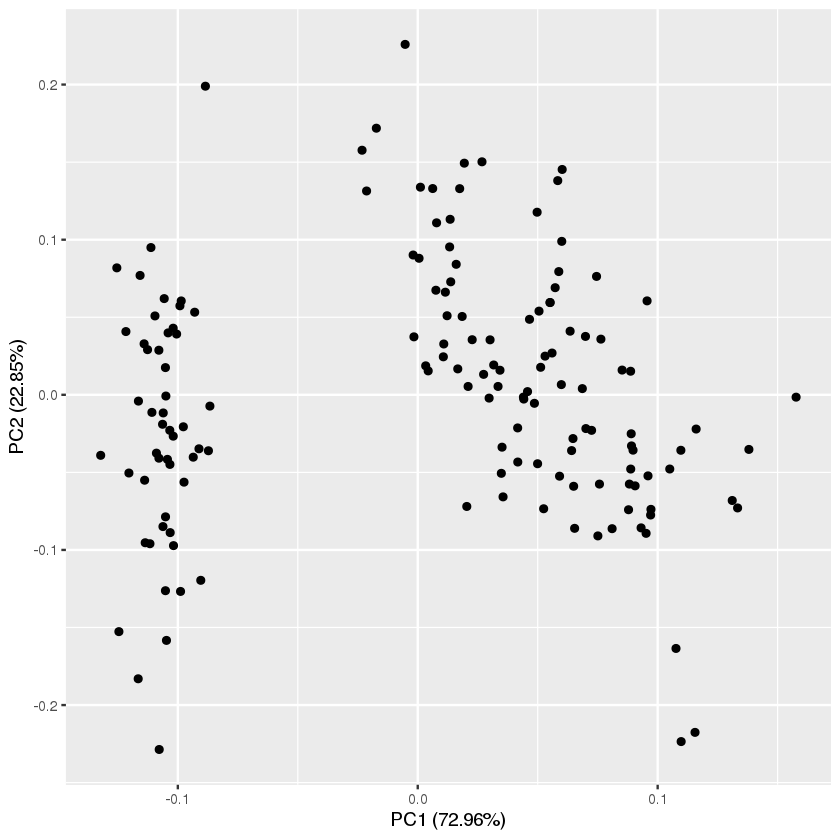

In [29]:
library(ggfortify)
df <- iris[1:4]
pca_res <- prcomp(df, scale. = TRUE)

autoplot(pca_res)

In [31]:
pca_res <- prcomp(df, scale. = TRUE)

In [32]:
pca_res

Standard deviations (1, .., p=4):
[1] 1.7083611 0.9560494 0.3830886 0.1439265

Rotation (n x k) = (4 x 4):
                    PC1         PC2        PC3        PC4
Sepal.Length  0.5210659 -0.37741762  0.7195664  0.2612863
Sepal.Width  -0.2693474 -0.92329566 -0.2443818 -0.1235096
Petal.Length  0.5804131 -0.02449161 -0.1421264 -0.8014492
Petal.Width   0.5648565 -0.06694199 -0.6342727  0.5235971

In [17]:
combinedDF<- cbind(genome_regen_fractions[genome_regen_fractions$gene %in% genome_wound_fractions$gene,], genome_wound_fractions[genome_wound_fractions$gene %in% genome_regen_fractions$gene,])

In [18]:
head(combinedDF)

,gene,Fraction_sp_0,Fraction_sp_1,Fraction_sp_less2,Fraction_sp_less3,Fraction_sp_less4,gene,Fraction_sp_0,Fraction_sp_1,Fraction_sp_less2,Fraction_sp_less3,Fraction_sp_less4
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,A1BG,0,0.00000000,0.00000000,0.072527473,0.76483516,A1BG,0,0.00000000,0.00000000,0.08207343,0.79049676
2,ANXA7,0,0.01098901,0.01098901,0.369230769,0.94285714,ANXA7,0,0.01079914,0.01079914,0.35421166,0.96760259
3,CDKN1A,0,0.04395604,0.04395604,0.663736264,0.98021978,CDKN1A,0,0.04535637,0.04535637,0.68466523,0.99568035
4,CRISP3,0,0.00000000,0.00000000,0.000000000,0.07252747,CRISP3,0,0.00000000,0.00000000,0.00000000,0.08207343
5,TK1,0,0.02417582,0.02417582,0.556043956,0.97362637,TK1,0,0.02807775,0.02807775,0.60475162,0.98488121
6,A1CF,0,0.00000000,0.00000000,0.006593407,0.50549451,A1CF,0,0.00000000,0.00000000,0.01079914,0.53779698


Loading required package: ggplot2



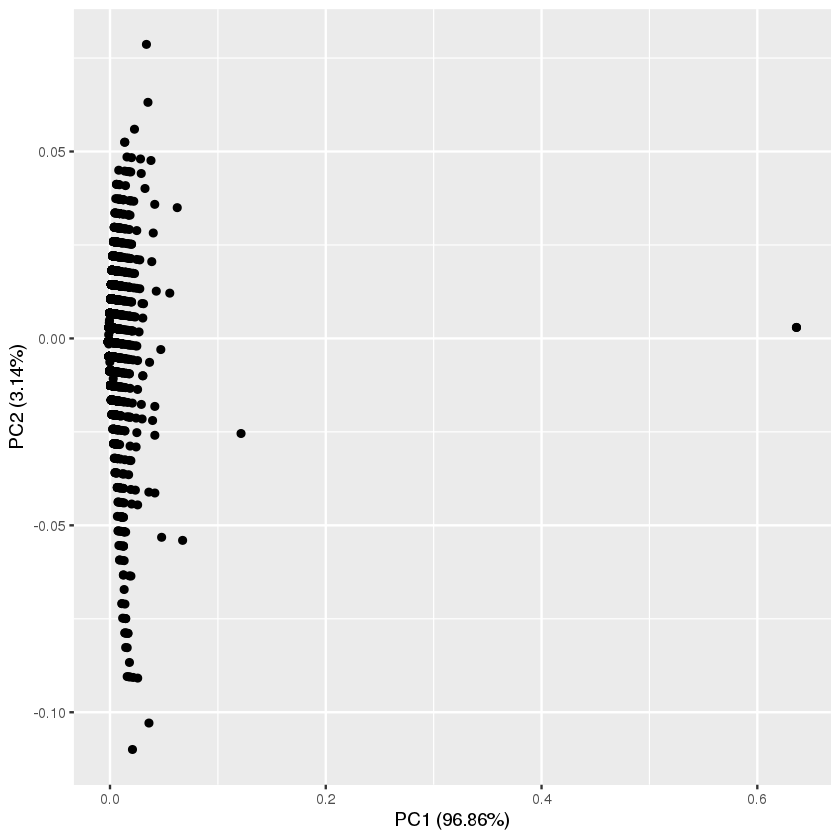

In [19]:
library(ggfortify)
scale2 <- combinedDF[,c(4,10,16)]
pca_res <- prcomp(scale2, scale. = TRUE)
autoplot(pca_res)

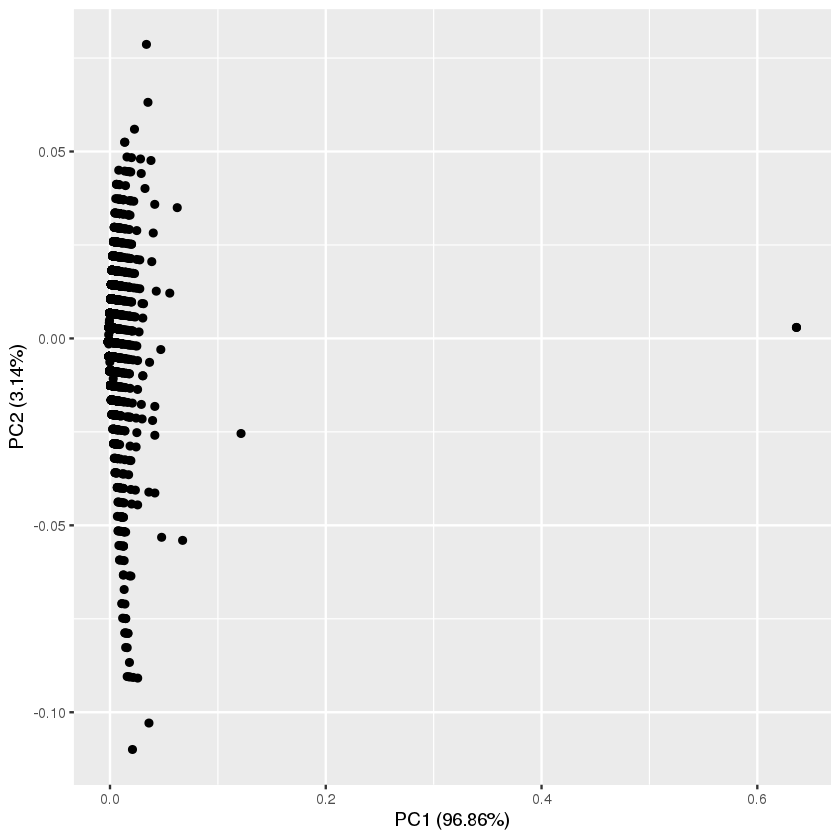

In [20]:
scale3 <- combinedDF[,c(5,11,17)]
pca_res <- prcomp(scale2, scale. = TRUE)
autoplot(pca_res)

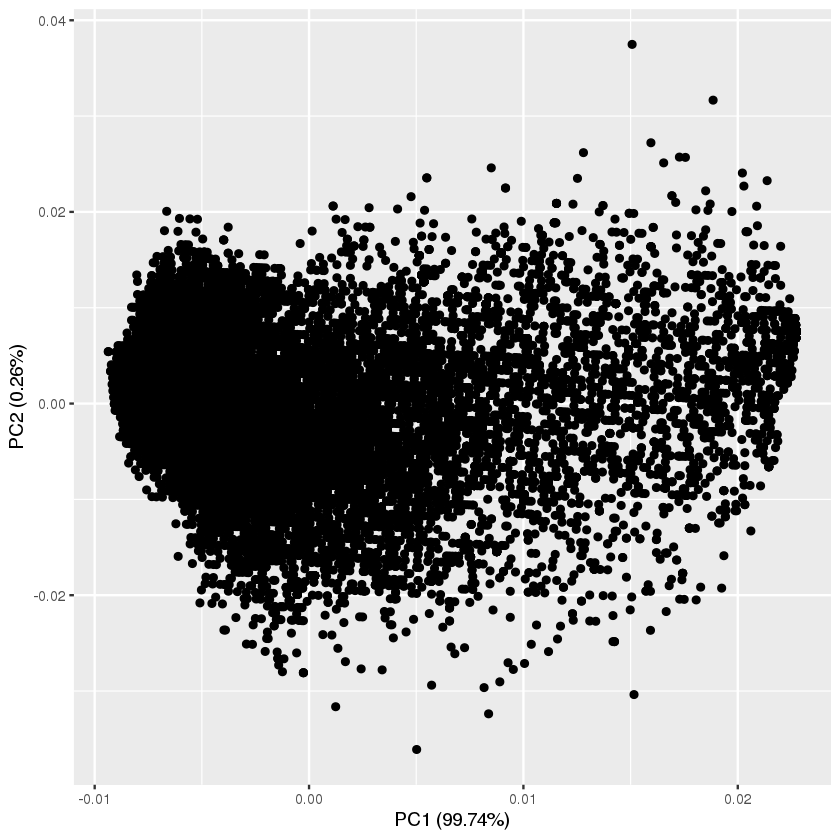

In [21]:
scale2 <- combinedDF[,c(6,12,18)]
pca_res <- prcomp(scale2, scale. = TRUE)
autoplot(pca_res)